# Medical Representative

Medical representatives are the key point of contact between

pharmaceutical and medical companies and healthcare professionals.

A medical representative's job is to promote and sell their company's

products, whether that's pharmaceutical drugs or medical equipment.

Customers can include doctors, nurses and pharmacists. The medical

representative will increase product awareness, answer queries,

company.



The job of medical representative has a lot of challenges but the most

important one is how the medical representative convinces a doctor to write a

drug from the medical company which he works for in his prescription where

there are many competitors' drugs that have the same active ingredient from

other companies.

The goal is to know if a doctor with some

specific features will write or not one of 6 drugs for a medical

company that has license to produce several types of local produced

drugs with the same active ingredients of multinational original drugs.

# Import Libraries

In [1]:
import numpy as np

import pandas as pd

from IPython.display import display

import seaborn as sns

import matplotlib.pyplot as plt

## Exploring the Data

In this part i'm going to explore the data and all the features.



### Datasets and Inputs

The dataset was collected by me in a year from private clinics,

hospitals and pharmacies

All data are public data that was collected from doctors and

pharmacists about 6 drugs produced by a certain medical company.


## Featureset Exploration

### Input Data fields (Features and Labels)

The input data consists of 390 samples collected from 253 doctors.

This data will be used for training and validation test in a data base file

named med attached with the project proposal.

the data in database called med and splited in two tables connected by the id column.

#### table 1 : medicine_table

* **id_m:** row id for every medicine

* **medicine:** The commercial name of the medicine that I refer to it as type1 to type6.

* **Price:** price for every drug of these 6 drugs for patient.



#### table 2 : doctor_table

* **id_dr:** row id for every doctor

* **exam_price:** examination price that the doctor takes from the patient.

* **clinic_hos:** classification if this doctor has a private 'clinic' or works in a 'hospital'.

* **dr_class:** doctor class was classified according to number of patients for every doctor and how much is this doctor famous and it was classified to 'a' and 'b'.



**where:**



* **class a:** are doctors with high patient rate

* **class b:** are doctors with medium patient rate

* **area:** every medical representative cover some areas in a city where the medical representative has to make a lot of visits for alot of doctors in different places and I refer to each area with the name (area1 to area8)with total 8 areas that I have covered to make my prospection.

* **specialty:** the specialty of the doctor is one of the most important features because it will determine which of the 6 drugs will be suitable for this doctor to write it in his prescription. 



**These specialties are:**

* **Chest:** chest specialist

* **Im:** internal medicine specialist

* **Cd:** cardiology specialist

* **Neuro:** neurology specialist

* **Git:** gastrointestinal tract specialist

* **Ent:** ear, nose and throat specialist

* **Sur:** surgery specialist

* **Uro:** urology specialist

* **Gp:** general practitioner

* **Or:** orthopedic specialist

* **Vas:** vascular specialst



**With total 11 specialties.**



* **Target (label):** just one target to classify if this doctor write any of these drugs in prescription to his patients or not. With (1) if the doctor writes the drug in his prescription and (0)if not.

In [2]:
data = pd.read_csv("/kaggle/input/medical2/med.csv")

# Data Exploration (EDA)

In [3]:
data.head(10)

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
0,type1,45,area1,chest,a,200,clinic,1
1,type4,36,area2,im,b,100,clinic,1
2,type1,45,area8,chest,a,75,hospital,1
3,type1,45,area5,chest,a,30,hospital,1
4,type5,29,area6,uro,a,220,clinic,0
5,type5,29,area8,im,b,140,clinic,1
6,type6,20,area2,im,b,70,hospital,1
7,type4,36,area8,chest,a,75,hospital,0
8,type2,30,area3,cd,b,150,clinic,1
9,type2,30,area1,neuro,b,150,clinic,1


In [4]:
data.sample(5)

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
204,type1,45,area4,or,b,170,clinic,1
67,type1,45,area2,git,a,70,hospital,0
217,type4,36,area6,im,a,250,clinic,0
191,type5,29,area2,sur,a,50,hospital,1
382,type1,45,area2,im,b,70,hospital,1


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 390 entries, 0 to 389
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   medicine    390 non-null    object
 1   price       390 non-null    int64 
 2   area        390 non-null    object
 3   speciality  390 non-null    object
 4   dr_class    390 non-null    object
 5   exam_price  390 non-null    int64 
 6   clinic_hos  390 non-null    object
 7   write       390 non-null    int64 
dtypes: int64(3), object(5)
memory usage: 24.5+ KB


In [6]:
data.describe()

,price,exam_price,write
count,390.000000,390.000000,390.000000
mean,35.715385,121.205128,0.587179
std,8.751263,86.729844,0.492974
min,20.000000,30.000000,0.000000
25%,29.000000,50.000000,0.000000
50%,36.000000,80.000000,1.000000
75%,45.000000,170.000000,1.000000
max,45.000000,350.000000,1.000000


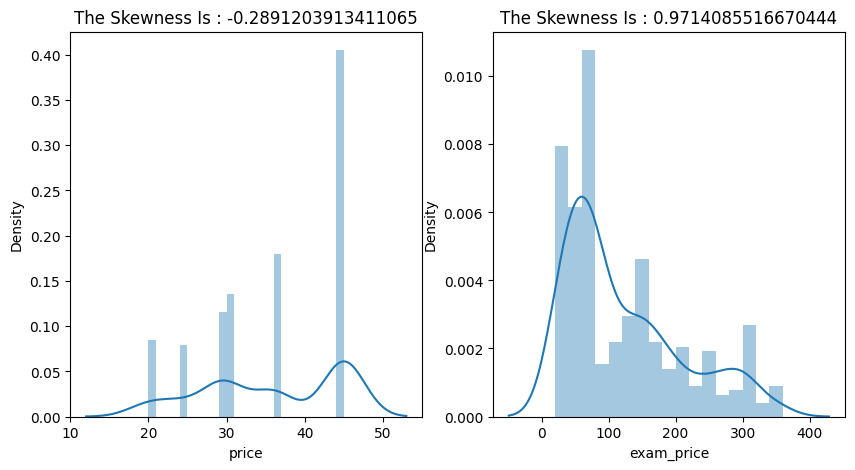

In [7]:
import warnings

warnings.filterwarnings("ignore")



plt.figure(figsize = [10 , 5])



plt.subplot(1 , 2 , 1)

bins = np.arange(20 , data["price"].max() + 1 , 1)

sns.distplot(data["price"] , bins = bins)

skew = data["price"].skew()

plt.title("The Skewness Is : " + str(skew));



plt.subplot(1 , 2 , 2)

bins = np.arange(20 , data["exam_price"].max() + 20  , 20)

sns.distplot(data["exam_price"] , bins = bins)

skew = data["exam_price"].skew()

plt.title("The Skewness Is : " + str(skew));

In [8]:
data.corr(numeric_only = True)

,price,exam_price,write
price,1.000000,-0.037752,-0.015387
exam_price,-0.037752,1.000000,-0.312110
write,-0.015387,-0.312110,1.000000


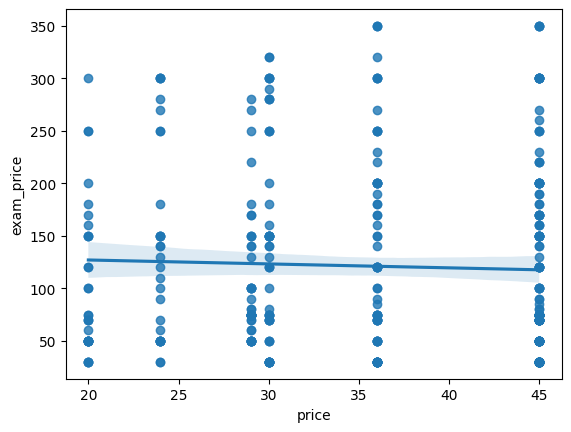

In [9]:
sns.regplot(x = data["price"] , y = data["exam_price"]);

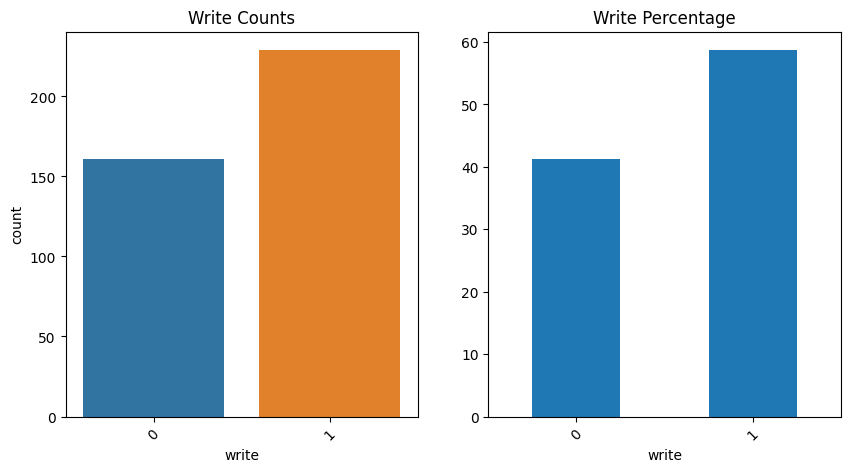

In [10]:
plt.figure(figsize = [10 , 5])



plt.subplot(1 , 2 , 1)

sns.countplot(data = data , x = "write");

plt.title("Write Counts")

plt.xticks(rotation = 45);



plt.subplot(1 , 2 , 2)

write_per = data["write"].value_counts().sort_values(ascending = True) / data.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Write Percentage")

plt.xticks(rotation = 45);

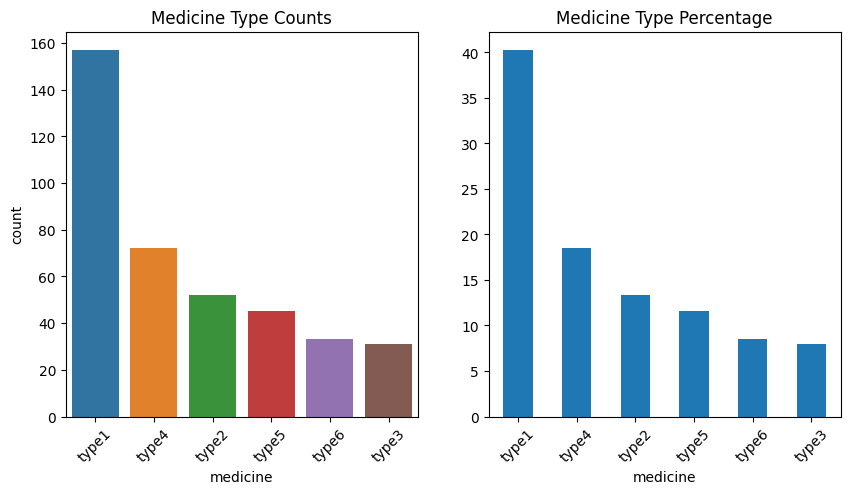

In [11]:
plt.figure(figsize = [10 , 5])



plt.subplot(1 , 2 , 1)

order = data["medicine"].value_counts().sort_values(ascending = False).index

sns.countplot(data = data , x = "medicine" , order = order)

plt.title("Medicine Type Counts")

plt.xticks(rotation = 45);



plt.subplot(1 , 2 , 2)

write_per = data["medicine"].value_counts().sort_values(ascending = False) / data.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Medicine Type Percentage")

plt.xticks(rotation = 45);

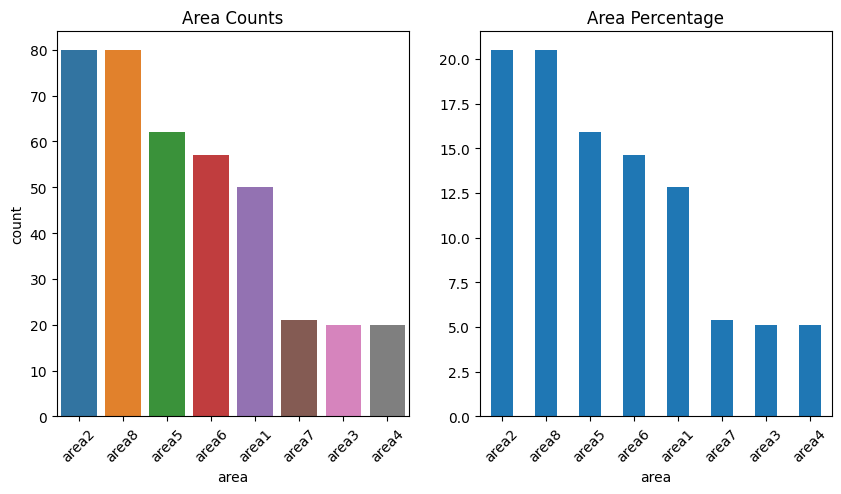

In [12]:
plt.figure(figsize = [10 , 5])



plt.subplot(1 , 2 , 1)

order = data["area"].value_counts().sort_values(ascending = False).index

sns.countplot(data = data , x = "area" , order = order)

plt.title("Area Counts")

plt.xticks(rotation = 45);



plt.subplot(1 , 2 , 2)

write_per = data["area"].value_counts().sort_values(ascending = False) / data.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Area Percentage")

plt.xticks(rotation = 45);

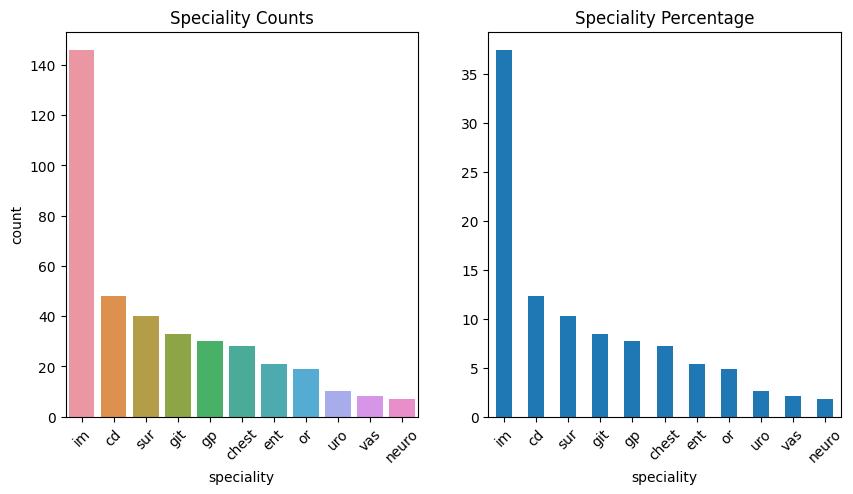

In [13]:
plt.figure(figsize = [10 , 5])



plt.subplot(1 , 2 , 1)

order = data["speciality"].value_counts().sort_values(ascending = False).index

sns.countplot(data = data , x = "speciality" , order = order)

plt.title("Speciality Counts")

plt.xticks(rotation = 45);



plt.subplot(1 , 2 , 2)

write_per = data["speciality"].value_counts().sort_values(ascending = False) / data.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Speciality Percentage")

plt.xticks(rotation = 45);

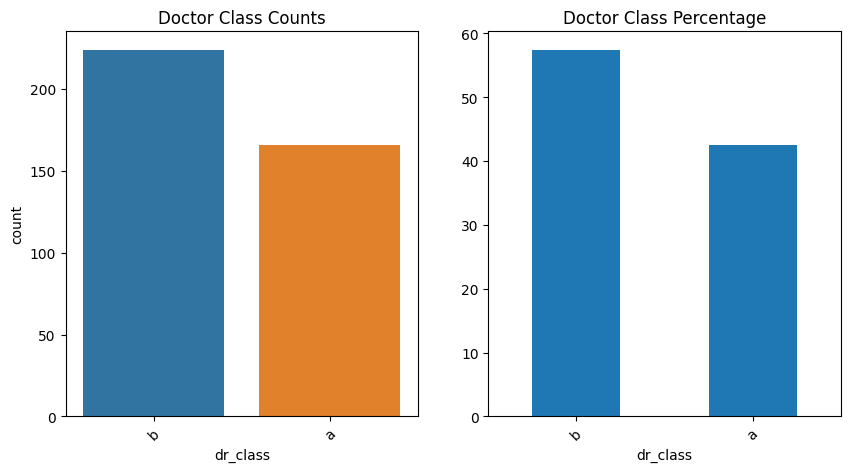

In [14]:
plt.figure(figsize = [10 , 5])



plt.subplot(1 , 2 , 1)

order = data["dr_class"].value_counts().sort_values(ascending = False).index

sns.countplot(data = data , x = "dr_class" , order = order)

plt.title("Doctor Class Counts")

plt.xticks(rotation = 45);



plt.subplot(1 , 2 , 2)

write_per = data["dr_class"].value_counts().sort_values(ascending = False) / data.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Doctor Class Percentage")

plt.xticks(rotation = 45);

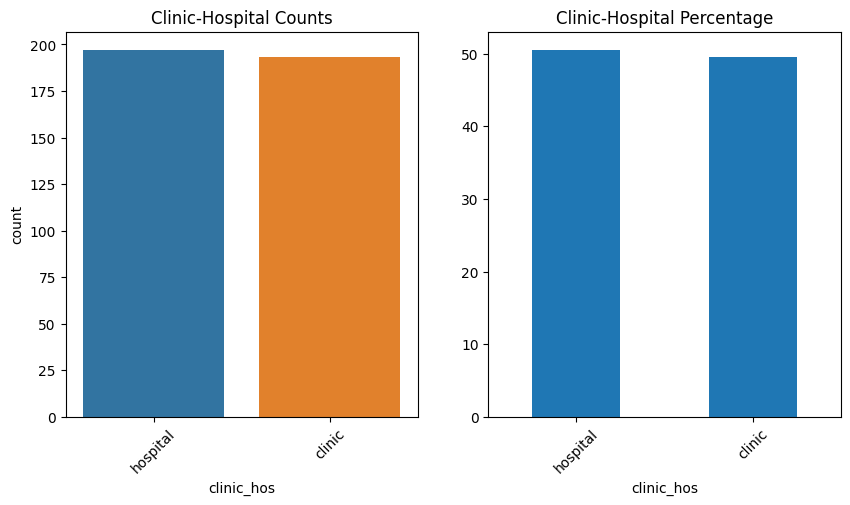

In [15]:
plt.figure(figsize = [10 , 5])



plt.subplot(1 , 2 , 1)

order = data["clinic_hos"].value_counts().sort_values(ascending = False).index

sns.countplot(data = data , x = "clinic_hos" , order = order)

plt.title("Clinic-Hospital Counts")

plt.xticks(rotation = 45);



plt.subplot(1 , 2 , 2)

write_per = data["clinic_hos"].value_counts().sort_values(ascending = False) / data.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Clinic-Hospital Percentage")

plt.xticks(rotation = 45);

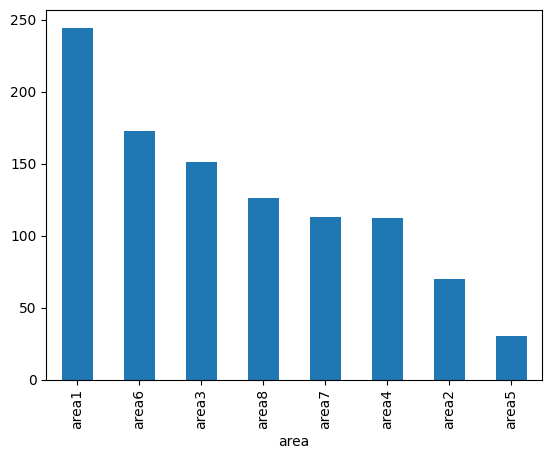

In [16]:
exam_avg = data.groupby(data["area"])["exam_price"].mean().sort_values(ascending = False)

exam_avg.plot(kind = "bar");

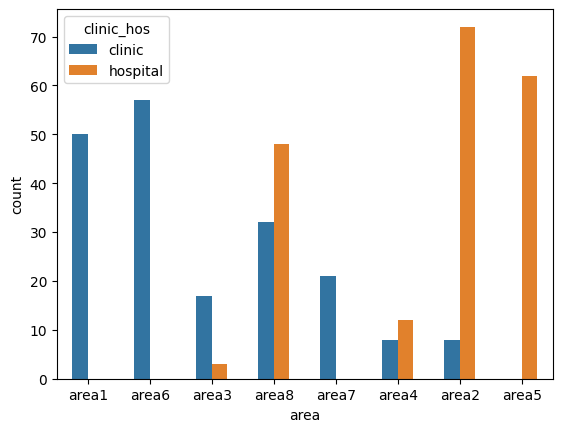

In [17]:
order = data.groupby(data["area"])["exam_price"].mean().sort_values(ascending = False).index

sns.countplot(data = data , x = "area" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

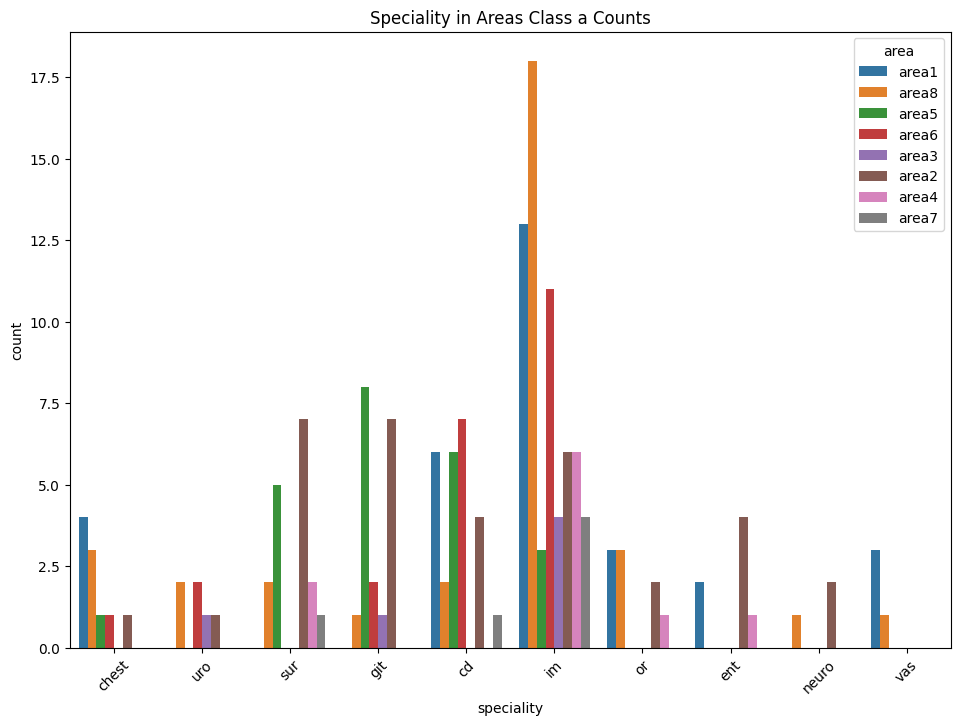

In [18]:
plt.figure(figsize = [25 , 8])



order = list(data["area"].unique())

order = sorted(order)



plt.subplot(1 , 2 , 1)

data_a = data[data["dr_class"] == "a"]

sns.countplot(data = data_a , x = "speciality" , hue = "area")

plt.title("Speciality in Areas Class a Counts")

plt.xticks(rotation = 45);

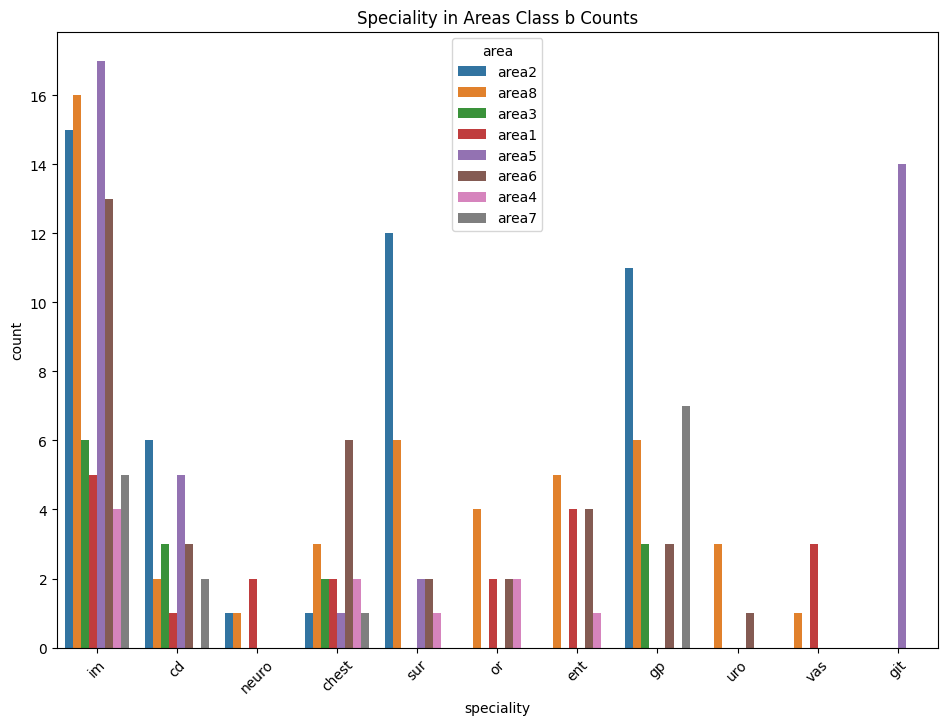

In [19]:
plt.figure(figsize = [25 , 8])



plt.subplot(1 , 2 , 1)

data_b = data[data["dr_class"] == "b"]

sns.countplot(data = data_b , x = "speciality" , hue = "area")

plt.title("Speciality in Areas Class b Counts")

plt.xticks(rotation = 45);

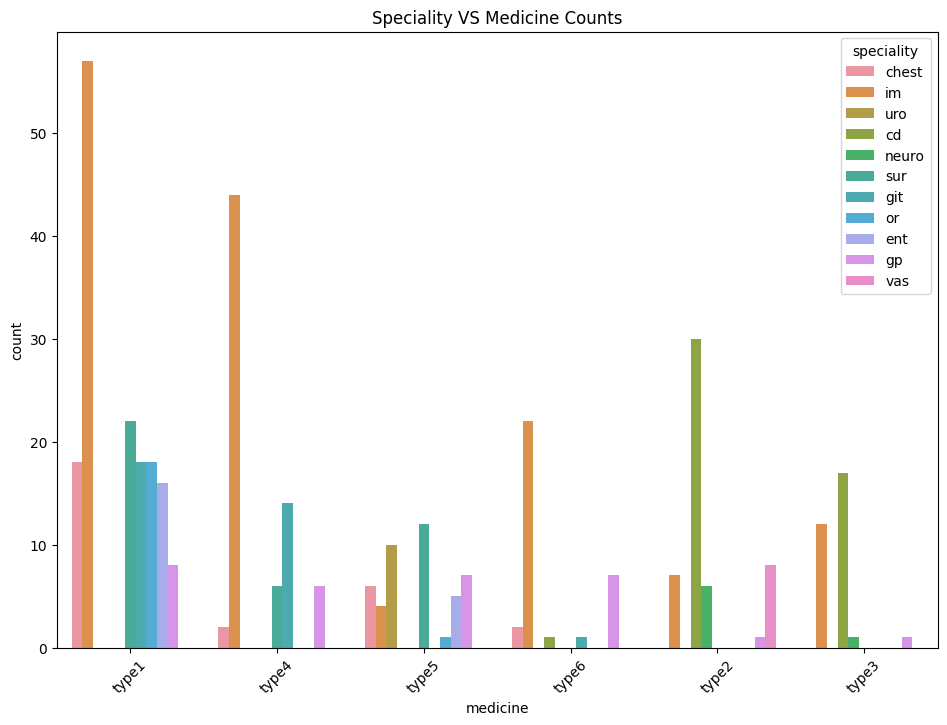

In [20]:
plt.figure(figsize = [25 , 8])



plt.subplot(1 , 2 , 1)

sns.countplot(data = data , x = "medicine" , hue = "speciality")

plt.title("Speciality VS Medicine Counts")

plt.xticks(rotation = 45);

# Data Cleaning And Preprocessing

In [21]:
data.head()

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
0,type1,45,area1,chest,a,200,clinic,1
1,type4,36,area2,im,b,100,clinic,1
2,type1,45,area8,chest,a,75,hospital,1
3,type1,45,area5,chest,a,30,hospital,1
4,type5,29,area6,uro,a,220,clinic,0


## Check For Nulls

In [22]:
data.isnull().sum()

medicine      0
price         0
area          0
speciality    0
dr_class      0
exam_price    0
clinic_hos    0
write         0
dtype: int64

# Data Analysis

In [23]:
data.head(20)

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
0,type1,45,area1,chest,a,200,clinic,1
1,type4,36,area2,im,b,100,clinic,1
2,type1,45,area8,chest,a,75,hospital,1
3,type1,45,area5,chest,a,30,hospital,1
4,type5,29,area6,uro,a,220,clinic,0
5,type5,29,area8,im,b,140,clinic,1
6,type6,20,area2,im,b,70,hospital,1
7,type4,36,area8,chest,a,75,hospital,0
8,type2,30,area3,cd,b,150,clinic,1
9,type2,30,area1,neuro,b,150,clinic,1


# Chest Doctors

### Class a , Chest speciality and Area 1 Doctors 

In [24]:
med = data["medicine"].unique()

pri = data["price"].unique()



print(med)

print(pri)

['type1' 'type4' 'type5' 'type6' 'type2' 'type3']
[45 36 29 20 30 24]


In [25]:
dic = {}

for i in range(len(med)):

    dic[med[i]] = pri[i]

dic

{'type1': 45, 'type4': 36, 'type5': 29, 'type6': 20, 'type2': 30, 'type3': 24}

In [26]:
a_ch_1 = data[(data["dr_class"] == "a") & (data["speciality"] == "chest") & (data["area"] == "area1")] 



a_ch_1["medicine"].value_counts()

medicine
type1    4
Name: count, dtype: int64

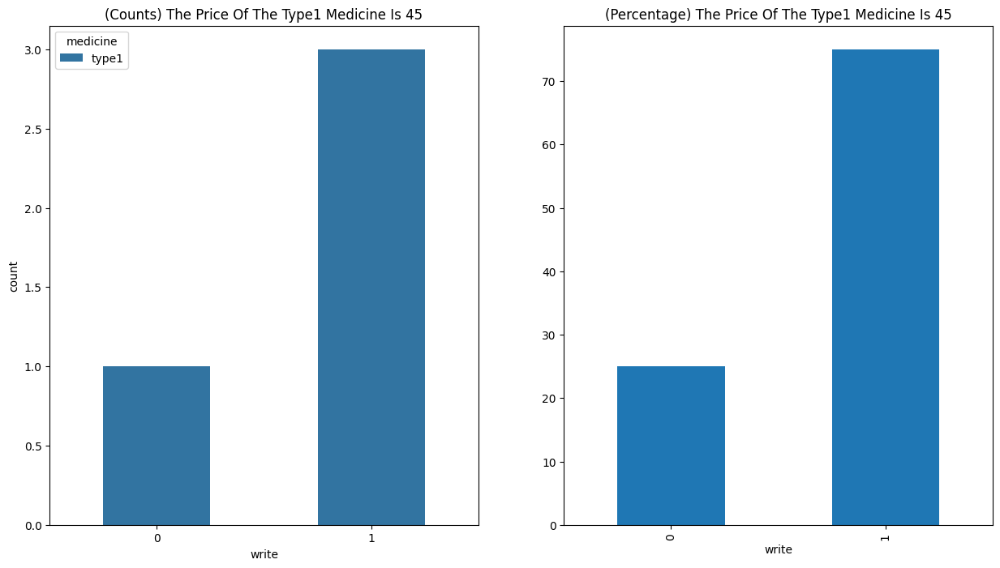

In [27]:
plt.figure(figsize = [15 , 8])



plt.subplot(1 , 2 , 1)

sns.countplot(data = a_ch_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)

plt.title("(Counts) The Price Of The Type1 Medicine Is " + str(dic["type1"]));



plt.subplot(1 , 2 , 2)

write = a_ch_1["write"].value_counts().sort_values(ascending = True) / a_ch_1.shape[0] * 100

write.plot(kind = "bar")

plt.title("(Percentage) The Price Of The Type1 Medicine Is " + str(dic["type1"]));

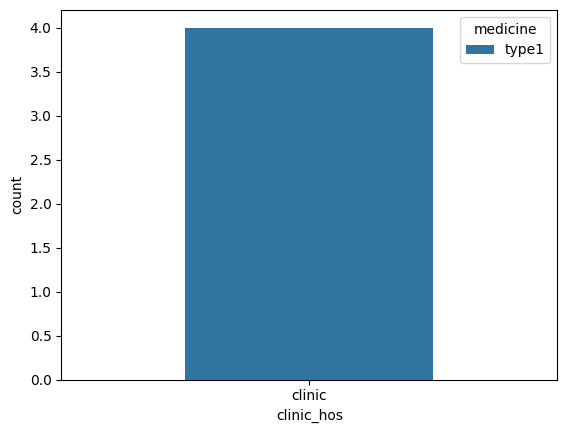

In [28]:
sns.countplot(data = a_ch_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

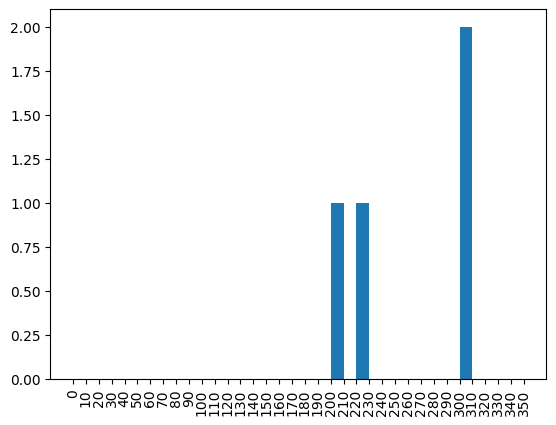

In [29]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = a_ch_1 , x = "exam_price" , bins = bins)

plt.xticks(bins , rotation = 90);

### Class b , Chest speciality and Area 1 Doctors 

In [30]:
b_ch_1 = data[(data["dr_class"] == "b") & (data["speciality"] == "chest") & (data["area"] == "area1")] 



b_ch_1["medicine"].value_counts()

medicine
type5    1
type1    1
Name: count, dtype: int64

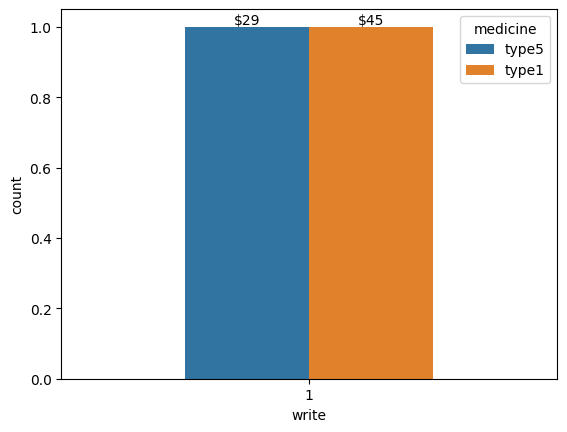

In [31]:
ax = sns.countplot(data = b_ch_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_ch_1['medicine'].unique()



for i, p in enumerate(ax.patches):

    # Get the x and y positions of the bar

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    

    price = dic.get(hue_category, "N/A")  # Use a default if not found

    

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show()

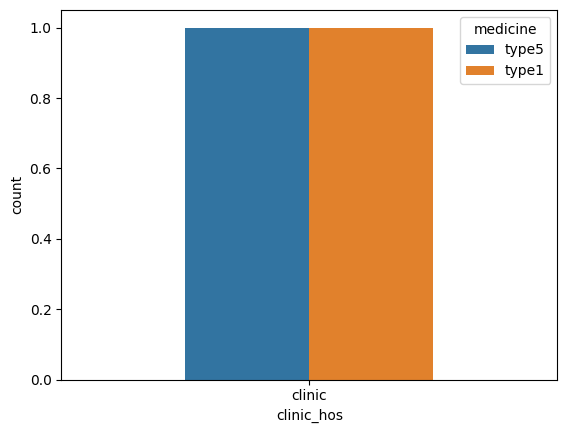

In [32]:
sns.countplot(data = b_ch_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

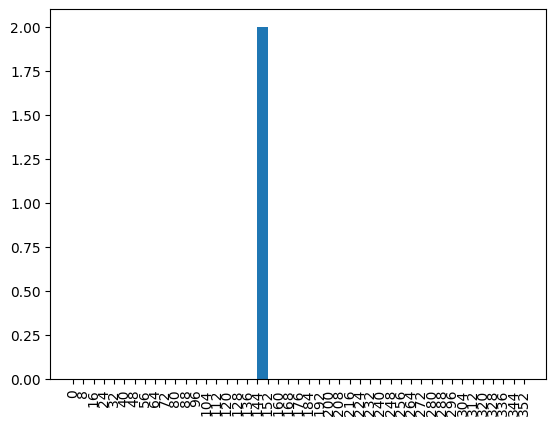

In [33]:
bins = np.arange(0 , data["exam_price"].max() + 8 , 8)

plt.hist(data = b_ch_1 , x = "exam_price" , bins = bins)

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 1

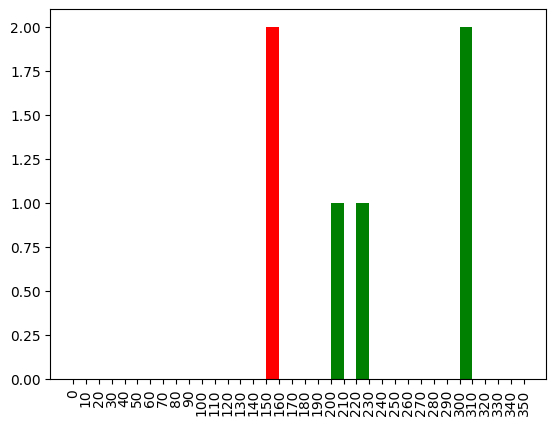

In [34]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_ch_1 , x = "exam_price" , bins = bins , color = "red")

plt.hist(data = a_ch_1 , x = "exam_price" , bins = bins , color = "green")

plt.xticks(bins , rotation = 90);

### Class a , Chest speciality and Area 2 Doctors 

In [35]:
a_ch_2 = data[(data["dr_class"] == "a") & (data["speciality"] == "chest") & (data["area"] == "area2")] 



a_ch_2["medicine"].value_counts()

medicine
type1    1
Name: count, dtype: int64

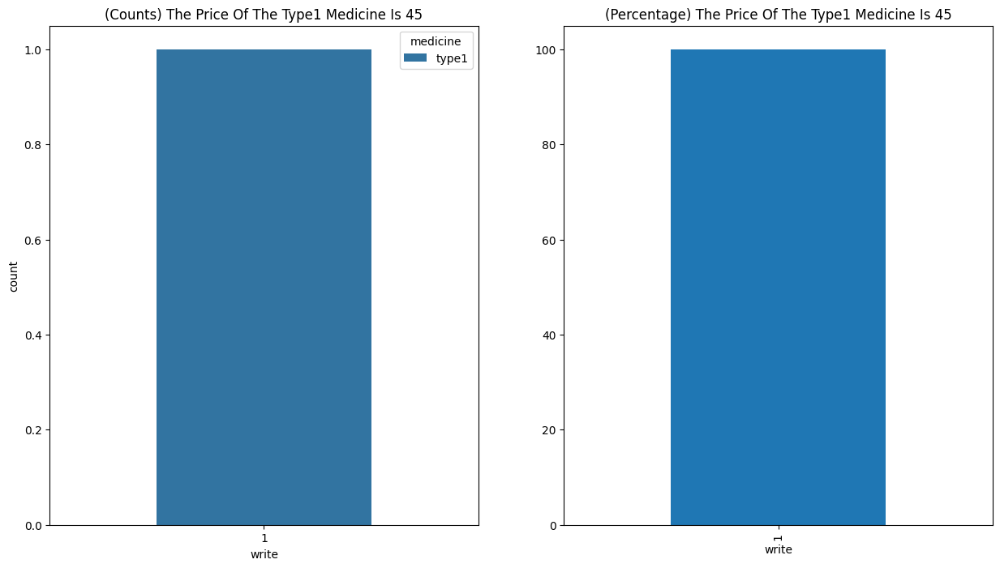

In [36]:
plt.figure(figsize = [15 , 8])



plt.subplot(1 , 2 , 1)

sns.countplot(data = a_ch_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)

plt.title("(Counts) The Price Of The Type1 Medicine Is " + str(dic["type1"]));



plt.subplot(1 , 2 , 2)

write = a_ch_2["write"].value_counts().sort_values(ascending = True) / a_ch_2.shape[0] * 100

write.plot(kind = "bar")

plt.title("(Percentage) The Price Of The Type1 Medicine Is " + str(dic["type1"]));

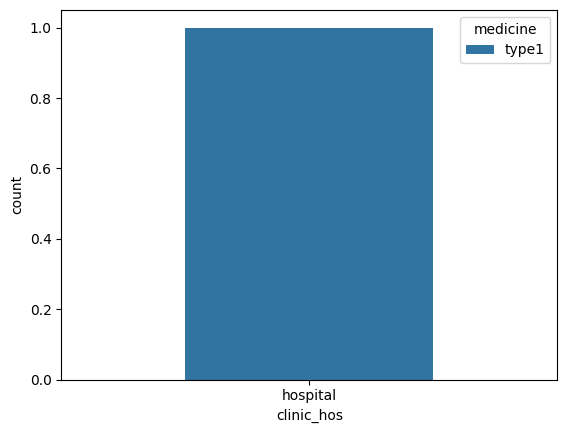

In [37]:
sns.countplot(data = a_ch_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

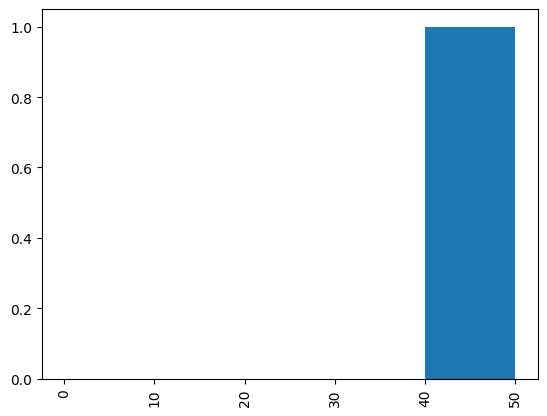

In [38]:
bins = np.arange(0 , a_ch_2["exam_price"].max() + 10 , 10)

plt.hist(data = a_ch_2 , x = "exam_price" , bins = bins)

plt.xticks(bins , rotation = 90);

### Class b , Chest speciality and Area 2 Doctors 

In [39]:
b_ch_2 = data[(data["dr_class"] == "b") & (data["speciality"] == "chest") & (data["area"] == "area2")] 



b_ch_2["medicine"].value_counts()

medicine
type5    1
Name: count, dtype: int64

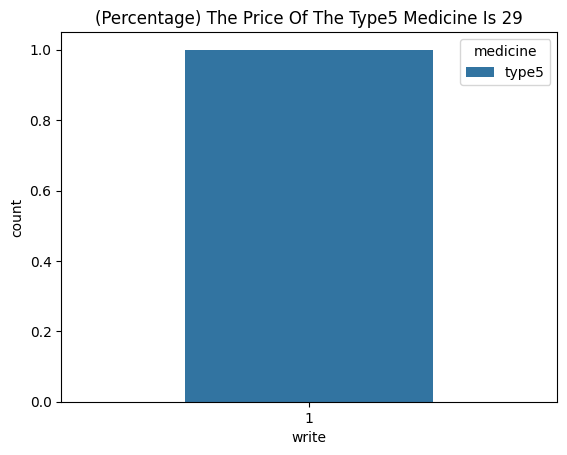

In [40]:
sns.countplot(data = b_ch_2 , x = "write" , hue="medicine" , width=0.5, dodge=True)

plt.title("(Percentage) The Price Of The Type5 Medicine Is " + str(dic["type5"]));

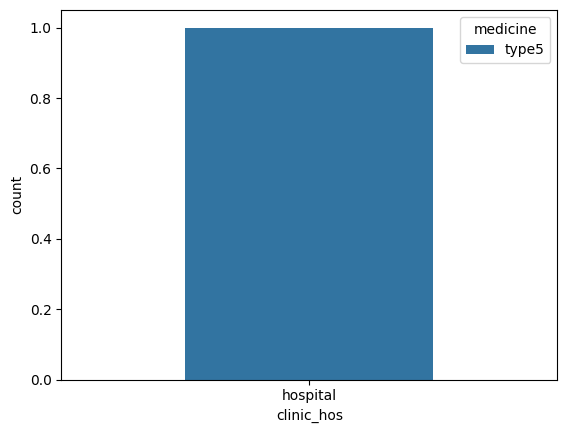

In [41]:
sns.countplot(data = b_ch_2 , x = "clinic_hos" , hue="medicine" , width=0.5, dodge=True);

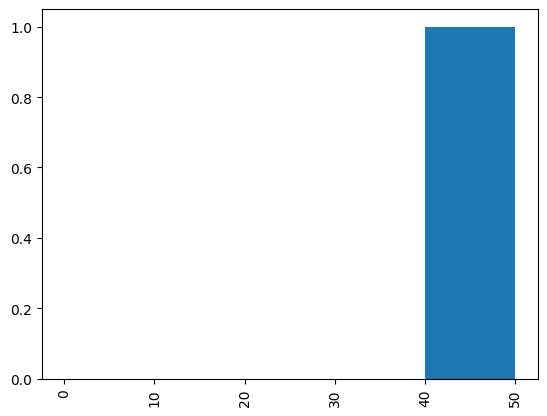

In [42]:
bins = np.arange(0 , b_ch_2["exam_price"].max() + 10 , 10)

plt.hist(data = b_ch_2 , x = "exam_price" , bins = bins)

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 2

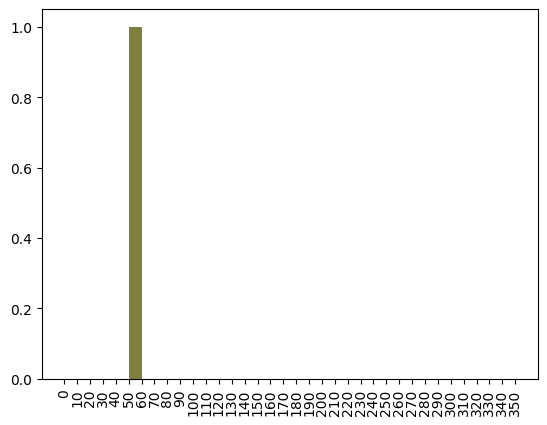

In [43]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_ch_2 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_ch_2 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class b , Chest speciality and Area 3 Doctors 

In [44]:
b_ch_3 = data[(data["dr_class"] == "b") & (data["speciality"] == "chest") & (data["area"] == "area3")] 



b_ch_3["medicine"].value_counts()

medicine
type6    1
type1    1
Name: count, dtype: int64

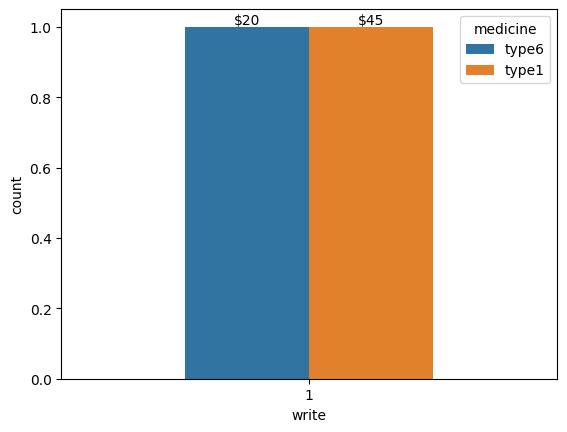

In [45]:
ax = sns.countplot(data = b_ch_3 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_ch_3['medicine'].unique()



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    

    price = dic.get(hue_category, "N/A")  # Use a default if not found

    

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

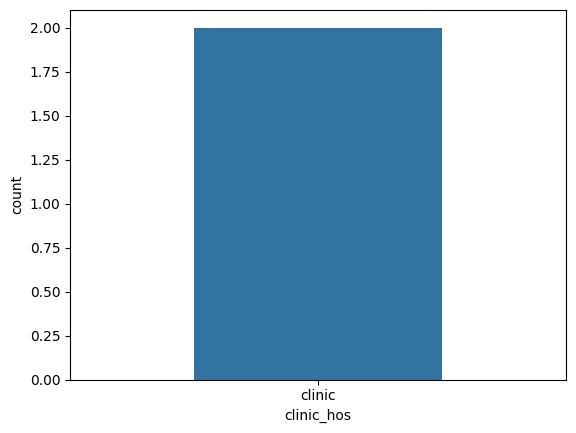

In [46]:
sns.countplot(data = b_ch_3 , x = "clinic_hos" , width=0.5, dodge=True);

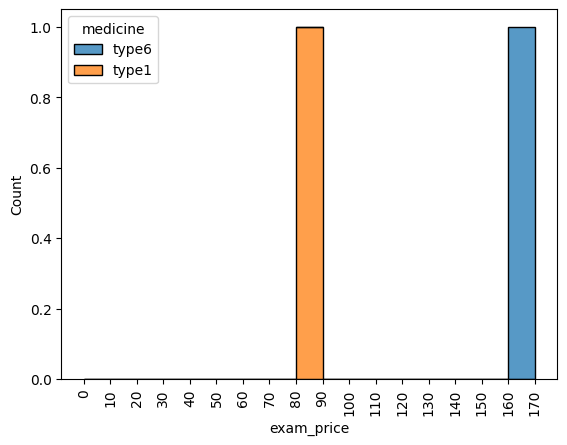

In [47]:
bins = np.arange(0 , b_ch_3["exam_price"].max() + 10 , 10)

sns.histplot(data=b_ch_3, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Chest speciality and Area 4 Doctors 

In [48]:
b_ch_4 = data[(data["dr_class"] == "b") & (data["speciality"] == "chest") & (data["area"] == "area4")] 



b_ch_4["medicine"].value_counts()

medicine
type6    1
type1    1
Name: count, dtype: int64

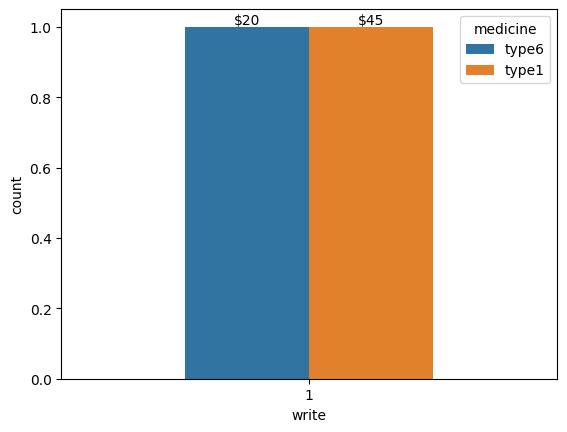

In [49]:
ax = sns.countplot(data = b_ch_4 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_ch_4['medicine'].unique()



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    

    price = dic.get(hue_category, "N/A")  # Use a default if not found

    

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

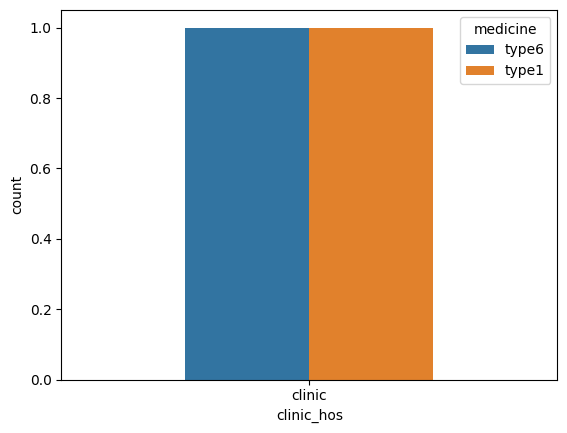

In [50]:
sns.countplot(data = b_ch_4 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

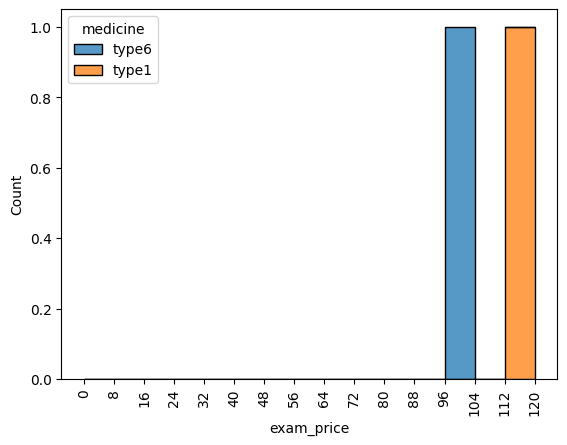

In [51]:
bins = np.arange(0 , b_ch_4["exam_price"].max() + 8 , 8)

sns.histplot(data=b_ch_4, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);plt.xticks(bins , rotation = 90);

### Class a , Chest speciality and Area 5 Doctors 

In [52]:
a_ch_5 = data[(data["dr_class"] == "a") & (data["speciality"] == "chest") & (data["area"] == "area5")] 



a_ch_5["medicine"].value_counts()

medicine
type1    1
Name: count, dtype: int64

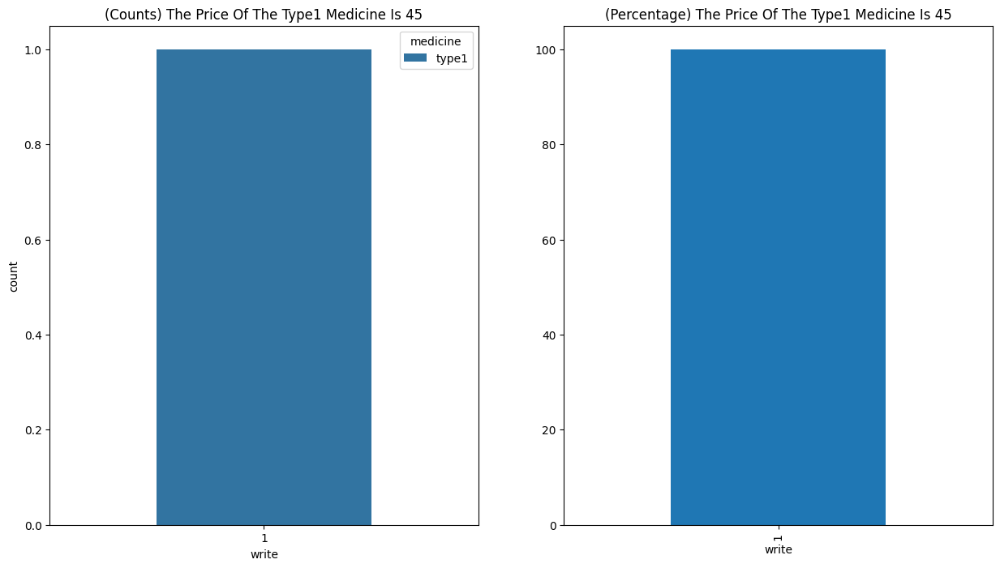

In [53]:
plt.figure(figsize = [15 , 8])



plt.subplot(1 , 2 , 1)

sns.countplot(data = a_ch_5 , x = "write" , hue = "medicine" , width=0.5, dodge=True)

plt.title("(Counts) The Price Of The Type1 Medicine Is " + str(dic["type1"]));



plt.subplot(1 , 2 , 2)

write = a_ch_5["write"].value_counts().sort_values(ascending = True) / a_ch_5.shape[0] * 100

write.plot(kind = "bar")

plt.title("(Percentage) The Price Of The Type1 Medicine Is " + str(dic["type1"]));

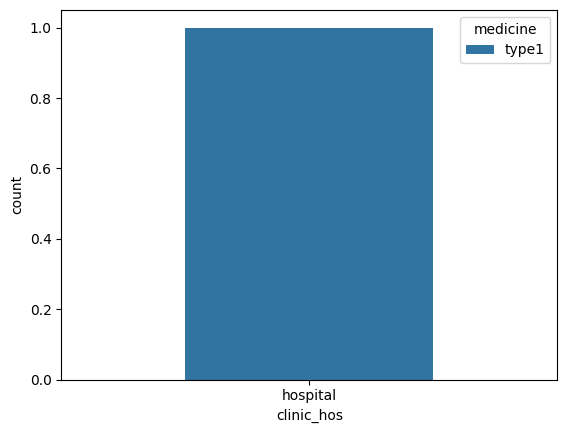

In [54]:
sns.countplot(data = a_ch_5 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

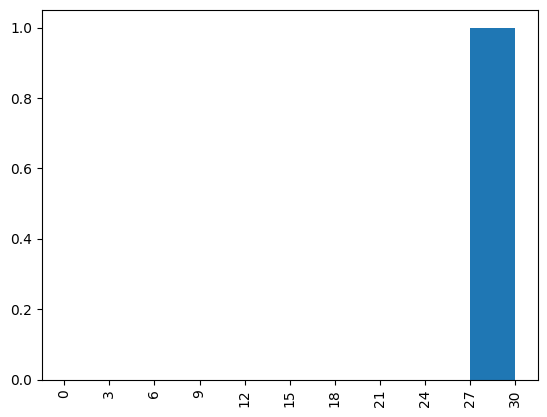

In [55]:
bins = np.arange(0 , a_ch_5["exam_price"].max() + 3 , 3)

plt.hist(data = a_ch_5 , x = "exam_price" , bins = bins)

plt.xticks(bins , rotation = 90);

### Class b , Chest speciality and Area 5 Doctors 

In [56]:
b_ch_5 = data[(data["dr_class"] == "b") & (data["speciality"] == "chest") & (data["area"] == "area5")] 



b_ch_5["medicine"].value_counts()

medicine
type1    1
Name: count, dtype: int64

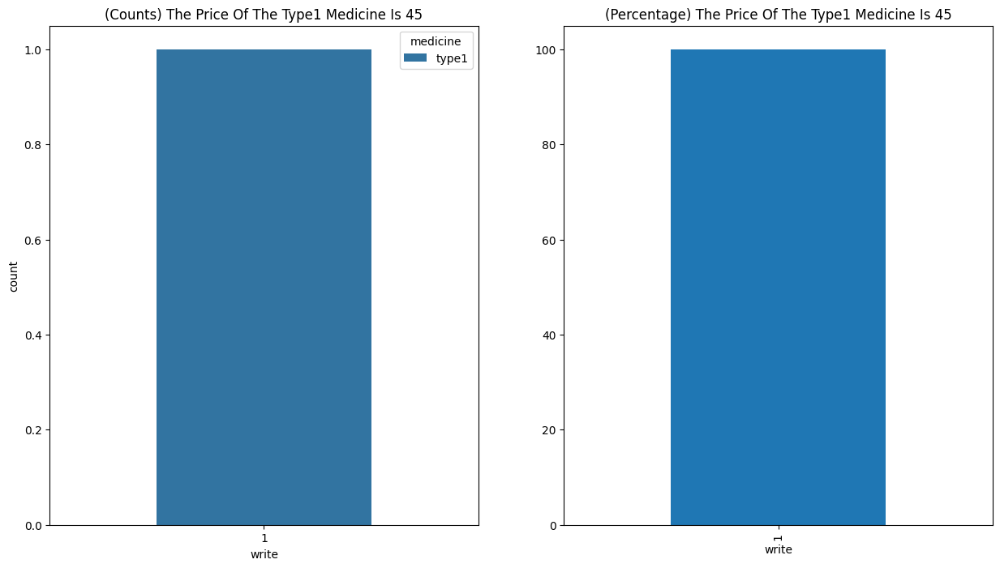

In [57]:
plt.figure(figsize = [15 , 8])



plt.subplot(1 , 2 , 1)

sns.countplot(data = b_ch_5 , x = "write" , hue = "medicine" , width=0.5, dodge=True)

plt.title("(Counts) The Price Of The Type1 Medicine Is " + str(dic["type1"]));



plt.subplot(1 , 2 , 2)

write = b_ch_5["write"].value_counts().sort_values(ascending = True) / b_ch_5.shape[0] * 100

write.plot(kind = "bar")

plt.title("(Percentage) The Price Of The Type1 Medicine Is " + str(dic["type1"]));

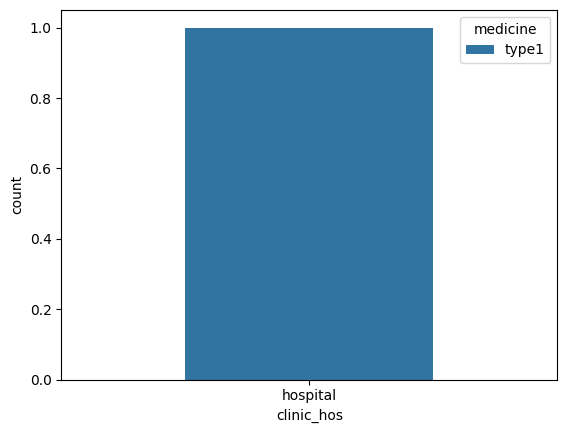

In [58]:
sns.countplot(data = b_ch_5 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

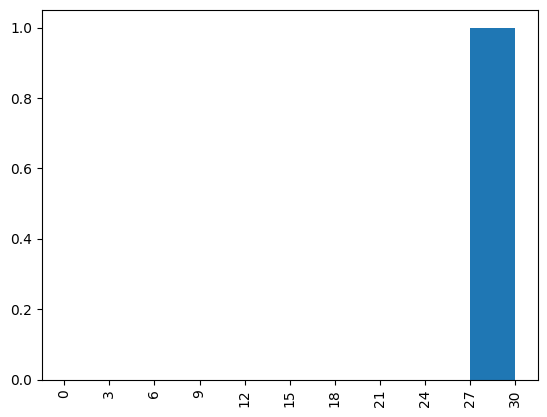

In [59]:
bins = np.arange(0 , b_ch_5["exam_price"].max() + 3 , 3)

plt.hist(data = b_ch_5 , x = "exam_price" , bins = bins)

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 5

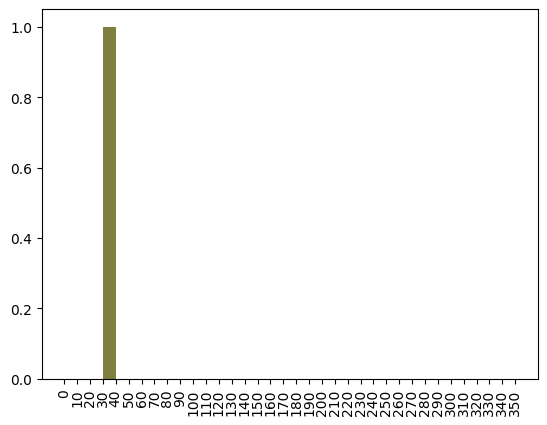

In [60]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_ch_5 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_ch_5 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , Chest speciality and Area 6 Doctors 

In [61]:
a_ch_6 = data[(data["dr_class"] == "a") & (data["speciality"] == "chest") & (data["area"] == "area6")] 



a_ch_6["medicine"].value_counts()

medicine
type1    1
Name: count, dtype: int64

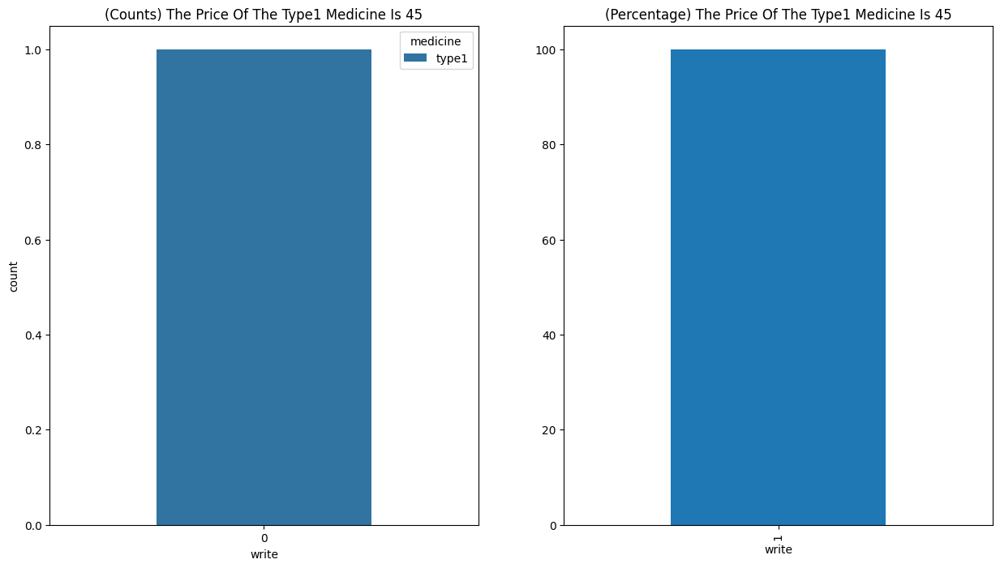

In [62]:
plt.figure(figsize = [15 , 8])



plt.subplot(1 , 2 , 1)

sns.countplot(data = a_ch_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)

plt.title("(Counts) The Price Of The Type1 Medicine Is " + str(dic["type1"]));



plt.subplot(1 , 2 , 2)

write = a_ch_5["write"].value_counts().sort_values(ascending = True) / a_ch_6.shape[0] * 100

write.plot(kind = "bar")

plt.title("(Percentage) The Price Of The Type1 Medicine Is " + str(dic["type1"]));

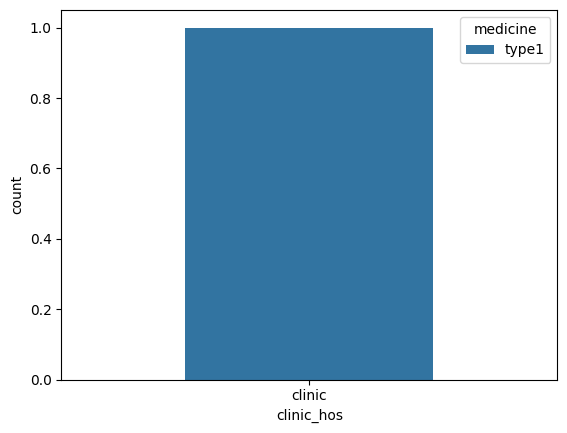

In [63]:
sns.countplot(data = a_ch_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

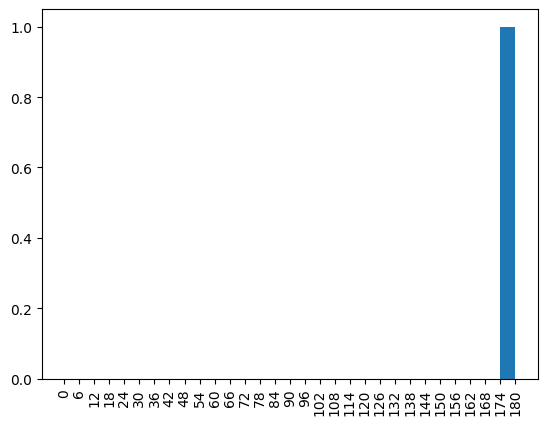

In [64]:
bins = np.arange(0 , a_ch_6["exam_price"].max() + 6 , 6)

plt.hist(data = a_ch_6 , x = "exam_price" , bins = bins)

plt.xticks(bins , rotation = 90);

### Class b , Chest speciality and Area 6 Doctors 

In [65]:
b_ch_6 = data[(data["dr_class"] == "b") & (data["speciality"] == "chest") & (data["area"] == "area6")] 



b_ch_6["medicine"].value_counts()

medicine
type1    3
type5    2
type4    1
Name: count, dtype: int64

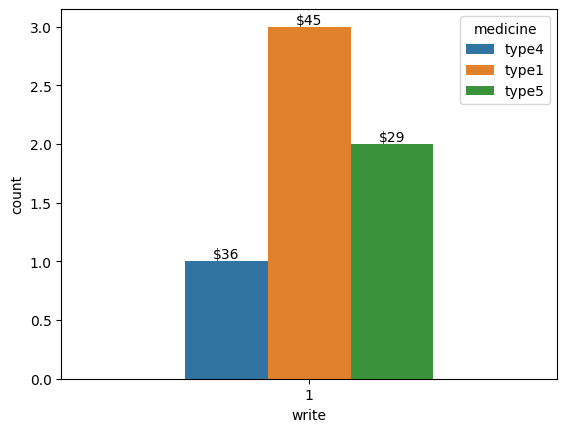

In [66]:
ax = sns.countplot(data = b_ch_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_ch_6['medicine'].unique()



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    

    price = dic.get(hue_category, "N/A")  # Use a default if not found

    

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

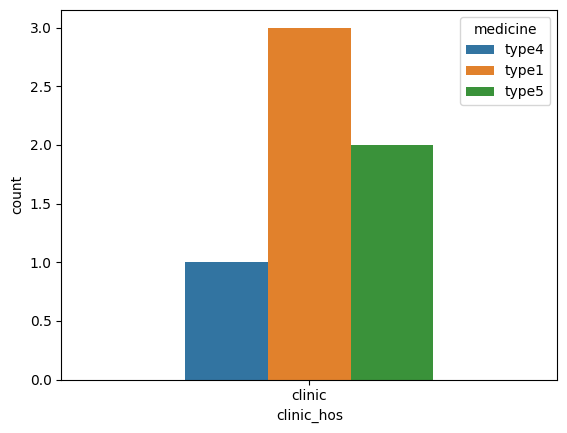

In [67]:
sns.countplot(data = b_ch_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

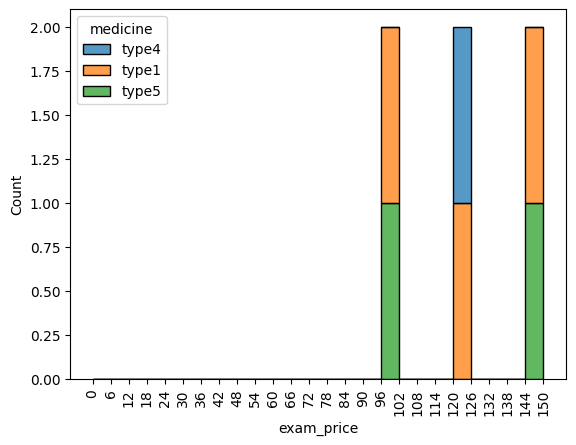

In [68]:
bins = np.arange(0 , b_ch_6["exam_price"].max() + 6 , 6)

sns.histplot(data=b_ch_6, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 5

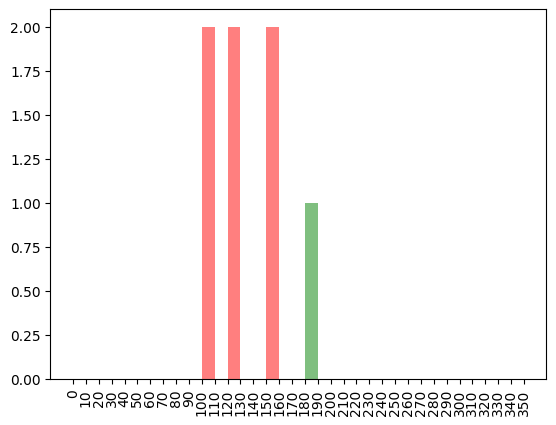

In [69]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_ch_6 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_ch_6 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class b , Chest speciality and Area 7 Doctors 

In [70]:
b_ch_7 = data[(data["dr_class"] == "b") & (data["speciality"] == "chest") & (data["area"] == "area7")] 



b_ch_7["medicine"].value_counts()

medicine
type5    1
Name: count, dtype: int64

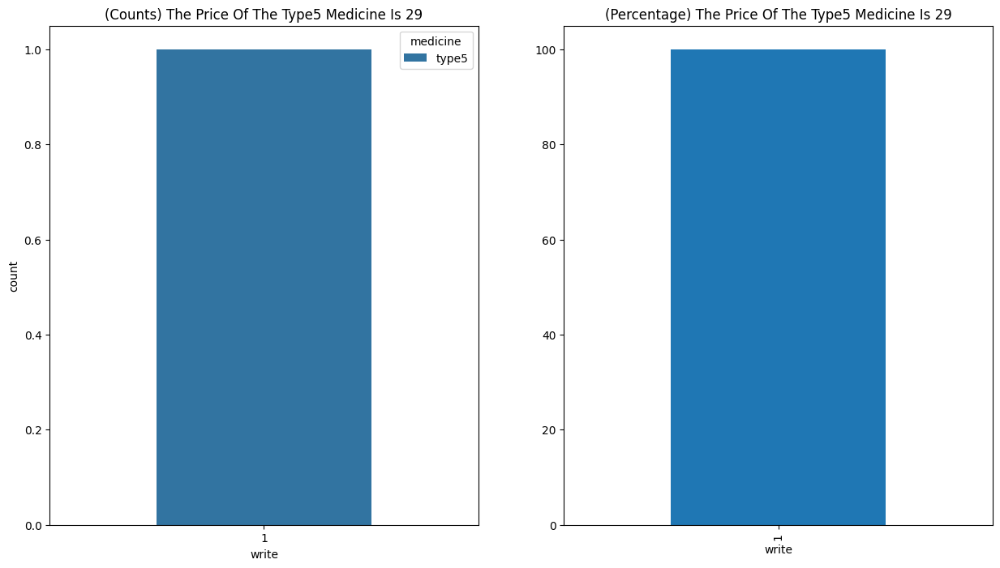

In [71]:
plt.figure(figsize = [15 , 8])



plt.subplot(1 , 2 , 1)

sns.countplot(data = b_ch_7 , x = "write" , hue = "medicine" , width=0.5, dodge=True)

plt.title("(Counts) The Price Of The Type5 Medicine Is " + str(dic["type5"]));



plt.subplot(1 , 2 , 2)

write = b_ch_7["write"].value_counts().sort_values(ascending = True) / b_ch_7.shape[0] * 100

write.plot(kind = "bar")

plt.title("(Percentage) The Price Of The Type5 Medicine Is " + str(dic["type5"]));

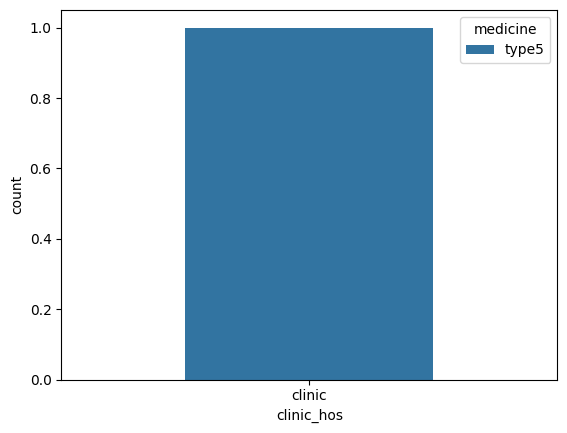

In [72]:
sns.countplot(data = b_ch_7 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

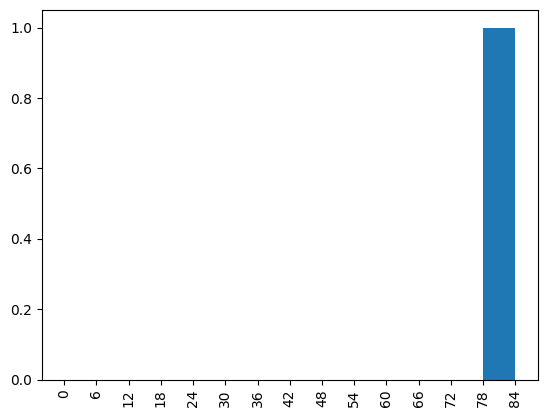

In [73]:
bins = np.arange(0 , b_ch_7["exam_price"].max() + 6 , 6)

plt.hist(data = b_ch_7 , x = "exam_price" , bins = bins)

plt.xticks(bins , rotation = 90);

### Class a , Chest speciality and Area 8 Doctors 

In [74]:
a_ch_8 = data[(data["dr_class"] == "a") & (data["speciality"] == "chest") & (data["area"] == "area8")] 



a_ch_8["medicine"].value_counts()

medicine
type1    2
type4    1
Name: count, dtype: int64

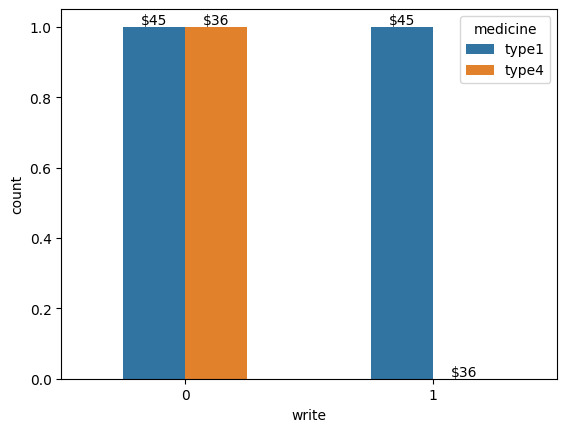

In [75]:
ax = sns.countplot(data = a_ch_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True);



hue_categories = list(a_ch_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

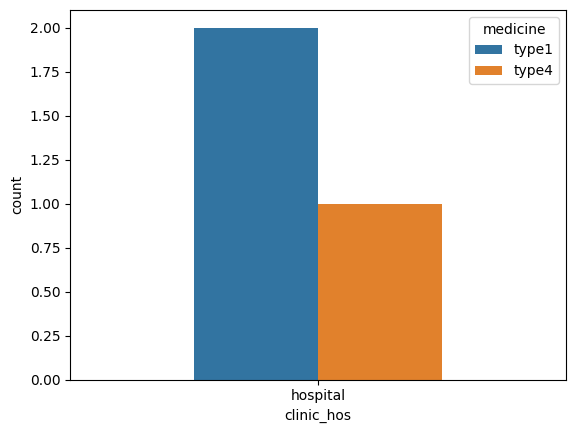

In [76]:
sns.countplot(data = a_ch_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

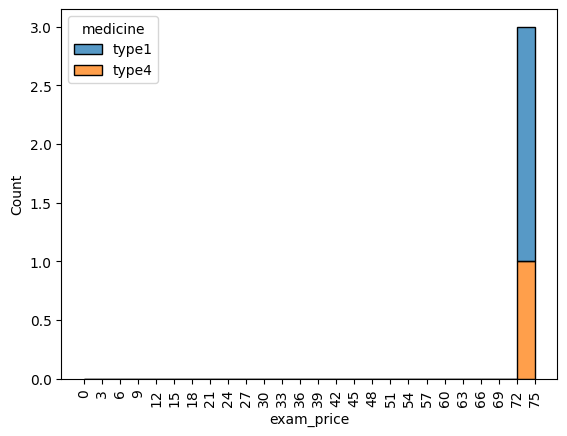

In [77]:
bins = np.arange(0 , a_ch_8["exam_price"].max() + 3 , 3)

sns.histplot(data=a_ch_8, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Chest speciality and Area 8 Doctors 

In [78]:
b_ch_8 = data[(data["dr_class"] == "b") & (data["speciality"] == "chest") & (data["area"] == "area8")] 



b_ch_8["medicine"].value_counts()

medicine
type1    2
type5    1
Name: count, dtype: int64

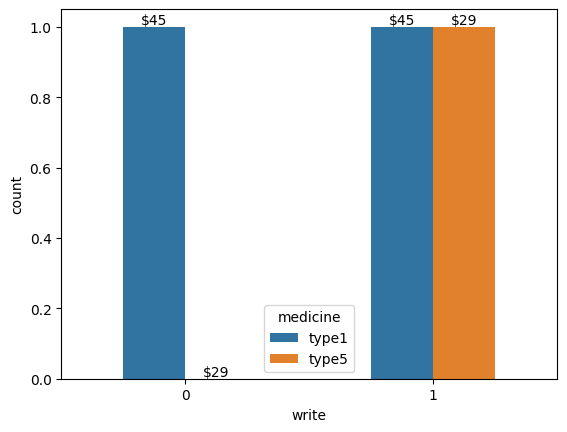

In [79]:
ax = sns.countplot(data = b_ch_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True);



hue_categories = list(b_ch_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

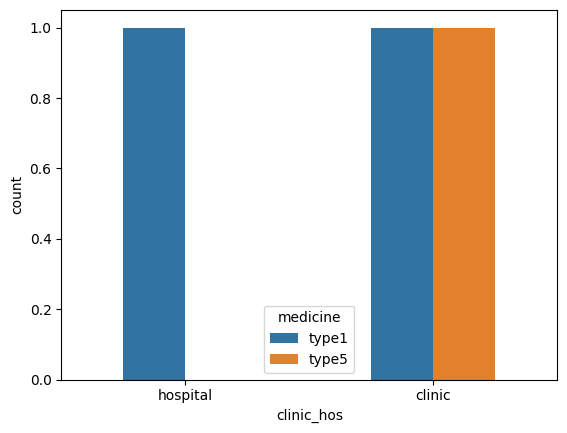

In [80]:
sns.countplot(data = b_ch_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

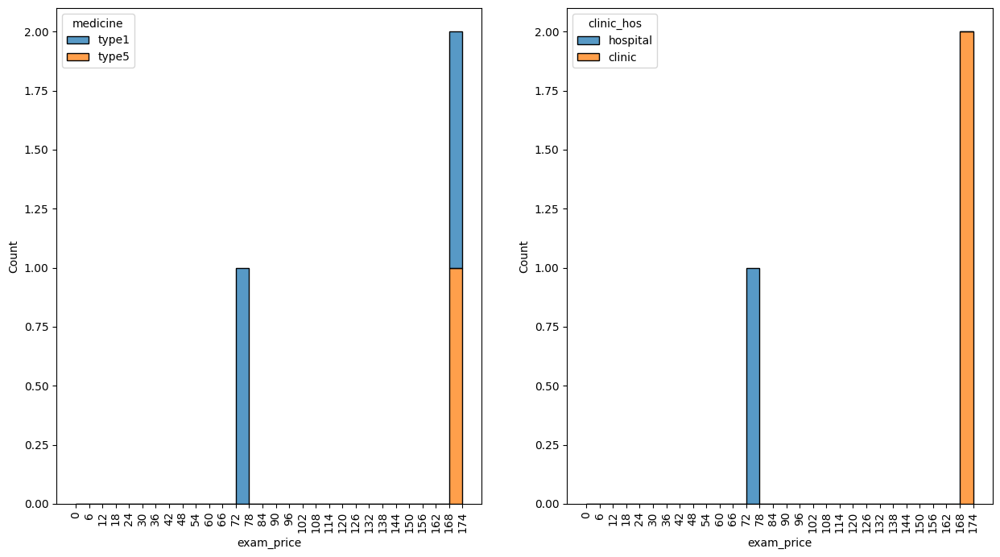

In [81]:
plt.figure(figsize = [15 , 8])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_ch_8["exam_price"].max() + 6 , 6)

sns.histplot(data=b_ch_8, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_ch_8["exam_price"].max() + 6 , 6)

sns.histplot(data=b_ch_8, x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 8

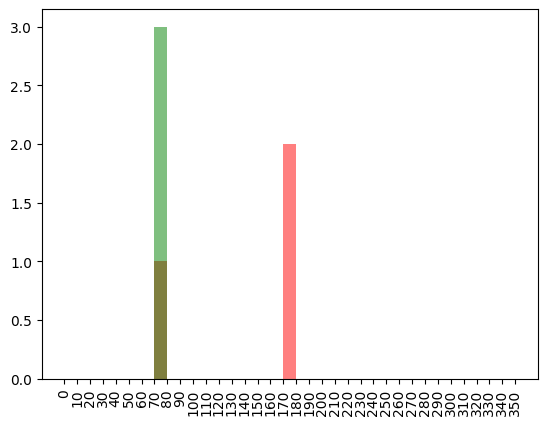

In [82]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_ch_8 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_ch_8 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Summary For Chest Doctors Analysis

#### Most chest dcotors in Class a write Type1 Medicine in clinics and hospitals

In [83]:
ch_a = data[(data["speciality"] == "chest") & (data["dr_class"] == "a")]

ch_a_1 = data[(data["speciality"] == "chest") & (data["dr_class"] == "a") & (data["write"] == 1)]

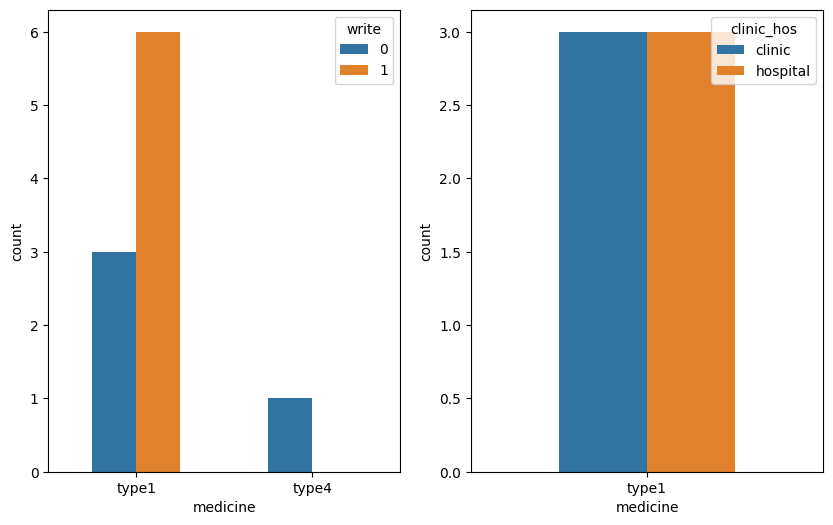

In [84]:
plt.figure(figsize = [10 , 6])



plt.subplot(1 , 2 , 1)

sns.countplot(data = ch_a , x = "medicine" , hue = "write" , width=0.5, dodge=True);



plt.subplot(1 , 2 , 2)

sns.countplot(data = ch_a_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True);

#### Most chest dcotors in Class b write Type1 Medicine and they also write many other cheap types 4 , 6 , 5

In [85]:
ch_b = data[(data["speciality"] == "chest") & (data["dr_class"] == "b")]

ch_b_1 = data[(data["speciality"] == "chest") & (data["dr_class"] == "b") & (data["write"] == 1)]

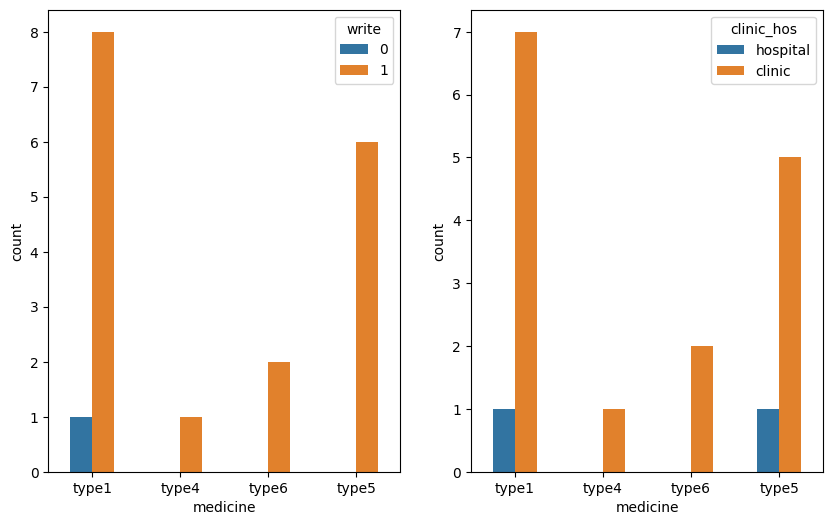

In [86]:
plt.figure(figsize = [10 , 6])



plt.subplot(1 , 2 , 1)

sns.countplot(data = ch_b , x = "medicine" , hue = "write" , width=0.5, dodge=True);



plt.subplot(1 , 2 , 2)

sns.countplot(data = ch_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True);




In [87]:
chest = data[(data["speciality"] == "chest") & (data["write"] == 1)]

### Class a write only type 1 in all exam price range hospitals or clinics

### Class b write type 1 also the most but also other cheap types and in low exam price range and more points than class a

In [88]:
import plotly.express as px

fig = px.scatter(chest , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

### Class a with the heighst exam price in area 1 that because area 1 is the highst exam price avg and in area 2 , 8 in hospitals with low exam price

### Class b in many areas with low range of exam prices 

In [89]:
import plotly.express as px

fig = px.scatter(chest , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

### Class a just write type 1 and other types written by class b

In [90]:
fig=px.bar(chest,x='medicine',y='exam_price',hover_data=['price'],color='dr_class',height=400 , range_y=[chest["exam_price"].min(), chest["exam_price"].max()])

fig.show();

### Clincs is the most in chest doctors with low range in hospitals and high in clincs and the very high bin is the class 1 area 1

In [91]:
fig= px.histogram(chest, x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of Chest Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

In [92]:
d50_to_100 = data[(data["speciality"] == "chest") & ((data["exam_price"] >= 50) & ((data["exam_price"] <= 100))) & (data["write"] == 1) & (data["clinic_hos"] == "clinic")]

d50_to_100

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
38,type1,45,area3,chest,b,80,clinic,1
180,type6,20,area4,chest,b,100,clinic,1
229,type1,45,area6,chest,b,100,clinic,1
235,type5,29,area6,chest,b,100,clinic,1
307,type5,29,area7,chest,b,80,clinic,1


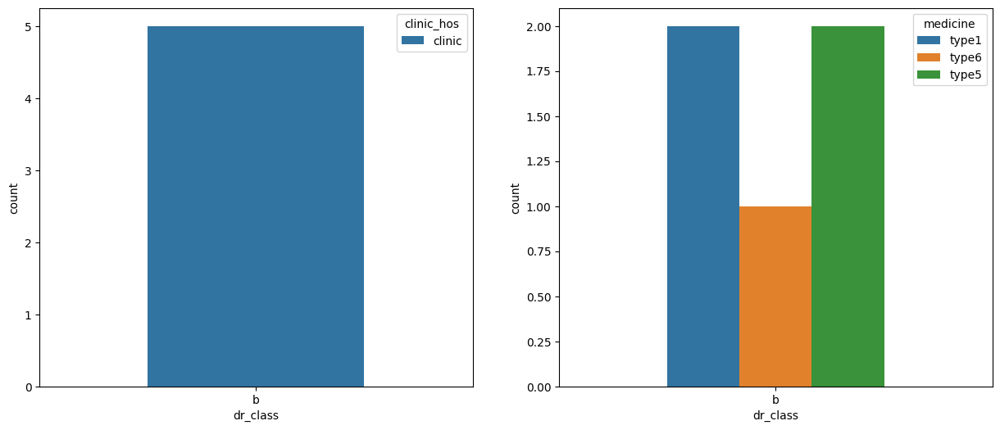

In [93]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 , 2 , 1)

sns.countplot(data = d50_to_100 , x = "dr_class" , hue = "clinic_hos" , width=0.5, dodge=True);





plt.subplot(1 , 2 , 2)

sns.countplot(data = d50_to_100 , x = "dr_class" , hue = "medicine" , width=0.5, dodge=True);

### Class a is in high range clinics and low range in hospitals 

### Class b is more than a and in low ranges

In [94]:
fig= px.histogram(chest, x='exam_price',height=500,width=900,template='simple_white',

color='dr_class', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of Chest Doctors by Class','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### More details about the areas distribuation

In [95]:
fig= px.histogram(chest, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Chest Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

# Im Doctors

### Class a , Im speciality and Area 1 Doctors 

In [96]:
a_im_1 = data[(data["speciality"] == "im") & (data["dr_class"] == "a") & (data["area"] == "area1")]

a_im_1

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
44,type1,45,area1,im,a,350,clinic,0
52,type4,36,area1,im,a,350,clinic,0
184,type1,45,area1,im,a,260,clinic,1
190,type1,45,area1,im,a,300,clinic,0
202,type1,45,area1,im,a,350,clinic,0
208,type4,36,area1,im,a,350,clinic,0
213,type1,45,area1,im,a,300,clinic,0
225,type1,45,area1,im,a,300,clinic,0
231,type4,36,area1,im,a,300,clinic,1
254,type4,36,area1,im,a,320,clinic,0


In [97]:
a_im_1["medicine"].value_counts()

medicine
type1    6
type4    5
type3    2
Name: count, dtype: int64

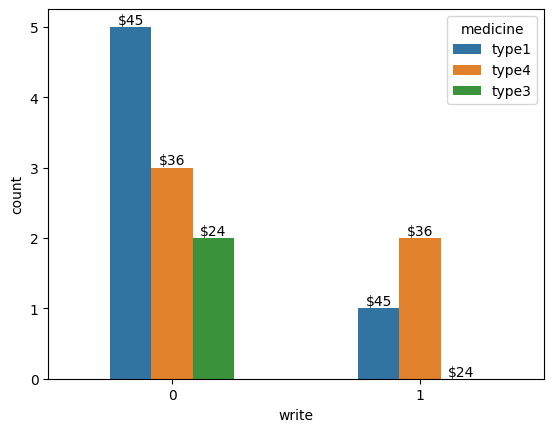

In [98]:
ax = sns.countplot(data = a_im_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_im_1['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

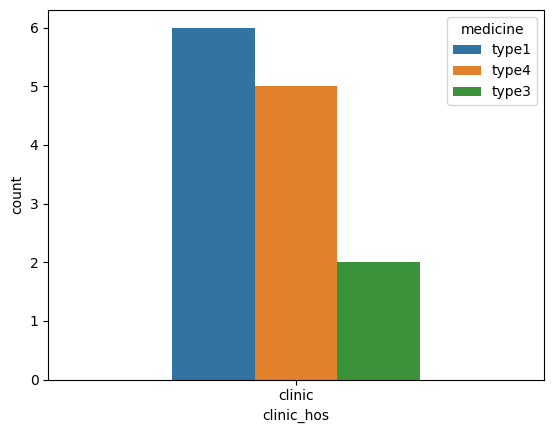

In [99]:
sns.countplot(data = a_im_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

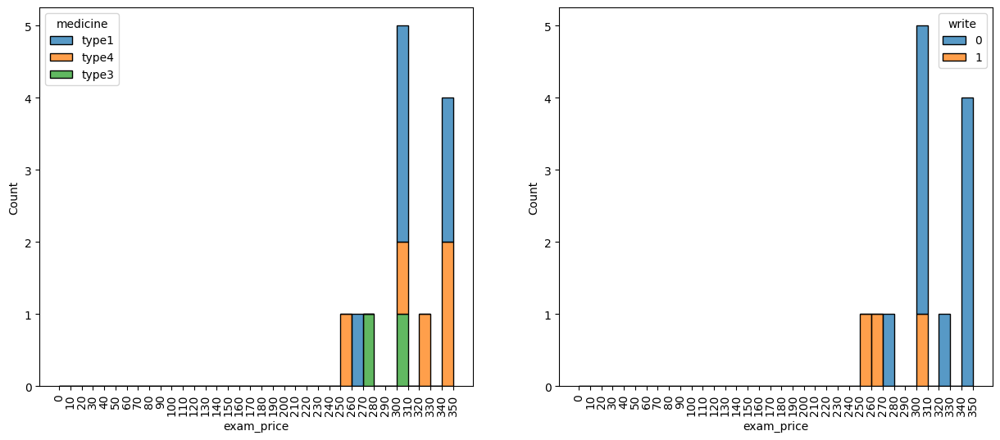

In [100]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_im_1["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_1, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_im_1["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_1, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

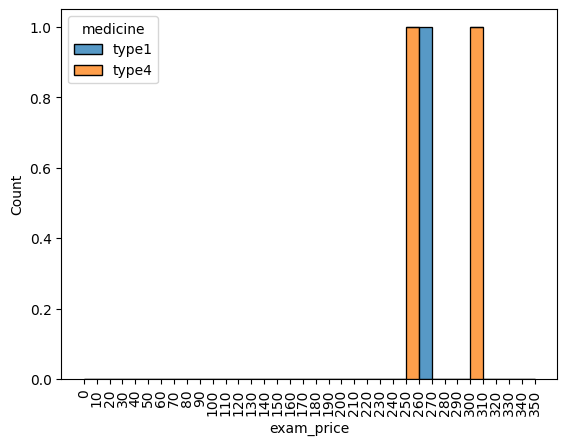

In [101]:
a_im_1_1 = a_im_1[a_im_1["write"] == 1]



bins = np.arange(0 , a_im_1["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_1_1, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Im speciality and Area 1 Doctors 

In [102]:
b_im_1 = data[(data["speciality"] == "im") & (data["dr_class"] == "b") & (data["area"] == "area1")]

b_im_1

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
237,type5,29,area1,im,b,150,clinic,1
293,type2,30,area1,im,b,140,clinic,1
299,type2,30,area1,im,b,160,clinic,1
309,type4,36,area1,im,b,170,clinic,1
315,type4,36,area1,im,b,150,clinic,1


In [103]:
b_im_1["medicine"].value_counts()

medicine
type2    2
type4    2
type5    1
Name: count, dtype: int64

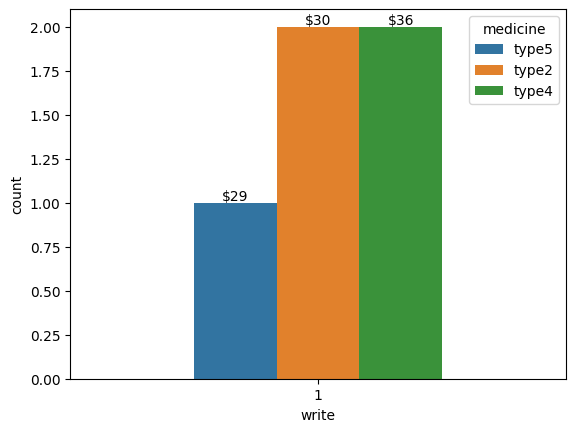

In [104]:
ax = sns.countplot(data = b_im_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_im_1['medicine'].unique()

for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

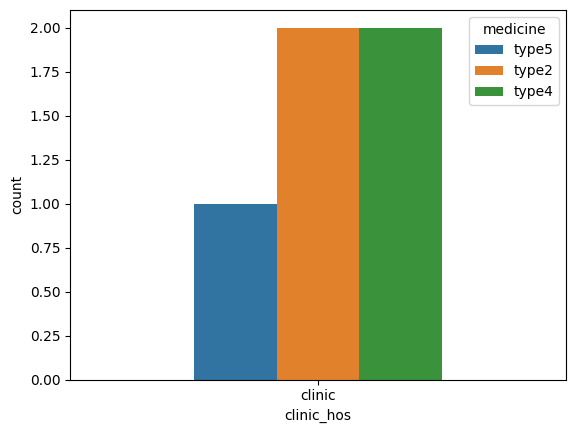

In [105]:
sns.countplot(data = b_im_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

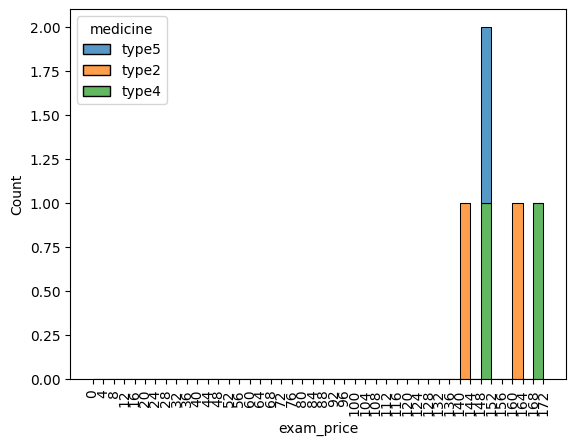

In [106]:
bins = np.arange(0 , b_im_1["exam_price"].max() + 4 , 4)

sns.histplot(data = b_im_1, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 1

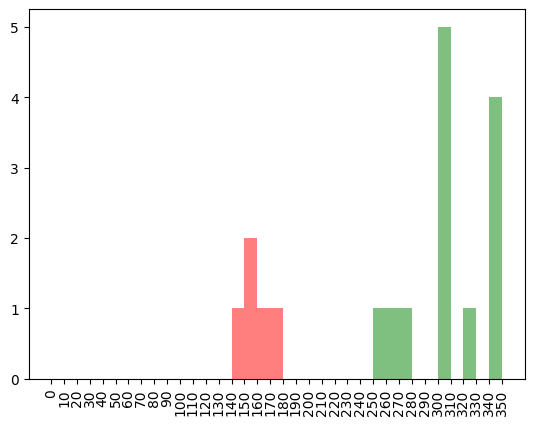

In [107]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_im_1 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_im_1 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , Im speciality and Area 2 Doctors 

In [108]:
a_im_2 = data[(data["speciality"] == "im") & (data["dr_class"] == "a") & (data["area"] == "area2")]

a_im_2

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
19,type4,36,area2,im,a,200,clinic,1
69,type1,45,area2,im,a,50,hospital,0
85,type1,45,area2,im,a,50,hospital,1
203,type3,24,area2,im,a,50,hospital,1
261,type4,36,area2,im,a,200,clinic,0
322,type4,36,area2,im,a,70,hospital,0


In [109]:
a_im_2["medicine"].value_counts()

medicine
type4    3
type1    2
type3    1
Name: count, dtype: int64

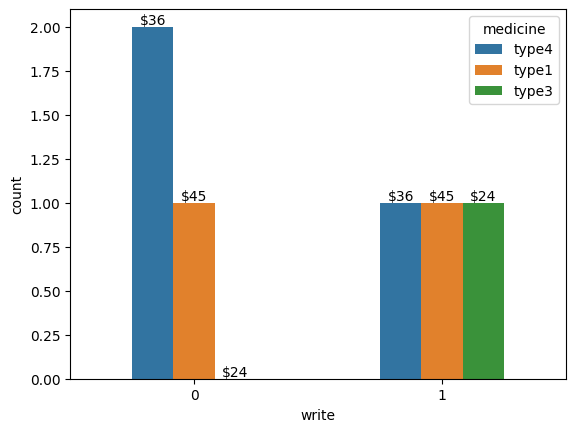

In [110]:
ax = sns.countplot(data = a_im_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_im_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

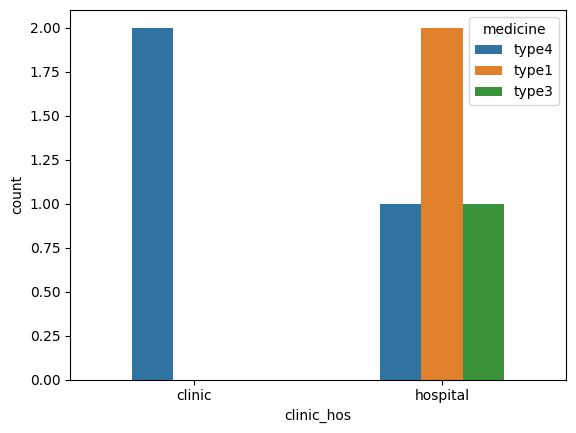

In [111]:
sns.countplot(data = a_im_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

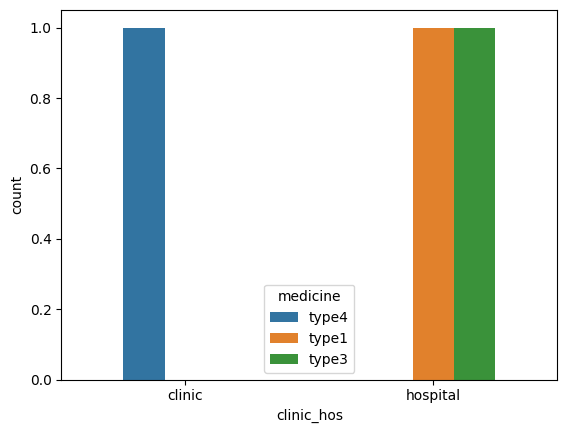

In [112]:
a_im_2_1 = a_im_2[a_im_2["write"] == 1]



sns.countplot(data = a_im_2_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

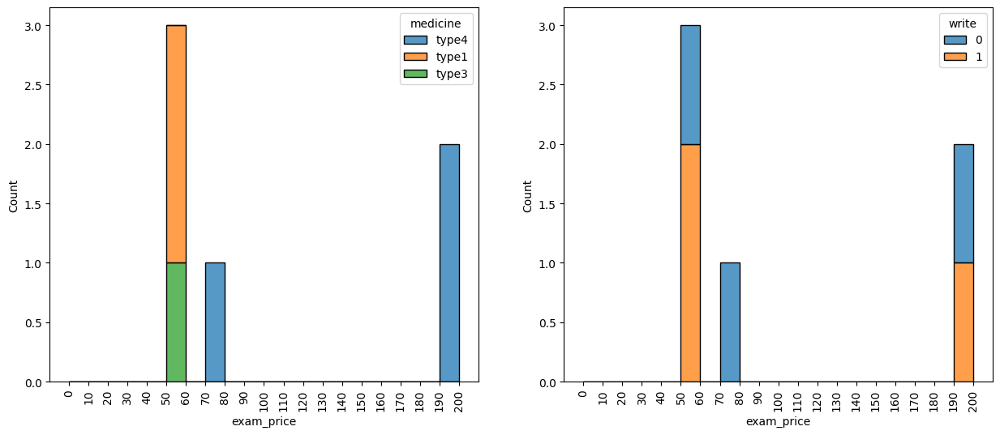

In [113]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_im_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_2, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_im_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_2, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

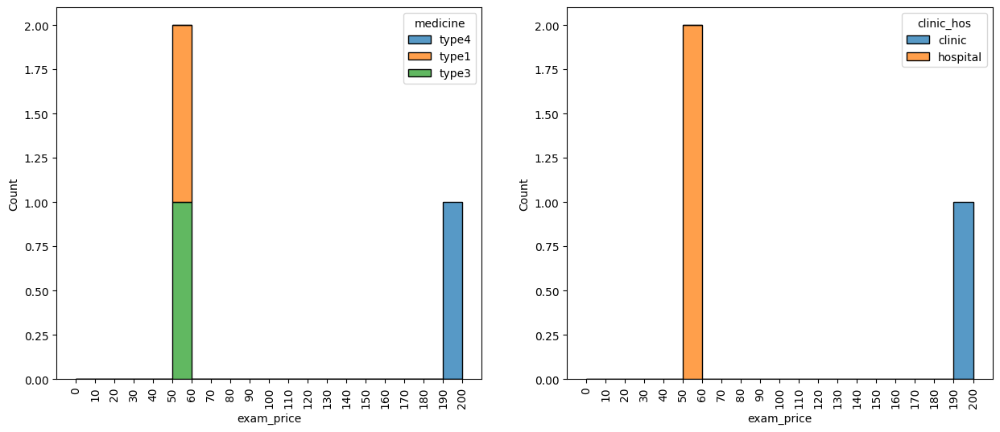

In [114]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_im_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_2_1, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_im_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_2_1, x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Im speciality and Area 2 Doctors 

In [115]:
b_im_2 = data[(data["speciality"] == "im") & (data["dr_class"] == "b") & (data["area"] == "area2")]

b_im_2

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
1,type4,36,area2,im,b,100,clinic,1
6,type6,20,area2,im,b,70,hospital,1
10,type6,20,area2,im,b,100,clinic,1
25,type1,45,area2,im,b,70,hospital,1
35,type1,45,area2,im,b,70,hospital,1
122,type4,36,area2,im,b,70,hospital,1
129,type1,45,area2,im,b,70,hospital,1
159,type6,20,area2,im,b,50,hospital,1
166,type6,20,area2,im,b,50,hospital,1
173,type2,30,area2,im,b,150,clinic,1


In [116]:
b_im_2["medicine"].value_counts()

medicine
type6    5
type4    4
type1    4
type2    2
Name: count, dtype: int64

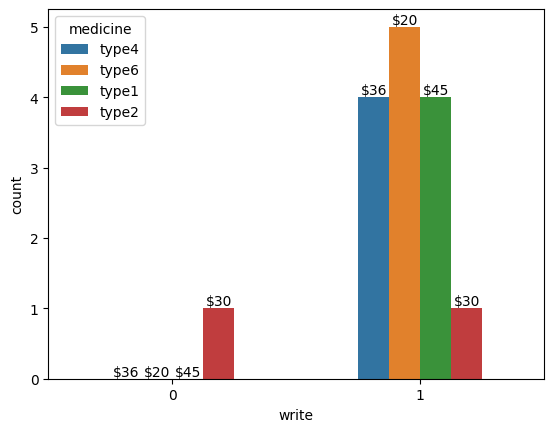

In [117]:
ax = sns.countplot(data = b_im_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_im_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

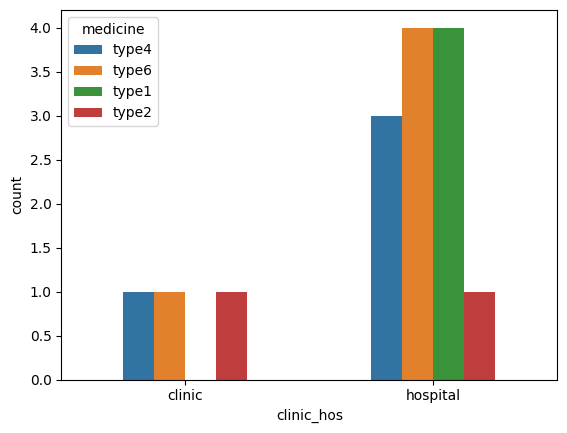

In [118]:
sns.countplot(data = b_im_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

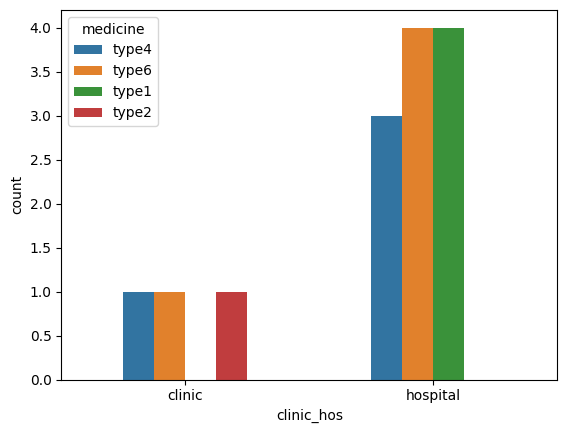

In [119]:
b_im_2_1 = b_im_2[b_im_2["write"] == 1]



sns.countplot(data = b_im_2_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

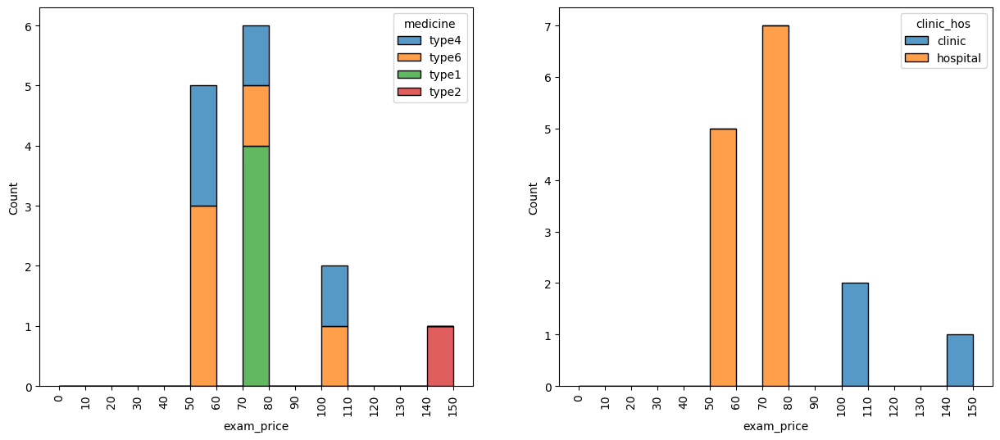

In [120]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_im_2["exam_price"].max() + 10 , 10)

sns.histplot(data = b_im_2_1, x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_im_2["exam_price"].max() + 10 , 10)

sns.histplot(data = b_im_2, x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 2

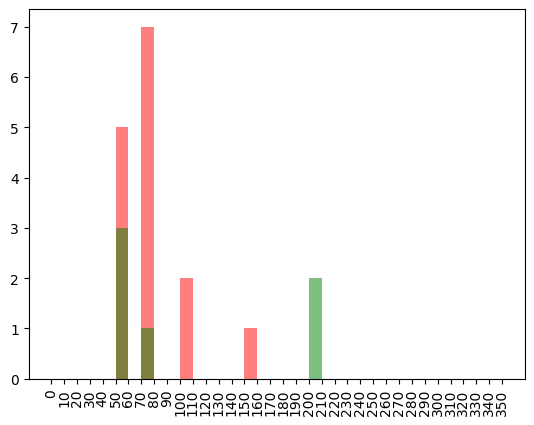

In [121]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_im_2 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_im_2 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , Im speciality and Area 3 Doctors 

In [122]:
a_im_3 = data[(data["speciality"] == "im") & (data["dr_class"] == "a") & (data["area"] == "area3")]

a_im_3

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
30,type6,20,area3,im,a,250,clinic,0
70,type4,36,area3,im,a,250,clinic,0
132,type1,45,area3,im,a,200,clinic,0
139,type4,36,area3,im,a,50,hospital,1


In [123]:
a_im_3["medicine"].value_counts()

medicine
type4    2
type6    1
type1    1
Name: count, dtype: int64

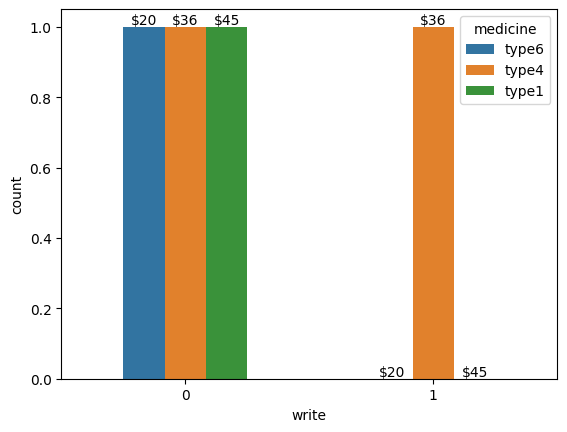

In [124]:
ax = sns.countplot(data = a_im_3 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_im_3['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

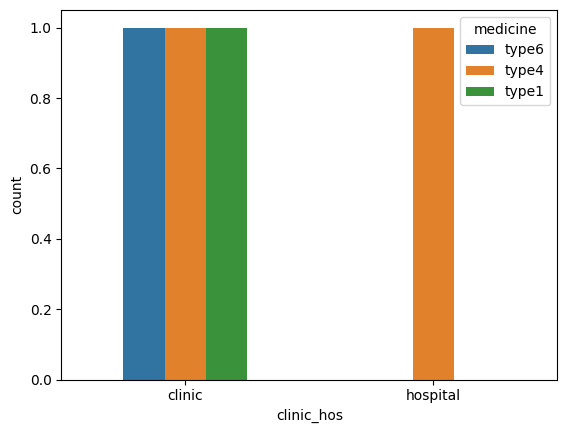

In [125]:
sns.countplot(data = a_im_3 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

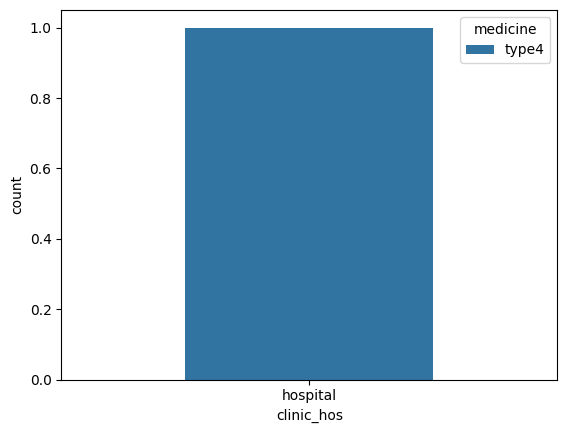

In [126]:
a_im_3_1 = a_im_3[a_im_3["write"] == 1]



sns.countplot(data = a_im_3_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

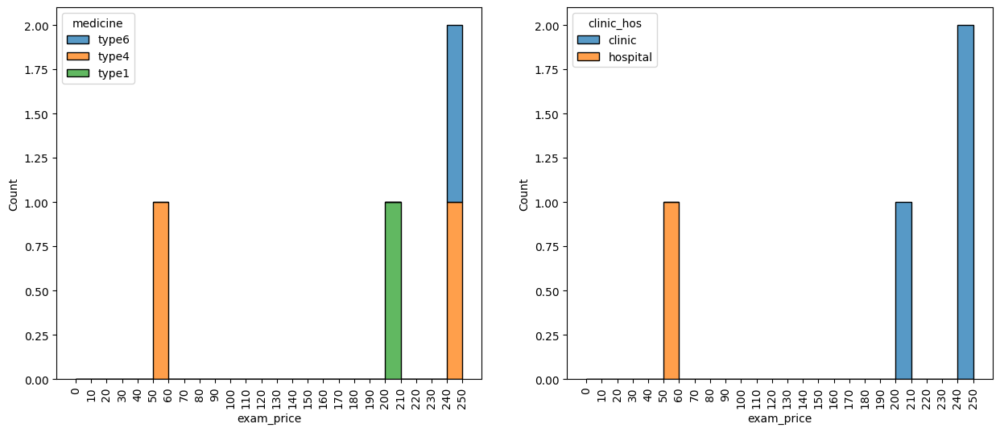

In [127]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_im_3["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_3 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_im_3["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_3, x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

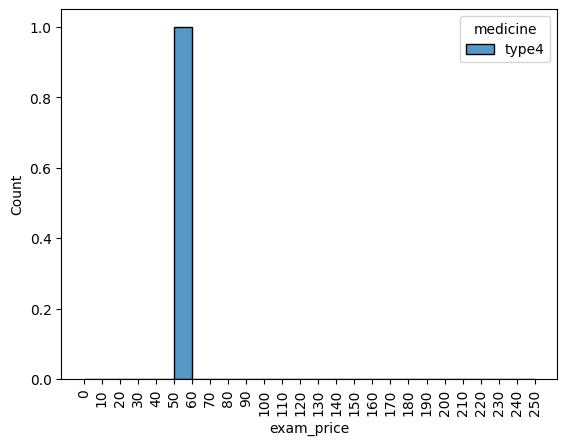

In [128]:
bins = np.arange(0 , a_im_3["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_3_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Im speciality and Area 3 Doctors 

In [129]:
b_im_3 = data[(data["speciality"] == "im") & (data["dr_class"] == "b") & (data["area"] == "area3")]

b_im_3

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
46,type4,36,area3,im,b,180,clinic,0
54,type6,20,area3,im,b,150,clinic,0
62,type2,30,area3,im,b,120,clinic,1
102,type6,20,area3,im,b,120,clinic,1
118,type2,30,area3,im,b,120,clinic,0
146,type6,20,area3,im,b,50,hospital,1


In [130]:
b_im_3["medicine"].value_counts()

medicine
type6    3
type2    2
type4    1
Name: count, dtype: int64

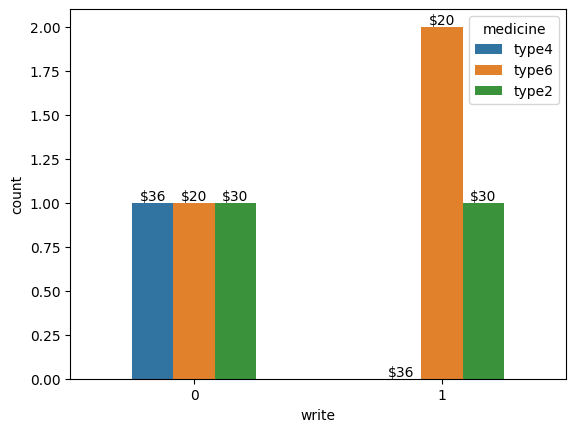

In [131]:
ax = sns.countplot(data = b_im_3 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_im_3['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

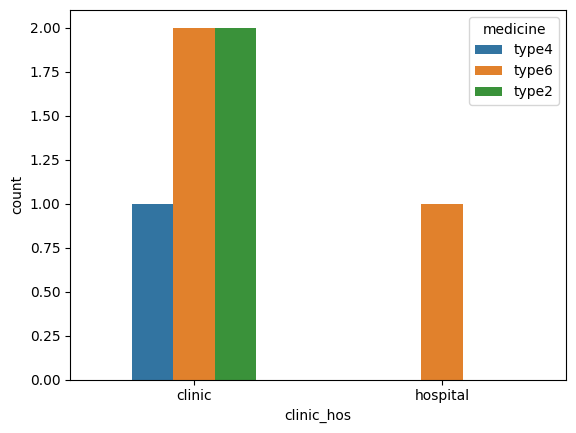

In [132]:
sns.countplot(data = b_im_3 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

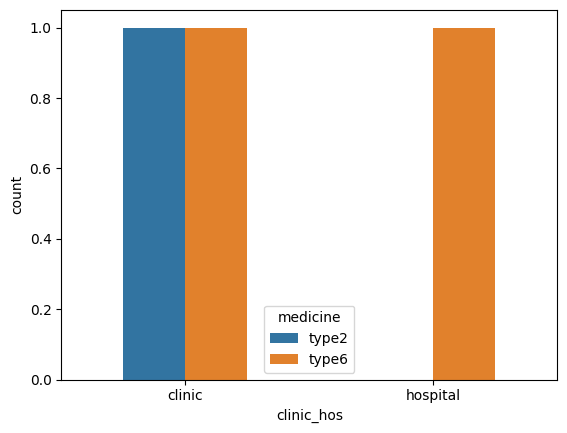

In [133]:
b_im_3_1 = b_im_3[b_im_3["write"] == 1]



sns.countplot(data = b_im_3_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

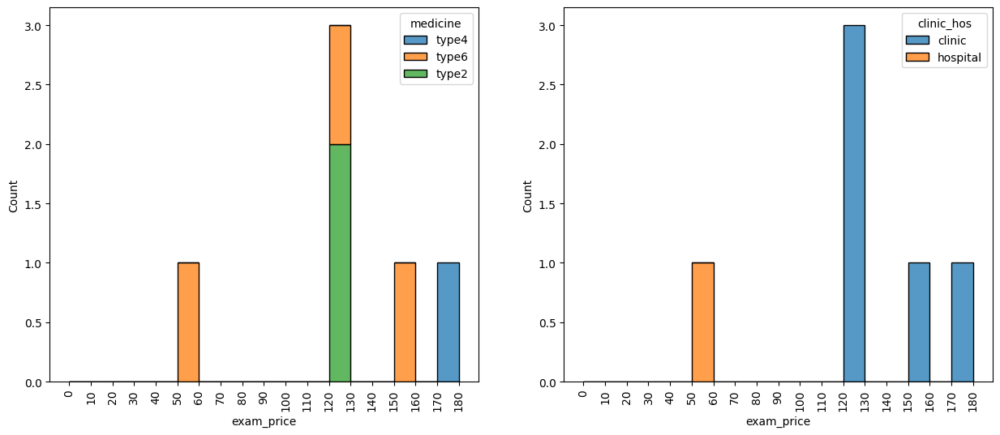

In [134]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_im_3["exam_price"].max() + 10 , 10)

sns.histplot(data = b_im_3 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_im_3["exam_price"].max() + 10 , 10)

sns.histplot(data = b_im_3, x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

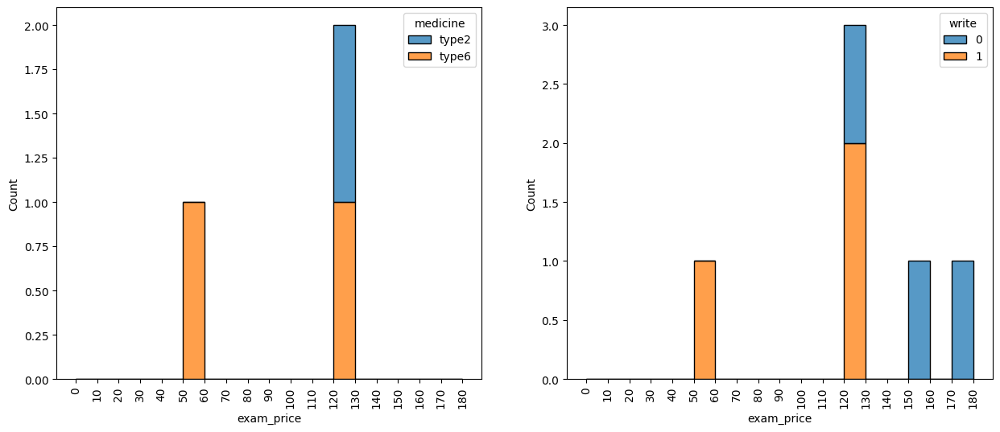

In [135]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_im_3["exam_price"].max() + 10 , 10)

sns.histplot(data = b_im_3_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_im_3["exam_price"].max() + 10 , 10)

sns.histplot(data = b_im_3, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 3

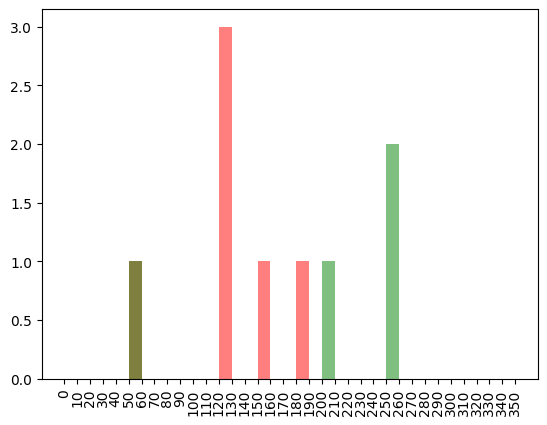

In [136]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_im_3 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_im_3 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , Im speciality and Area 4 Doctors 

In [137]:
a_im_4 = data[(data["speciality"] == "im") & (data["dr_class"] == "a") & (data["area"] == "area4")]

a_im_4

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
153,type6,20,area4,im,a,200,clinic,0
160,type3,24,area4,im,a,60,hospital,1
192,type4,36,area4,im,a,200,clinic,0
215,type6,20,area4,im,a,300,clinic,0
233,type5,29,area4,im,a,50,hospital,1
362,type3,24,area4,im,a,90,hospital,1


In [138]:
a_im_4["medicine"].value_counts()

medicine
type6    2
type3    2
type4    1
type5    1
Name: count, dtype: int64

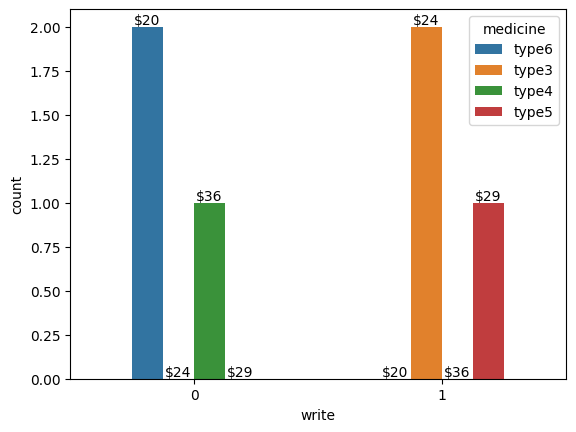

In [139]:
ax = sns.countplot(data = a_im_4 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_im_4['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

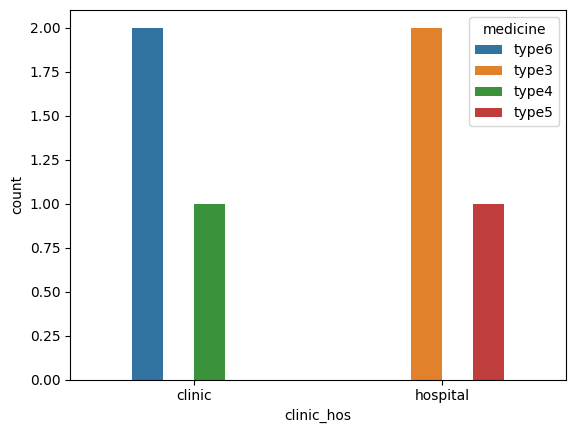

In [140]:
sns.countplot(data = a_im_4 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

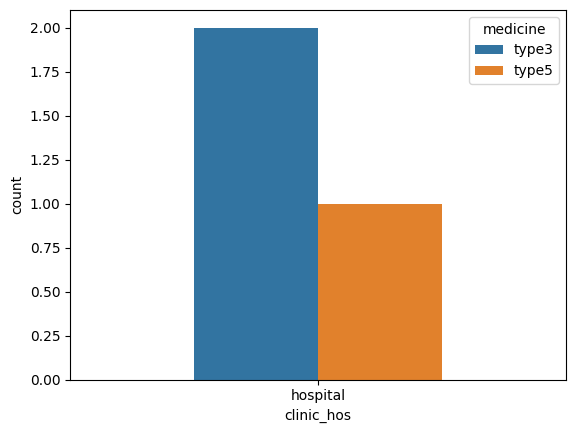

In [141]:
a_im_4_1 = a_im_4[a_im_4["write"] == 1]



sns.countplot(data = a_im_4_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

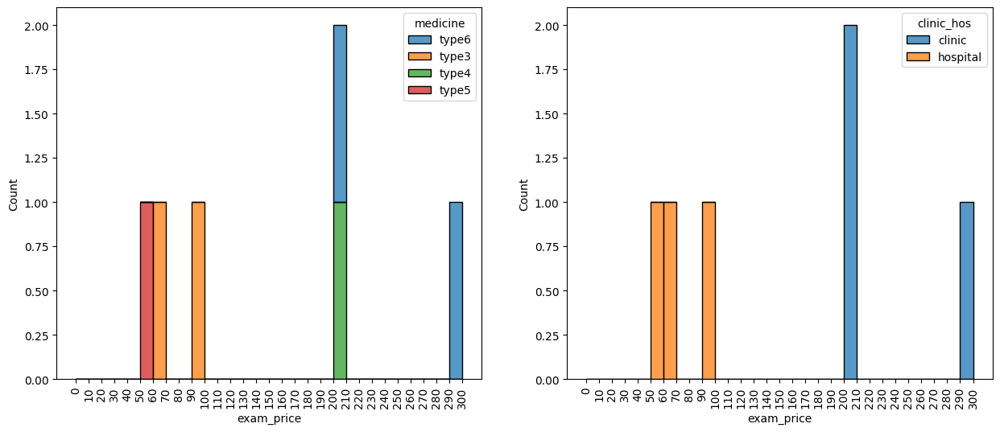

In [142]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_im_4["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_4 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_im_4["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_4, x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

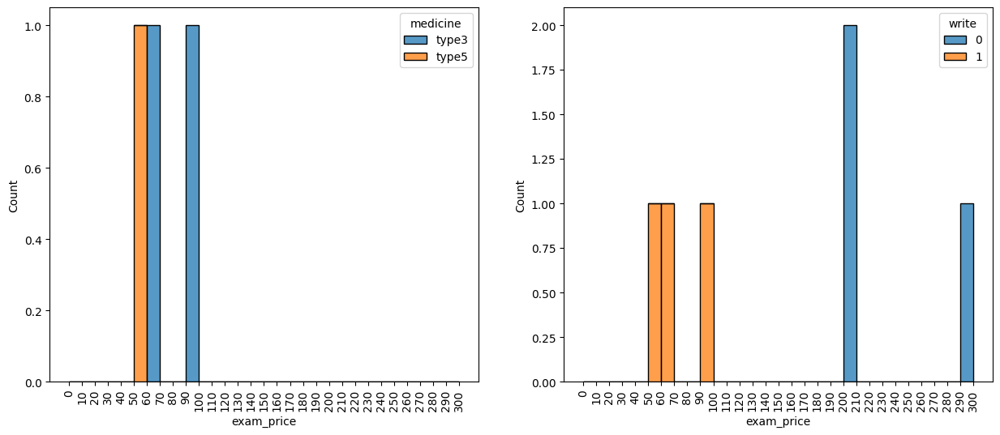

In [143]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_im_4["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_4_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_im_4["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_4, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b ,  Im speciality and Area 4 Doctors 

In [144]:
b_im_4 = data[(data["speciality"] == "im") & (data["dr_class"] == "b") & (data["area"] == "area4")]

b_im_4

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
224,type2,30,area4,im,b,80,hospital,1
227,type1,45,area4,im,b,80,hospital,1
239,type4,36,area4,im,b,120,clinic,1
268,type3,24,area4,im,b,50,hospital,1


In [145]:
b_im_4["medicine"].value_counts()

medicine
type2    1
type1    1
type4    1
type3    1
Name: count, dtype: int64

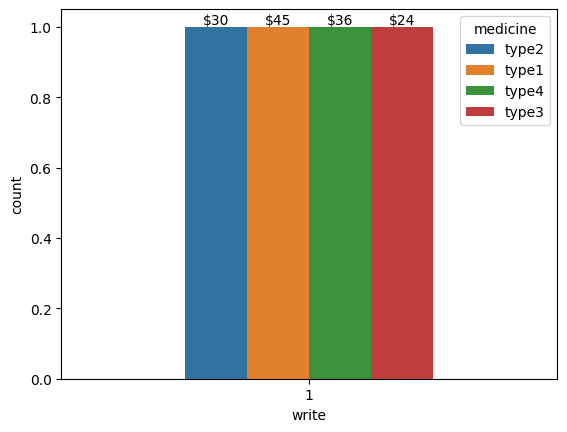

In [146]:
ax = sns.countplot(data = b_im_4 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_im_4['medicine'].unique())  



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

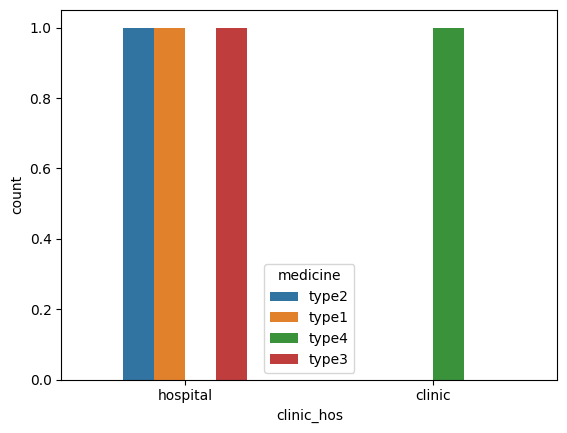

In [147]:
sns.countplot(data = b_im_4 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

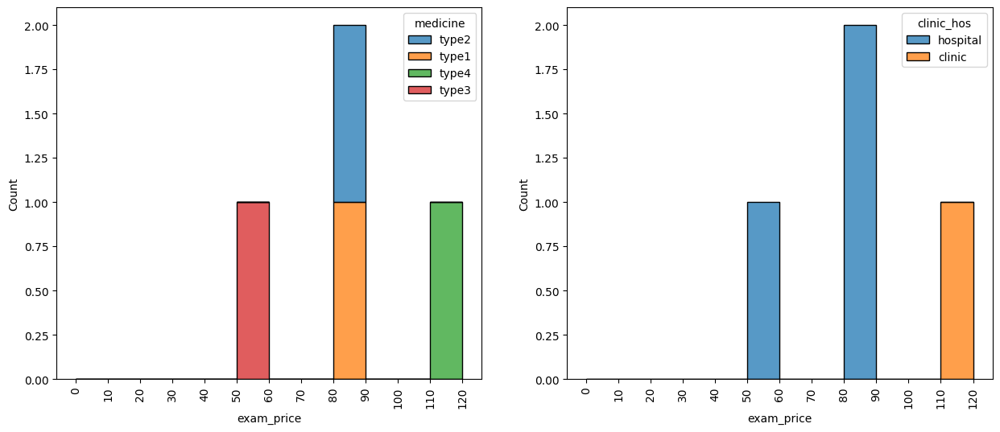

In [148]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_im_4["exam_price"].max() + 10 , 10)

sns.histplot(data = b_im_4 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_im_4["exam_price"].max() + 10 , 10)

sns.histplot(data = b_im_4, x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

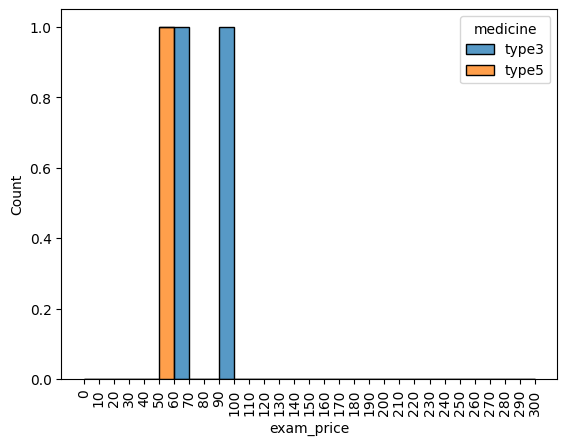

In [149]:
bins = np.arange(0 , a_im_4["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_4_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 4

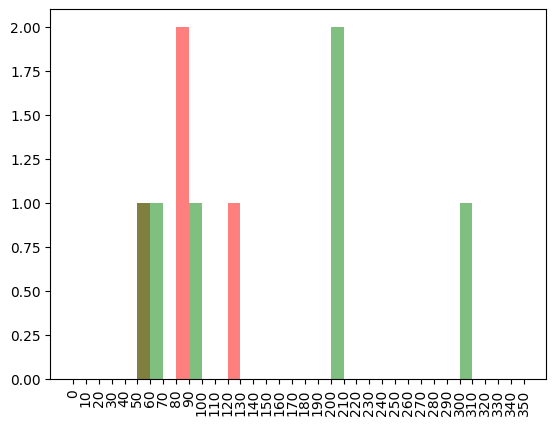

In [150]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_im_4 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_im_4 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , Im speciality and Area 5 Doctors 

In [151]:
a_im_5 = data[(data["speciality"] == "im") & (data["dr_class"] == "a") & (data["area"] == "area5")]

a_im_5

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
193,type1,45,area5,im,a,30,hospital,1
263,type1,45,area5,im,a,30,hospital,0
274,type1,45,area5,im,a,30,hospital,0


In [152]:
a_im_5["medicine"].value_counts()

medicine
type1    3
Name: count, dtype: int64

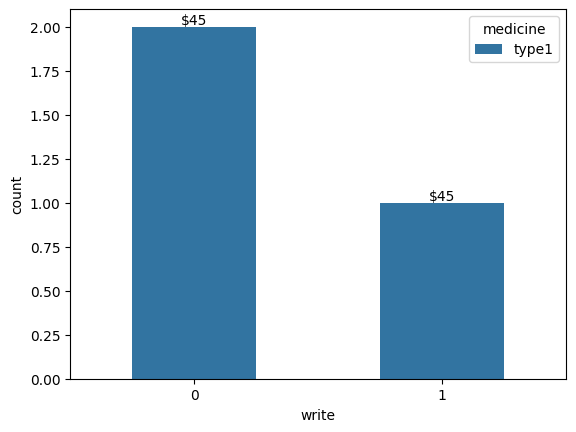

In [153]:
ax = sns.countplot(data = a_im_5 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_im_5['medicine'].unique())  



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

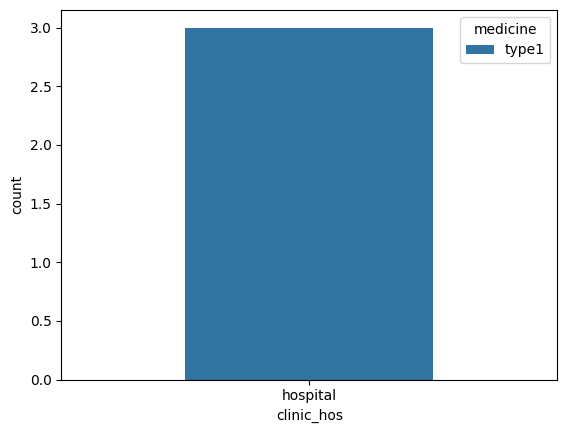

In [154]:
sns.countplot(data = a_im_5 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

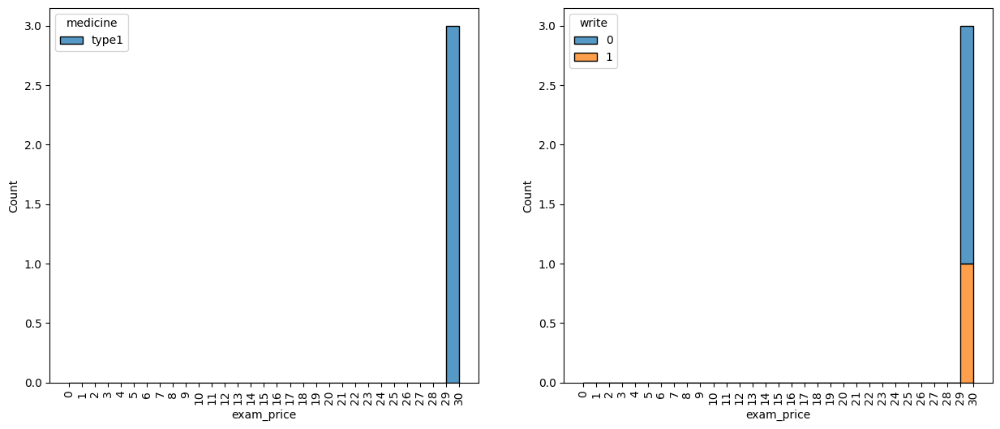

In [155]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_im_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_im_5 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_im_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_im_5, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Im speciality and Area 5 Doctors 

In [156]:
b_im_5 = data[(data["speciality"] == "im") & (data["dr_class"] == "b") & (data["area"] == "area5")]

b_im_5

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
154,type6,20,area5,im,b,30,hospital,0
161,type6,20,area5,im,b,30,hospital,0
168,type4,36,area5,im,b,30,hospital,1
175,type6,20,area5,im,b,30,hospital,0
181,type6,20,area5,im,b,30,hospital,0
199,type1,45,area5,im,b,30,hospital,0
205,type1,45,area5,im,b,30,hospital,1
210,type1,45,area5,im,b,30,hospital,1
216,type1,45,area5,im,b,30,hospital,1
221,type1,45,area5,im,b,30,hospital,1


In [157]:
b_im_5["medicine"].value_counts()

medicine
type1    10
type6     4
type4     3
Name: count, dtype: int64

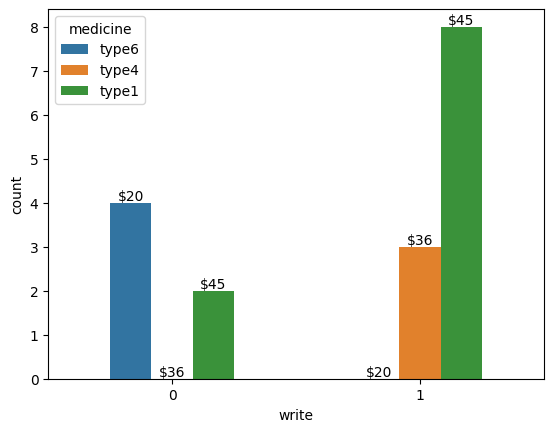

In [158]:
ax = sns.countplot(data = b_im_5 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_im_5['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 





for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

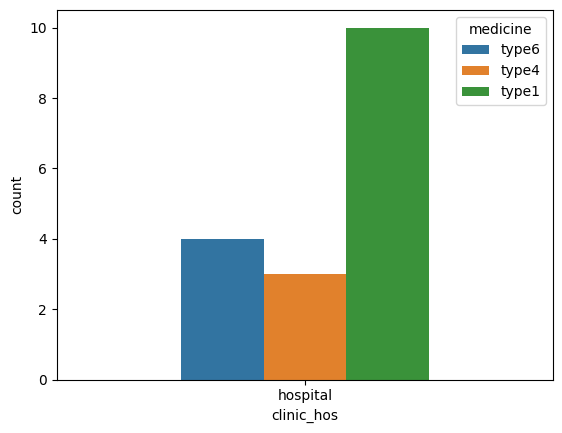

In [159]:
sns.countplot(data = b_im_5 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

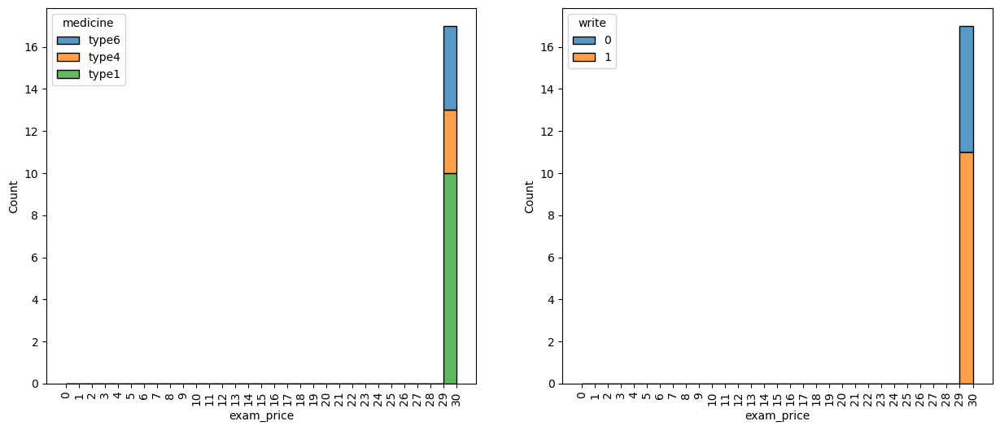

In [160]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_im_5["exam_price"].max() + 1 , 1)

sns.histplot(data = b_im_5 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_im_5["exam_price"].max() + 1 , 1)

sns.histplot(data = b_im_5, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 5

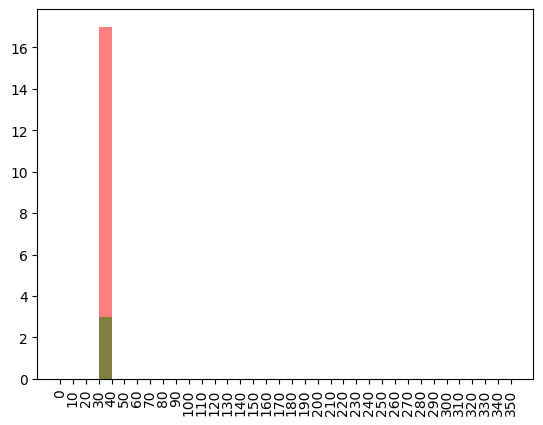

In [161]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_im_5 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_im_5 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , Im speciality and Area 6 Doctors 

In [162]:
a_im_6 = data[(data["speciality"] == "im") & (data["dr_class"] == "a") & (data["area"] == "area6")]

a_im_6

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
113,type1,45,area6,im,a,200,clinic,1
120,type4,36,area6,im,a,200,clinic,0
162,type1,45,area6,im,a,190,clinic,0
169,type4,36,area6,im,a,190,clinic,0
176,type1,45,area6,im,a,300,clinic,0
182,type4,36,area6,im,a,300,clinic,0
211,type1,45,area6,im,a,250,clinic,0
217,type4,36,area6,im,a,250,clinic,0
306,type1,45,area6,im,a,220,clinic,0
324,type6,20,area6,im,a,250,clinic,0


In [163]:
a_im_6["medicine"].value_counts()

medicine
type1    6
type4    4
type6    1
Name: count, dtype: int64

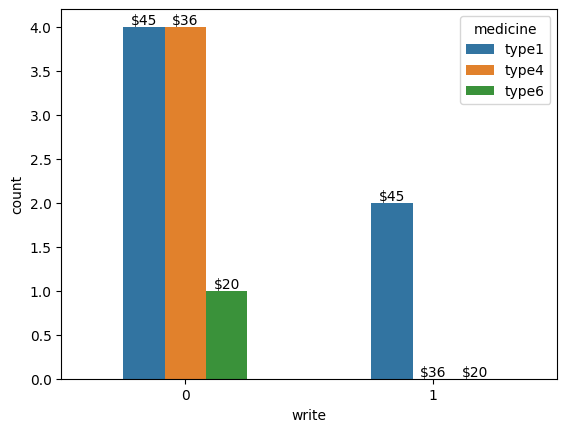

In [164]:
ax = sns.countplot(data = a_im_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_im_6['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 





for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

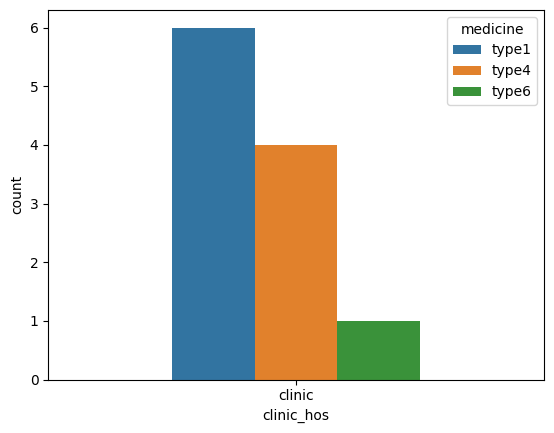

In [165]:
sns.countplot(data = a_im_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

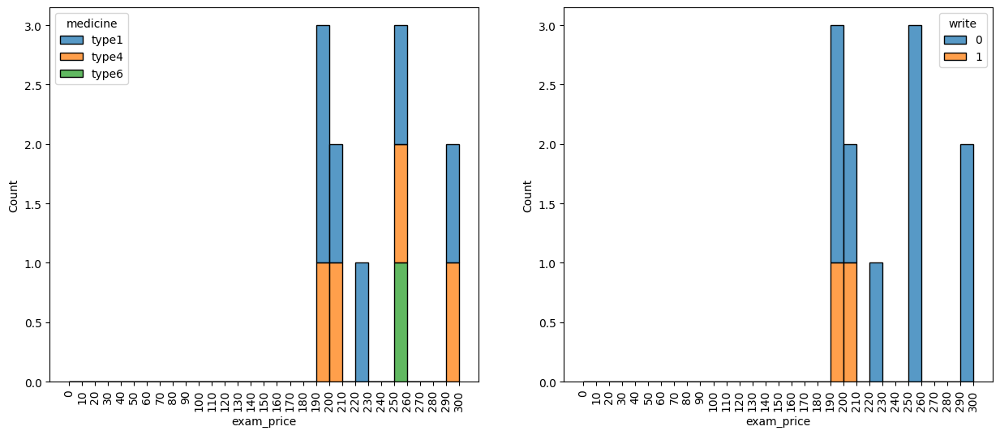

In [166]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_im_6["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_im_6["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_6, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

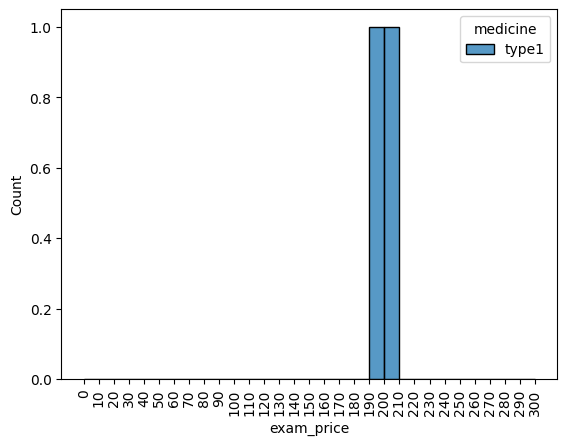

In [167]:
a_im_6_1 = a_im_6[a_im_6["write"] == 1]



bins = np.arange(0 , a_im_6["exam_price"].max() + 10 , 10)

sns.histplot(data = a_im_6_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Im speciality and Area 6 Doctors 

In [168]:
b_im_6 = data[(data["speciality"] == "im") & (data["dr_class"] == "b") & (data["area"] == "area6")]

b_im_6

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
89,type1,45,area6,im,b,150,clinic,1
97,type4,36,area6,im,b,150,clinic,0
141,type1,45,area6,im,b,150,clinic,1
148,type6,20,area6,im,b,150,clinic,0
200,type1,45,area6,im,b,120,clinic,1
275,type4,36,area6,im,b,160,clinic,1
279,type1,45,area6,im,b,160,clinic,0
283,type5,29,area6,im,b,130,clinic,1
289,type1,45,area6,im,b,170,clinic,1
295,type4,36,area6,im,b,170,clinic,1


In [169]:
b_im_6["medicine"].value_counts()

medicine
type1    6
type4    3
type6    2
type5    1
type3    1
Name: count, dtype: int64

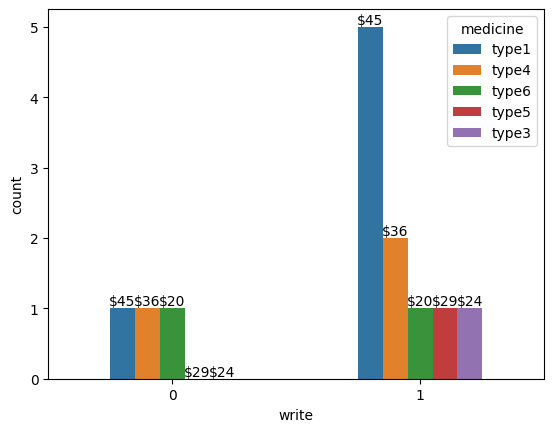

In [170]:
ax = sns.countplot(data = b_im_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_im_6['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 





for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

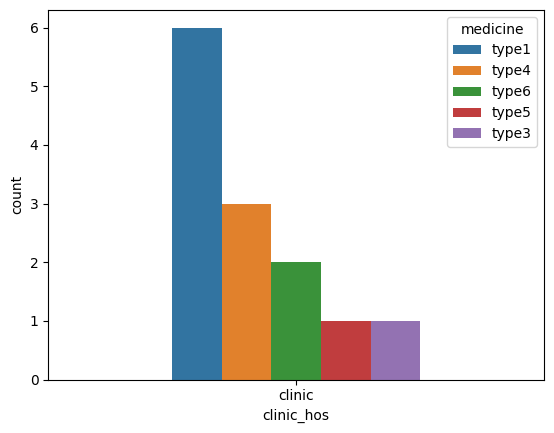

In [171]:
sns.countplot(data = b_im_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

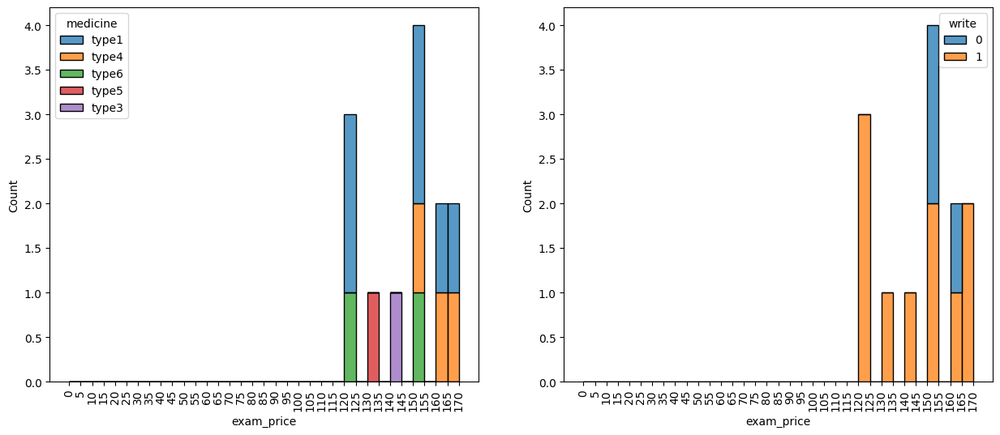

In [172]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_im_6["exam_price"].max() + 5 , 5)

sns.histplot(data = b_im_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_im_6["exam_price"].max() + 5 , 5)

sns.histplot(data = b_im_6, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

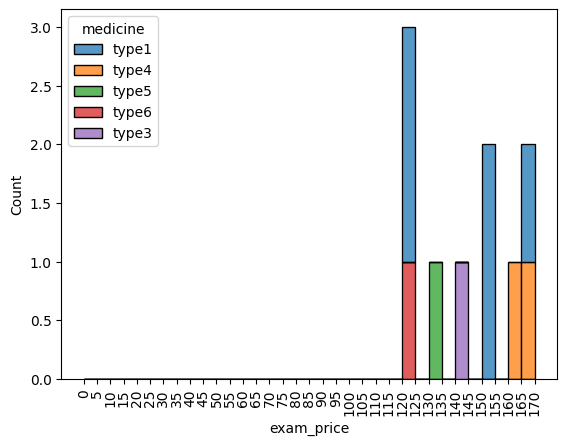

In [173]:
b_im_6_1 = b_im_6[b_im_6["write"] == 1]



bins = np.arange(0 , b_im_6["exam_price"].max() + 5 , 5)

sns.histplot(data = b_im_6_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 6

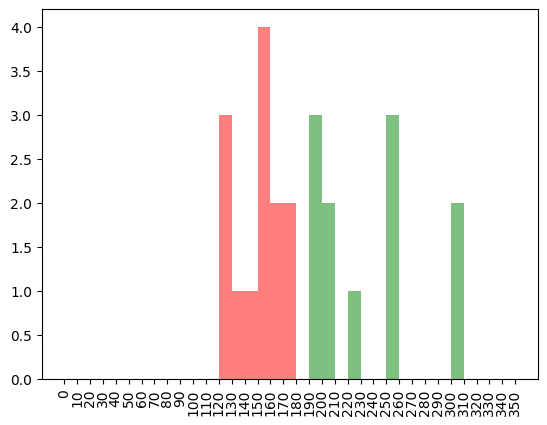

In [174]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_im_6 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_im_6 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , Im speciality and Area 7 Doctors 

In [175]:
a_im_7 = data[(data["speciality"] == "im") & (data["dr_class"] == "a") & (data["area"] == "area7")]

a_im_7

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
341,type1,45,area7,im,a,170,clinic,0
380,type1,45,area7,im,a,100,clinic,0
384,type4,36,area7,im,a,120,clinic,0
387,type1,45,area7,im,a,120,clinic,1


In [176]:
a_im_7["medicine"].value_counts()

medicine
type1    3
type4    1
Name: count, dtype: int64

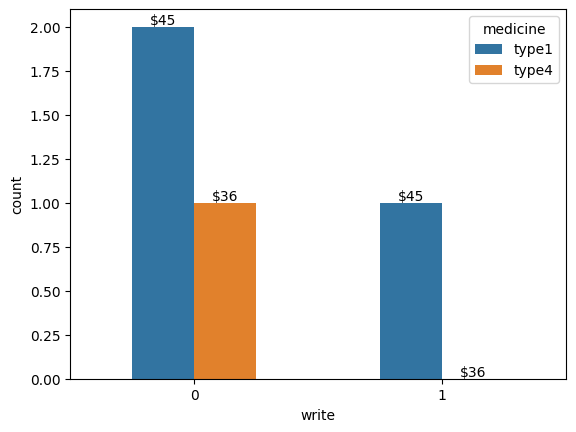

In [177]:
ax = sns.countplot(data = a_im_7 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_im_7['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 





for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

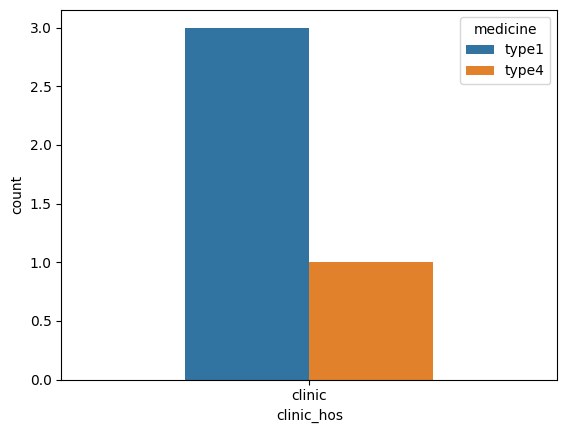

In [178]:
sns.countplot(data = a_im_7 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

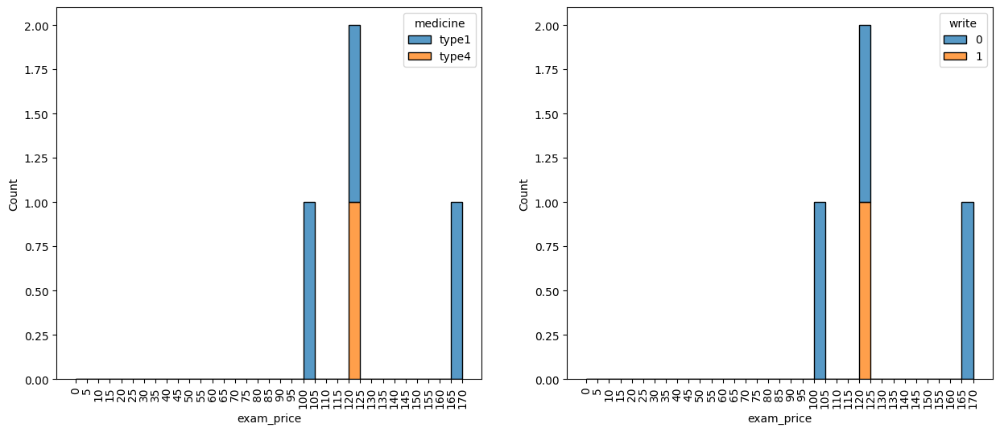

In [179]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_im_7["exam_price"].max() + 5 , 5)

sns.histplot(data = a_im_7 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_im_7["exam_price"].max() + 5 , 5)

sns.histplot(data = a_im_7, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

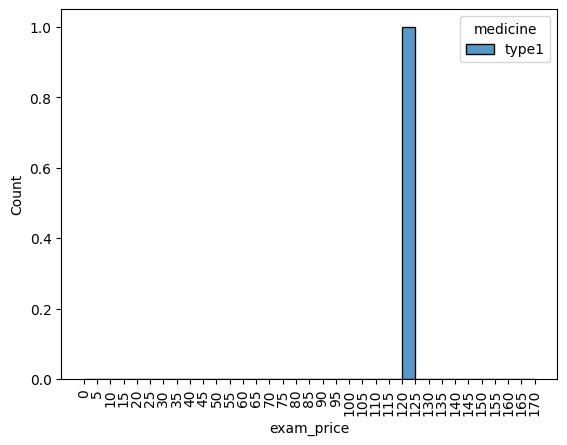

In [180]:
a_im_7_1 = a_im_7[a_im_7["write"] == 1]



bins = np.arange(0 , a_im_7["exam_price"].max() + 5 , 5)

sns.histplot(data = a_im_7_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Im speciality and Area 7 Doctors 

In [181]:
b_im_7 = data[(data["speciality"] == "im") & (data["dr_class"] == "b") & (data["area"] == "area7")]

b_im_7

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
313,type3,24,area7,im,b,110,clinic,1
319,type4,36,area7,im,b,100,clinic,1
325,type4,36,area7,im,b,120,clinic,0
331,type1,45,area7,im,b,120,clinic,0
357,type3,24,area7,im,b,120,clinic,0


In [182]:
b_im_7["medicine"].value_counts()

medicine
type3    2
type4    2
type1    1
Name: count, dtype: int64

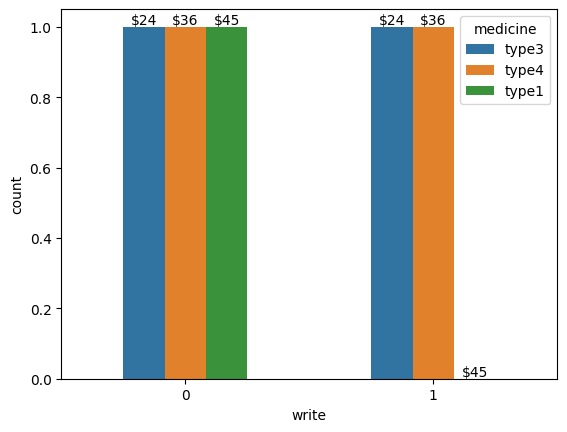

In [183]:
ax = sns.countplot(data = b_im_7 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_im_7['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 





for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

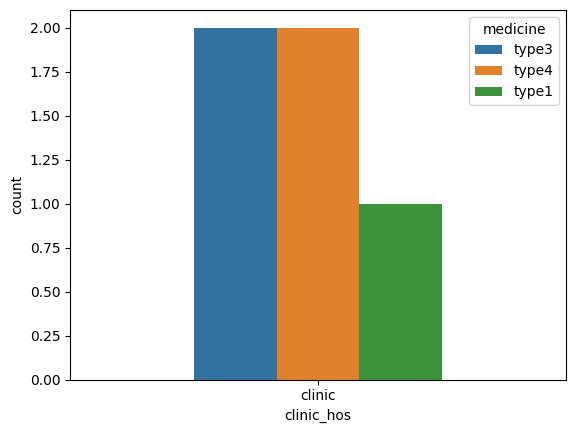

In [184]:
sns.countplot(data = b_im_7 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

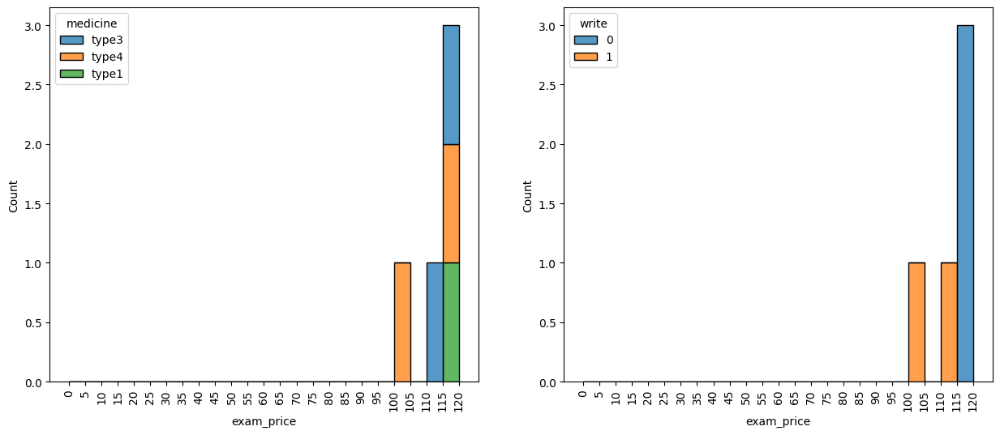

In [185]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_im_7["exam_price"].max() + 5 , 5)

sns.histplot(data = b_im_7 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_im_7["exam_price"].max() + 5 , 5)

sns.histplot(data = b_im_7, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

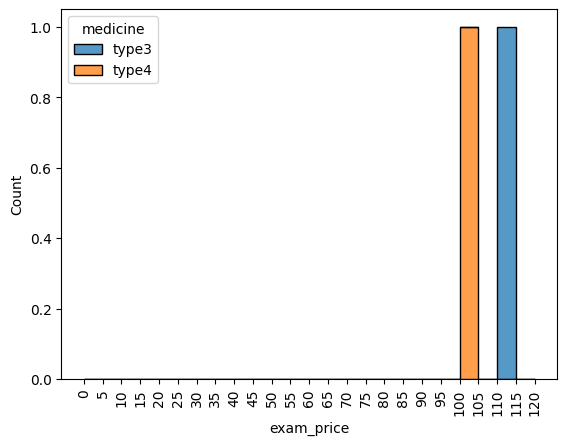

In [186]:
b_im_7_1 = b_im_7[b_im_7["write"] == 1]



bins = np.arange(0 , b_im_7["exam_price"].max() + 5 , 5)

sns.histplot(data = b_im_7_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 7

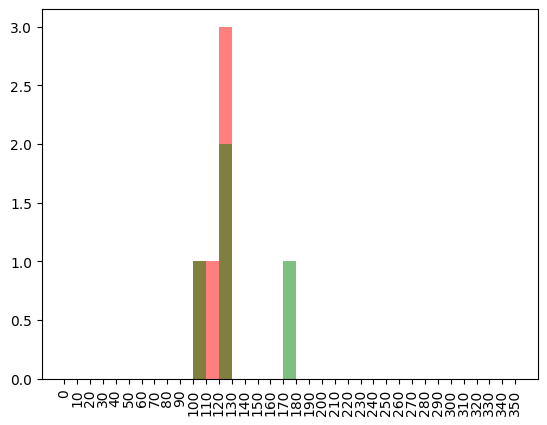

In [187]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_im_7 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_im_7 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , Im speciality and Area 8 Doctors 

In [188]:
a_im_8 = data[(data["speciality"] == "im") & (data["dr_class"] == "a") & (data["area"] == "area8")]

In [189]:
a_im_8["medicine"].value_counts()

medicine
type1    8
type4    8
type6    1
type3    1
Name: count, dtype: int64

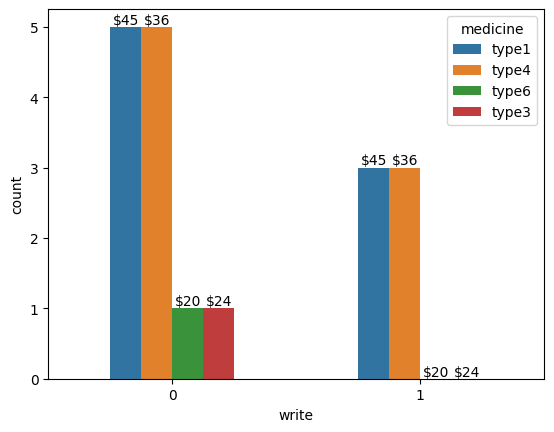

In [190]:
ax = sns.countplot(data = a_im_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_im_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 





for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

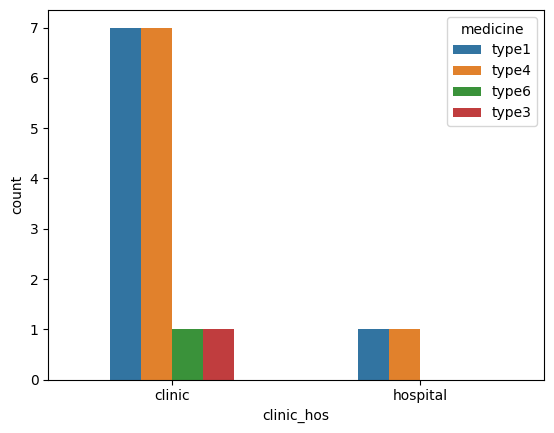

In [191]:
sns.countplot(data = a_im_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

In [192]:
a_im_8_1 = a_im_8[a_im_8["write"] == 1]

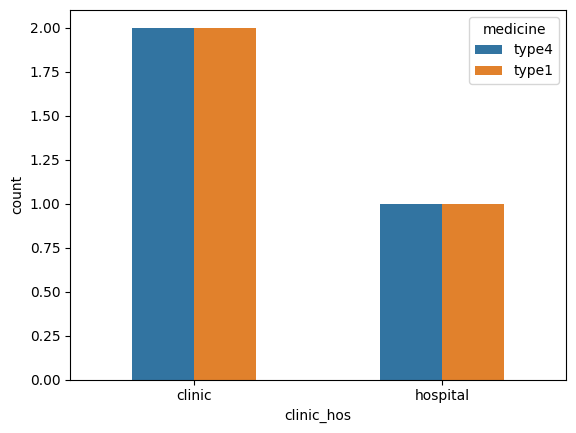

In [193]:
sns.countplot(data = a_im_8_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

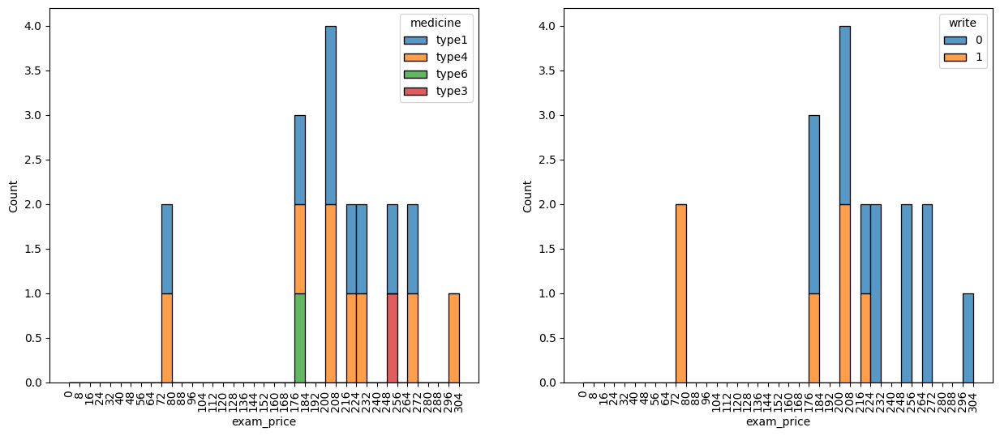

In [194]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_im_8["exam_price"].max() + 8 , 8)

sns.histplot(data = a_im_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_im_8["exam_price"].max() + 8 , 8)

sns.histplot(data = a_im_8, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

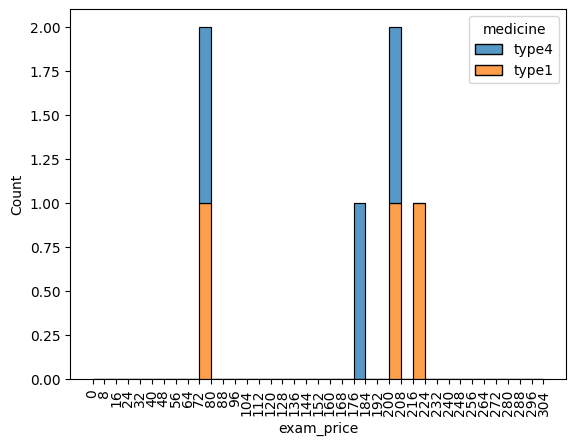

In [195]:
bins = np.arange(0 , a_im_8["exam_price"].max() + 8 , 8)

sns.histplot(data = a_im_8_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

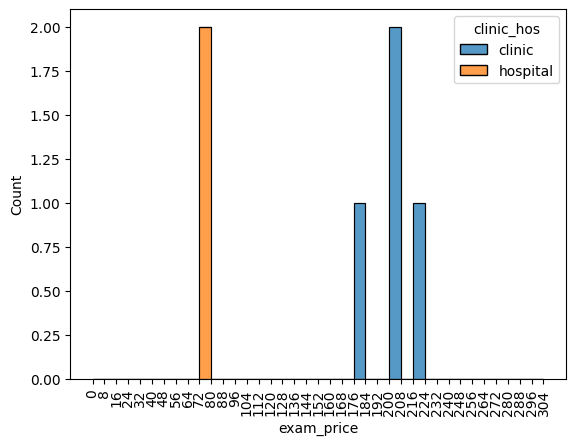

In [196]:
bins = np.arange(0 , a_im_8["exam_price"].max() + 8 , 8)

sns.histplot(data = a_im_8_1 , x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Im speciality and Area 8 Doctors 

In [197]:
b_im_8 = data[(data["speciality"] == "im") & (data["dr_class"] == "b") & (data["area"] == "area8")]

b_im_8

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
5,type5,29,area8,im,b,140,clinic,1
15,type3,24,area8,im,b,140,clinic,1
47,type4,36,area8,im,b,75,hospital,1
55,type6,20,area8,im,b,75,hospital,1
66,type1,45,area8,im,b,170,clinic,1
156,type1,45,area8,im,b,160,clinic,1
163,type6,20,area8,im,b,160,clinic,1
170,type3,24,area8,im,b,150,clinic,1
177,type6,20,area8,im,b,150,clinic,0
236,type1,45,area8,im,b,75,hospital,1


In [198]:
b_im_8["medicine"].value_counts()

medicine
type1    6
type4    4
type6    3
type3    2
type5    1
Name: count, dtype: int64

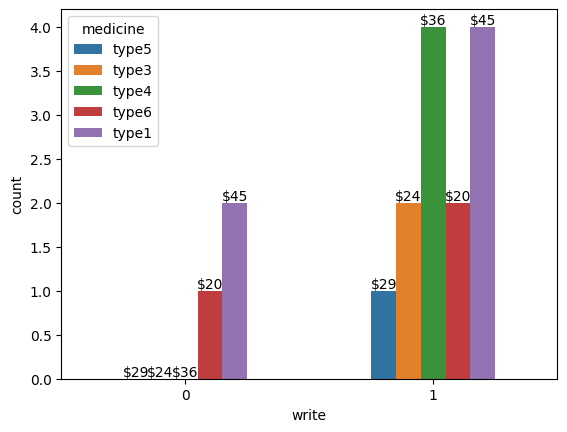

In [199]:
ax = sns.countplot(data = b_im_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_im_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 





for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

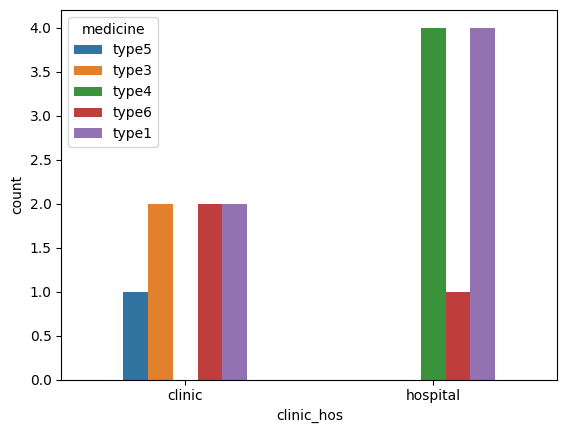

In [200]:
sns.countplot(data = b_im_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

In [201]:
b_im_8_1 = b_im_8[b_im_8["write"] == 1]

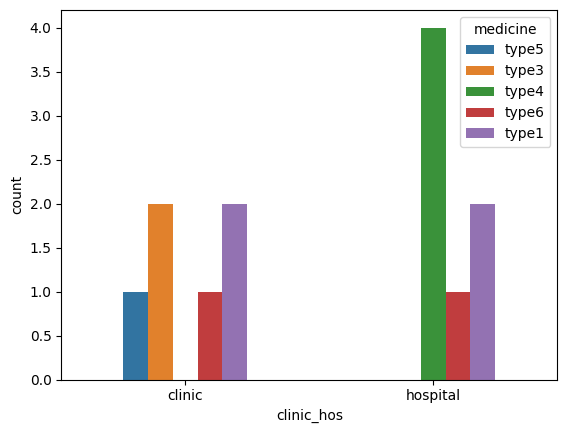

In [202]:
sns.countplot(data = b_im_8_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

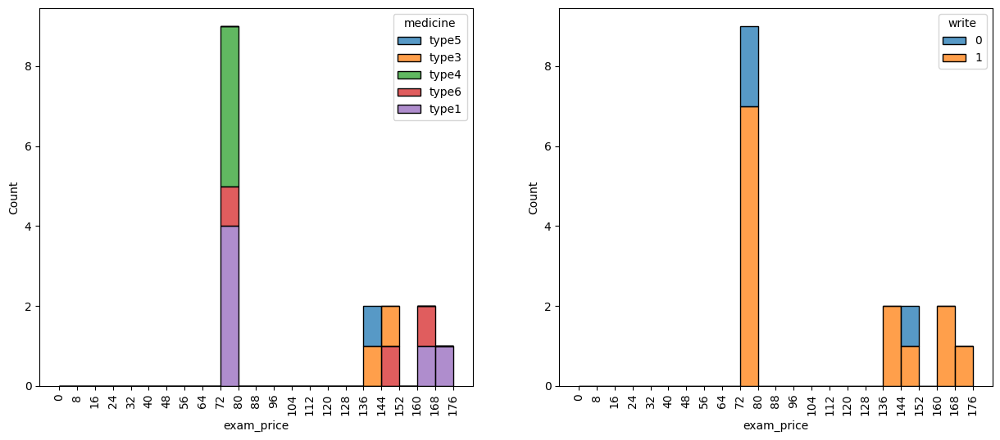

In [203]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_im_8["exam_price"].max() + 8 , 8)

sns.histplot(data = b_im_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_im_8["exam_price"].max() + 8 , 8)

sns.histplot(data = b_im_8, x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

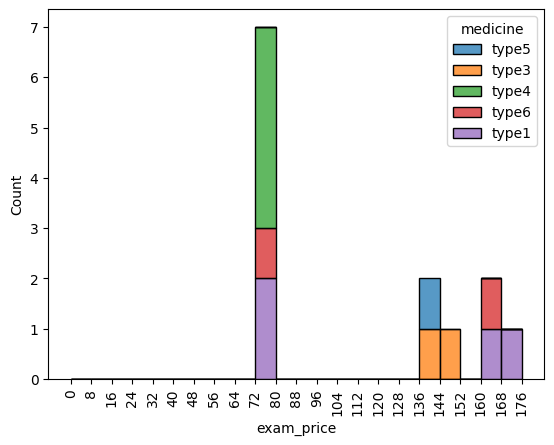

In [204]:
bins = np.arange(0 , b_im_8["exam_price"].max() + 8 , 8)

sns.histplot(data = b_im_8_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

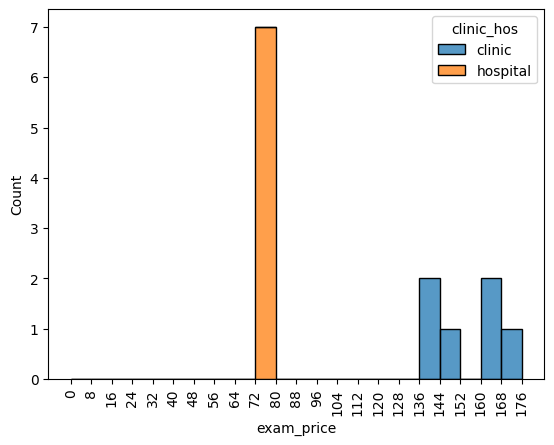

In [205]:
bins = np.arange(0 , b_im_8["exam_price"].max() + 8 , 8)

sns.histplot(data = b_im_8_1 , x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 8

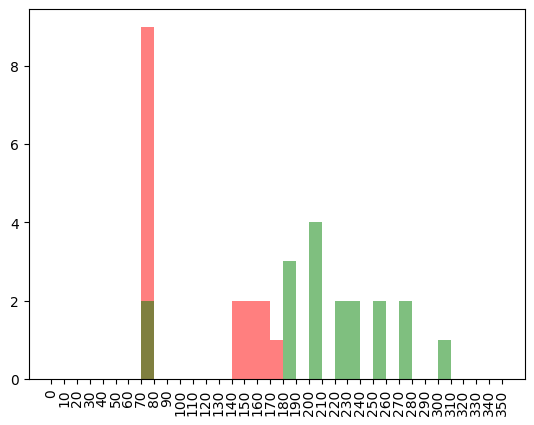

In [206]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_im_8 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_im_8 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Summary For Im Doctors Analysis

#### 70% Im dcotors in Class a write did not write 

#### Another 30% most write Type 1 and Type 4 

#### Type 5 written one time in hospital and 1 , 4 mos in clincs

#### Type 3 , 5 all in hospitals

In [207]:
im_a = data[(data["speciality"] == "im") & (data["dr_class"] == "a")]

im_a_1 = data[(data["speciality"] == "im") & (data["dr_class"] == "a") & (data["write"] == 1)]

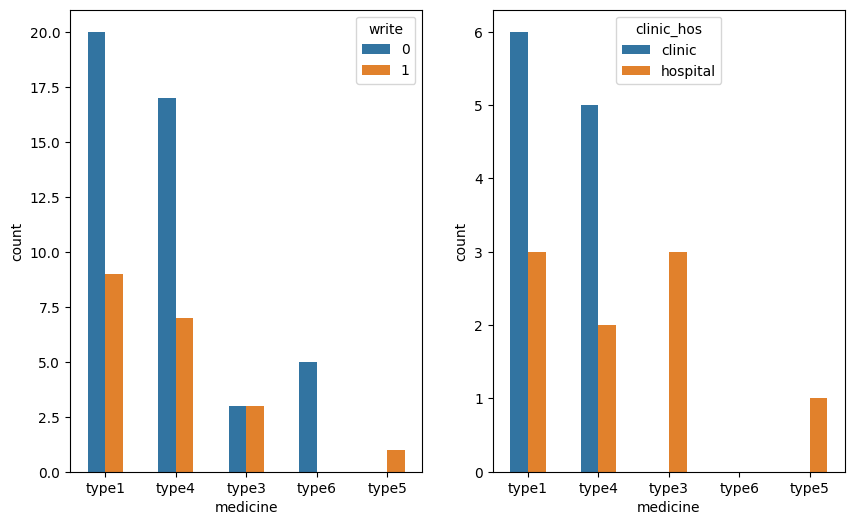

In [208]:
plt.figure(figsize = [10 , 6])



order = im_a["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = im_a , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = im_a_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

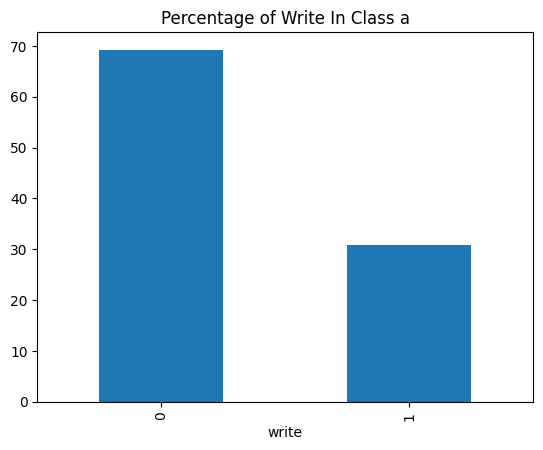

In [209]:
write_per = im_a["write"].value_counts().sort_values(ascending = False) / im_a.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class a");

#### 75% Im dcotors in Class b write 

#### They write Type 1 , 4 most and also cheapest Type 6 , 2 ,3 , 5

#### They write Type 2 ,  3 , 5  most in clinics and type 1 , 4 , 6 most in hospitals

In [210]:
im_b = data[(data["speciality"] == "im") & (data["dr_class"] == "b")]

im_b_1 = data[(data["speciality"] == "im") & (data["dr_class"] == "b") & (data["write"] == 1)]

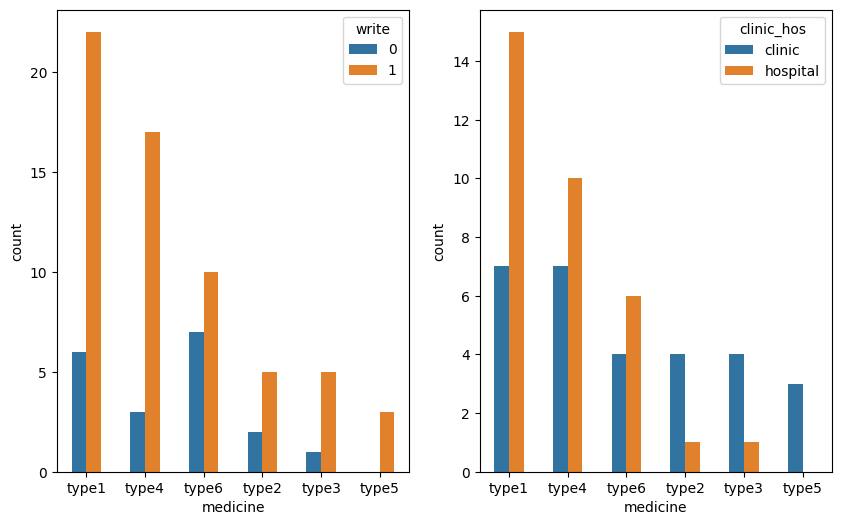

In [211]:
plt.figure(figsize = [10 , 6])



order = im_b["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = im_b , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = im_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

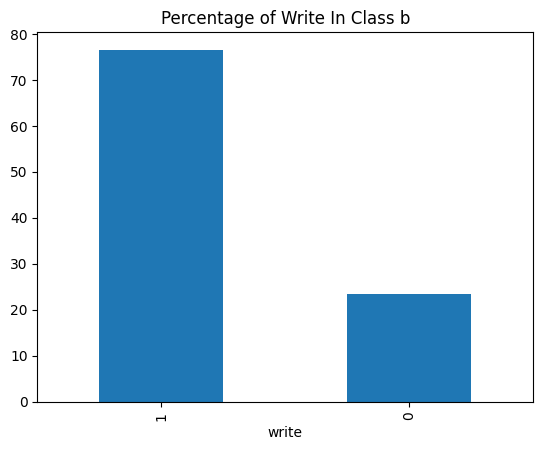

In [212]:
write_per = im_b["write"].value_counts().sort_values(ascending = False) / im_b.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class b");

### Class a with high ranges of exam price with type 1 , 4 in clincs

### Class a with low ranges of exam price with type 1 , 4 and other cheap medicines in hospitals

### Class be is more than class a and in low ranges with variant in medicines

In [213]:
im = data[(data["speciality"] == "im") & (data["write"] == 1)]

In [214]:
import plotly.express as px

fig = px.scatter(im , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

### Area 1 the the most exam price and class 1 

### Area 5 , 2 the the lowest exam price

In [215]:
import plotly.express as px

fig = px.scatter(im , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

### Class a areas most expensive exam price in area 1 , 8 , 6 

### Class a areas least expensive exam price in other areas are in hospitals 

In [216]:
im_a = im[im["dr_class"] == "a"]



import plotly.express as px

fig = px.scatter(im_a , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [217]:
fig= px.histogram(im, x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of im Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### The distribuation between class a and b

In [218]:
fig= px.histogram(im, x='exam_price',height=500,width=900,template='simple_white',

color='dr_class', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of Im Doctors by Class','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### Dstribuation of Areas

In [219]:
fig= px.histogram(im, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Im Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

#  cd Doctors

### Class a , cd speciality and Area 1 Doctors 

In [220]:
a_cd_1 = data[(data["speciality"] == "cd") & (data["dr_class"] == "a") & (data["area"] == "area1")]

In [221]:
a_cd_1["medicine"].value_counts()

medicine
type2    5
type3    1
Name: count, dtype: int64

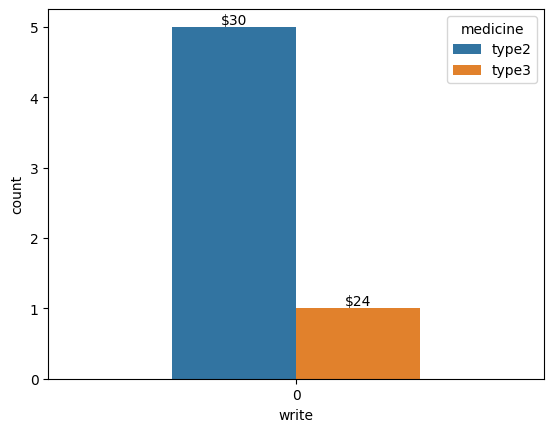

In [222]:
ax = sns.countplot(data = a_cd_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = a_cd_1['medicine'].unique()  



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

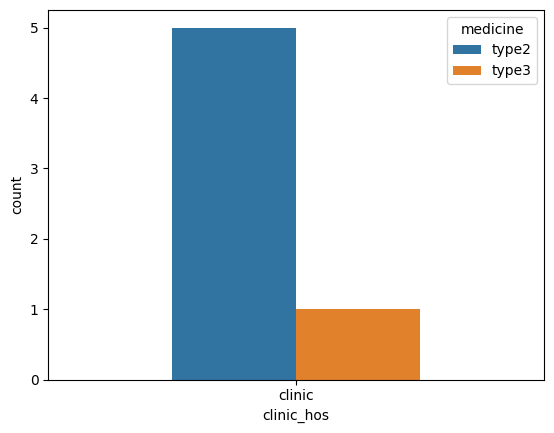

In [223]:
sns.countplot(data = a_cd_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

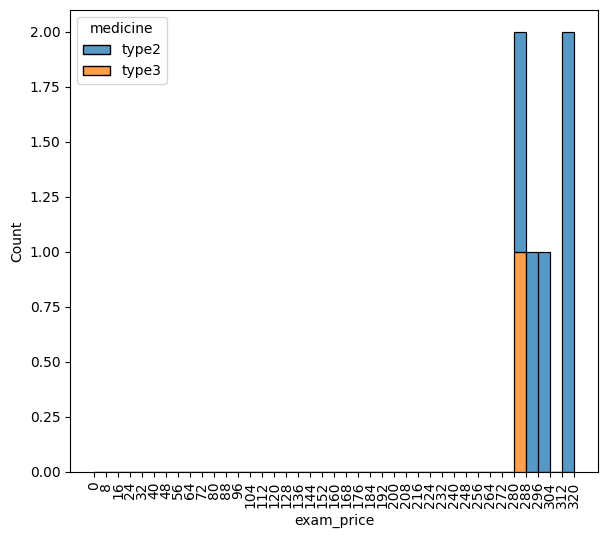

In [224]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_cd_1["exam_price"].max() + 8 , 8)

sns.histplot(data = a_cd_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , cd speciality and Area 1 Doctors 

In [225]:
b_cd_1 = data[(data["speciality"] == "cd") & (data["dr_class"] == "b") & (data["area"] == "area1")]

In [226]:
b_cd_1["medicine"].value_counts()

medicine
type2    1
Name: count, dtype: int64

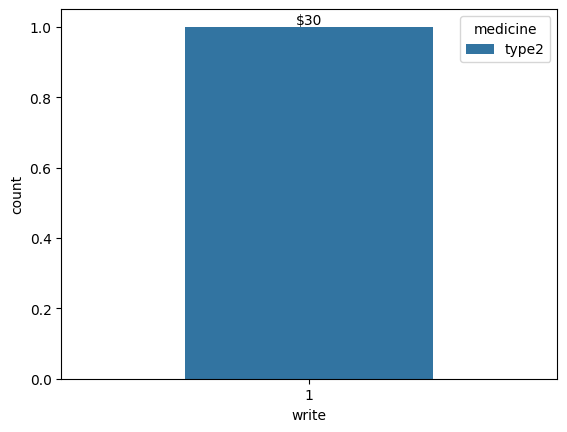

In [227]:
ax = sns.countplot(data = b_cd_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_cd_1['medicine'].unique()  



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

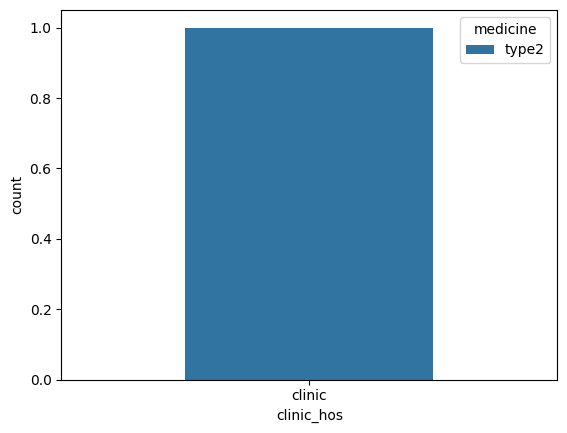

In [228]:
sns.countplot(data = b_cd_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

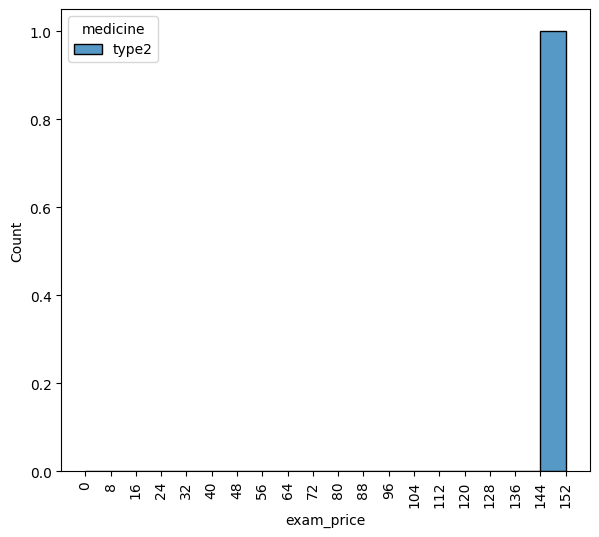

In [229]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_cd_1["exam_price"].max() + 8 , 8)

sns.histplot(data = b_cd_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 1

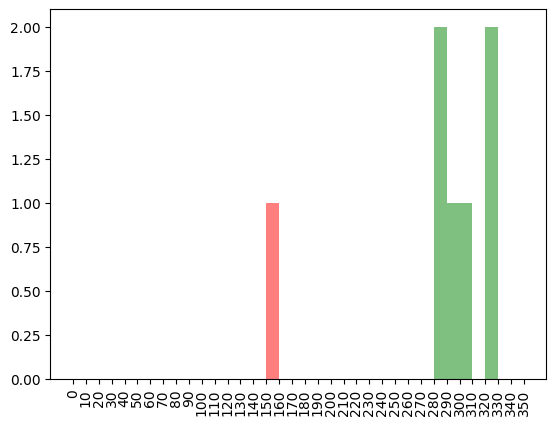

In [230]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_cd_1 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_cd_1 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , cd speciality and Area 2 Doctors 

In [231]:
a_cd_2 = data[(data["speciality"] == "cd") & (data["dr_class"] == "a") & (data["area"] == "area2")]

In [232]:
a_cd_2["medicine"].value_counts()

medicine
type2    2
type3    2
Name: count, dtype: int64

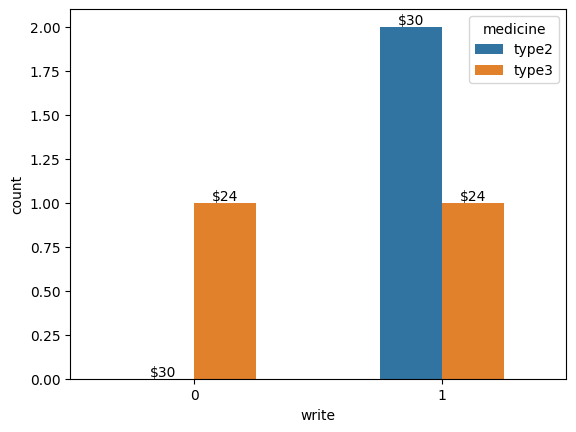

In [233]:
ax = sns.countplot(data = a_cd_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_cd_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

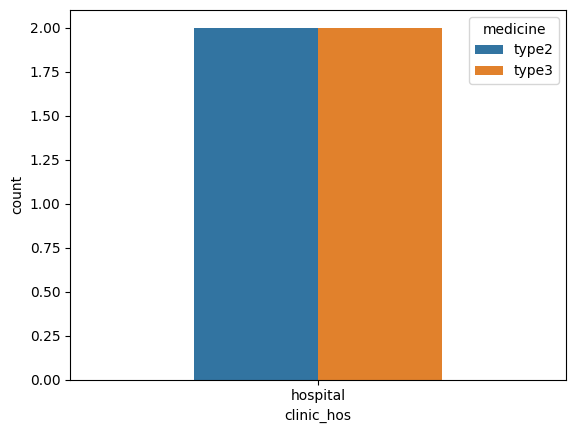

In [234]:
sns.countplot(data = a_cd_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

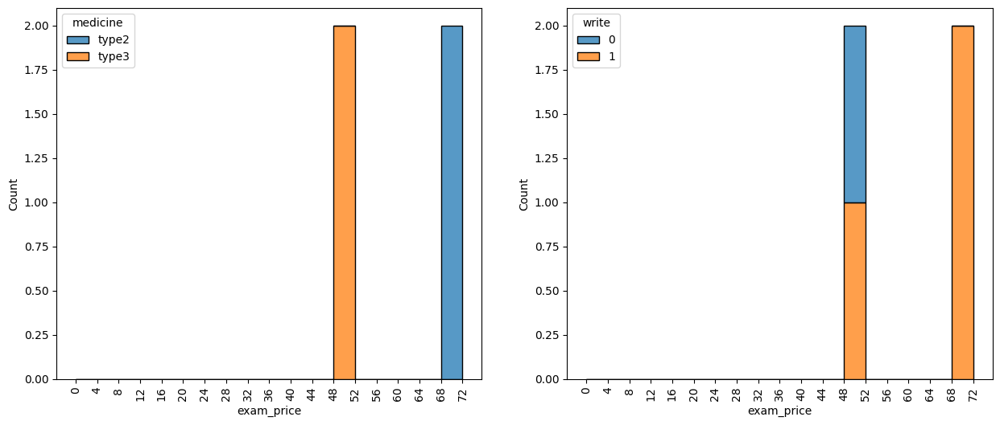

In [235]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_cd_2["exam_price"].max() + 4 , 4)

sns.histplot(data = a_cd_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_cd_2["exam_price"].max() + 4 , 4)

sns.histplot(data = a_cd_2 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [236]:
a_cd_2_1 = a_cd_2[a_cd_2["write"] == 1]

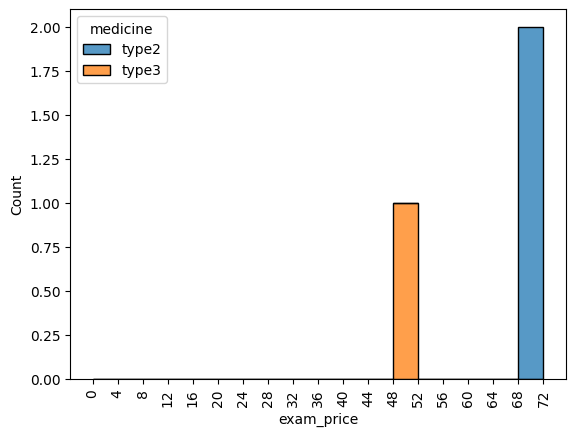

In [237]:
bins = np.arange(0 , a_cd_2["exam_price"].max() + 4 , 4)

sns.histplot(data = a_cd_2_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , cd speciality and Area 2 Doctors 

In [238]:
b_cd_2 = data[(data["speciality"] == "cd") & (data["dr_class"] == "b") & (data["area"] == "area2")]

In [239]:
b_cd_2["medicine"].value_counts()

medicine
type3    4
type2    1
type6    1
Name: count, dtype: int64

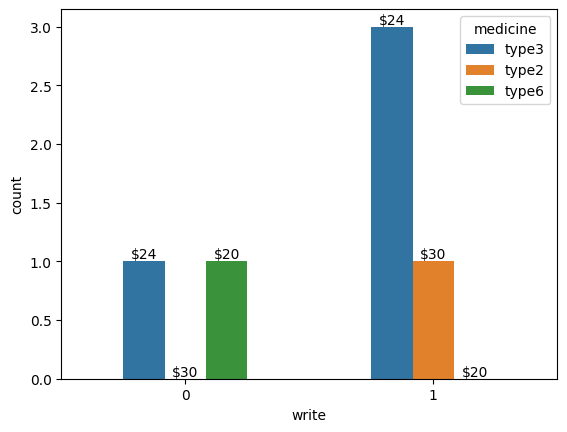

In [240]:
ax = sns.countplot(data = b_cd_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_cd_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

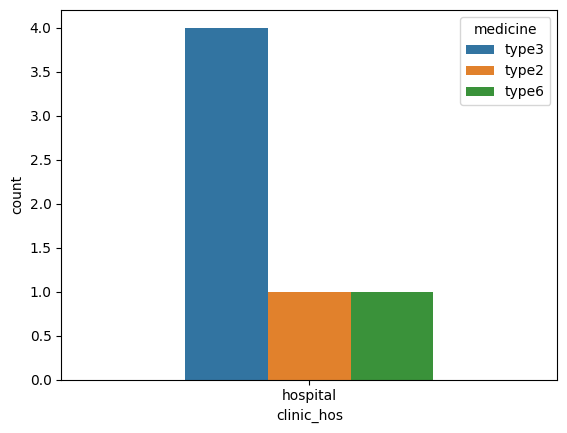

In [241]:
sns.countplot(data = b_cd_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

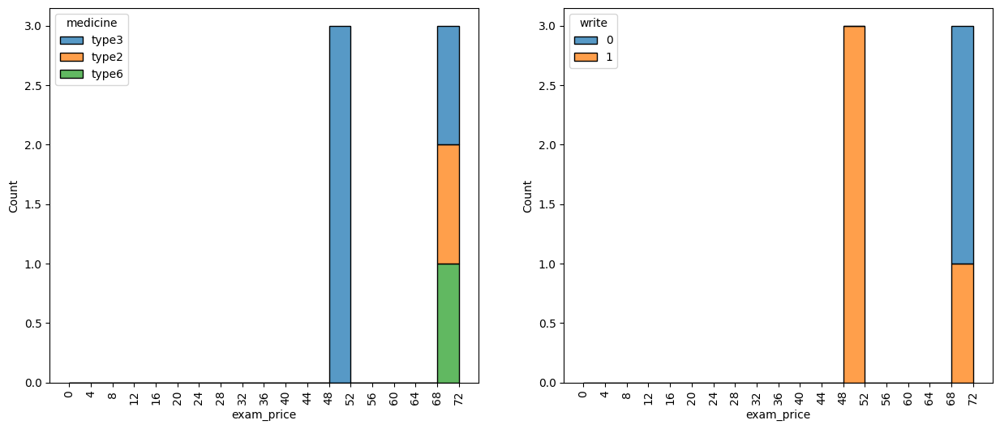

In [242]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_cd_2["exam_price"].max() + 4 , 4)

sns.histplot(data = b_cd_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_cd_2["exam_price"].max() + 4 , 4)

sns.histplot(data = b_cd_2 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [243]:
b_cd_2_1 = b_cd_2[b_cd_2["write"] == 1]

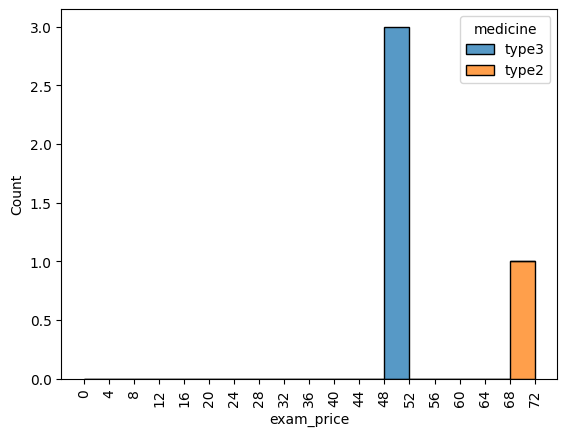

In [244]:
bins = np.arange(0 , b_cd_2["exam_price"].max() + 4 , 4)

sns.histplot(data = b_cd_2_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 2

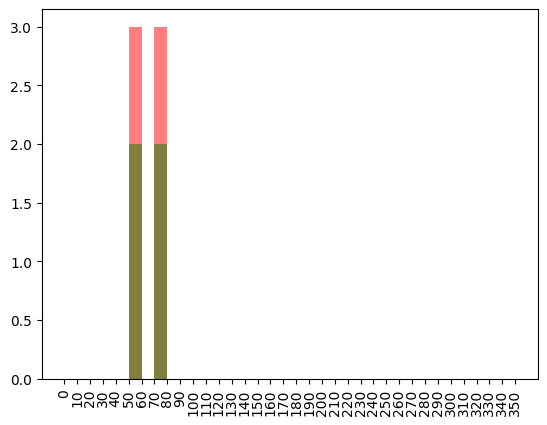

In [245]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_cd_2 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_cd_2 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , cd speciality and Area 3 Doctors 

In [246]:
a_cd_3 = data[(data["speciality"] == "cd") & (data["dr_class"] == "a") & (data["area"] == "area3")]

In [247]:
a_cd_3["medicine"].value_counts()

Series([], Name: count, dtype: int64)

### Class b , cd speciality and Area 3 Doctors 

In [248]:
b_cd_3 = data[(data["speciality"] == "cd") & (data["dr_class"] == "b") & (data["area"] == "area3")]

In [249]:
b_cd_3["medicine"].value_counts()

medicine
type2    3
Name: count, dtype: int64

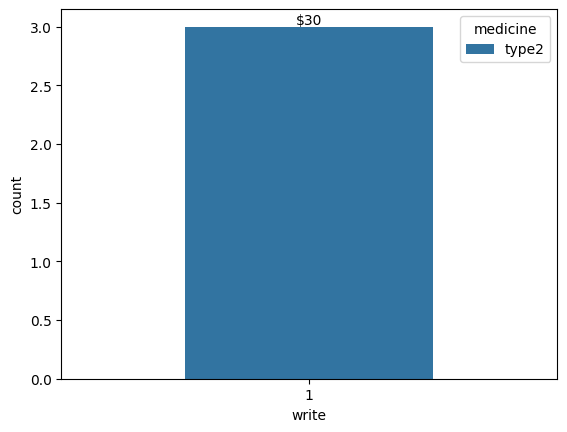

In [250]:
ax = sns.countplot(data = b_cd_3 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_cd_3['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

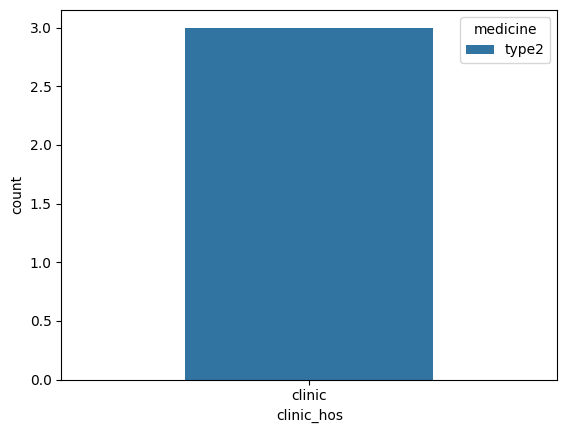

In [251]:
sns.countplot(data = b_cd_3 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

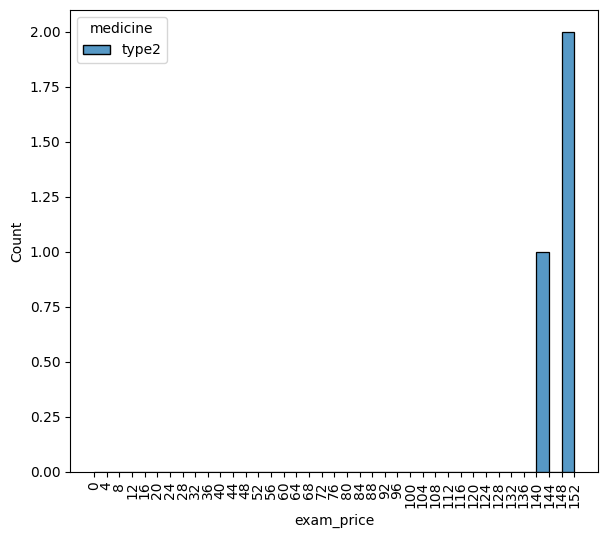

In [252]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_cd_3["exam_price"].max() + 4 , 4)

sns.histplot(data = b_cd_3 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , cd speciality and Area 5 Doctors 

In [253]:
a_cd_5 = data[(data["speciality"] == "cd") & (data["dr_class"] == "a") & (data["area"] == "area5")]

In [254]:
a_cd_5["medicine"].value_counts()

medicine
type2    5
type3    1
Name: count, dtype: int64

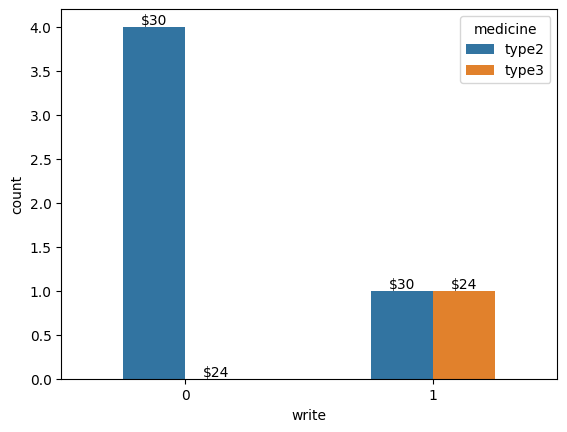

In [255]:
ax = sns.countplot(data = a_cd_5 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_cd_5['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

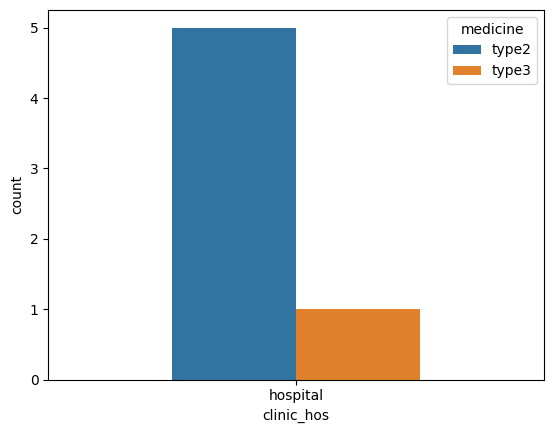

In [256]:
sns.countplot(data = a_cd_5 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

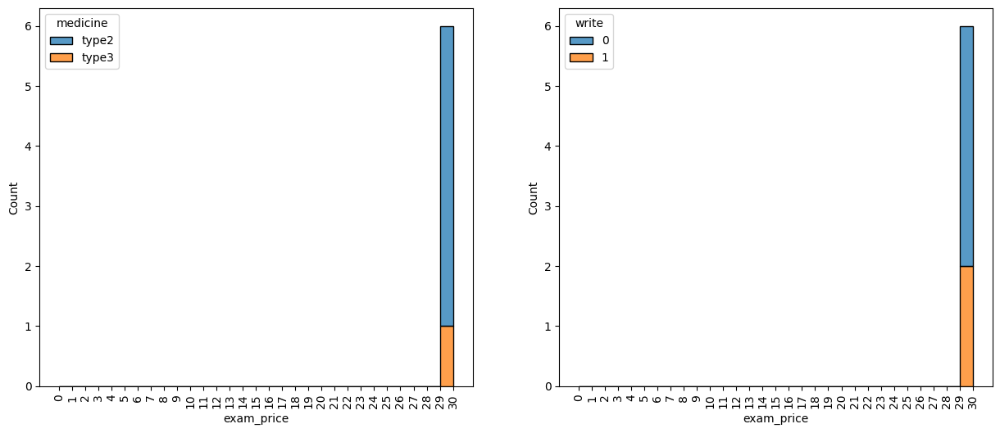

In [257]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_cd_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_cd_5 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_cd_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_cd_5 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [258]:
a_cd_5_1 = a_cd_5[a_cd_5["write"] == 1]

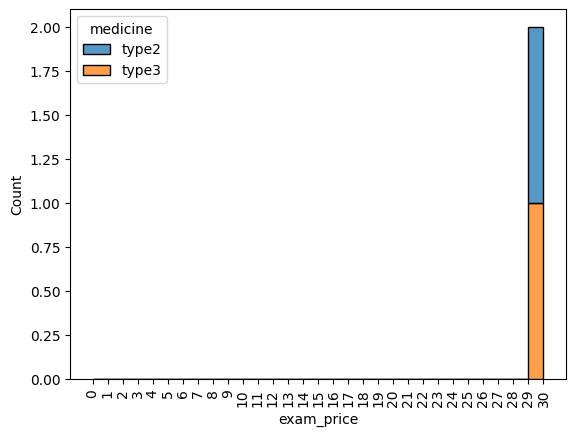

In [259]:
bins = np.arange(0 , a_cd_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_cd_5_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , cd speciality and Area 5 Doctors 

In [260]:
b_cd_5 = data[(data["speciality"] == "cd") & (data["dr_class"] == "b") & (data["area"] == "area5")]

In [261]:
b_cd_5["medicine"].value_counts()

medicine
type2    4
type3    1
Name: count, dtype: int64

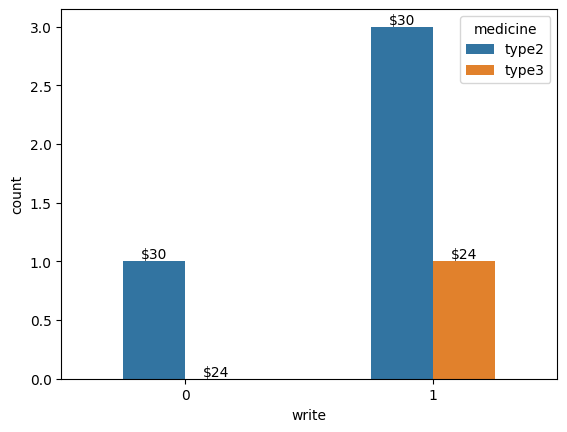

In [262]:
ax = sns.countplot(data = b_cd_5 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_cd_5['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

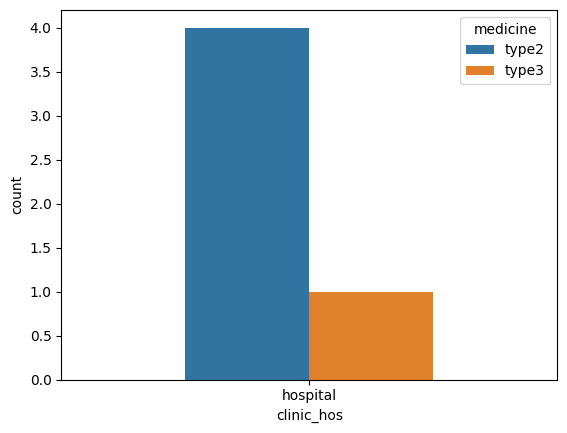

In [263]:
sns.countplot(data = b_cd_5 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

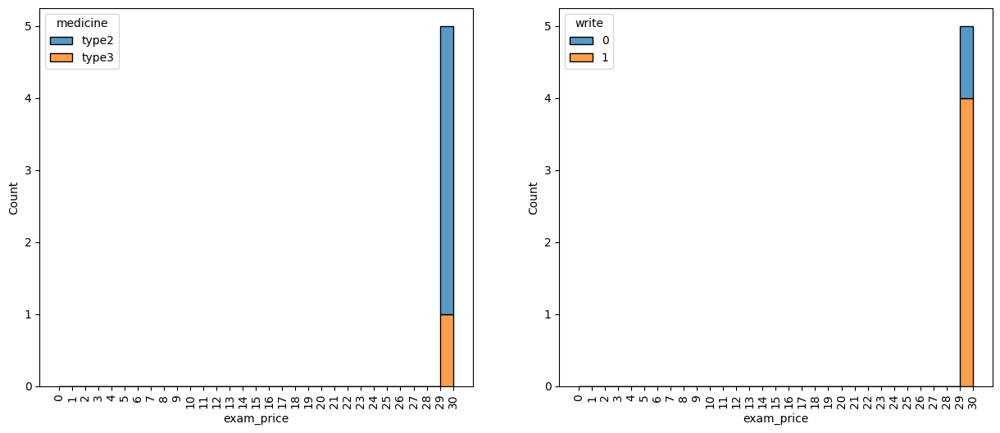

In [264]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_cd_5["exam_price"].max() + 1 , 1)

sns.histplot(data = b_cd_5 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_cd_5["exam_price"].max() + 1 , 1)

sns.histplot(data = b_cd_5 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [265]:
b_cd_5_1 = b_cd_5[b_cd_5["write"] == 1]

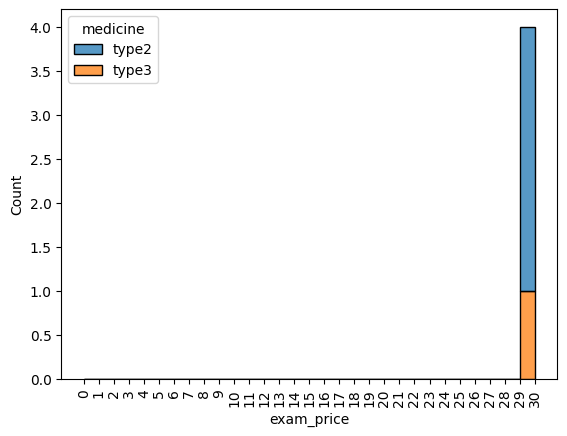

In [266]:
bins = np.arange(0 , b_cd_5["exam_price"].max() + 1 , 1)

sns.histplot(data = b_cd_5_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 5

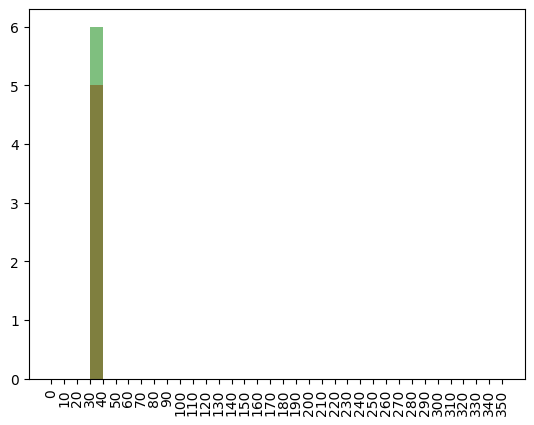

In [267]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_cd_5 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_cd_5 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , cd speciality and Area 6 Doctors 

In [268]:
a_cd_6 = data[(data["speciality"] == "cd") & (data["dr_class"] == "a") & (data["area"] == "area6")]

In [269]:
a_cd_6["medicine"].value_counts()

medicine
type3    4
type2    3
Name: count, dtype: int64

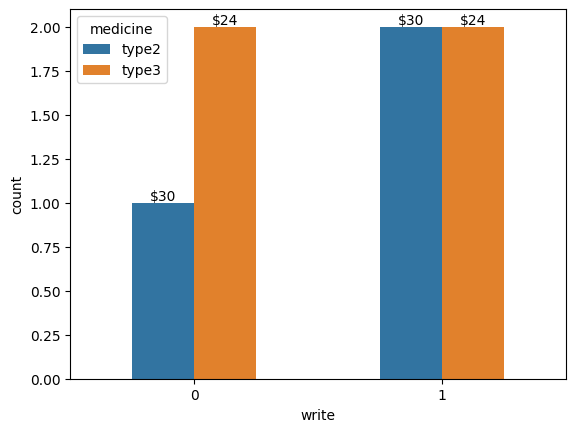

In [270]:
ax = sns.countplot(data = a_cd_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_cd_6['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

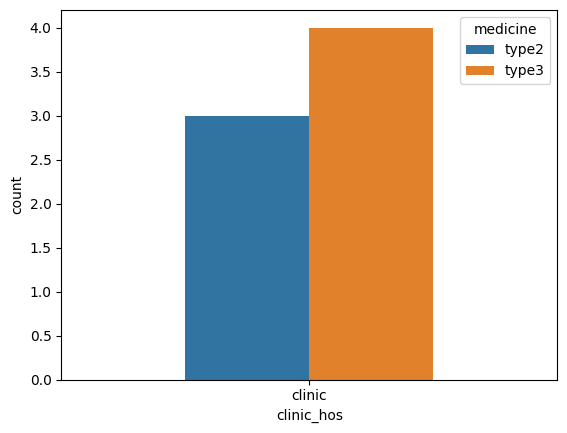

In [271]:
sns.countplot(data = a_cd_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

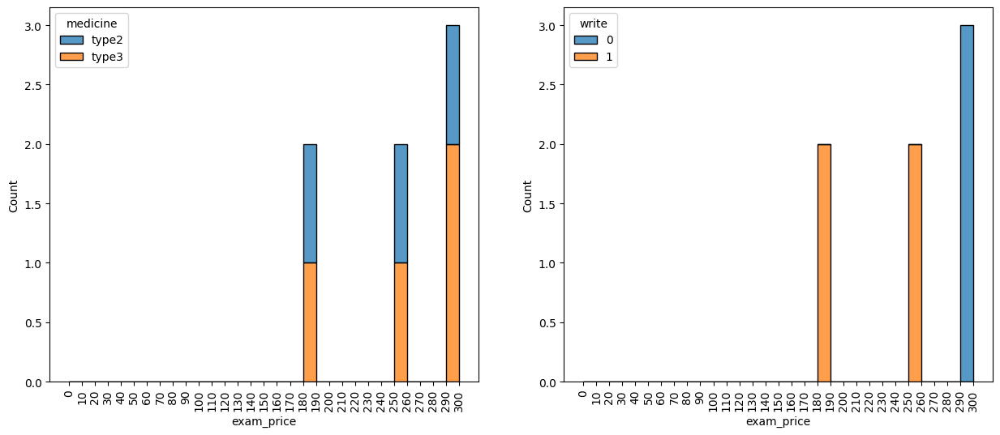

In [272]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_cd_6["exam_price"].max() + 10 , 10)

sns.histplot(data = a_cd_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_cd_6["exam_price"].max() + 10 , 10)

sns.histplot(data = a_cd_6 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [273]:
a_cd_6_1 = a_cd_6[a_cd_6["write"] == 1]

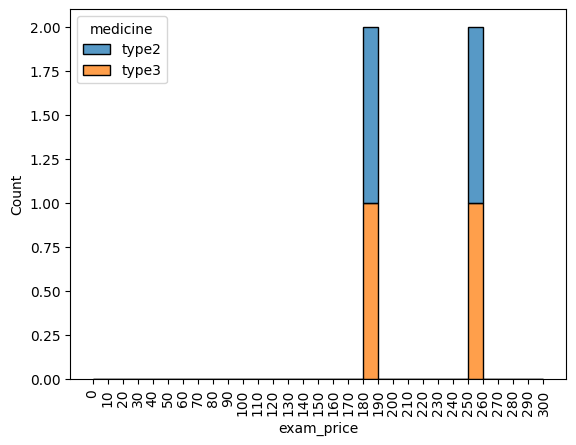

In [274]:
bins = np.arange(0 , a_cd_6["exam_price"].max() + 10 , 10)

sns.histplot(data = a_cd_6_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , cd speciality and Area 6 Doctors 

In [275]:
b_cd_6 = data[(data["speciality"] == "cd") & (data["dr_class"] == "b") & (data["area"] == "area6")]

In [276]:
b_cd_6["medicine"].value_counts()

medicine
type3    2
type2    1
Name: count, dtype: int64

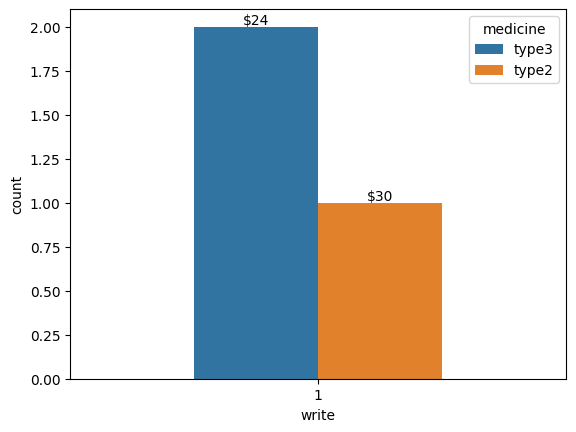

In [277]:
ax = sns.countplot(data = b_cd_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_cd_6['medicine'].unique()



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

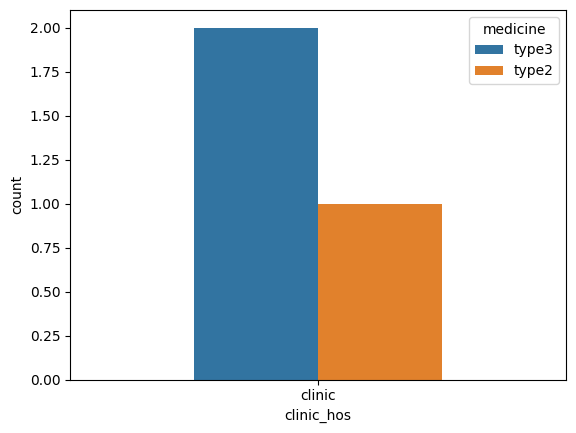

In [278]:
sns.countplot(data = b_cd_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

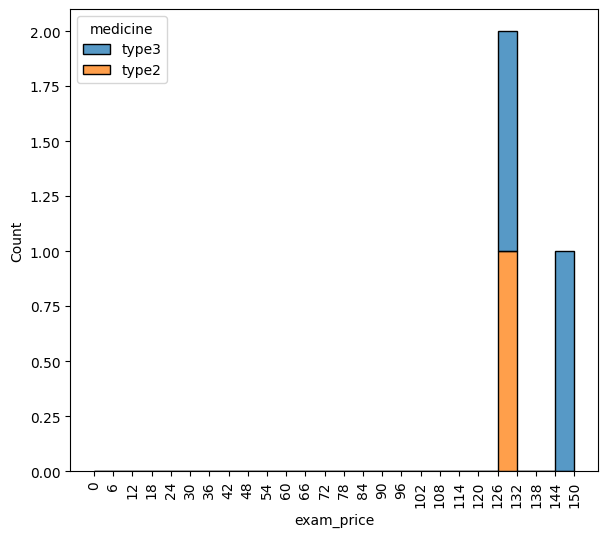

In [279]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_cd_6["exam_price"].max() + 6 , 6)

sns.histplot(data = b_cd_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 6

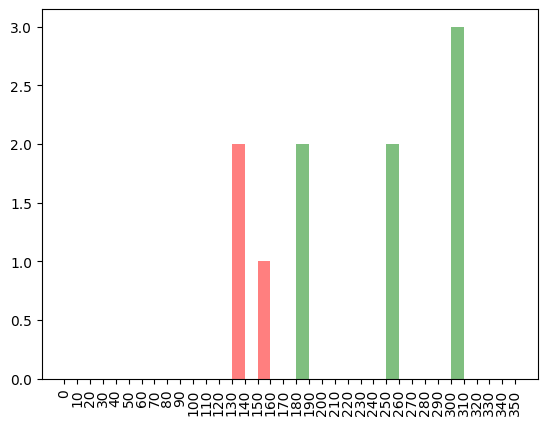

In [280]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_cd_6 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_cd_6 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , cd speciality and Area 7 Doctors 

In [281]:
a_cd_7 = data[(data["speciality"] == "cd") & (data["dr_class"] == "a") & (data["area"] == "area7")]

In [282]:
a_cd_7["medicine"].value_counts()

medicine
type2    1
Name: count, dtype: int64

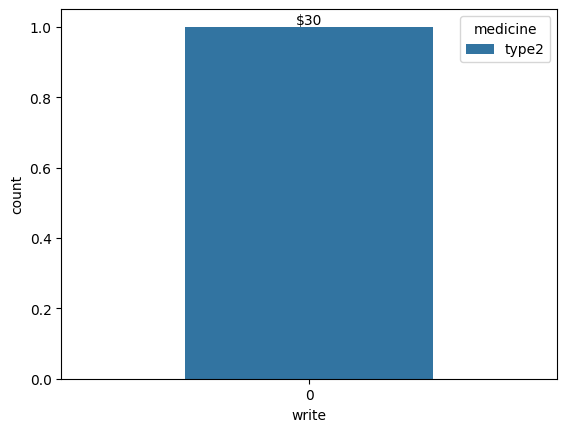

In [283]:
ax = sns.countplot(data = a_cd_7 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_cd_7['medicine'].unique())  



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

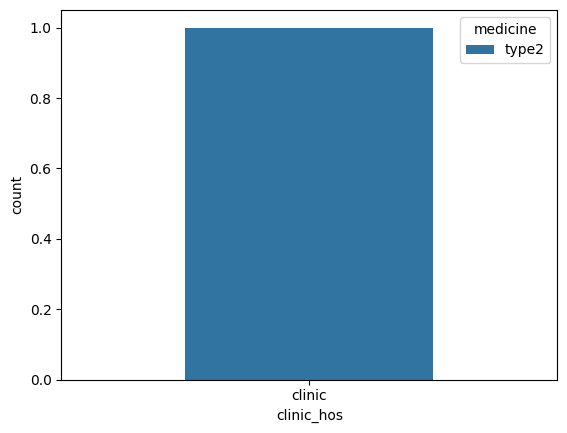

In [284]:
sns.countplot(data = a_cd_7 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

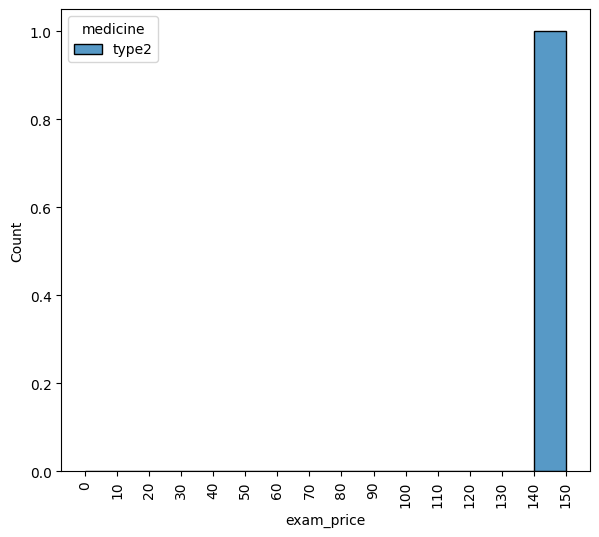

In [285]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_cd_7["exam_price"].max() + 10 , 10)

sns.histplot(data = a_cd_7 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , cd speciality and Area 7 Doctors 

In [286]:
b_cd_7 = data[(data["speciality"] == "cd") & (data["dr_class"] == "b") & (data["area"] == "area7")]

In [287]:
b_cd_7["medicine"].value_counts()

medicine
type2    2
Name: count, dtype: int64

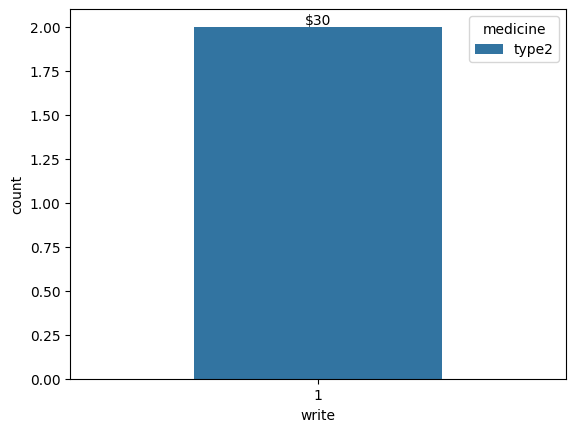

In [288]:
ax = sns.countplot(data = b_cd_7 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_cd_7['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

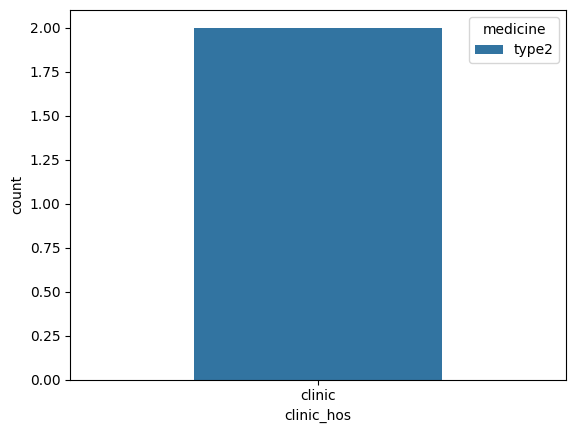

In [289]:
sns.countplot(data = b_cd_7 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

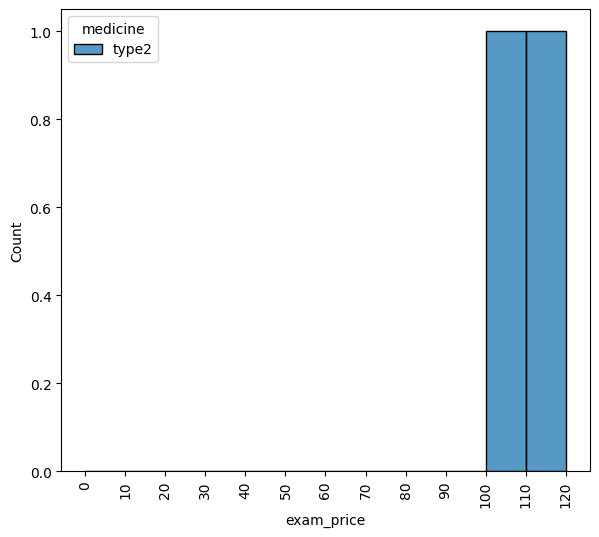

In [290]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_cd_7["exam_price"].max() + 10 , 10)

sns.histplot(data = b_cd_7 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 7

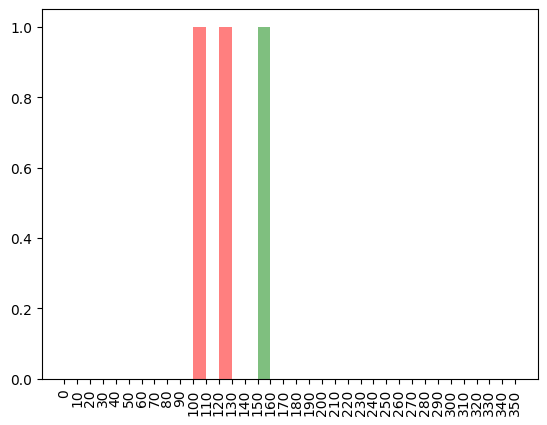

In [291]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_cd_7 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_cd_7 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , cd speciality and Area 8 Doctors 

In [292]:
a_cd_8 = data[(data["speciality"] == "cd") & (data["dr_class"] == "a") & (data["area"] == "area8")]

In [293]:
a_cd_8["medicine"].value_counts()

medicine
type2    1
type3    1
Name: count, dtype: int64

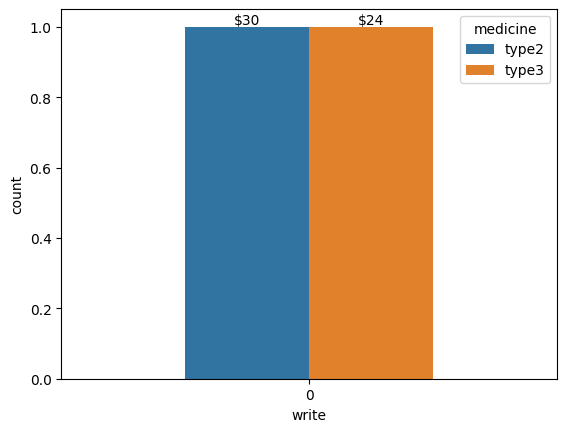

In [294]:
ax = sns.countplot(data = a_cd_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = a_cd_8['medicine'].unique()  



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

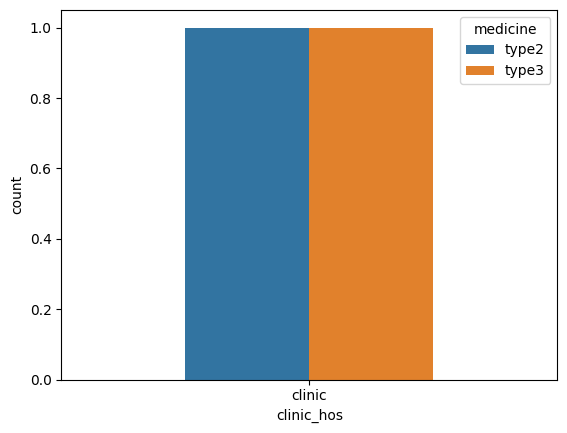

In [295]:
sns.countplot(data = a_cd_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

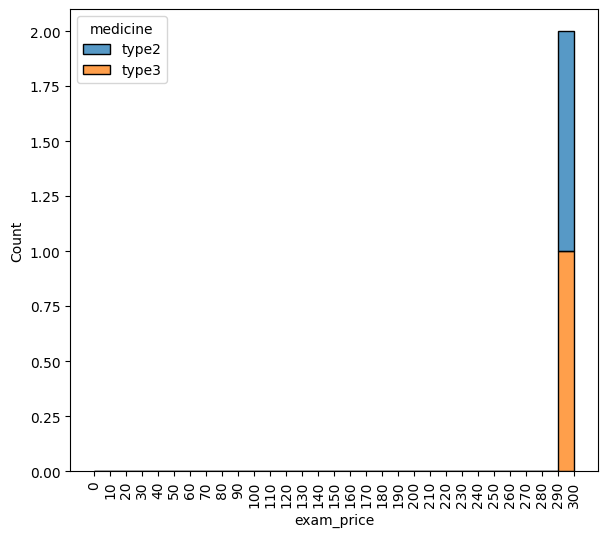

In [296]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_cd_8["exam_price"].max() + 10 , 10)

sns.histplot(data = a_cd_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , cd speciality and Area 8 Doctors 

In [297]:
b_cd_8 = data[(data["speciality"] == "cd") & (data["dr_class"] == "b") & (data["area"] == "area8")]

In [298]:
b_cd_8["medicine"].value_counts()

medicine
type3    1
type2    1
Name: count, dtype: int64

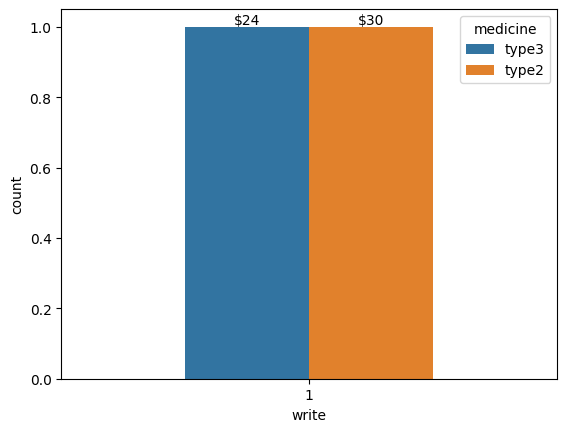

In [299]:
ax = sns.countplot(data = b_cd_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_cd_8['medicine'].unique()  



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

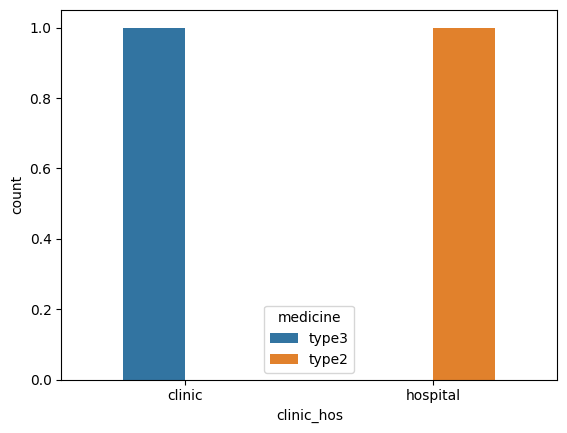

In [300]:
sns.countplot(data = b_cd_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

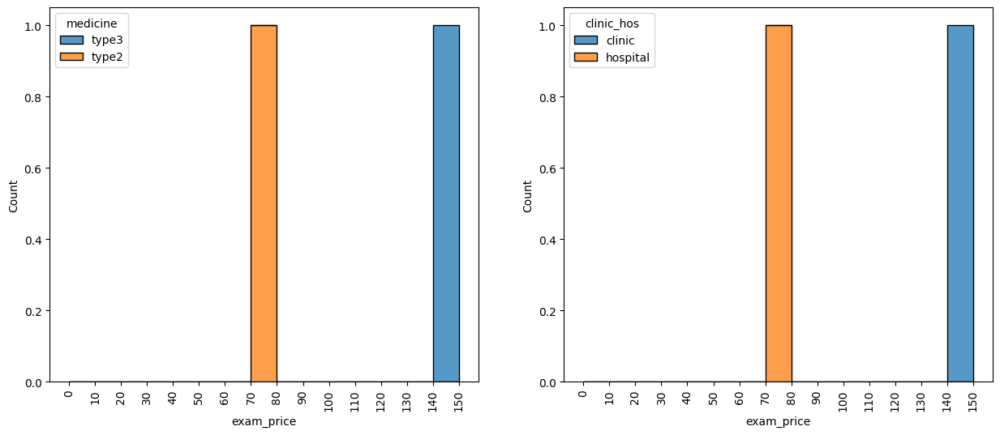

In [301]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_cd_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_cd_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_cd_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_cd_8 , x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 8

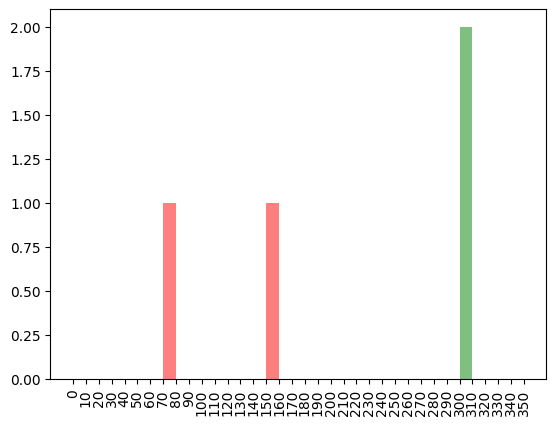

In [302]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_cd_8 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_cd_8 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Summary For cd Doctors Analysis

#### 65% cd dcotors in Class a did not write 

#### Another 35% most write Type 3 and Type 2 but the Type 3 is higher as percentage

#### Type 2 written most in in hospitals and Type 3 50%

In [303]:
cd_a = data[(data["speciality"] == "cd") & (data["dr_class"] == "a")]

cd_a_1 = data[(data["speciality"] == "cd") & (data["dr_class"] == "a") & (data["write"] == 1)]

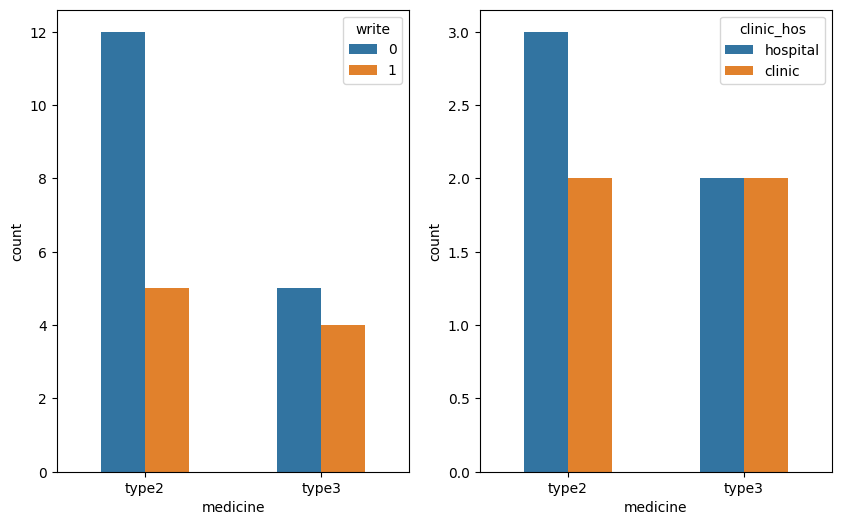

In [304]:
plt.figure(figsize = [10 , 6])



order = cd_a["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = cd_a , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = cd_a_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

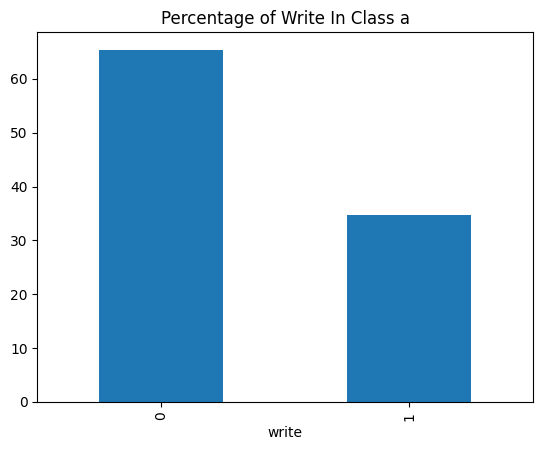

In [305]:
write_per = cd_a["write"].value_counts().sort_values(ascending = False) / cd_a.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class a");

#### 85% Im dcotors in Class b write 

#### They write type 2 most and 3 

#### They write Type 2 More in clincs

#### Type 3 most in hospitals

In [306]:
cd_b = data[(data["speciality"] == "cd") & (data["dr_class"] == "b")]

cd_b_1 = data[(data["speciality"] == "cd") & (data["dr_class"] == "b") & (data["write"] == 1)]

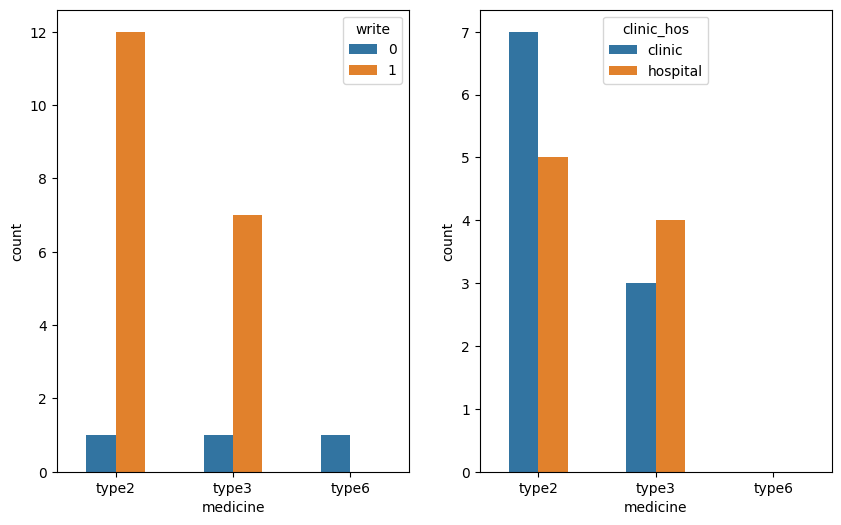

In [307]:
plt.figure(figsize = [10 , 6])



order = cd_b["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = cd_b , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = cd_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

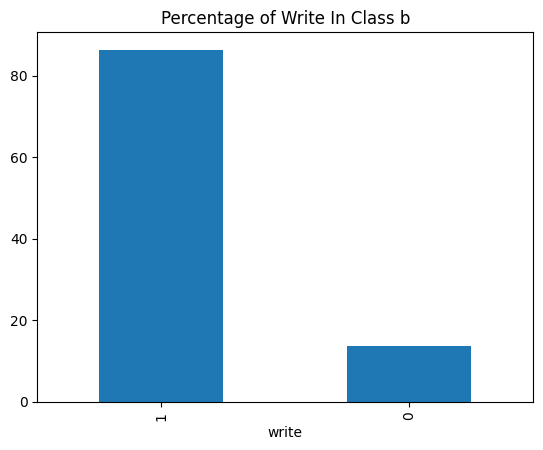

In [308]:
write_per = cd_b["write"].value_counts().sort_values(ascending = False) / cd_b.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class b");

### Class with high range of exam price is in clinics 

### Class with low range of exam price is in hospitlals

### Class b in low exam price range

In [309]:
cd_1 = data[(data["speciality"] == "cd") & (data["write"] == 1)]

In [310]:
import plotly.express as px

fig = px.scatter(cd_1 , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

### The highst exam price range area is area 6 in Class a

### The lowest exam price range area is area 5 in class a but hospitals

In [311]:
import plotly.express as px

fig = px.scatter(cd_1 , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [312]:
cd_a = cd_1[cd_1["dr_class"] == "a"]



import plotly.express as px

fig = px.scatter(cd_a , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [313]:
fig= px.histogram(cd_1 , x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of im Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

In [314]:
cd_250_290 = cd_1[(cd_1["exam_price"] >= 250) & (cd_1["exam_price"] <= 290)]

cd_250_290

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
344,type2,30,area6,cd,a,250,clinic,1
348,type3,24,area6,cd,a,250,clinic,1


### The distribuation of Classes

In [315]:
fig= px.histogram(cd_1 , x='exam_price',height=500,width=900,template='simple_white',

color='dr_class', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of Im Doctors by Class','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### The distribuation of Areas

In [316]:
fig= px.histogram(cd_1, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Im Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

#  Sur Doctors

### Class a , Sur speciality and Area 2 Doctors 

In [317]:
a_sur_2 = data[(data["speciality"] == "sur") & (data["dr_class"] == "a") & (data["area"] == "area2")]

In [318]:
a_sur_2["medicine"].value_counts()

medicine
type1    4
type5    2
type4    1
Name: count, dtype: int64

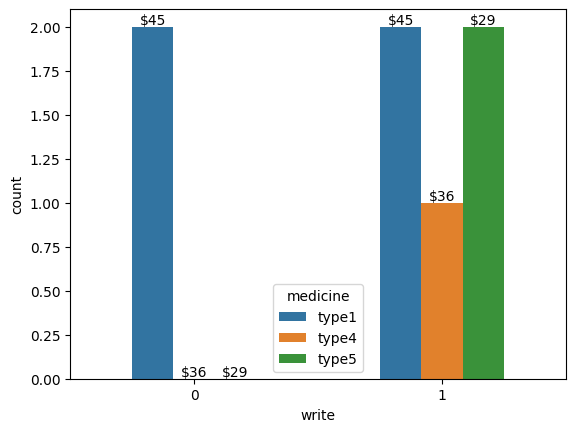

In [319]:
ax = sns.countplot(data = a_sur_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_sur_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

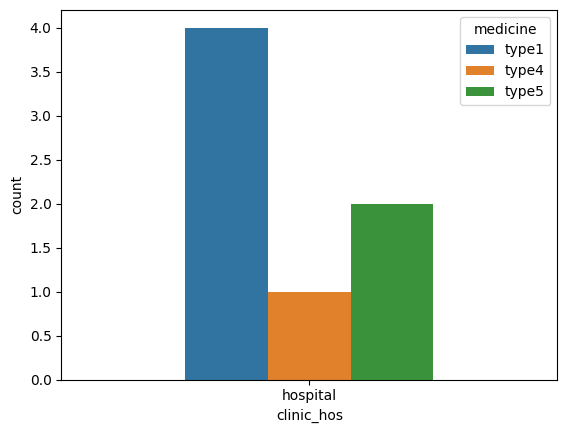

In [320]:
sns.countplot(data = a_sur_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

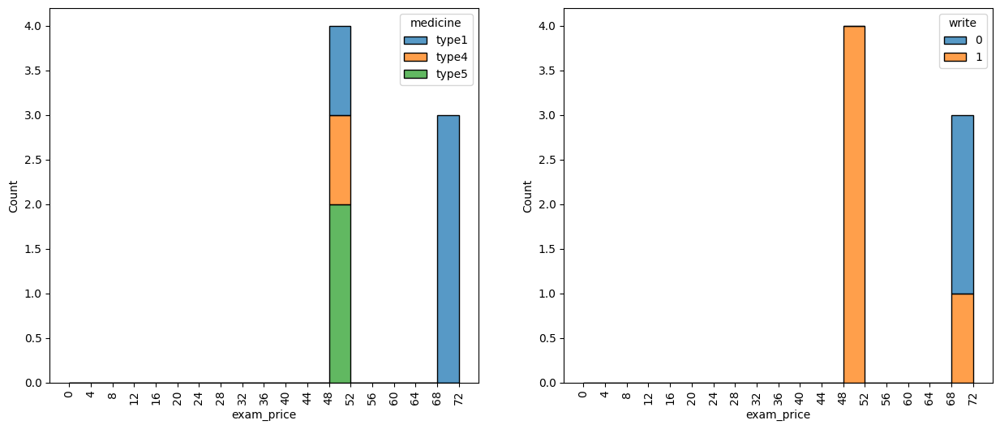

In [321]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_sur_2["exam_price"].max() + 4 , 4)

sns.histplot(data = a_sur_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_sur_2["exam_price"].max() + 4 , 4)

sns.histplot(data = a_sur_2 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [322]:
a_sur_2_1 = a_sur_2[a_sur_2["write"] == 1]

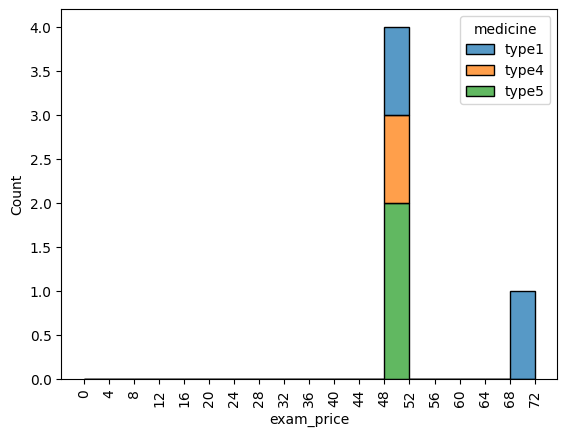

In [323]:
bins = np.arange(0 , a_sur_2["exam_price"].max() + 4 , 4)

sns.histplot(data = a_sur_2_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Sur speciality and Area 2 Doctors 

In [324]:
b_sur_2 = data[(data["speciality"] == "sur") & (data["dr_class"] == "b") & (data["area"] == "area2")]

In [325]:
b_sur_2["medicine"].value_counts()

medicine
type1    7
type4    3
type5    2
Name: count, dtype: int64

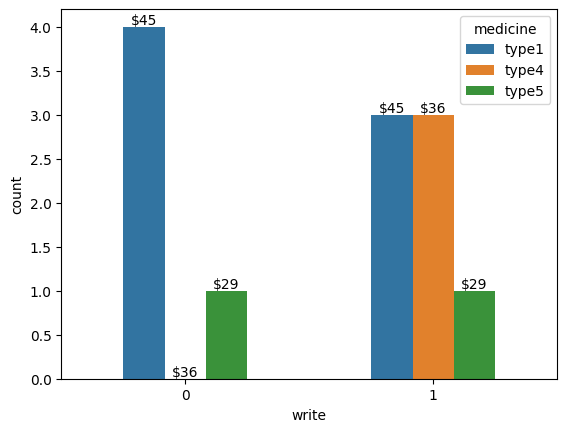

In [326]:
ax = sns.countplot(data = b_sur_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_sur_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

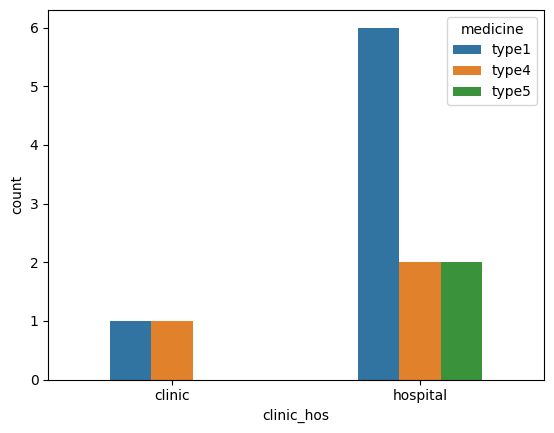

In [327]:
sns.countplot(data = b_sur_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

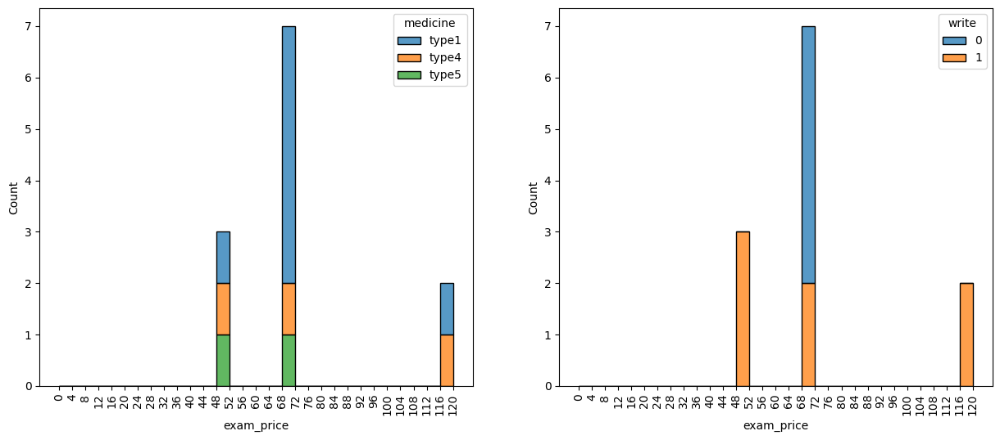

In [328]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_sur_2["exam_price"].max() + 4 , 4)

sns.histplot(data = b_sur_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_sur_2["exam_price"].max() + 4 , 4)

sns.histplot(data = b_sur_2 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [329]:
b_sur_2_1 = b_sur_2[b_sur_2["write"] == 1]

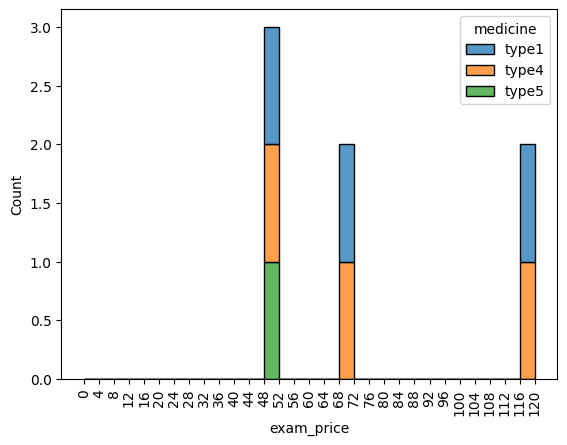

In [330]:
bins = np.arange(0 , b_sur_2["exam_price"].max() + 4 , 4)

sns.histplot(data = b_sur_2_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

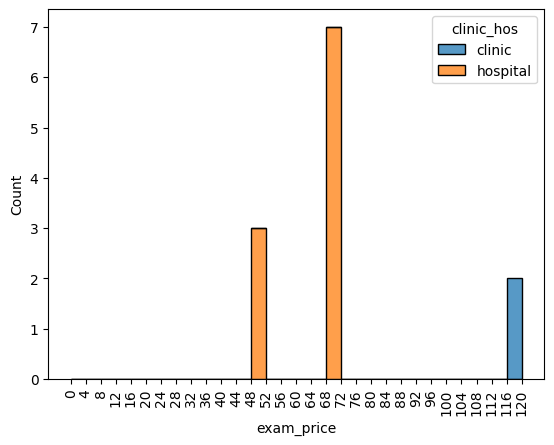

In [331]:
bins = np.arange(0 , b_sur_2["exam_price"].max() + 4 , 4)

sns.histplot(data = b_sur_2 , x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

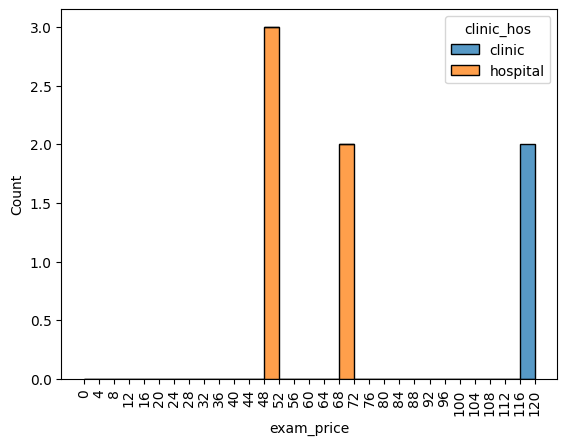

In [332]:
bins = np.arange(0 , b_sur_2["exam_price"].max() + 4 , 4)

sns.histplot(data = b_sur_2_1 , x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 2

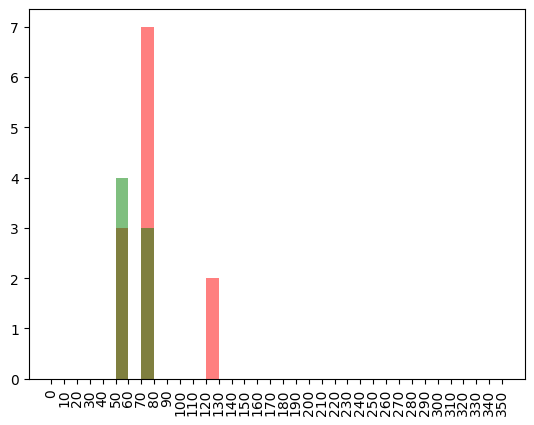

In [333]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_sur_2 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_sur_2 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , Sur speciality and Area 4 Doctors 

In [334]:
a_sur_4 = data[(data["speciality"] == "sur") & (data["dr_class"] == "a") & (data["area"] == "area4")]

In [335]:
a_sur_4["medicine"].value_counts()

medicine
type5    2
Name: count, dtype: int64

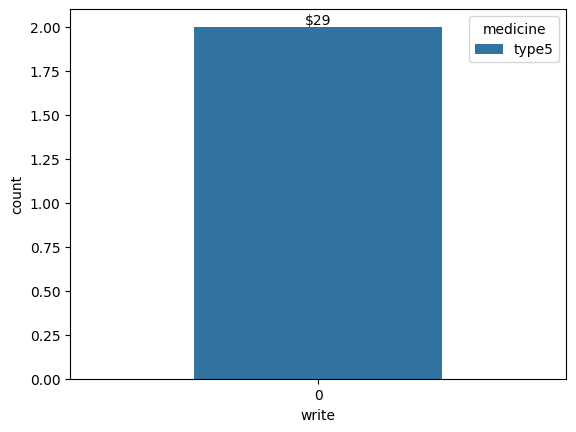

In [336]:
ax = sns.countplot(data = a_sur_4 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_sur_4['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

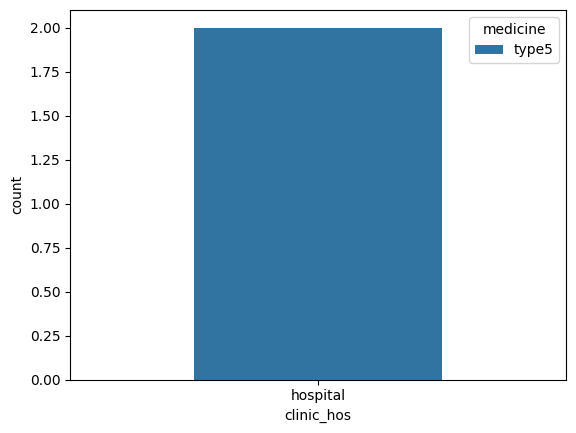

In [337]:
sns.countplot(data = a_sur_4 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

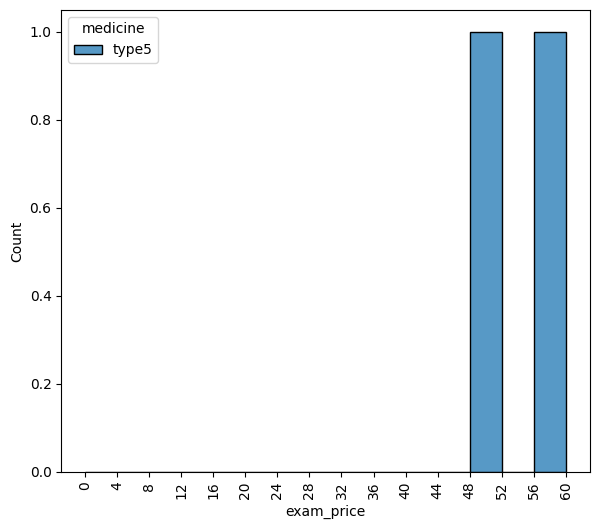

In [338]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_sur_4["exam_price"].max() + 4 , 4)

sns.histplot(data = a_sur_4 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Sur speciality and Area 4 Doctors 

In [339]:
b_sur_4 = data[(data["speciality"] == "sur") & (data["dr_class"] == "b") & (data["area"] == "area4")]

In [340]:
b_sur_4["medicine"].value_counts()

medicine
type5    1
Name: count, dtype: int64

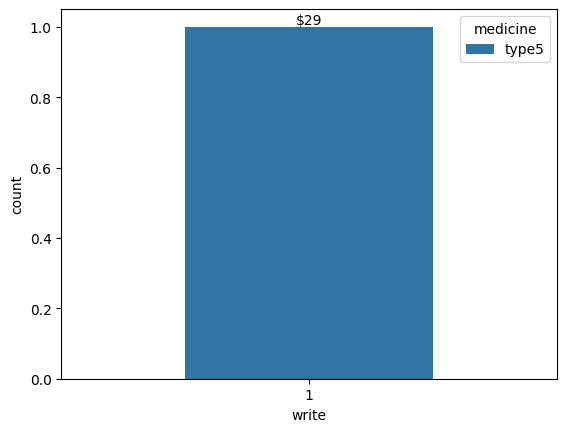

In [341]:
ax = sns.countplot(data = b_sur_4 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_sur_4['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

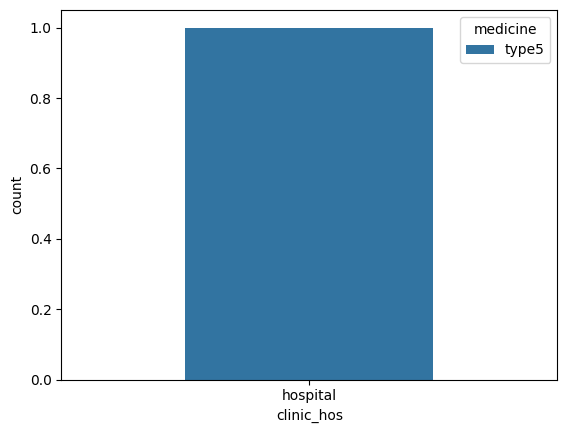

In [342]:
sns.countplot(data = b_sur_4 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

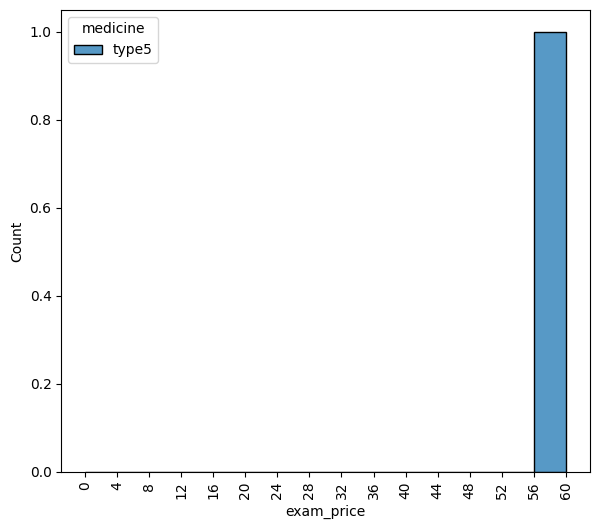

In [343]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_sur_4["exam_price"].max() + 4 , 4)

sns.histplot(data = b_sur_4 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , Sur speciality and Area 5 Doctors 

In [344]:
a_sur_5 = data[(data["speciality"] == "sur") & (data["dr_class"] == "a") & (data["area"] == "area5")]

In [345]:
a_sur_5["medicine"].value_counts()

medicine
type1    4
type4    1
Name: count, dtype: int64

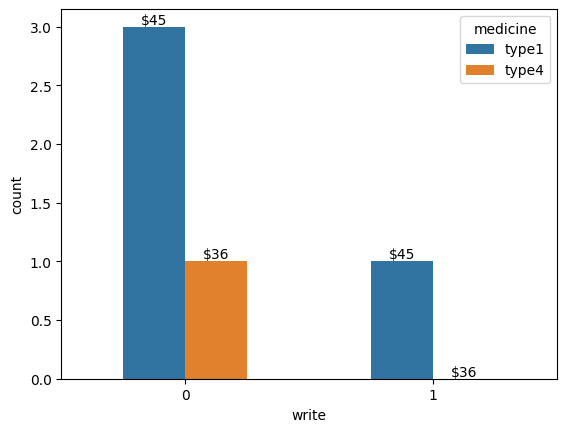

In [346]:
ax = sns.countplot(data = a_sur_5 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_sur_5['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

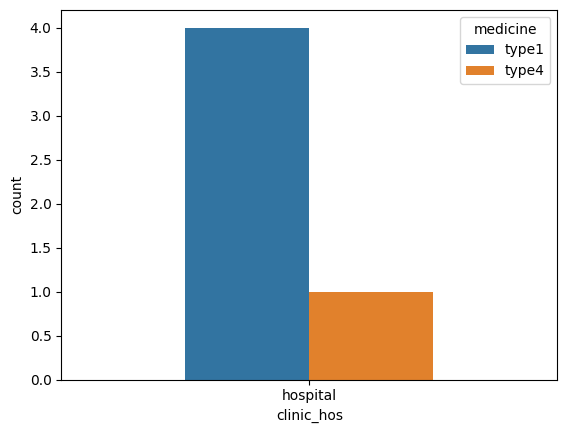

In [347]:
sns.countplot(data = a_sur_5 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

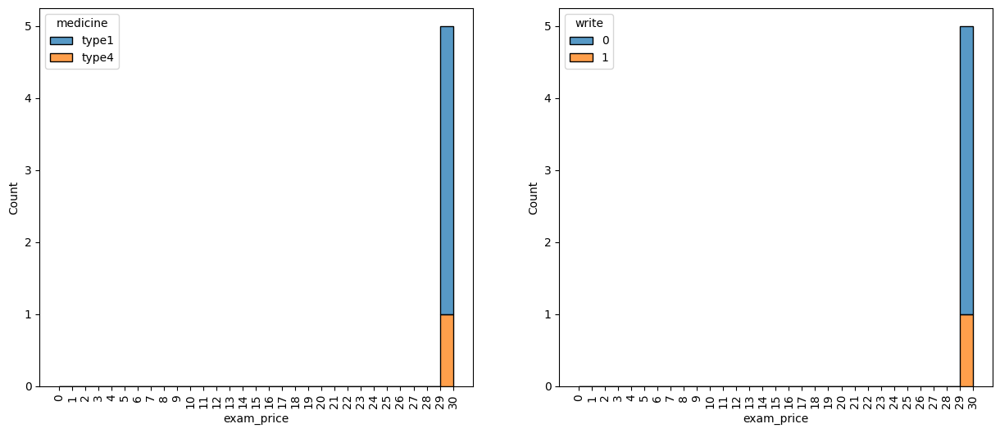

In [348]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_sur_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_sur_5 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_sur_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_sur_5 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [349]:
a_sur_5_1 = a_sur_5[a_sur_5["write"] == 1]

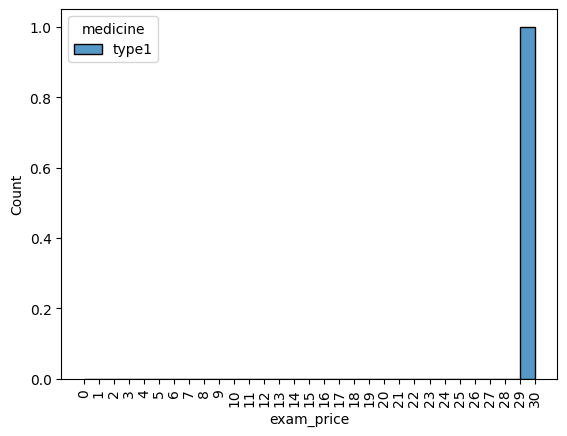

In [350]:
bins = np.arange(0 , a_sur_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_sur_5_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Sur speciality and Area 5 Doctors 

In [351]:
b_sur_5 = data[(data["speciality"] == "sur") & (data["dr_class"] == "b") & (data["area"] == "area5")]

In [352]:
b_sur_5["medicine"].value_counts()

medicine
type4    1
type1    1
Name: count, dtype: int64

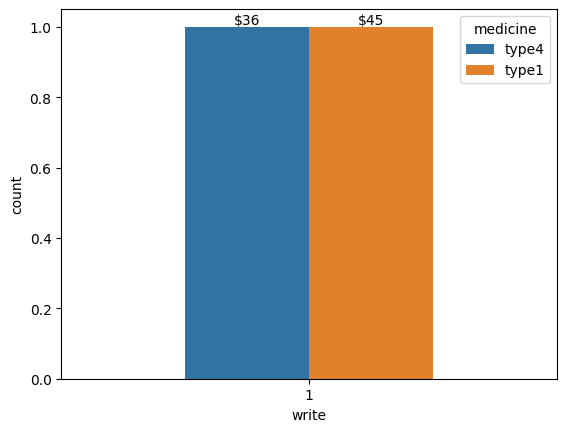

In [353]:
ax = sns.countplot(data = b_sur_5 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_sur_5['medicine'].unique()   



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

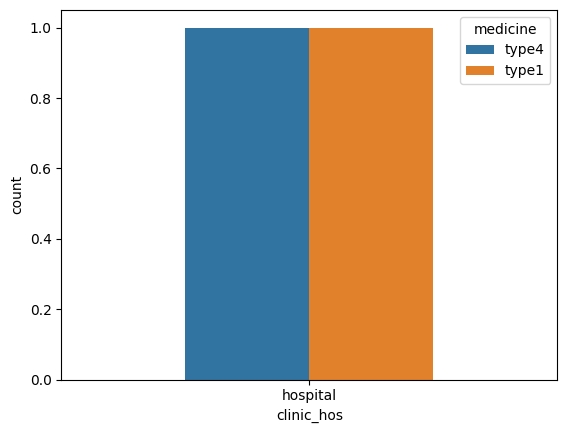

In [354]:
sns.countplot(data = b_sur_5 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

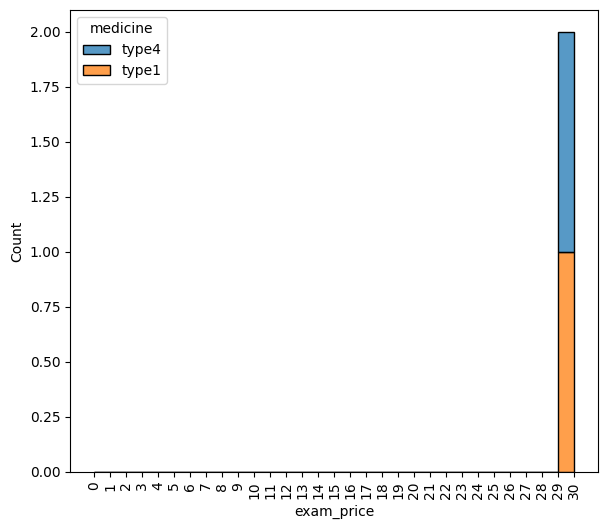

In [355]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_sur_5["exam_price"].max() + 1 , 1)

sns.histplot(data = b_sur_5 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 5

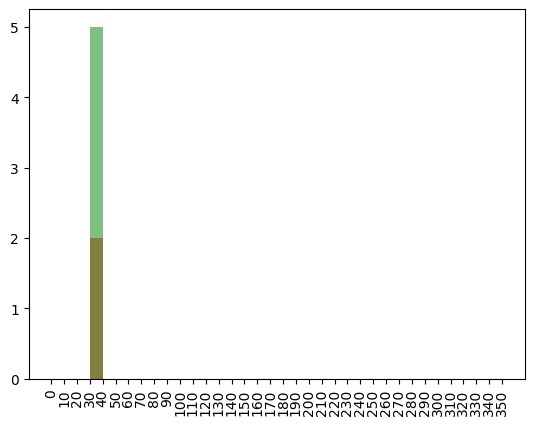

In [356]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_sur_5 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_sur_5 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class b , Sur speciality and Area 6 Doctors 

In [357]:
b_sur_6 = data[(data["speciality"] == "sur") & (data["dr_class"] == "b") & (data["area"] == "area6")]

In [358]:
b_sur_6["medicine"].value_counts()

medicine
type5    1
type1    1
Name: count, dtype: int64

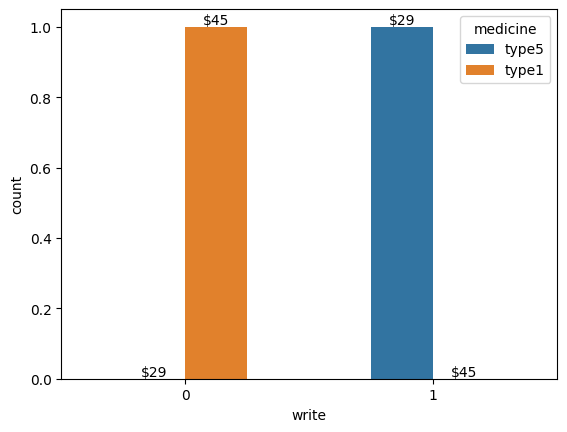

In [359]:
ax = sns.countplot(data = b_sur_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_sur_6['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

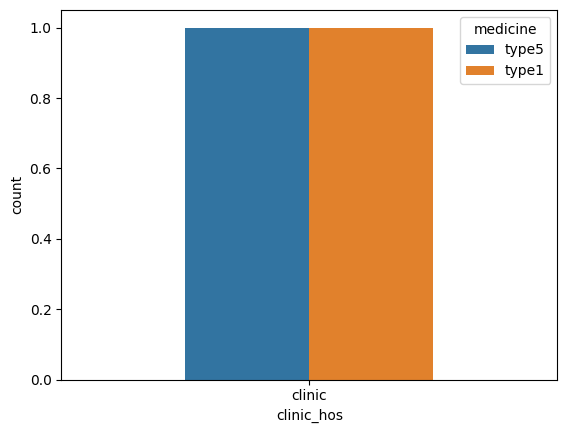

In [360]:
sns.countplot(data = b_sur_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

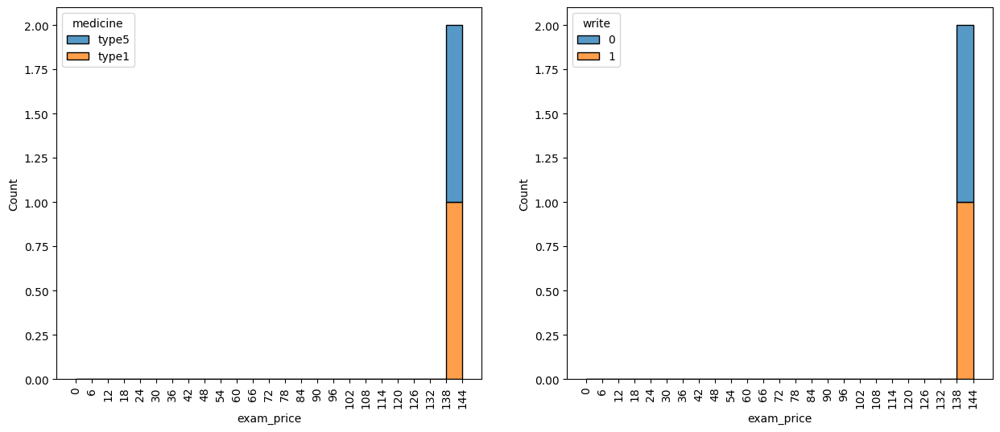

In [361]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_sur_6["exam_price"].max() + 6 , 6)

sns.histplot(data = b_sur_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_sur_6["exam_price"].max() + 6 , 6)

sns.histplot(data = b_sur_6 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , Sur speciality and Area 7 Doctors 

In [362]:
a_sur_7 = data[(data["speciality"] == "sur") & (data["dr_class"] == "a") & (data["area"] == "area7")]

In [363]:
a_sur_7["medicine"].value_counts()

medicine
type1    1
Name: count, dtype: int64

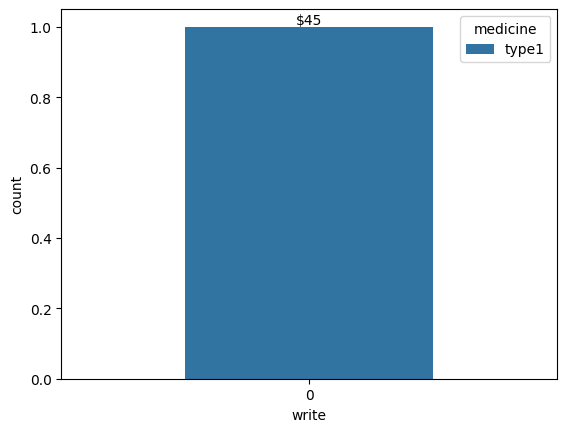

In [364]:
ax = sns.countplot(data = a_sur_7 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_sur_7['medicine'].unique())  



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

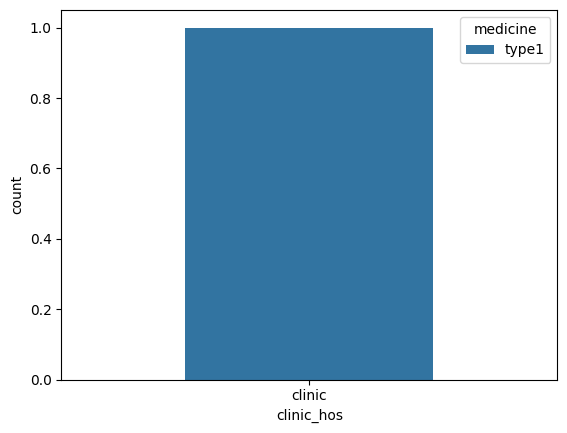

In [365]:
sns.countplot(data = a_sur_7 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

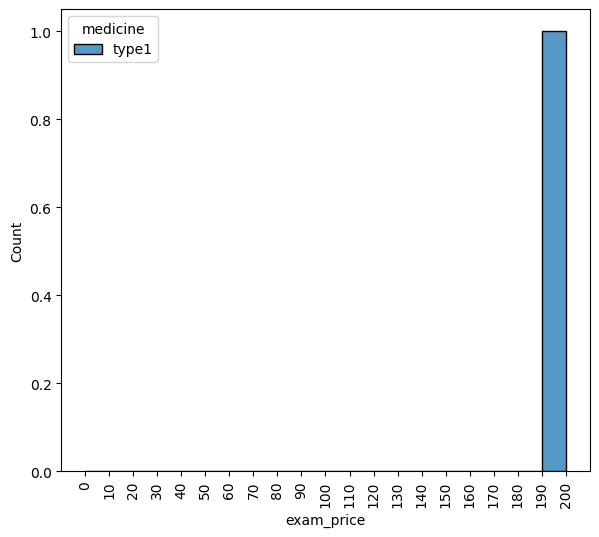

In [366]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_sur_7["exam_price"].max() + 10 , 10)

sns.histplot(data = a_sur_7 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , Sur speciality and Area 8 Doctors 

In [367]:
a_sur_8 = data[(data["speciality"] == "sur") & (data["dr_class"] == "a") & (data["area"] == "area8")]

In [368]:
a_sur_8["medicine"].value_counts()

medicine
type1    1
type5    1
Name: count, dtype: int64

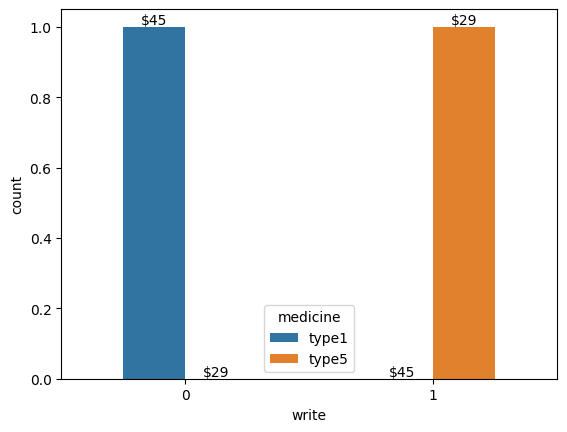

In [369]:
ax = sns.countplot(data = a_sur_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_sur_8['medicine'].unique())



lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

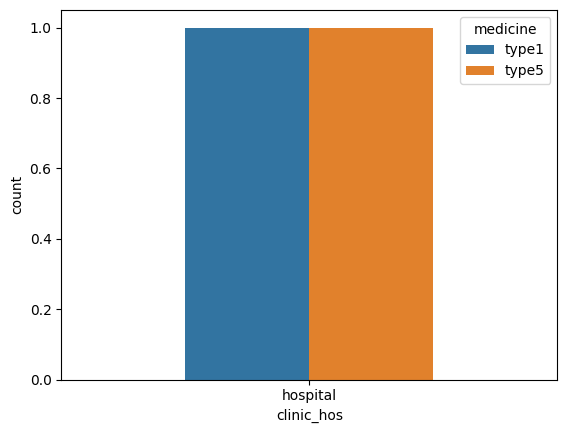

In [370]:
sns.countplot(data = a_sur_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

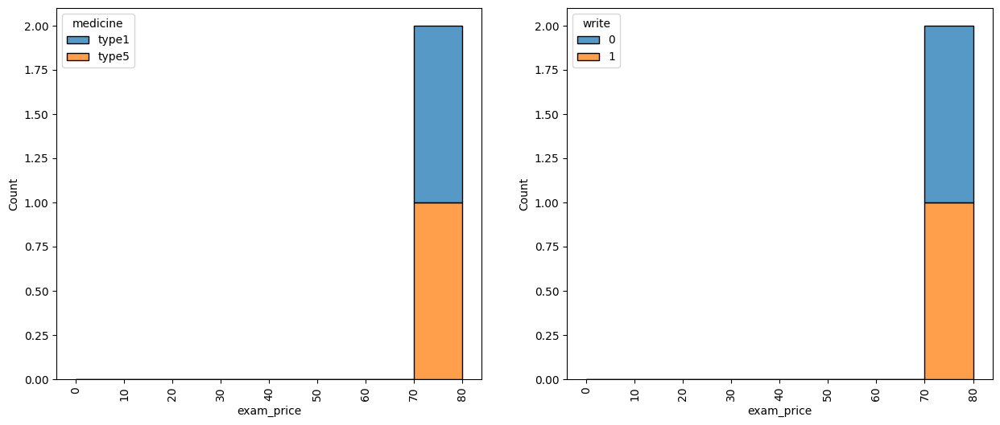

In [371]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_sur_8["exam_price"].max() + 10 , 10)

sns.histplot(data = a_sur_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_sur_8["exam_price"].max() + 10 , 10)

sns.histplot(data = a_sur_8 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , Sur speciality and Area 8 Doctors 

In [372]:
b_sur_8 = data[(data["speciality"] == "sur") & (data["dr_class"] == "b") & (data["area"] == "area8")]

In [373]:
b_sur_8["medicine"].value_counts()

medicine
type1    3
type5    3
Name: count, dtype: int64

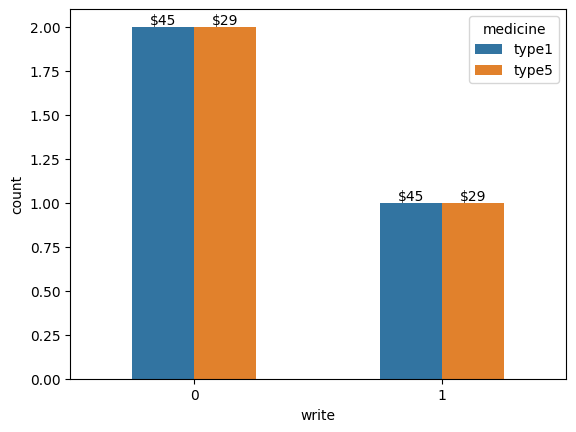

In [374]:
ax = sns.countplot(data = b_sur_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_sur_8['medicine'].unique())



lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 





for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

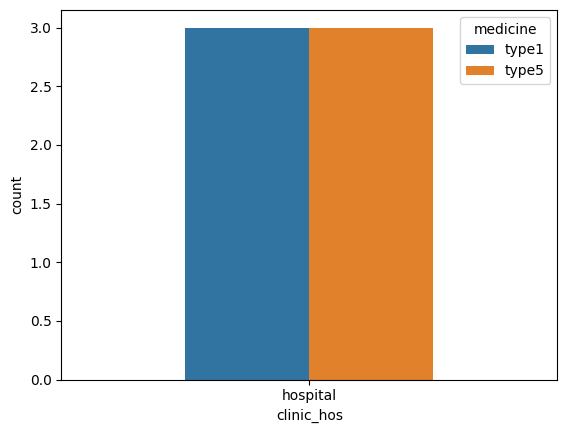

In [375]:
sns.countplot(data = b_sur_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

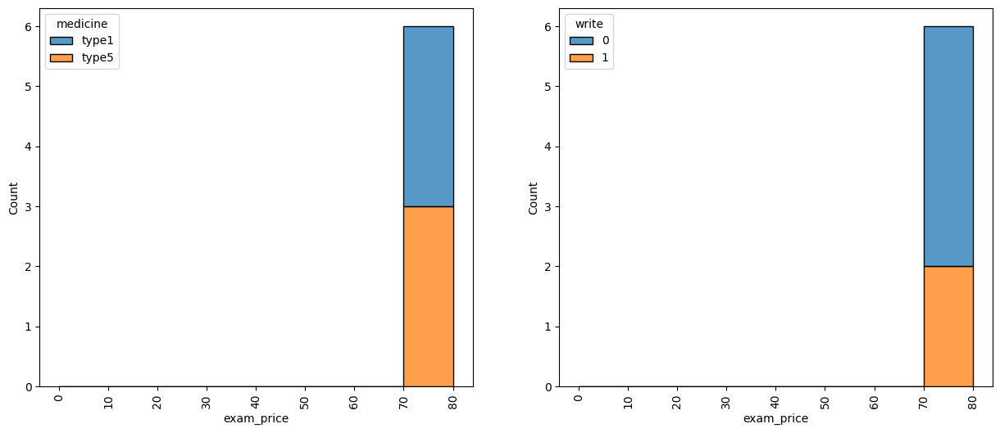

In [376]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_sur_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_sur_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_sur_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_sur_8 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 8

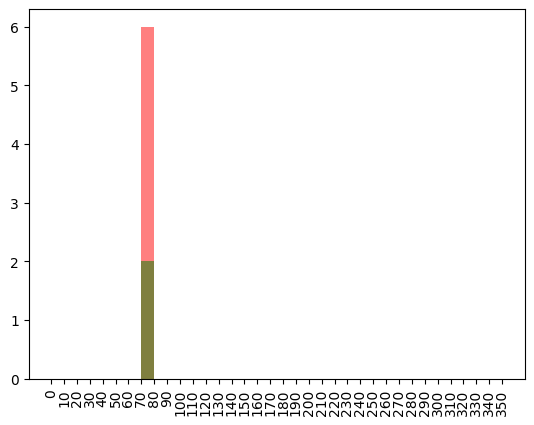

In [377]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_sur_8 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_sur_8 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Summary For Sur Doctors Analysis

#### 60% cd dcotors in Class a did not write 

#### Another 40% most write Type 5  is higher as percentage

#### All Sur Doctors in class a write in hospitals

In [378]:
sur_a = data[(data["speciality"] == "sur") & (data["dr_class"] == "a")]

sur_a_1 = data[(data["speciality"] == "sur") & (data["dr_class"] == "a") & (data["write"] == 1)]

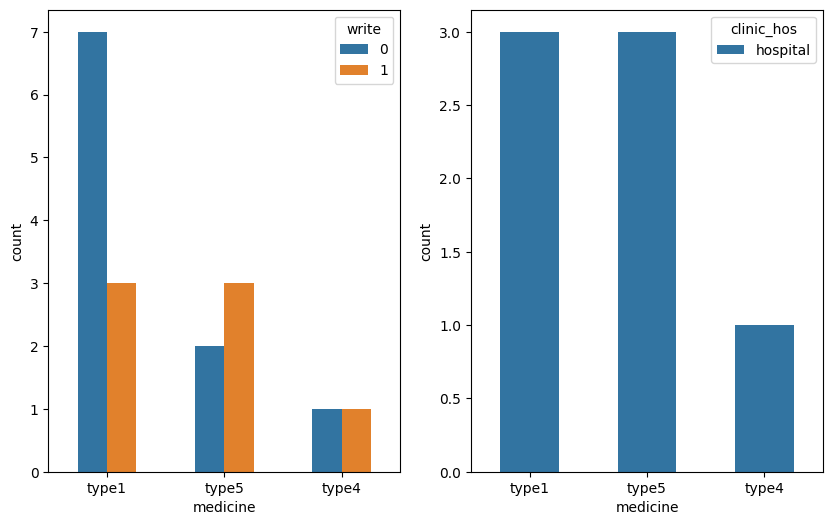

In [379]:
plt.figure(figsize = [10 , 6])



order = sur_a["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = sur_a , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = sur_a_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

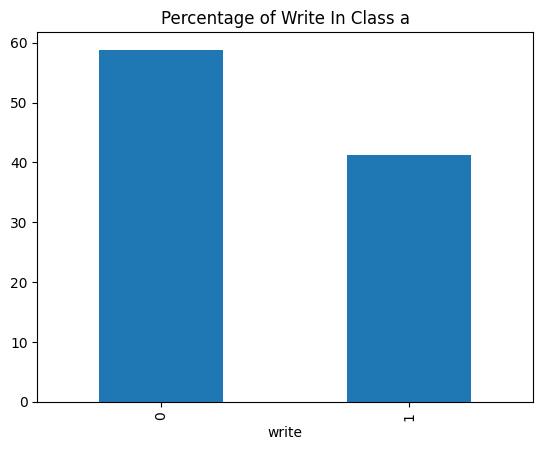

In [380]:
write_per = sur_a["write"].value_counts().sort_values(ascending = False) / sur_a.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class a");

#### 55% Im dcotors in Class b write 

#### They write Type 4 then 5 then 1

#### The most in hospitals

In [381]:
sur_b = data[(data["speciality"] == "sur") & (data["dr_class"] == "b")]

sur_b_1 = data[(data["speciality"] == "sur") & (data["dr_class"] == "b") & (data["write"] == 1)]

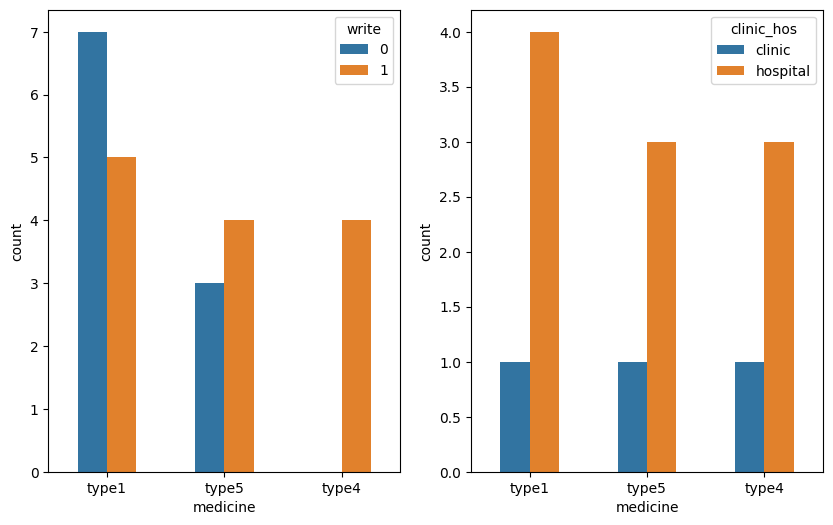

In [382]:
plt.figure(figsize = [10 , 6])



order = sur_b["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = sur_b , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = sur_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

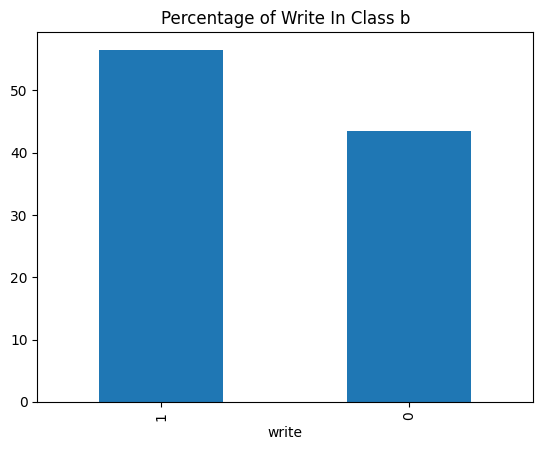

In [383]:
write_per = sur_b["write"].value_counts().sort_values(ascending = False) / sur_b.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class b");

### Most points in low ranges because they most in hospitals

### just two points in high ranges with class b in clinics

In [384]:
sur_1 = data[(data["speciality"] == "sur") & (data["write"] == 1)]

In [385]:
import plotly.express as px

fig = px.scatter(sur_1 , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

### Most in Area 2

In [386]:
import plotly.express as px

fig = px.scatter(sur_1 , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

### Most in area 2 , 5 and all in hospitals with low range of exam prices

In [387]:
sur_a = sur_1[sur_1["dr_class"] == "a"]



import plotly.express as px

fig = px.scatter(sur_a , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [388]:
fig= px.histogram(sur_1 , x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of im Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

 ### Class a just hospitals with low ranges and there is few class b clinics in high ranges

In [389]:
fig= px.histogram(sur_1 , x='exam_price',height=500,width=900,template='simple_white',

color='dr_class', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of Im Doctors by Class','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### Areas Distribuation

In [390]:
fig= px.histogram(sur_1, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Im Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

#  git Doctors

### Class a , git speciality and Area 2 Doctors 

In [391]:
a_git_2 = data[(data["speciality"] == "git") & (data["dr_class"] == "a") & (data["area"] == "area2")]

In [392]:
a_git_2["medicine"].value_counts()

medicine
type4    4
type1    2
type6    1
Name: count, dtype: int64

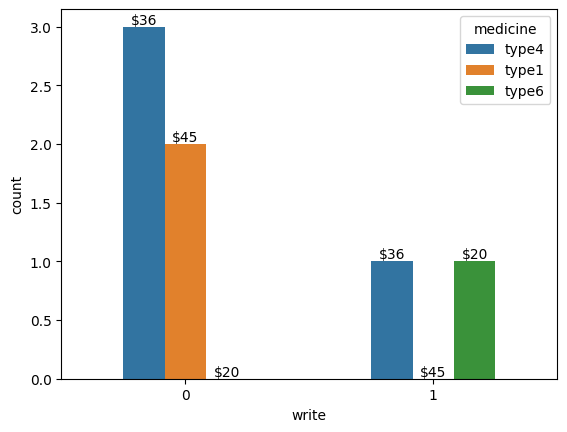

In [393]:
ax = sns.countplot(data = a_git_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_git_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

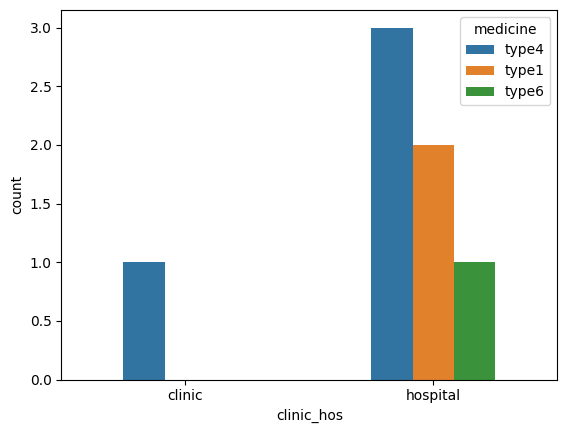

In [394]:
sns.countplot(data = a_git_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

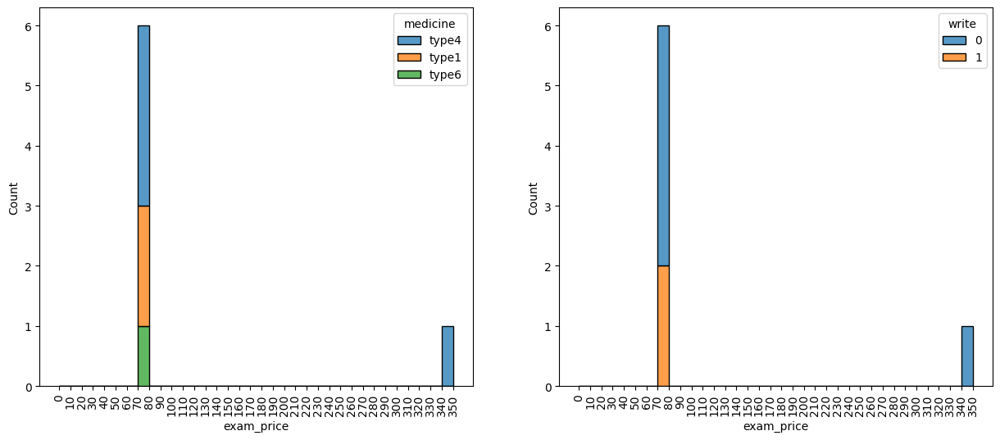

In [395]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_git_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_git_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_git_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_git_2 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [396]:
a_git_2_1 = a_git_2[a_git_2["write"] == 1]

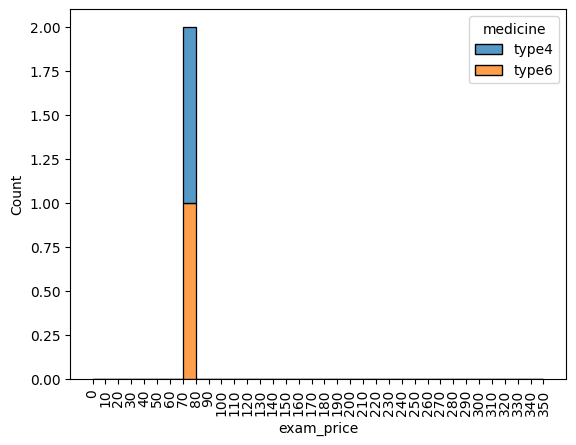

In [397]:
bins = np.arange(0 , a_git_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_git_2_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , git speciality and Area 2 Doctors 

In [398]:
b_git_2 = data[(data["speciality"] == "git") & (data["dr_class"] == "b") & (data["area"] == "area2")]

In [399]:
b_git_2["medicine"].value_counts()

Series([], Name: count, dtype: int64)

### Class a , git speciality and Area 3 Doctors 

In [400]:
a_git_3 = data[(data["speciality"] == "git") & (data["dr_class"] == "a") & (data["area"] == "area3")]

In [401]:
a_git_3["medicine"].value_counts()

medicine
type4    1
Name: count, dtype: int64

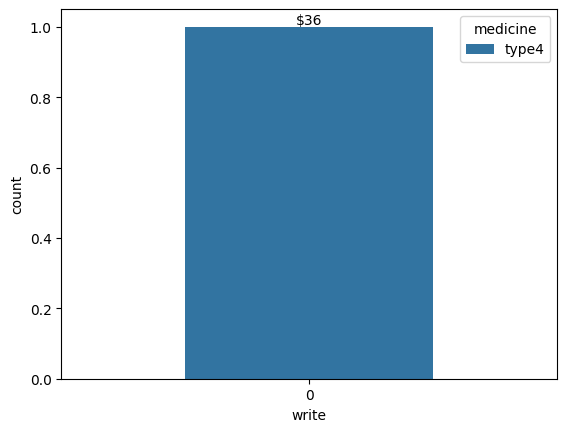

In [402]:
ax = sns.countplot(data = a_git_3 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = a_git_3['medicine'].unique()  



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

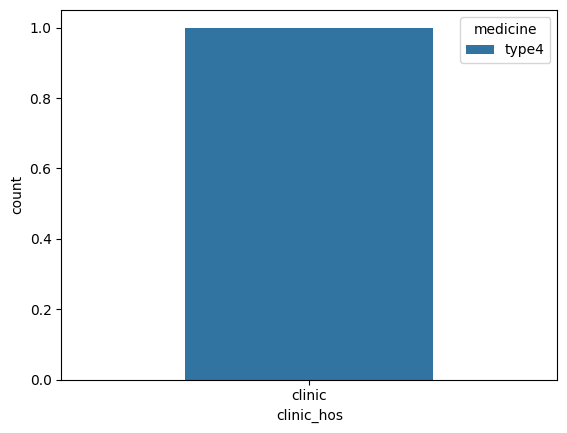

In [403]:
sns.countplot(data = a_git_3 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

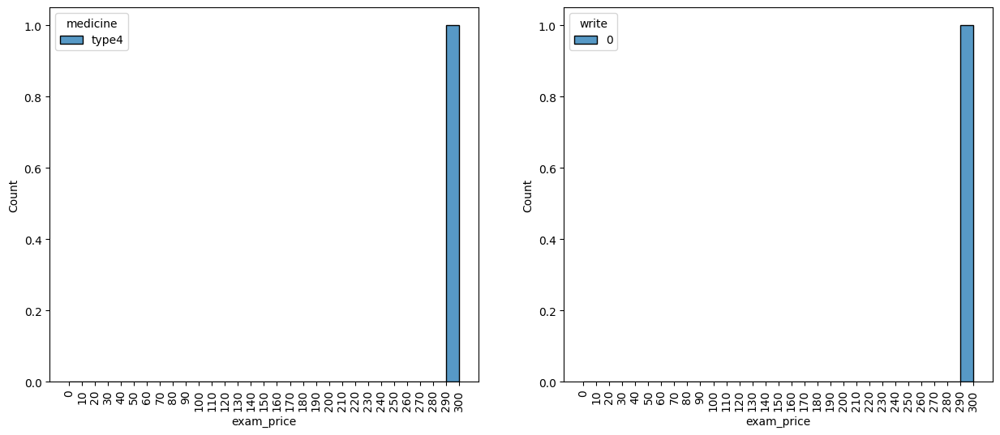

In [404]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_git_3["exam_price"].max() + 10 , 10)

sns.histplot(data = a_git_3 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_git_3["exam_price"].max() + 10 , 10)

sns.histplot(data = a_git_3 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , git speciality and Area 5 Doctors 

In [405]:
a_git_5 = data[(data["speciality"] == "git") & (data["dr_class"] == "a") & (data["area"] == "area5")]

In [406]:
a_git_5["medicine"].value_counts()

medicine
type1    7
type4    1
Name: count, dtype: int64

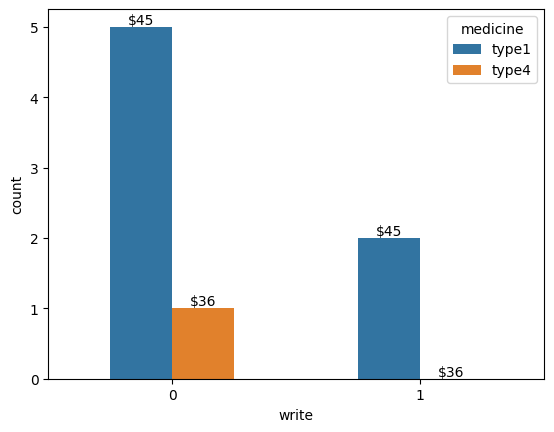

In [407]:
ax = sns.countplot(data = a_git_5 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_git_5['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

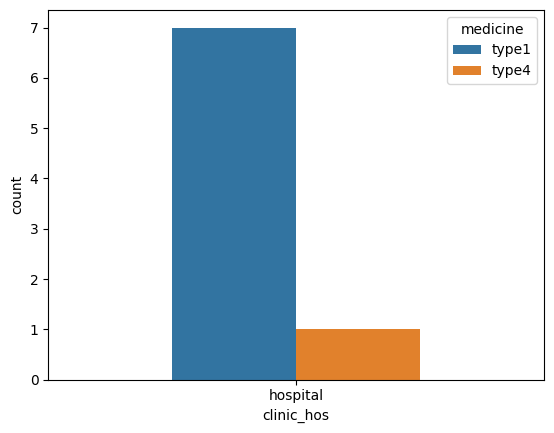

In [408]:
sns.countplot(data = a_git_5 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

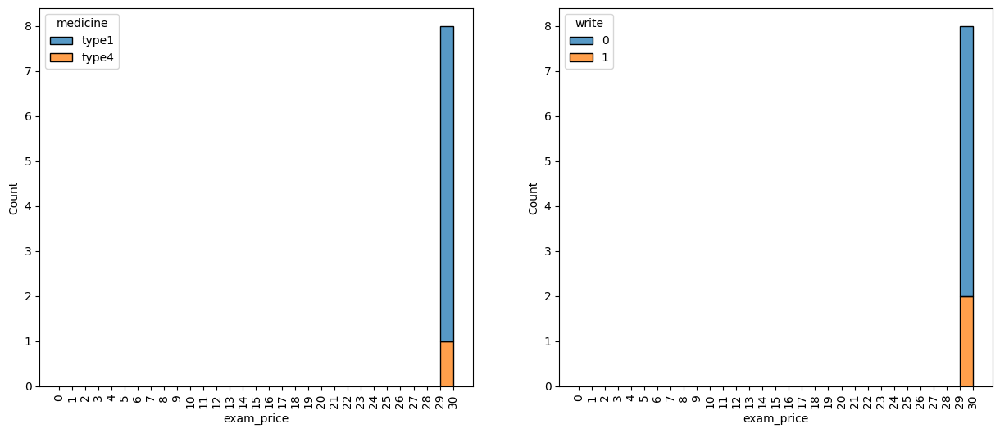

In [409]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_git_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_git_5 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_git_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_git_5 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [410]:
a_git_5_1 = a_git_5[a_git_5["write"] == 1]

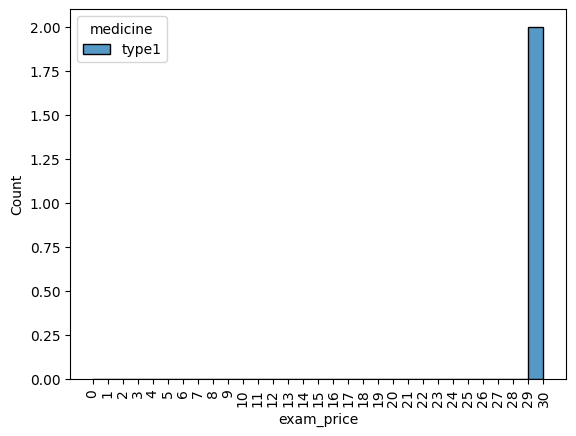

In [411]:
bins = np.arange(0 , a_git_5["exam_price"].max() + 1 , 1)

sns.histplot(data = a_git_5_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , git speciality and Area 5 Doctors 

In [412]:
b_git_5 = data[(data["speciality"] == "git") & (data["dr_class"] == "b") & (data["area"] == "area5")]

In [413]:
b_git_5["medicine"].value_counts()

medicine
type1    8
type4    6
Name: count, dtype: int64

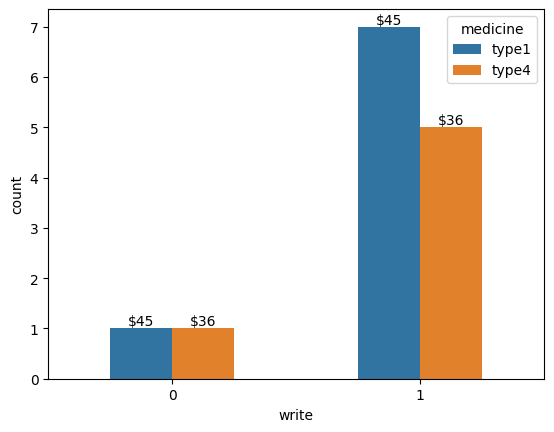

In [414]:
ax = sns.countplot(data = b_git_5 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_git_5['medicine'].unique())   



lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

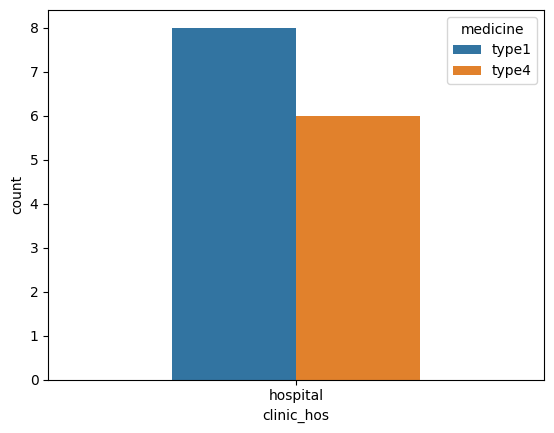

In [415]:
sns.countplot(data = b_git_5 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

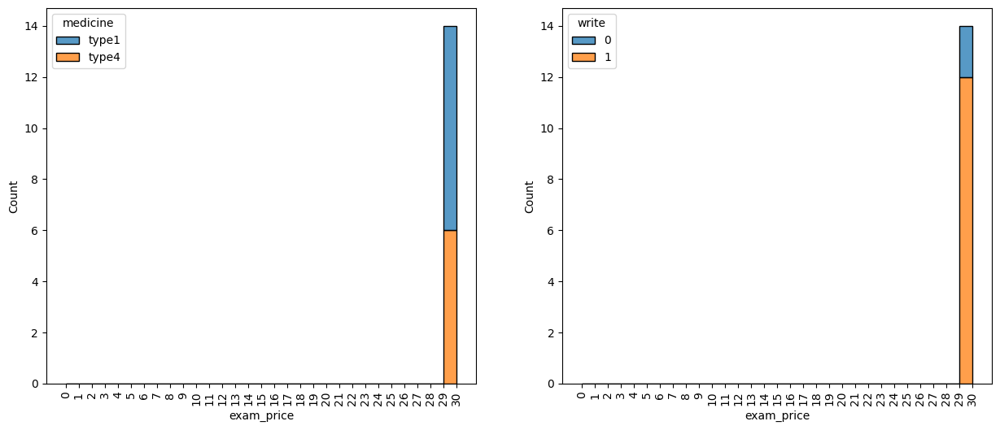

In [416]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_git_5["exam_price"].max() + 1 , 1)

sns.histplot(data = b_git_5 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_git_5["exam_price"].max() + 1 , 1)

sns.histplot(data = b_git_5 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 5

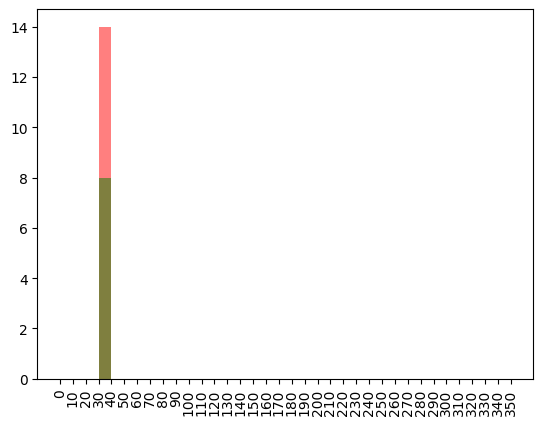

In [417]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_git_5 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_git_5 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , git speciality and Area 6 Doctors 

In [418]:
a_git_6 = data[(data["speciality"] == "git") & (data["dr_class"] == "a") & (data["area"] == "area6")]

In [419]:
a_git_6["medicine"].value_counts()

medicine
type4    1
type1    1
Name: count, dtype: int64

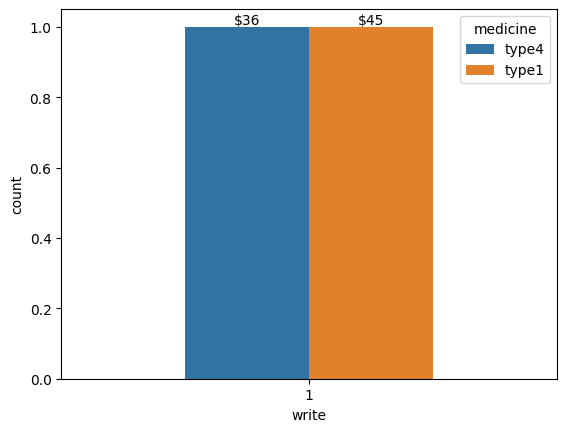

In [420]:
ax = sns.countplot(data = a_git_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = a_git_6['medicine'].unique()



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

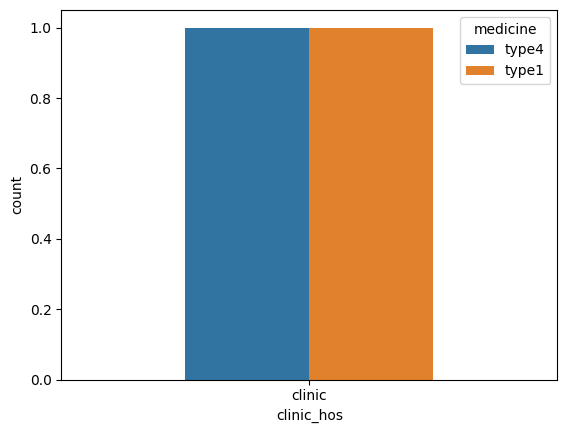

In [421]:
sns.countplot(data = a_git_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

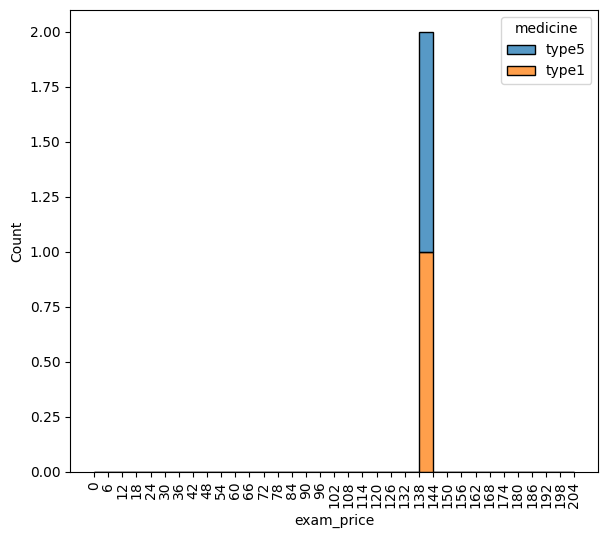

In [422]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_git_6["exam_price"].max() + 6 , 6)

sns.histplot(data = b_sur_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , git speciality and Area 8 Doctors 

In [423]:
a_git_8 = data[(data["speciality"] == "git") & (data["dr_class"] == "a") & (data["area"] == "area8")]

In [424]:
a_git_8["medicine"].value_counts()

medicine
type4    1
Name: count, dtype: int64

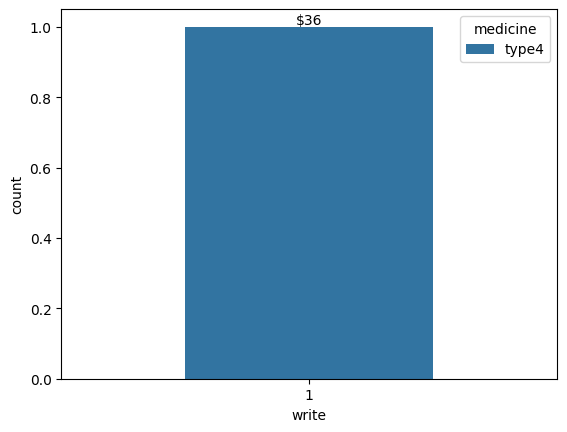

In [425]:
ax = sns.countplot(data = a_git_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_git_8['medicine'].unique())



lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

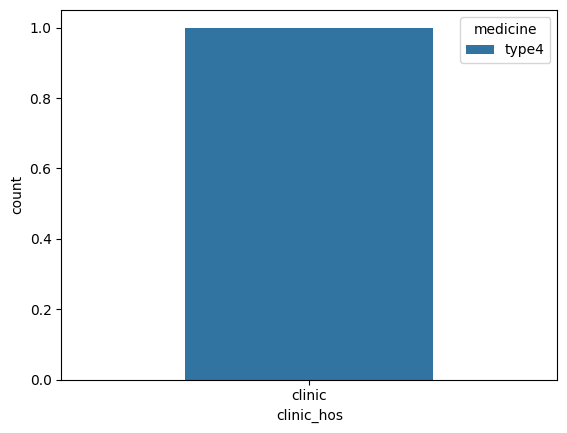

In [426]:
sns.countplot(data = a_git_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

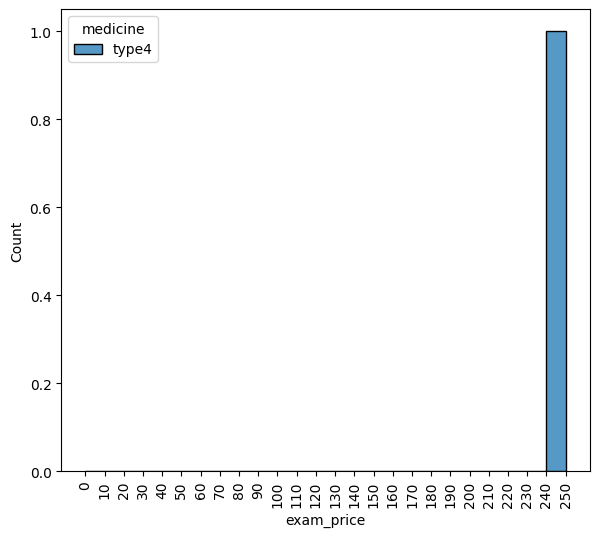

In [427]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_git_8["exam_price"].max() + 10 , 10)

sns.histplot(data = a_git_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Summary For git Doctors Analysis

#### 62% git dcotors in Class a did not write 

#### Another 38% most write Type 4 and 1 , 6 just one

#### type 1 most in hospitals , type 4 most in clincs type 6 just in hospitals

In [428]:
git_a = data[(data["speciality"] == "git") & (data["dr_class"] == "a")]

git_a_1 = data[(data["speciality"] == "git") & (data["dr_class"] == "a") & (data["write"] == 1)]

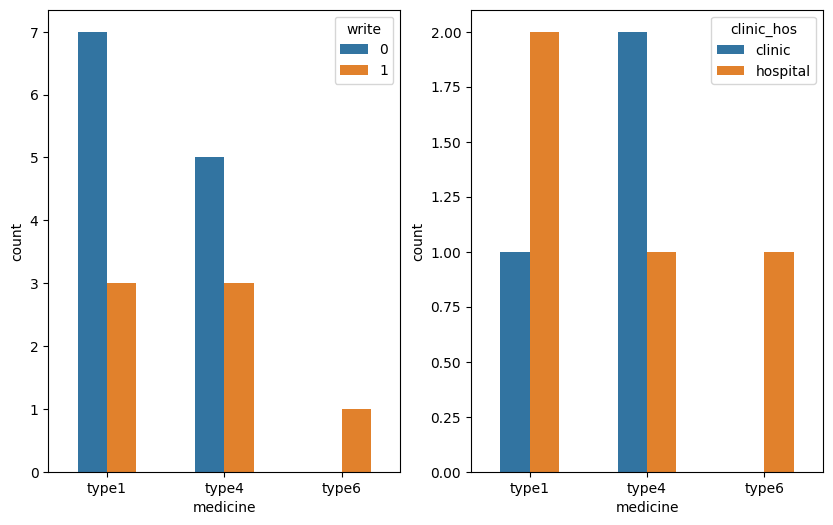

In [429]:
plt.figure(figsize = [10 , 6])



order = git_a["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = git_a , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = git_a_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

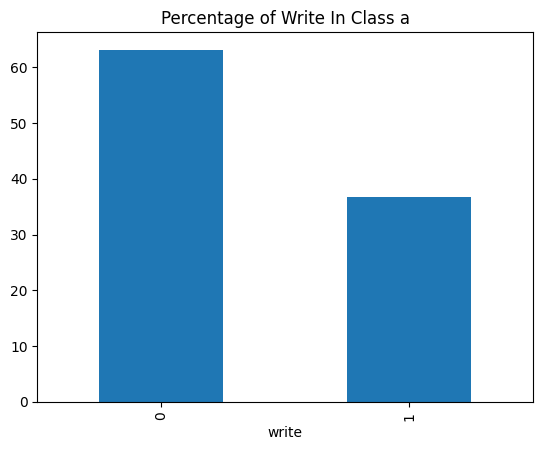

In [430]:
write_per = git_a["write"].value_counts().sort_values(ascending = False) / git_a.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class a");

#### 85% git dcotors in Class b write 

#### They write Type 1 most and 4

#### all in hospitals

In [431]:
git_b = data[(data["speciality"] == "git") & (data["dr_class"] == "b")]

git_b_1 = data[(data["speciality"] == "git") & (data["dr_class"] == "b") & (data["write"] == 1)]

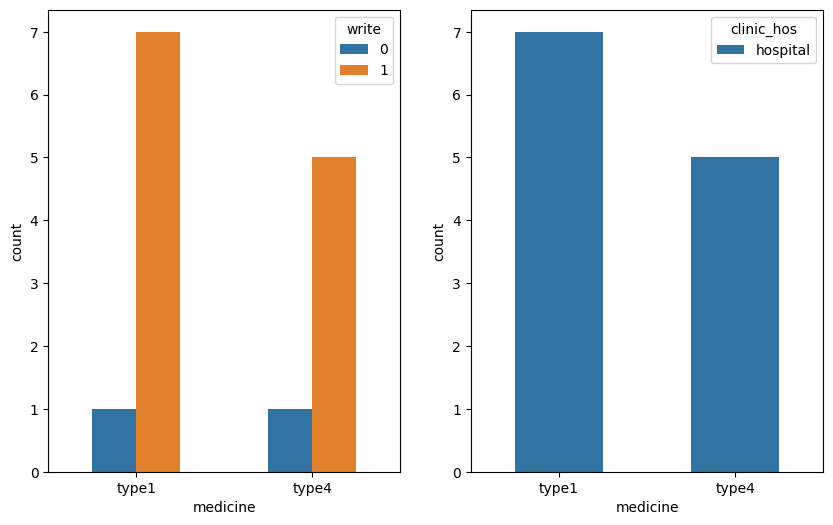

In [432]:
plt.figure(figsize = [10 , 6])



order = git_b["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = git_b , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = git_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

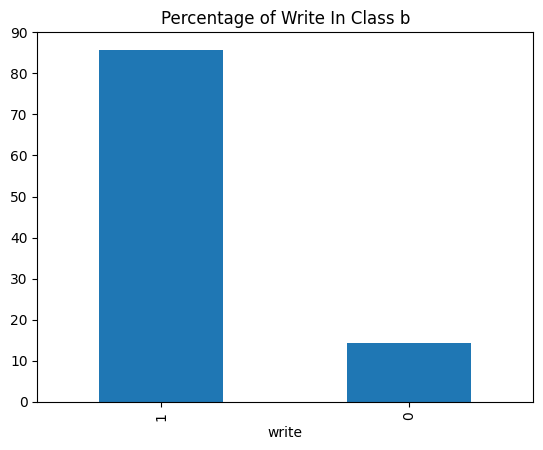

In [433]:
write_per = git_b["write"].value_counts().sort_values(ascending = False) / git_b.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class b");

### Class a in high ranges in clinics 

### Class b all in low ranges because of hospitals 

In [434]:
git_1 = data[(data["speciality"] == "git") & (data["write"] == 1)]

In [435]:
import plotly.express as px

fig = px.scatter(git_1 , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

### Low areas range 2 , 5 high is 6 , 8

In [436]:
import plotly.express as px

fig = px.scatter(git_1 , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [437]:
git_a = git_1[git_1["dr_class"] == "a"]



import plotly.express as px

fig = px.scatter(git_a , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [438]:
fig= px.histogram(git_1 , x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of im Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

In [439]:
fig= px.histogram(git_1 , x='exam_price',height=500,width=900,template='simple_white',

color='dr_class', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of Im Doctors by Class','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### Areas Distribuation most in low and area 5 

In [440]:
fig= px.histogram(git_1, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Im Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

#  gp Doctors

### Class b , gp speciality and Area 2 Doctors 

In [441]:
b_gp_2 = data[(data["speciality"] == "gp") & (data["dr_class"] == "b") & (data["area"] == "area2")]

In [442]:
b_gp_2["medicine"].value_counts()

medicine
type6    5
type1    3
type4    1
type5    1
type2    1
Name: count, dtype: int64

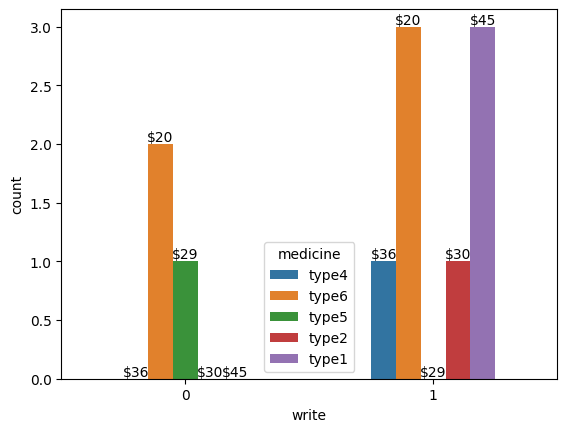

In [443]:
ax = sns.countplot(data = b_gp_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_gp_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

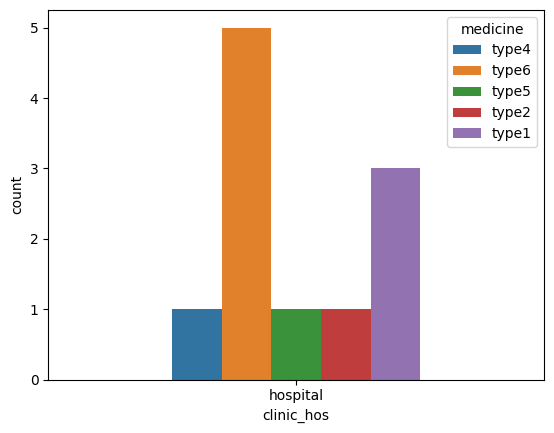

In [444]:
sns.countplot(data = b_gp_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

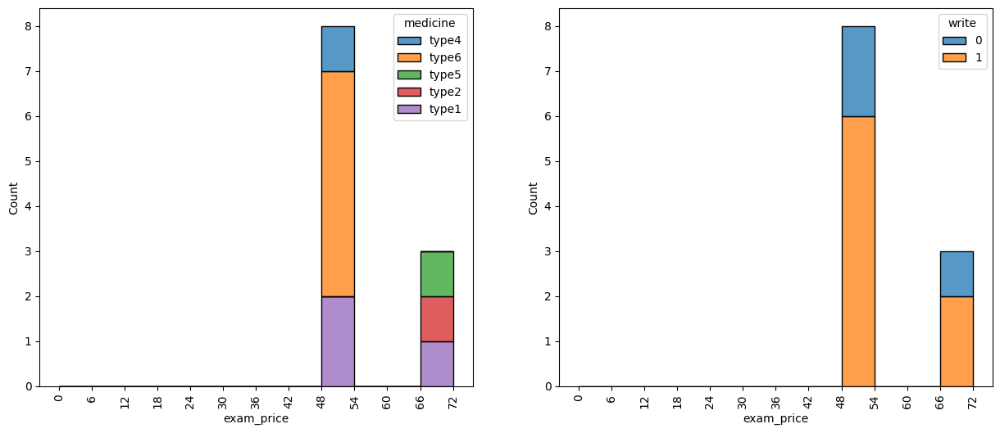

In [445]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_gp_2["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_gp_2["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_2 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [446]:
b_gp_2_1 = b_gp_2[b_gp_2["write"] == 1]

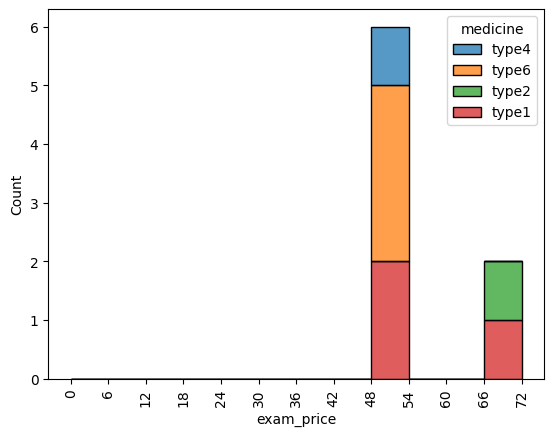

In [447]:
bins = np.arange(0 , b_gp_2["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_2_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , gp speciality and Area 3 Doctors 

In [448]:
b_gp_3 = data[(data["speciality"] == "gp") & (data["dr_class"] == "b") & (data["area"] == "area3")]

In [449]:
b_gp_3["medicine"].value_counts()

medicine
type5    1
type6    1
type3    1
Name: count, dtype: int64

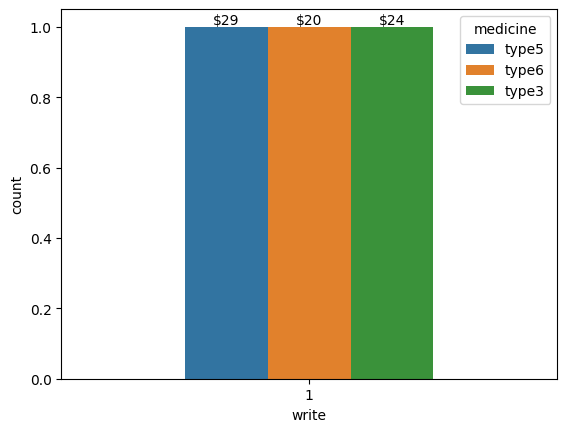

In [450]:
ax = sns.countplot(data = b_gp_3 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_gp_3['medicine'].unique() 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

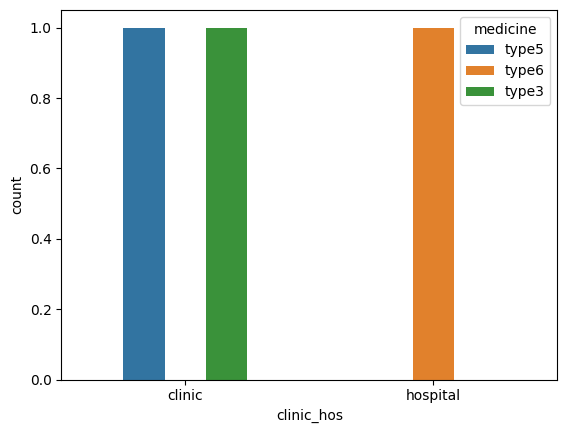

In [451]:
sns.countplot(data = b_gp_3 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

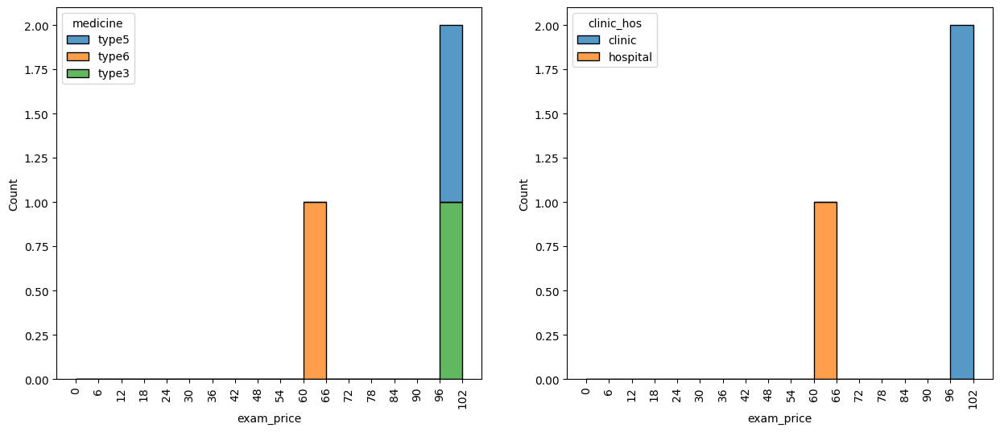

In [452]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_gp_3["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_3 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_gp_3["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_3 , x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , gp speciality and Area 6 Doctors 

In [453]:
b_gp_6 = data[(data["speciality"] == "gp") & (data["dr_class"] == "b") & (data["area"] == "area6")]

In [454]:
b_gp_6["medicine"].value_counts()

medicine
type5    2
type4    1
Name: count, dtype: int64

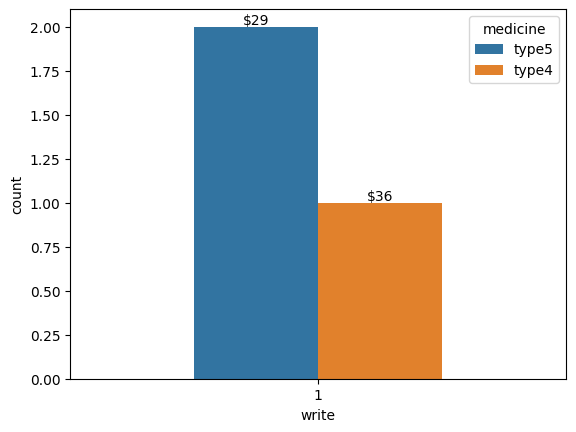

In [455]:
ax = sns.countplot(data = b_gp_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_gp_6['medicine'].unique()



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

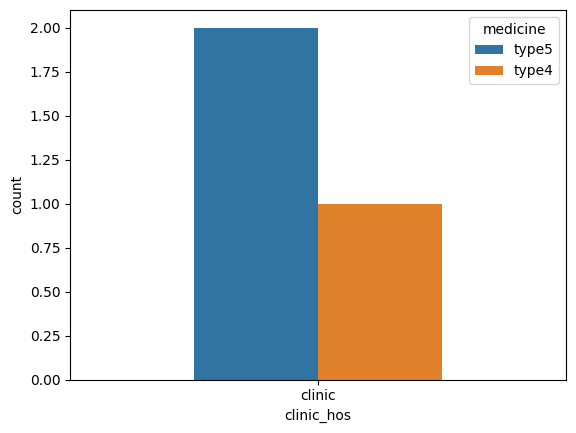

In [456]:
sns.countplot(data = b_gp_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

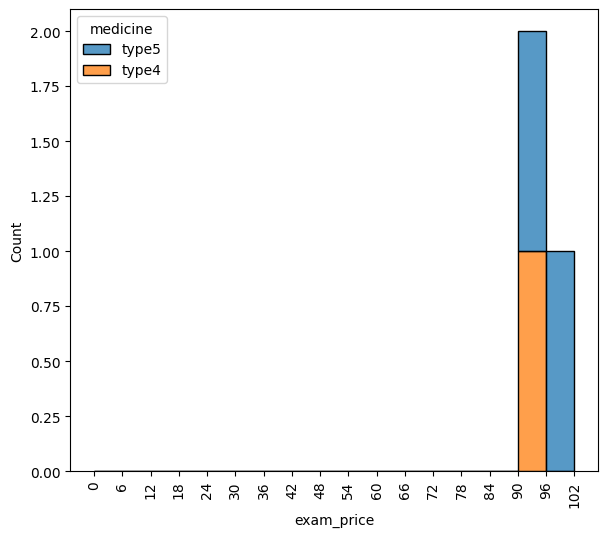

In [457]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_gp_6["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , gp speciality and Area 7 Doctors 

In [458]:
b_gp_7 = data[(data["speciality"] == "gp") & (data["dr_class"] == "b") & (data["area"] == "area7")]

In [459]:
b_gp_7["medicine"].value_counts()

medicine
type4    3
type1    3
type5    1
Name: count, dtype: int64

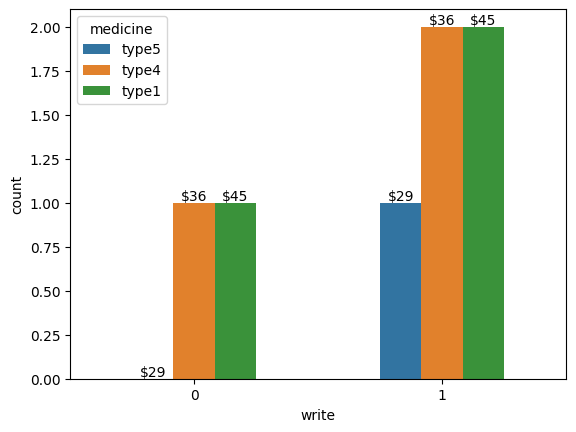

In [460]:
ax = sns.countplot(data = b_gp_7 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_gp_7['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

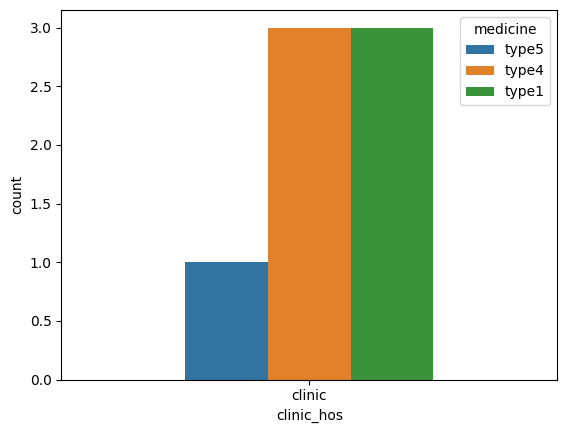

In [461]:
sns.countplot(data = b_gp_7 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

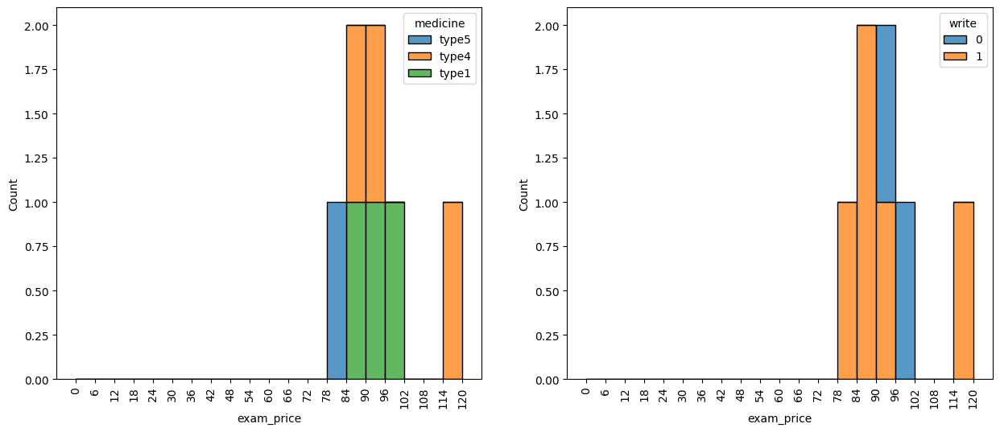

In [462]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_gp_7["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_7 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_gp_7["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_7 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [463]:
b_gp_7_1 = b_gp_7[b_gp_7["write"] == 1]

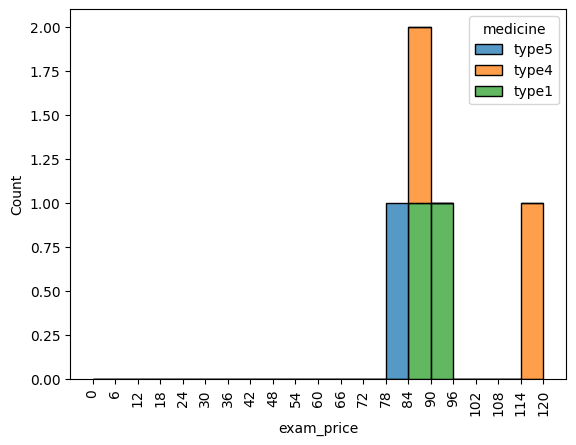

In [464]:
bins = np.arange(0 , b_gp_7["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_7_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , gp speciality and Area 8 Doctors 

In [465]:
b_gp_8 = data[(data["speciality"] == "gp") & (data["dr_class"] == "b") & (data["area"] == "area8")]

In [466]:
b_gp_8["medicine"].value_counts()

medicine
type1    2
type5    2
type6    1
type4    1
Name: count, dtype: int64

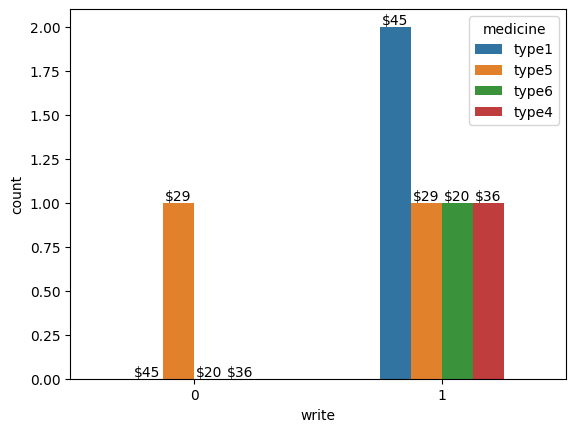

In [467]:
ax = sns.countplot(data = b_gp_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_gp_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

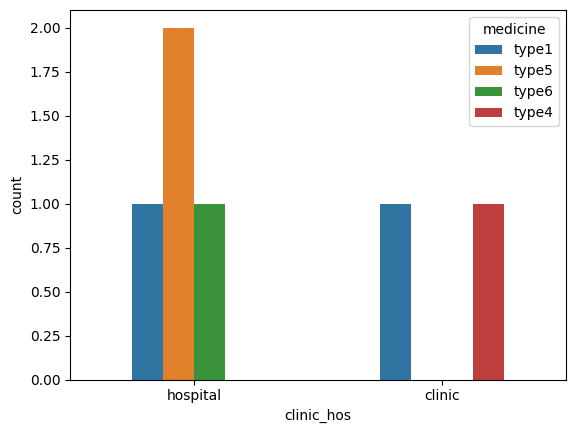

In [468]:
sns.countplot(data = b_gp_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

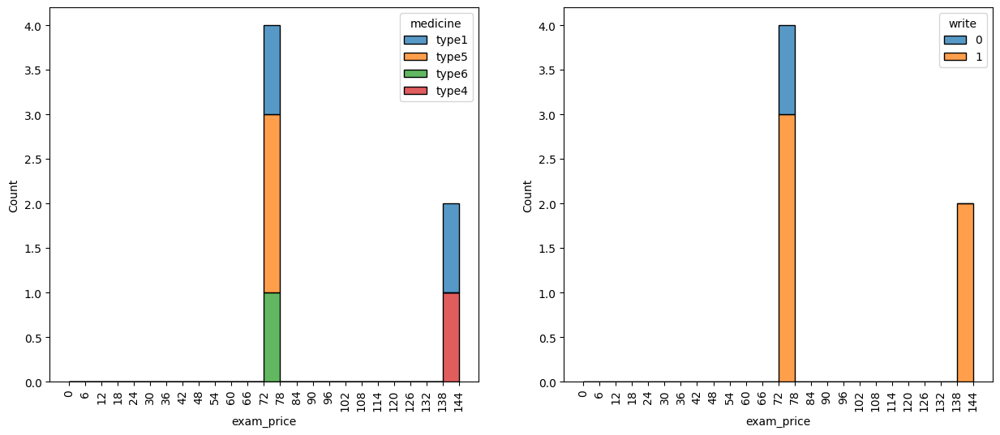

In [469]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_gp_8["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_gp_8["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_8 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [470]:
b_gp_8_1 = b_gp_8[b_gp_8["write"] == 1]

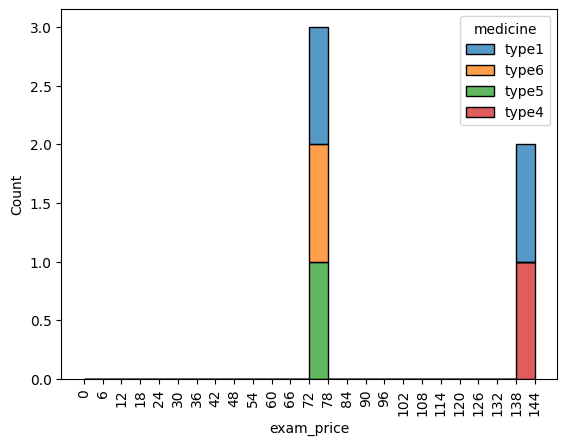

In [471]:
bins = np.arange(0 , b_gp_8["exam_price"].max() + 6 , 6)

sns.histplot(data = b_gp_8_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Summary For gp Doctors Analysis

#### There is no gp class a doctors

#### 80% gp dcotors in Class b write 

#### They write Type 1 most

#### type 6 , 2 in hospitals and type 3 , 4 , 5 most in clinics

In [472]:
gp_b = data[(data["speciality"] == "gp") & (data["dr_class"] == "b")]

gp_b_1 = data[(data["speciality"] == "gp") & (data["dr_class"] == "b") & (data["write"] == 1)]

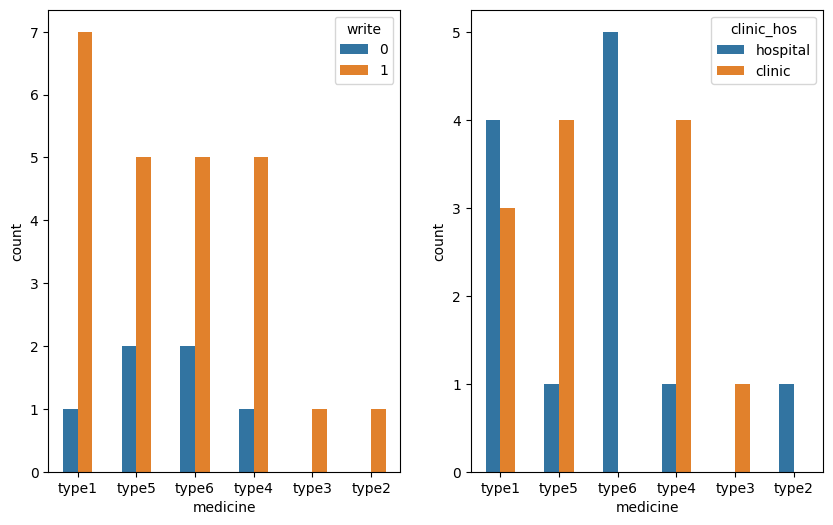

In [473]:
plt.figure(figsize = [10 , 6])



order = gp_b["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = gp_b , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = gp_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

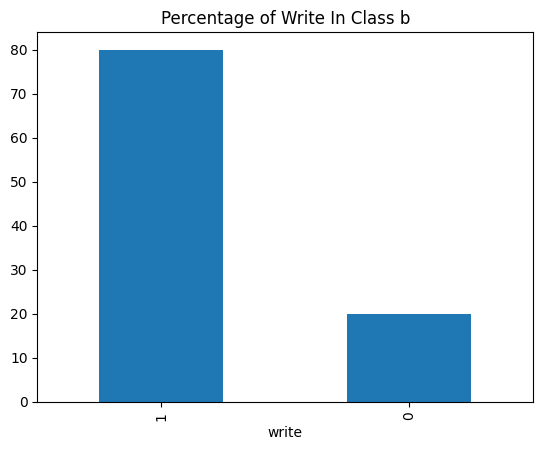

In [474]:
write_per = gp_b["write"].value_counts().sort_values(ascending = False) / gp_b.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class b");

### Type 1 , 4 in high ranges

In [475]:
gp_1 = data[(data["speciality"] == "gp") & (data["write"] == 1)]

In [476]:
import plotly.express as px

fig = px.scatter(gp_1 , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

### Area 7 , 8 in high ranges

In [477]:
import plotly.express as px

fig = px.scatter(gp_1 , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [478]:
fig= px.histogram(gp_1 , x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of im Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### Area Distribuation

In [479]:
fig= px.histogram(gp_1, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Im Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

#  ent Doctors

### Class a , ent speciality and Area 1 Doctors 

In [480]:
a_ent_1 = data[(data["speciality"] == "ent") & (data["dr_class"] == "a") & (data["area"] == "area1")]

In [481]:
a_ent_1["medicine"].value_counts()

medicine
type1    2
Name: count, dtype: int64

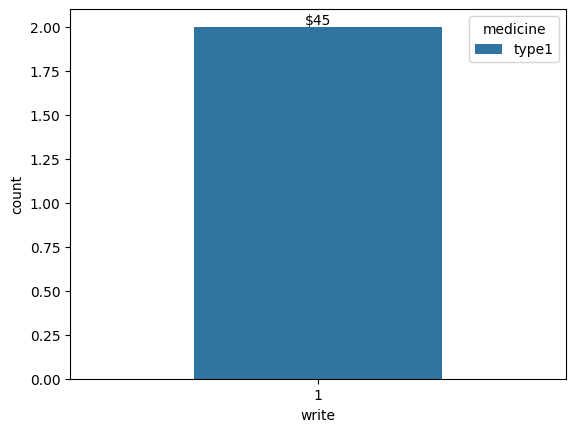

In [482]:
ax = sns.countplot(data = a_ent_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_ent_1['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

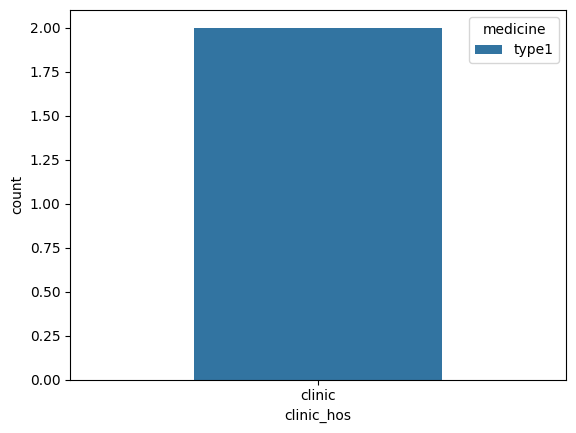

In [483]:
sns.countplot(data = a_ent_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

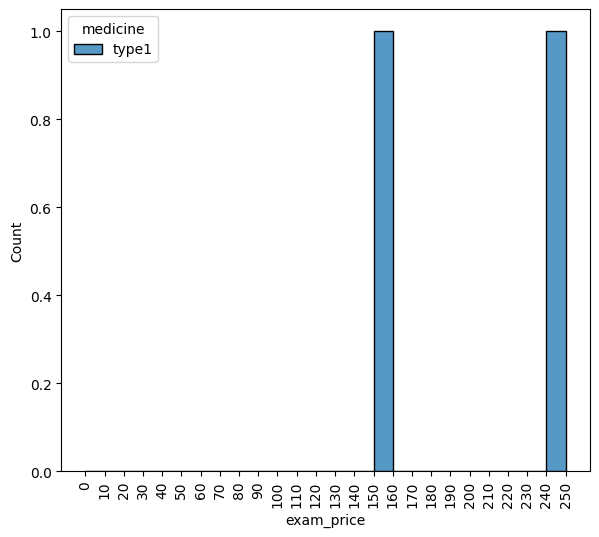

In [484]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_ent_1["exam_price"].max() + 10 , 10)

sns.histplot(data = a_ent_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , ent speciality and Area 1 Doctors 

In [485]:
b_ent_1 = data[(data["speciality"] == "ent") & (data["dr_class"] == "b") & (data["area"] == "area1")]

In [486]:
b_ent_1["medicine"].value_counts()

medicine
type1    4
Name: count, dtype: int64

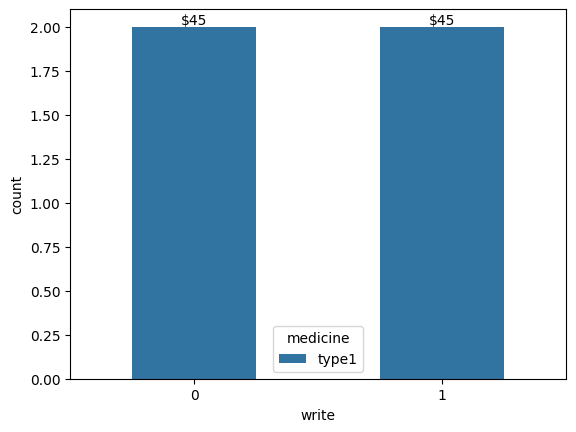

In [487]:
ax = sns.countplot(data = b_ent_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_ent_1['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

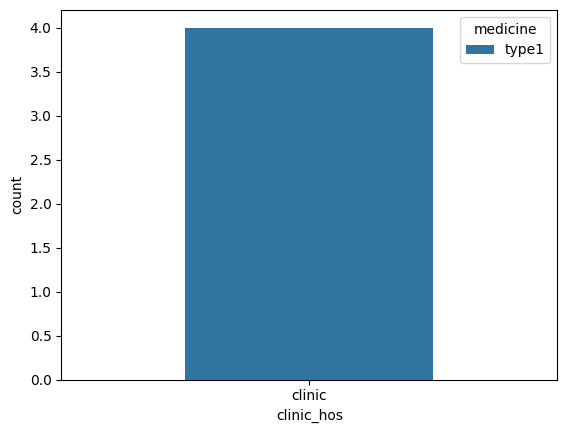

In [488]:
sns.countplot(data = b_ent_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

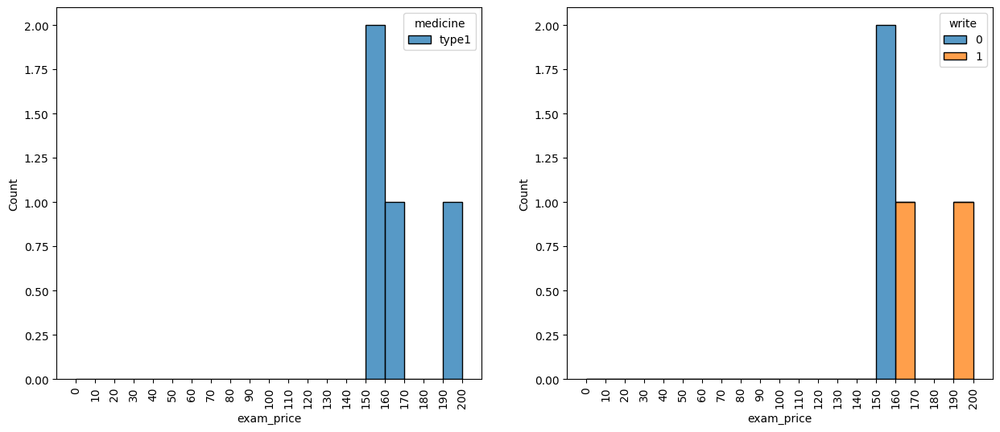

In [489]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_ent_1["exam_price"].max() + 10 , 10)

sns.histplot(data = b_ent_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_ent_1["exam_price"].max() + 10 , 10)

sns.histplot(data = b_ent_1 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [490]:
b_ent_1_1 = b_ent_1[b_ent_1["write"] == 1]

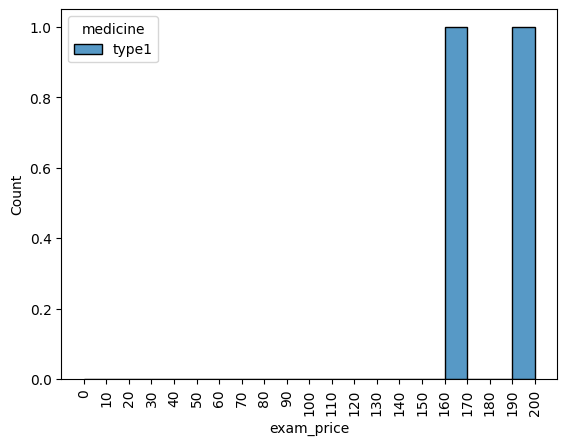

In [491]:
bins = np.arange(0 , b_ent_1["exam_price"].max() + 10 , 10)

sns.histplot(data = b_ent_1_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 1

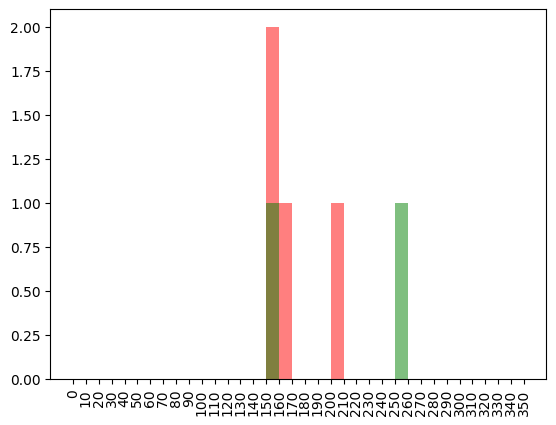

In [492]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_ent_1 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_ent_1 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , ent speciality and Area 2 Doctors 

In [493]:
a_ent_2 = data[(data["speciality"] == "ent") & (data["dr_class"] == "a") & (data["area"] == "area2")]

In [494]:
a_ent_2["medicine"].value_counts()

medicine
type1    3
type5    1
Name: count, dtype: int64

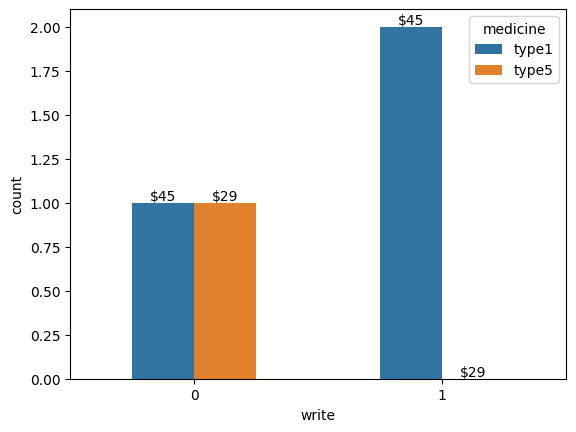

In [495]:
ax = sns.countplot(data = a_ent_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_ent_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

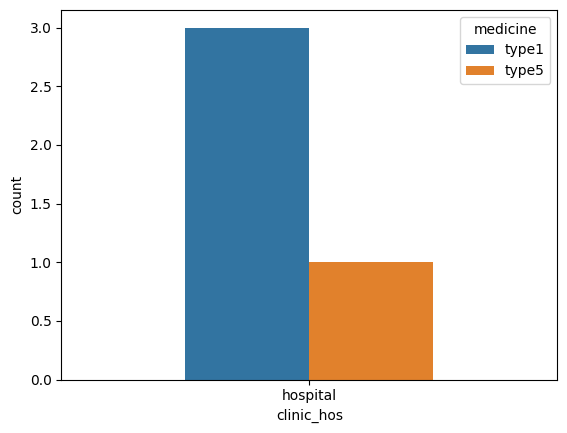

In [496]:
sns.countplot(data = a_ent_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

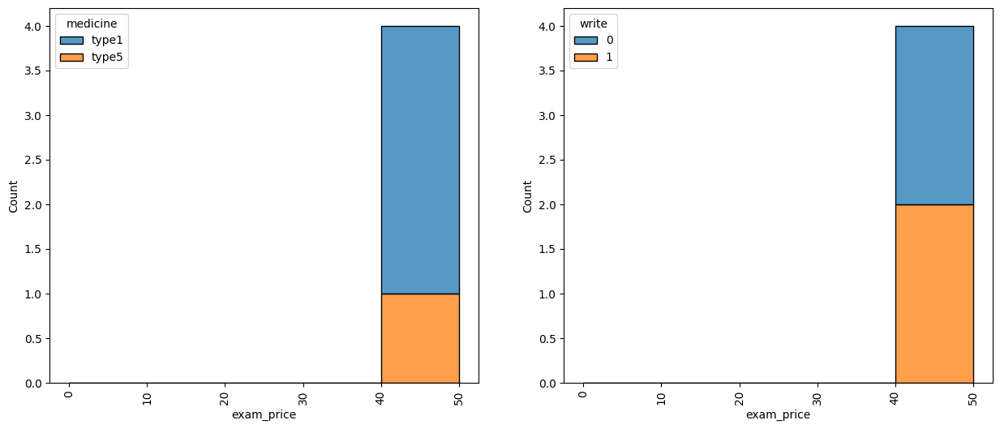

In [497]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_ent_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_ent_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_ent_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_ent_2 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [498]:
a_ent_2_1 = a_ent_2[a_ent_2["write"] == 1]

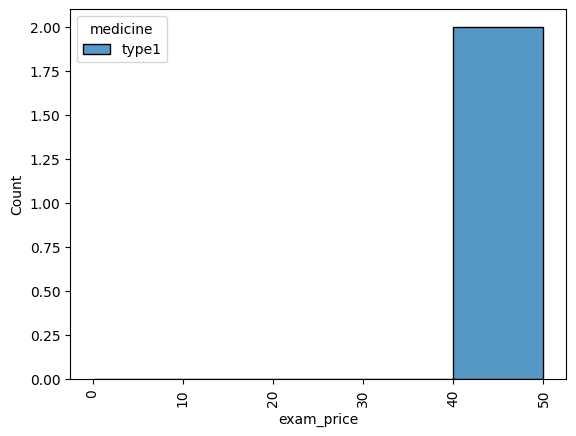

In [499]:
bins = np.arange(0 , a_ent_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_ent_2_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , ent speciality and Area 4 Doctors 

In [500]:
a_ent_4 = data[(data["speciality"] == "ent") & (data["dr_class"] == "a") & (data["area"] == "area4")]

In [501]:
a_ent_4["medicine"].value_counts()

medicine
type1    1
Name: count, dtype: int64

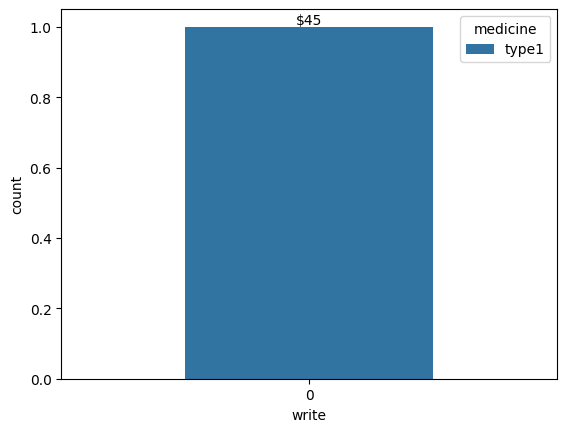

In [502]:
ax = sns.countplot(data = a_ent_4 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_ent_4['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

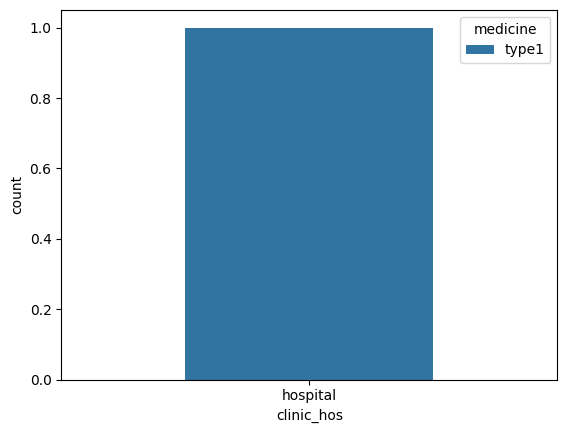

In [503]:
sns.countplot(data = a_ent_4 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

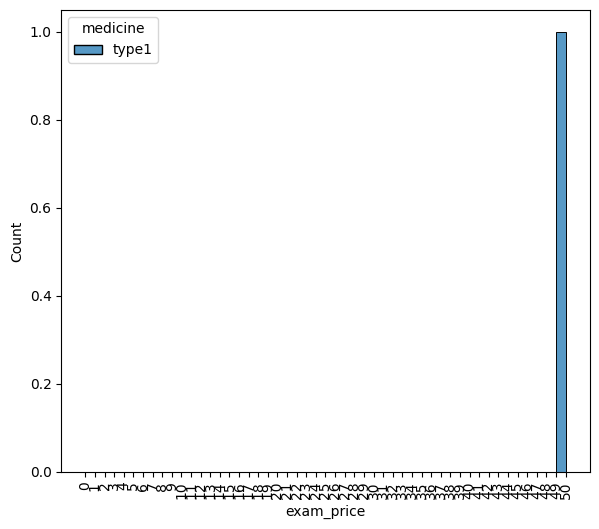

In [504]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_ent_4["exam_price"].max() + 1 , 1)

sns.histplot(data = a_ent_4 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , ent speciality and Area 4 Doctors 

In [505]:
b_ent_4 = data[(data["speciality"] == "ent") & (data["dr_class"] == "b") & (data["area"] == "area4")]

In [506]:
b_ent_4["medicine"].value_counts()

medicine
type1    1
Name: count, dtype: int64

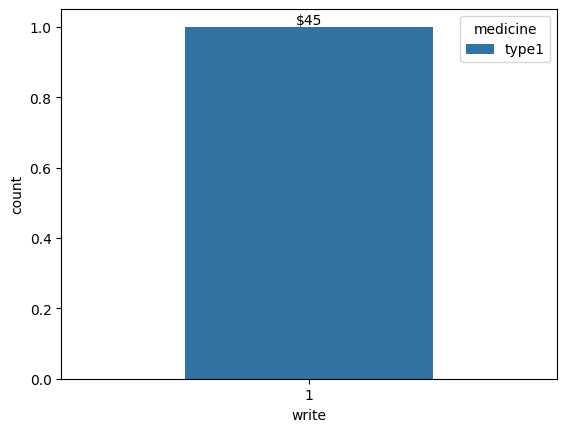

In [507]:
ax = sns.countplot(data = b_ent_4 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_ent_4['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

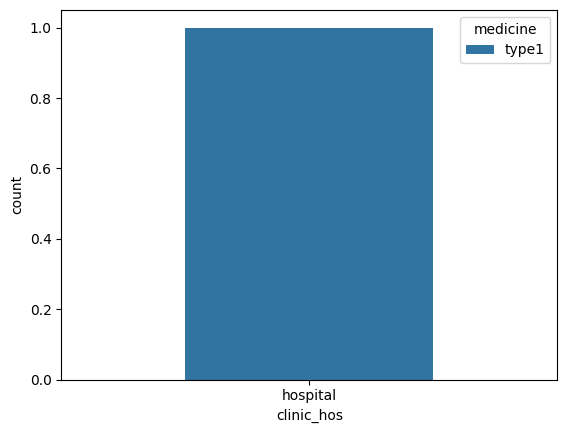

In [508]:
sns.countplot(data = b_ent_4 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

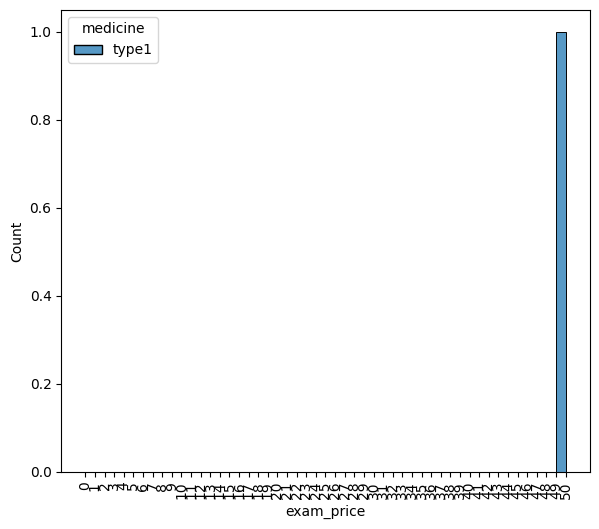

In [509]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_ent_4["exam_price"].max() + 1 , 1)

sns.histplot(data = b_ent_4 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 4

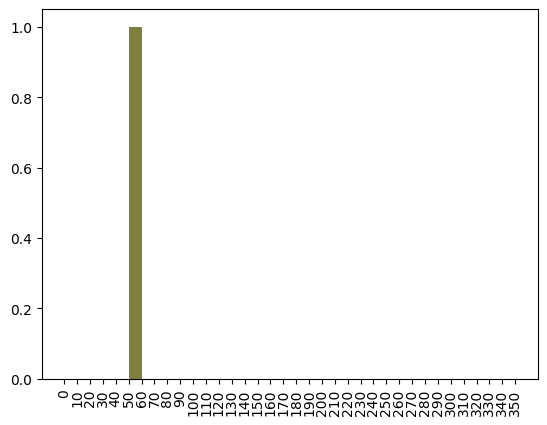

In [510]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_ent_4 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_ent_4 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class b , ent speciality and Area 6 Doctors 

In [511]:
b_ent_6 = data[(data["speciality"] == "ent") & (data["dr_class"] == "b") & (data["area"] == "area6")]

In [512]:
b_ent_6["medicine"].value_counts()

medicine
type1    2
type5    2
Name: count, dtype: int64

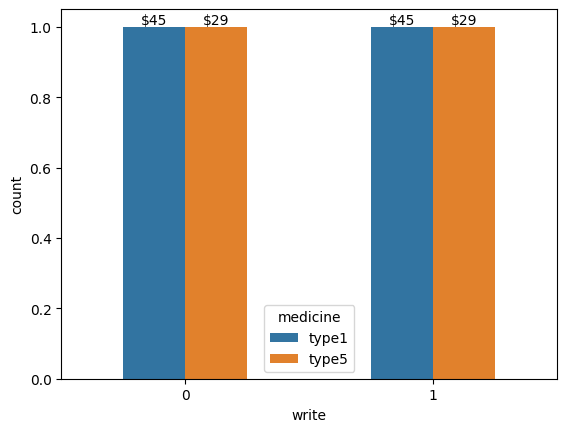

In [513]:
ax = sns.countplot(data = b_ent_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_ent_6['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

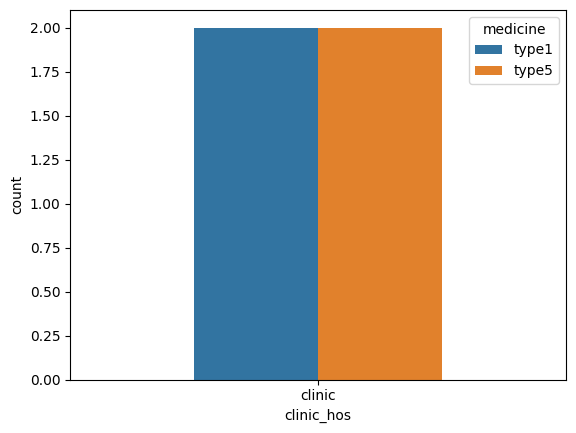

In [514]:
sns.countplot(data = b_ent_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

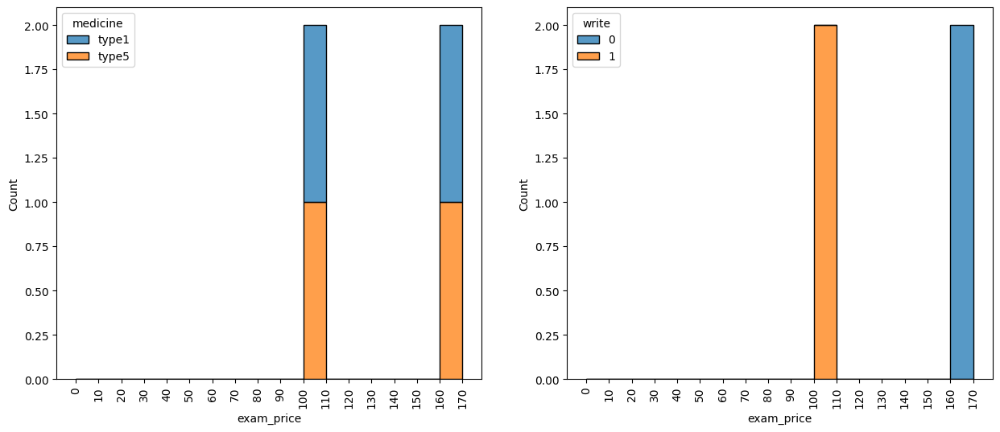

In [515]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_ent_6["exam_price"].max() + 10 , 10)

sns.histplot(data = b_ent_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_ent_6["exam_price"].max() + 10 , 10)

sns.histplot(data = b_ent_6 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [516]:
b_ent_6_1 = b_ent_6[b_ent_6["write"] == 1]

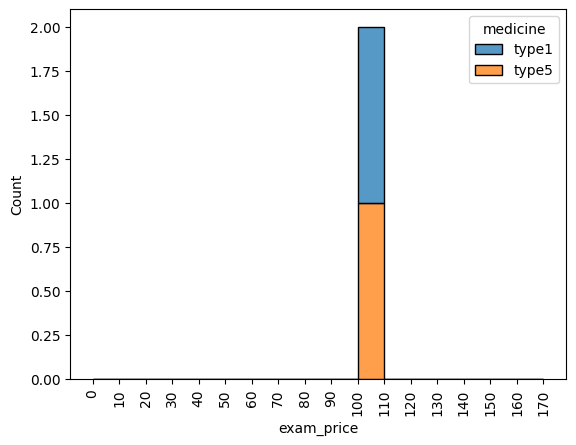

In [517]:
bins = np.arange(0 , b_ent_6["exam_price"].max() + 10 , 10)

sns.histplot(data = b_ent_6_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , ent speciality and Area 8 Doctors 

In [518]:
b_ent_8 = data[(data["speciality"] == "ent") & (data["dr_class"] == "b") & (data["area"] == "area8")]

In [519]:
b_ent_8["medicine"].value_counts()

medicine
type1    3
type5    2
Name: count, dtype: int64

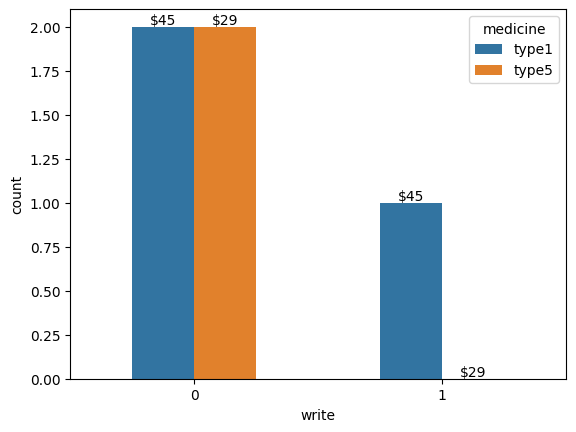

In [520]:
ax = sns.countplot(data = b_ent_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_ent_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

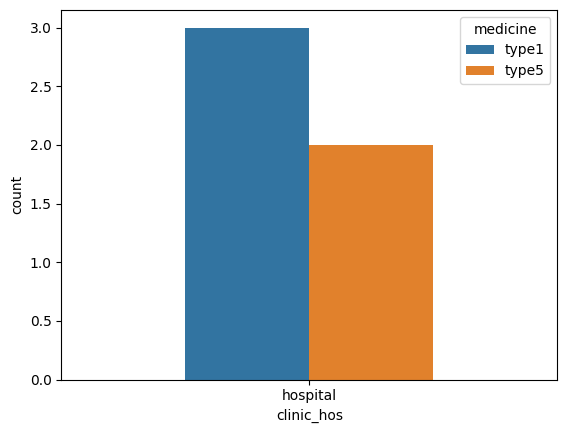

In [521]:
sns.countplot(data = b_ent_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

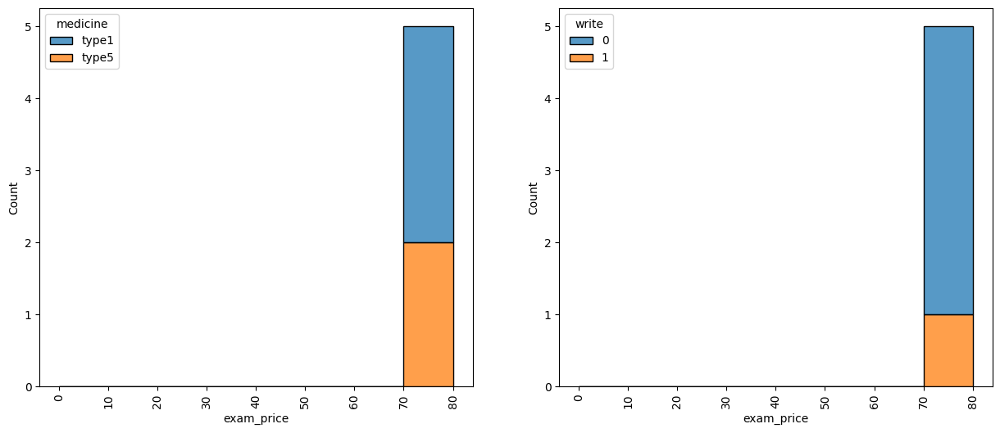

In [522]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_ent_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_ent_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_ent_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_ent_8 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

In [523]:
b_ent_8_1 = b_ent_8[b_ent_8["write"] == 1]

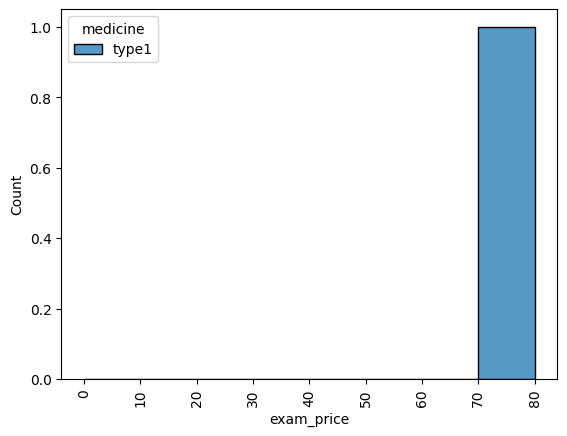

In [524]:
bins = np.arange(0 , b_ent_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_ent_8_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Summary For ent Doctors Analysis

#### 55% ent dcotors in Class a write 

#### They write type 1 most and they did not write type 5

#### clincs and hospitals

In [525]:
ent_a = data[(data["speciality"] == "ent") & (data["dr_class"] == "a")]

ent_a_1 = data[(data["speciality"] == "ent") & (data["dr_class"] == "a") & (data["write"] == 1)]

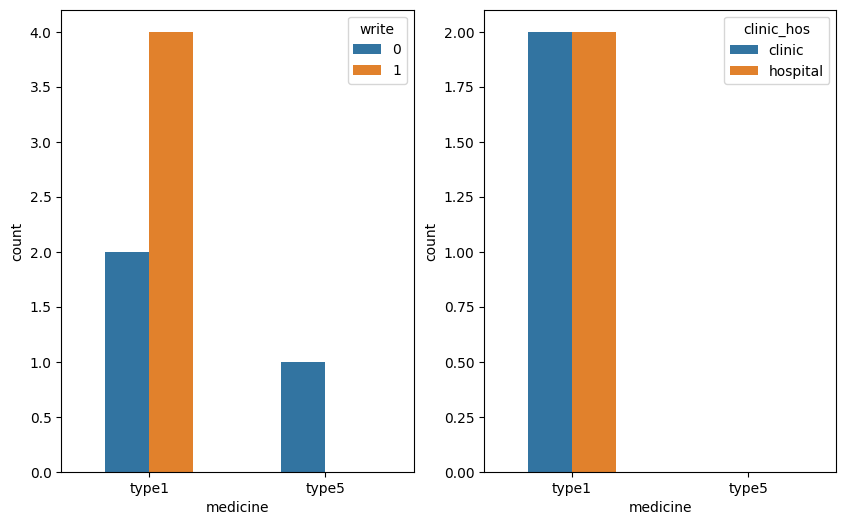

In [526]:
plt.figure(figsize = [10 , 6])



order = ent_a["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = ent_a , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = ent_a_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

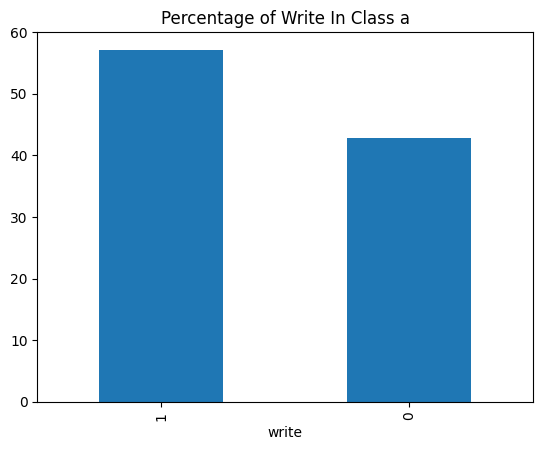

In [527]:
write_per = ent_a["write"].value_counts().sort_values(ascending = False) / ent_a.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class a");

#### 55% ent dcotors in Class b did not write 

#### They write Type 1 50%

#### most in clincs

In [528]:
ent_b = data[(data["speciality"] == "ent") & (data["dr_class"] == "b")]

ent_b_1 = data[(data["speciality"] == "ent") & (data["dr_class"] == "b") & (data["write"] == 1)]

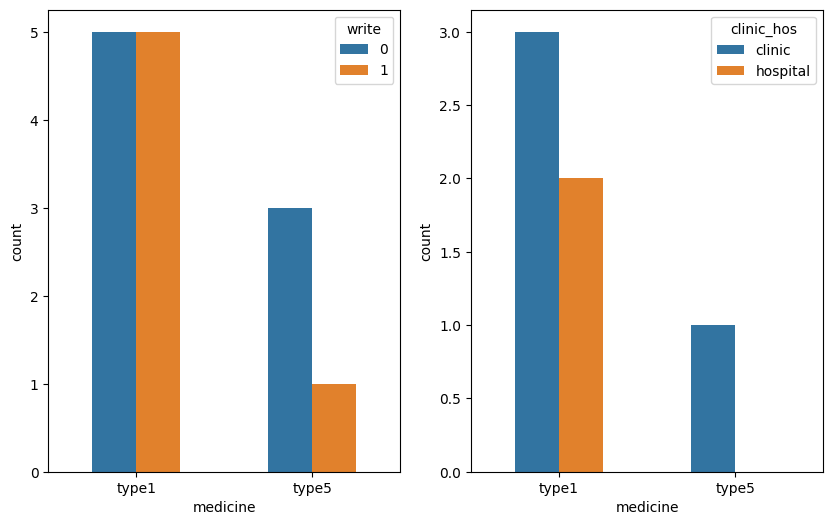

In [529]:
plt.figure(figsize = [10 , 6])



order = ent_b["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = ent_b , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = ent_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

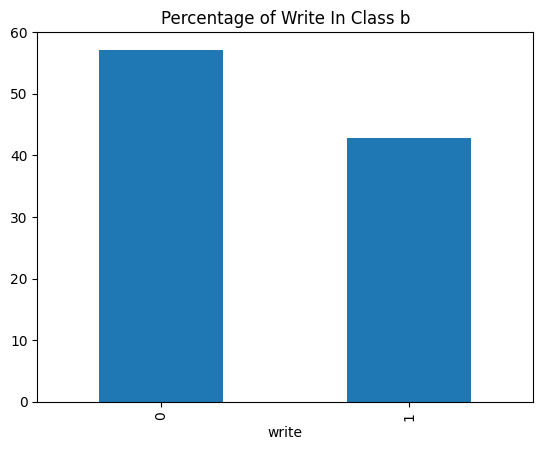

In [530]:
write_per = ent_b["write"].value_counts().sort_values(ascending = False) / ent_b.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class b");

In [531]:
ent_1 = data[(data["speciality"] == "ent") & (data["write"] == 1)]

In [532]:
import plotly.express as px

fig = px.scatter(ent_1 , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

In [533]:
import plotly.express as px

fig = px.scatter(ent_1 , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [534]:
ent_a = ent_1[ent_1["dr_class"] == "a"]



import plotly.express as px

fig = px.scatter(ent_a , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [535]:
fig= px.histogram(ent_1 , x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of im Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

In [536]:
fig= px.histogram(ent_1 , x='exam_price',height=500,width=900,template='simple_white',

color='dr_class', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of Im Doctors by Class','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

In [537]:
fig= px.histogram(ent_1, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Im Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

#  or Doctors

### Class a , or speciality and Area 1 Doctors 

In [538]:
a_or_1 = data[(data["speciality"] == "or") & (data["dr_class"] == "a") & (data["area"] == "area1")]

In [539]:
a_or_1["medicine"].value_counts()

medicine
type1    3
Name: count, dtype: int64

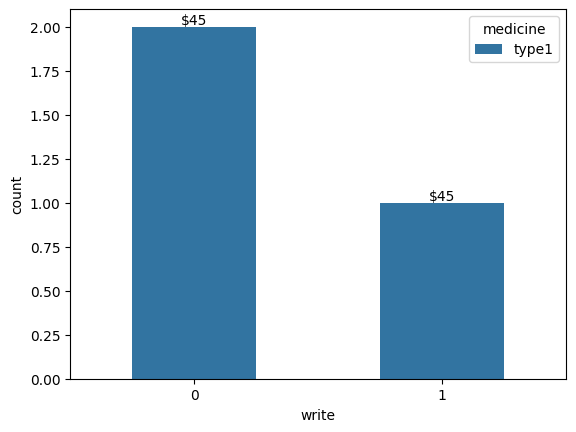

In [540]:
ax = sns.countplot(data = a_or_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_or_1['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

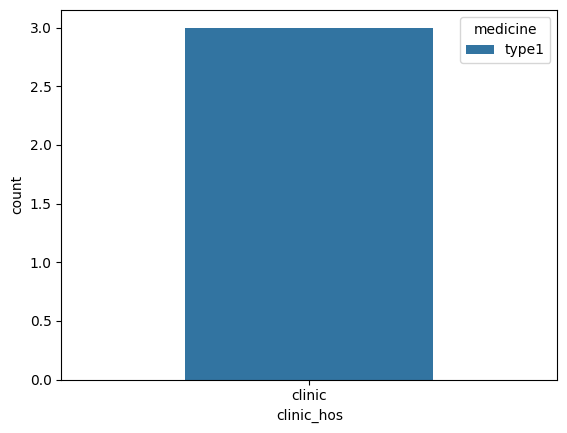

In [541]:
sns.countplot(data = a_or_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

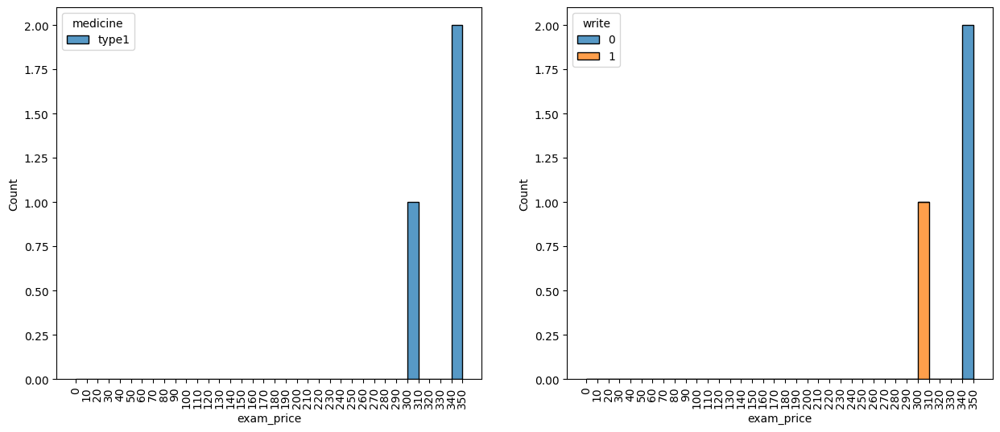

In [542]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_or_1["exam_price"].max() + 10 , 10)

sns.histplot(data = a_or_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_or_1["exam_price"].max() + 10 , 10)

sns.histplot(data = a_or_1 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , ent speciality and Area 1 Doctors 

In [543]:
b_or_1 = data[(data["speciality"] == "or") & (data["dr_class"] == "b") & (data["area"] == "area1")]

In [544]:
b_or_1["medicine"].value_counts()

medicine
type1    1
type5    1
Name: count, dtype: int64

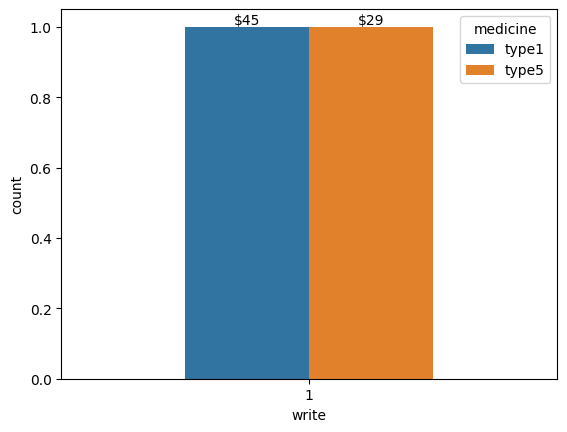

In [545]:
ax = sns.countplot(data = b_or_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_or_1['medicine'].unique()



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

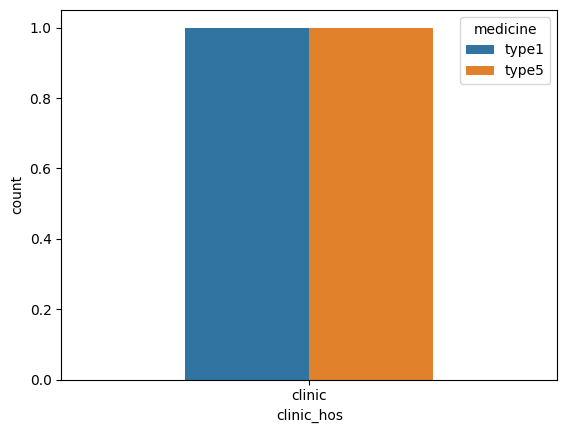

In [546]:
sns.countplot(data = b_or_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

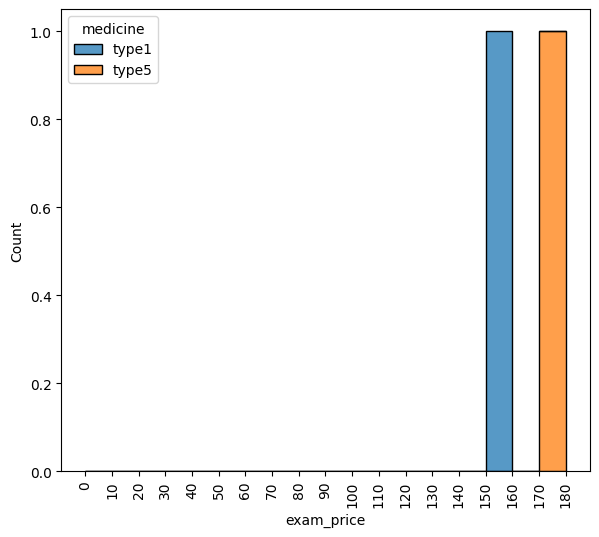

In [547]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_or_1["exam_price"].max() + 10 , 10)

sns.histplot(data = b_or_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 1

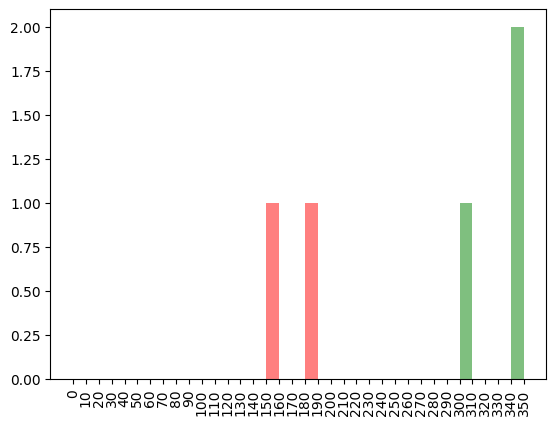

In [548]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_or_1 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_or_1 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , or speciality and Area 2 Doctors 

In [549]:
a_or_2 = data[(data["speciality"] == "or") & (data["dr_class"] == "a") & (data["area"] == "area2")]

In [550]:
a_or_2["medicine"].value_counts()

medicine
type1    2
Name: count, dtype: int64

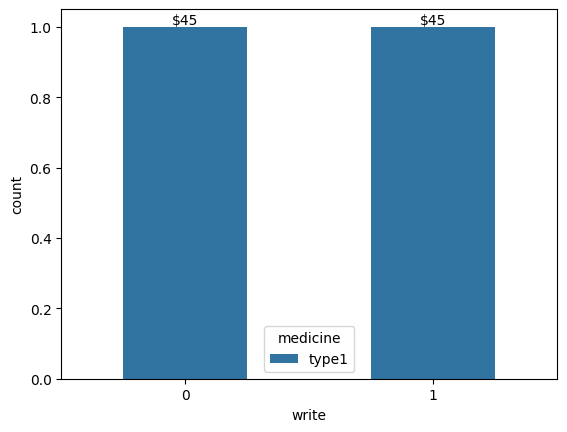

In [551]:
ax = sns.countplot(data = a_or_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_or_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

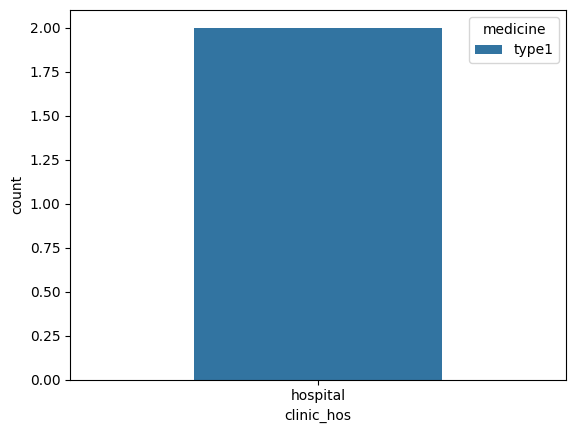

In [552]:
sns.countplot(data = a_or_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

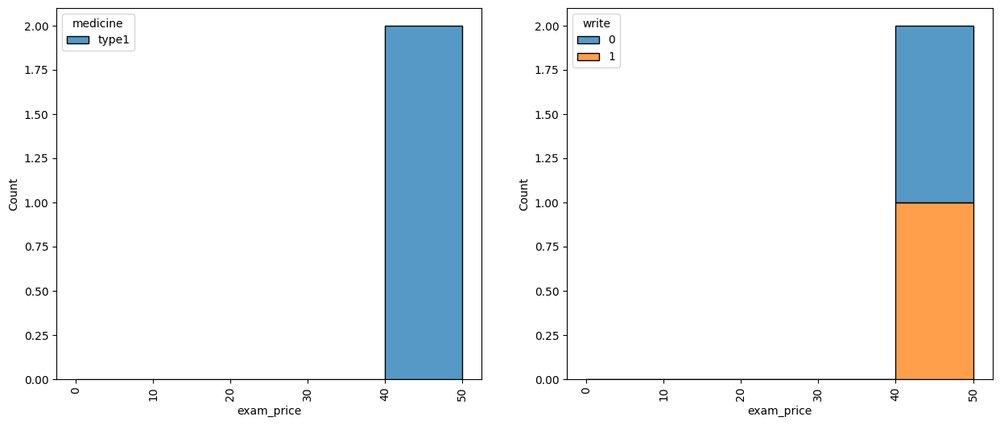

In [553]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_or_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_or_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_or_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_or_2 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , or speciality and Area 4 Doctors 

In [554]:
a_or_4 = data[(data["speciality"] == "or") & (data["dr_class"] == "a") & (data["area"] == "area4")]

In [555]:
a_or_4["medicine"].value_counts()

medicine
type1    1
Name: count, dtype: int64

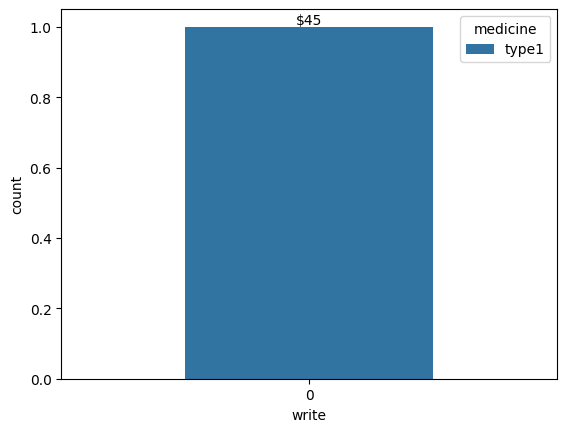

In [556]:
ax = sns.countplot(data = a_or_4 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_or_4['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

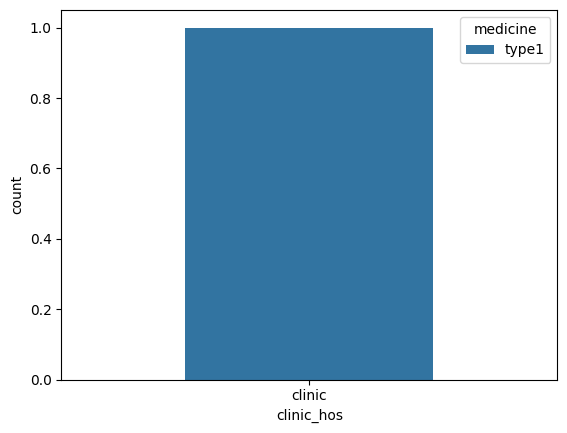

In [557]:
sns.countplot(data = a_or_4 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

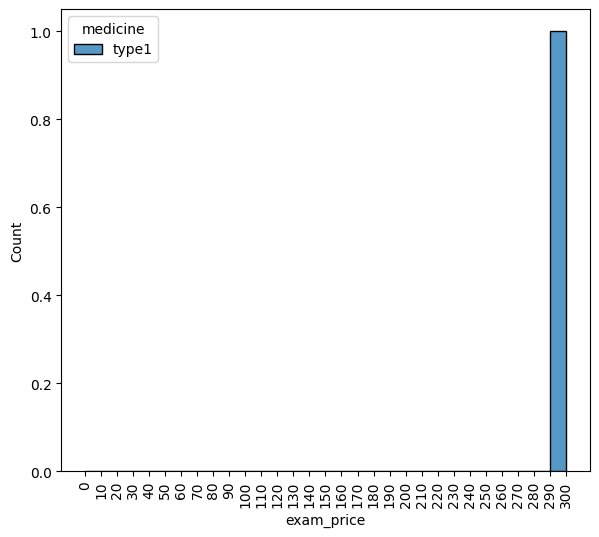

In [558]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_or_4["exam_price"].max() + 10 , 10)

sns.histplot(data = a_or_4 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , or speciality and Area 4 Doctors 

In [559]:
b_or_4 = data[(data["speciality"] == "or") & (data["dr_class"] == "b") & (data["area"] == "area4")]

In [560]:
b_or_4["medicine"].value_counts()

medicine
type1    2
Name: count, dtype: int64

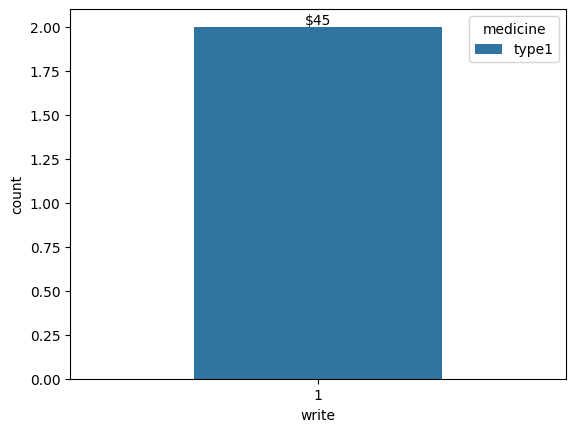

In [561]:
ax = sns.countplot(data = b_or_4 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_or_4['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

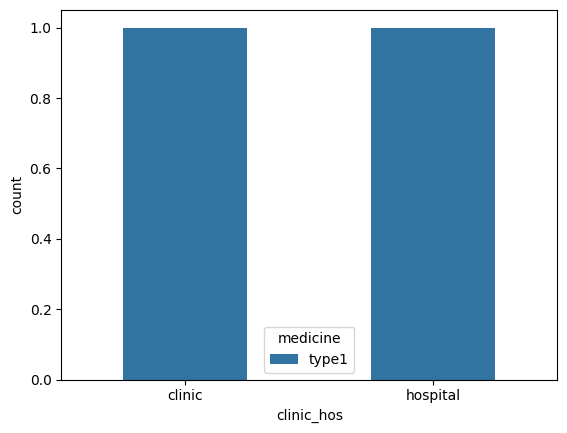

In [562]:
sns.countplot(data = b_or_4 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

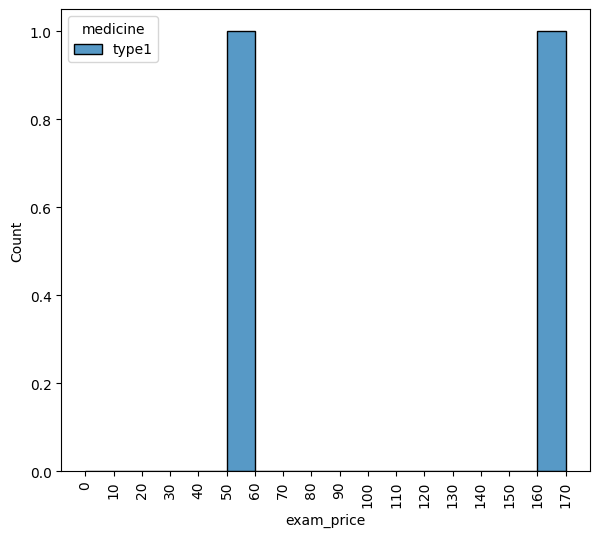

In [563]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_or_4["exam_price"].max() + 10 , 10)

sns.histplot(data = b_or_4 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 4

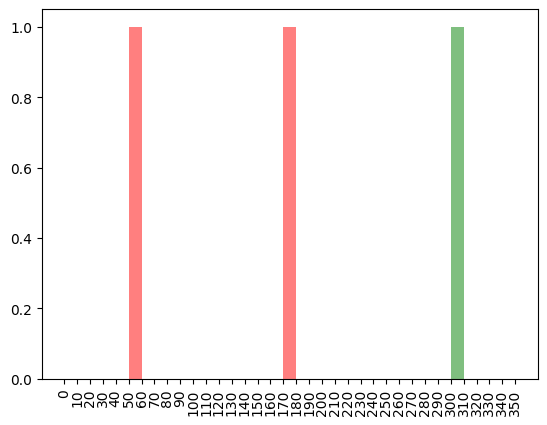

In [564]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_or_4 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_or_4 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class b , or speciality and Area 6 Doctors 

In [565]:
b_or_6 = data[(data["speciality"] == "or") & (data["dr_class"] == "b") & (data["area"] == "area6")]

In [566]:
b_or_6["medicine"].value_counts()

medicine
type1    2
Name: count, dtype: int64

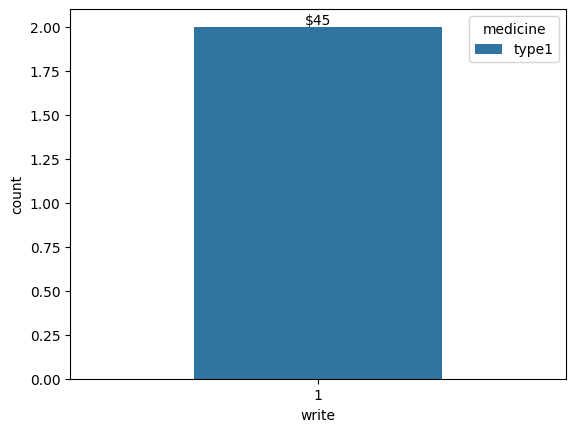

In [567]:
ax = sns.countplot(data = b_or_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_or_6['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

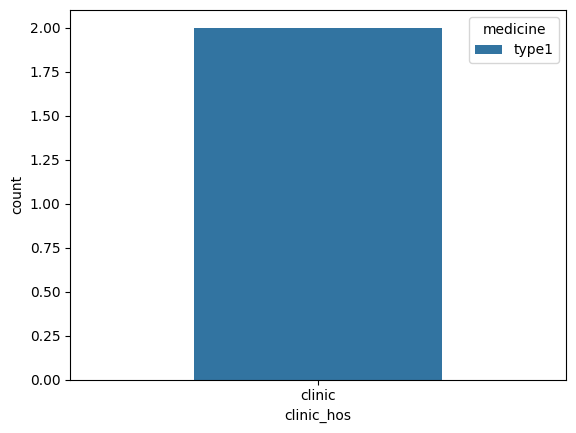

In [568]:
sns.countplot(data = b_or_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

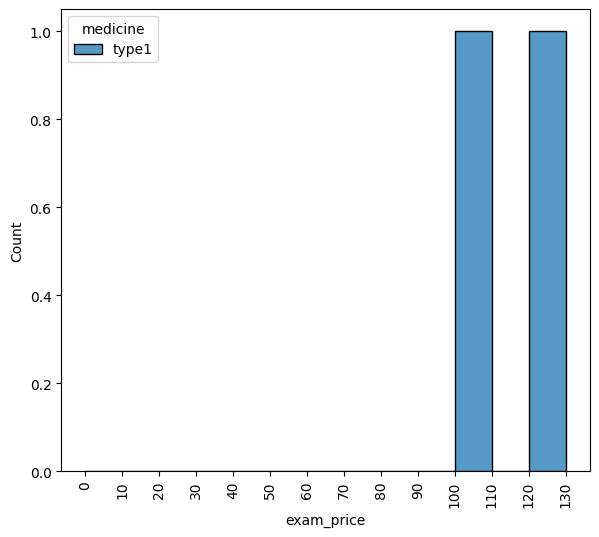

In [569]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_or_6["exam_price"].max() + 10 , 10)

sns.histplot(data = b_or_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , or speciality and Area 8 Doctors 

In [570]:
a_or_8 = data[(data["speciality"] == "or") & (data["dr_class"] == "a") & (data["area"] == "area8")]

In [571]:
a_or_8["medicine"].value_counts()

medicine
type1    3
Name: count, dtype: int64

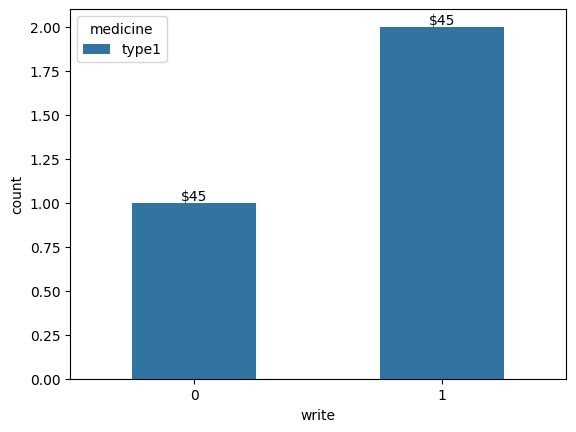

In [572]:
ax = sns.countplot(data = a_or_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_or_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

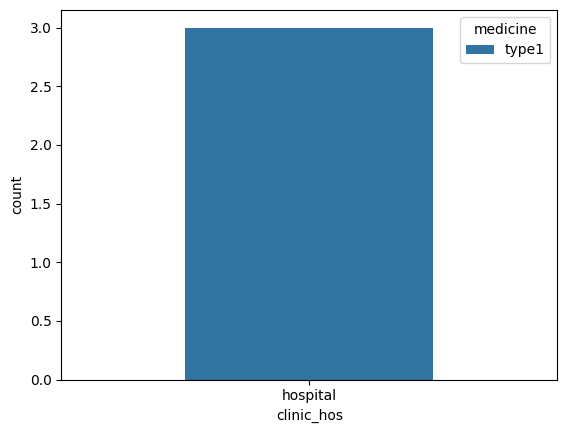

In [573]:
sns.countplot(data = a_or_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

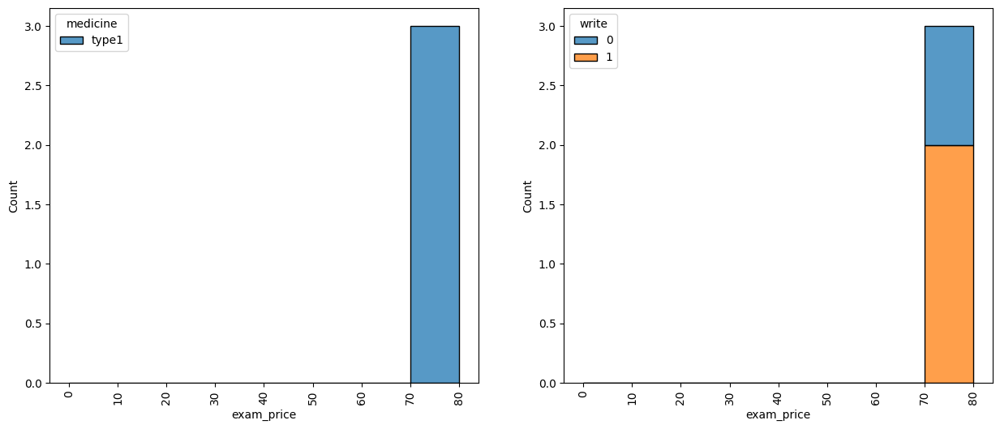

In [574]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_or_8["exam_price"].max() + 10 , 10)

sns.histplot(data = a_or_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_or_8["exam_price"].max() + 10 , 10)

sns.histplot(data = a_or_8 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , ent speciality and Area 8 Doctors 

In [575]:
b_or_8 = data[(data["speciality"] == "or") & (data["dr_class"] == "b") & (data["area"] == "area8")]

In [576]:
b_or_8["medicine"].value_counts()

medicine
type1    4
Name: count, dtype: int64

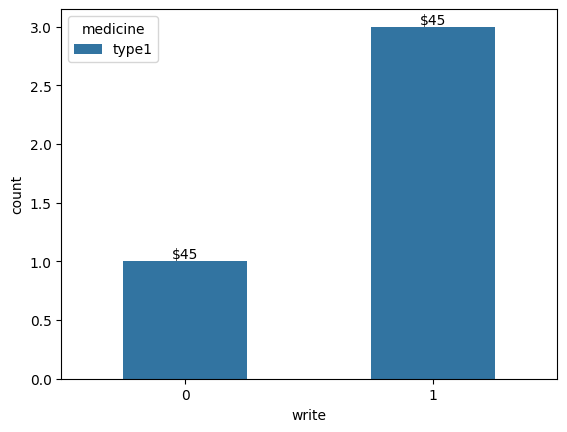

In [577]:
ax = sns.countplot(data = b_or_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_or_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

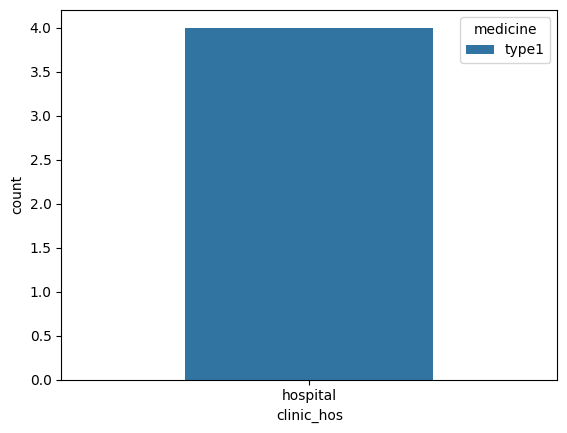

In [578]:
sns.countplot(data = b_or_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

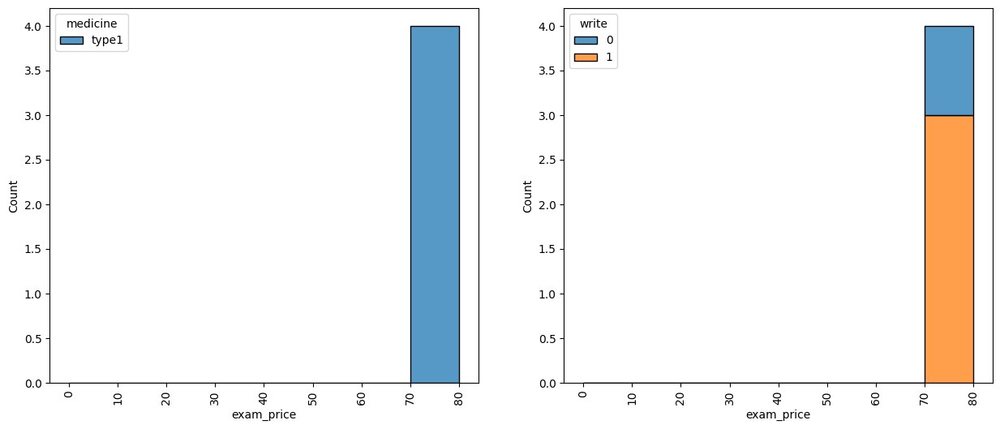

In [579]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_or_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_or_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_or_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_or_8 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 8

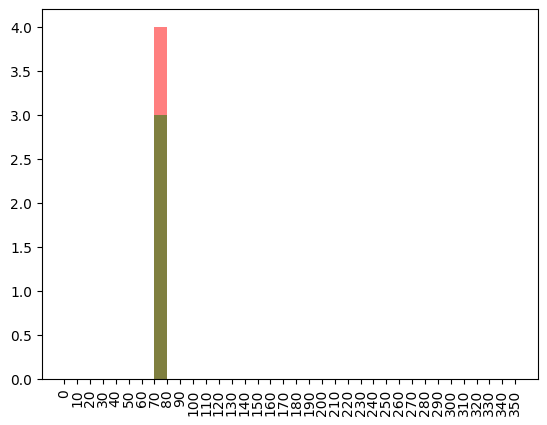

In [580]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_or_8 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_or_8 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Summary For or Doctors Analysis

#### 55% ent dcotors in Class a did not write 

#### They write type 1 only

#### most in hospitlas

In [581]:
or_a = data[(data["speciality"] == "or") & (data["dr_class"] == "a")]

or_a_1 = data[(data["speciality"] == "or") & (data["dr_class"] == "a") & (data["write"] == 1)]

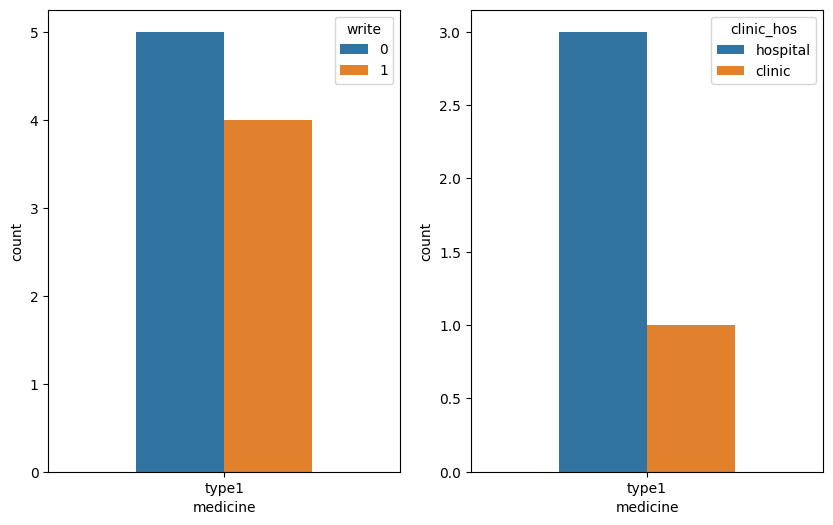

In [582]:
plt.figure(figsize = [10 , 6])



order = or_a["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = or_a , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = or_a_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

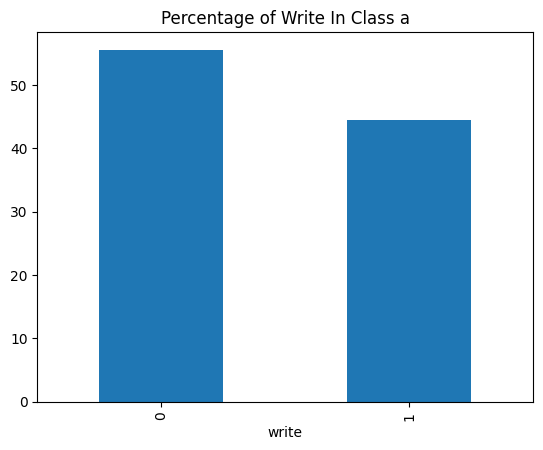

In [583]:
write_per = or_a["write"].value_counts().sort_values(ascending = False) / or_a.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class a");

#### 85% ent dcotors in Class b write 

#### They write Type 1 and 5

#### most in clincs

In [584]:
or_b = data[(data["speciality"] == "or") & (data["dr_class"] == "b")]

or_b_1 = data[(data["speciality"] == "ent") & (data["dr_class"] == "b") & (data["write"] == 1)]

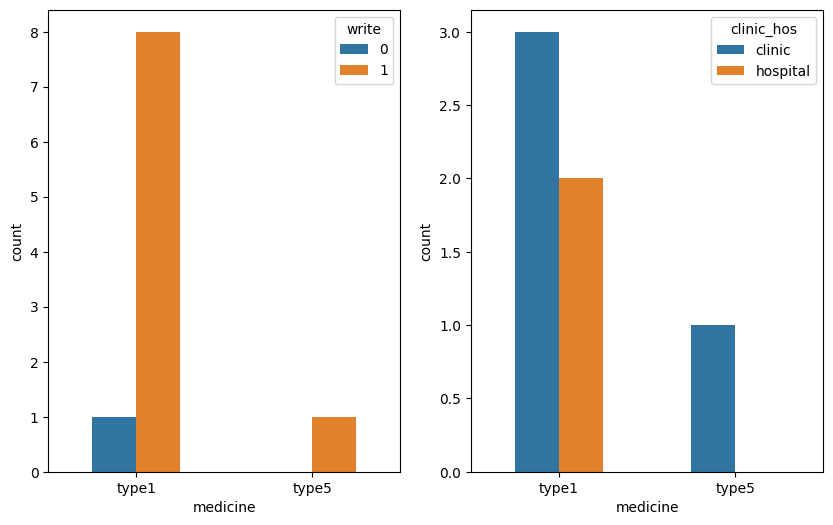

In [585]:
plt.figure(figsize = [10 , 6])



order = or_b["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = or_b , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = or_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

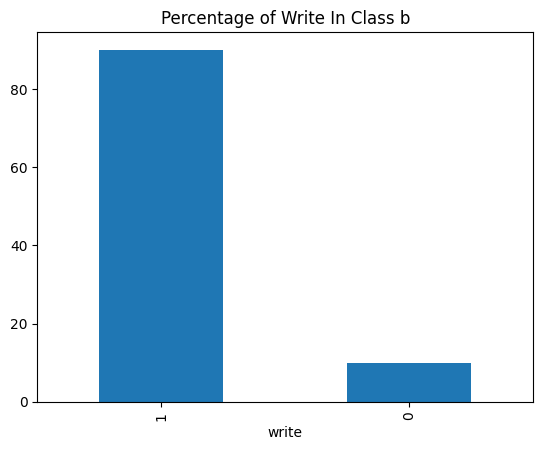

In [586]:
write_per = or_b["write"].value_counts().sort_values(ascending = False) / or_b.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class b");

### Class b in low ranges

In [587]:
or_1 = data[(data["speciality"] == "or") & (data["write"] == 1)]

In [588]:
import plotly.express as px

fig = px.scatter(or_1 , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

In [589]:
import plotly.express as px

fig = px.scatter(or_1 , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

### Class 1 low ranges in hospitals 

In [590]:
or_a = or_1[or_1["dr_class"] == "a"]



import plotly.express as px

fig = px.scatter(or_a , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [591]:
fig= px.histogram(or_1 , x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of im Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

In [592]:
fig= px.histogram(or_1 , x='exam_price',height=500,width=900,template='simple_white',

color='dr_class', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of Im Doctors by Class','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### Areas Distribuation

In [593]:
fig= px.histogram(or_1, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Im Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

#  uro Doctors

### Class a , uro speciality and Area 2 Doctors 

In [594]:
a_uro_2 = data[(data["speciality"] == "uro") & (data["dr_class"] == "a") & (data["area"] == "area2")]

In [595]:
a_uro_2["medicine"].value_counts()

medicine
type5    1
Name: count, dtype: int64

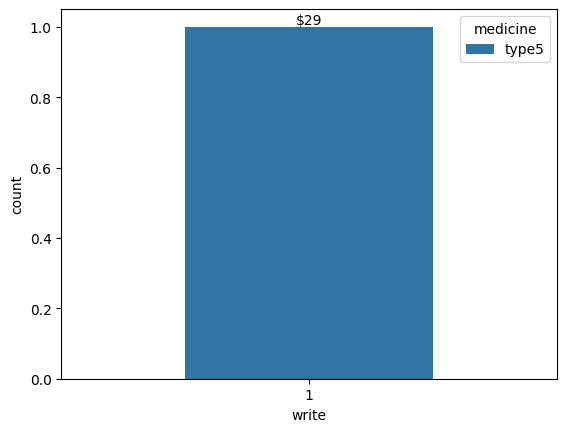

In [596]:
ax = sns.countplot(data = a_uro_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_uro_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

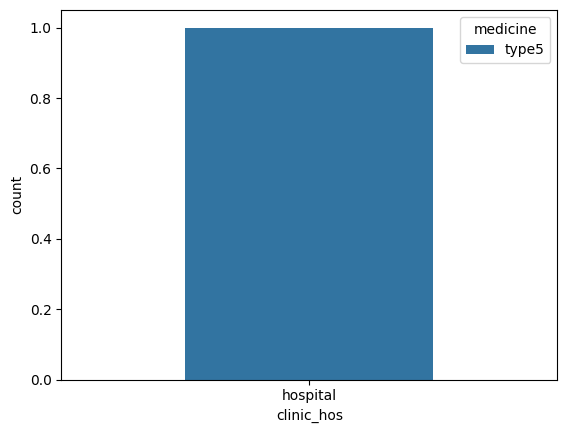

In [597]:
sns.countplot(data = a_uro_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

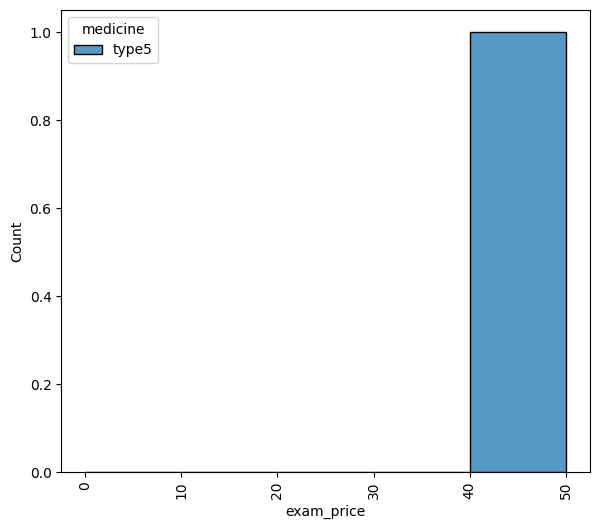

In [598]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_uro_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_uro_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , uro speciality and Area 3 Doctors 

In [599]:
a_uro_3 = data[(data["speciality"] == "uro") & (data["dr_class"] == "a") & (data["area"] == "area3")]

In [600]:
a_uro_3["medicine"].value_counts()

medicine
type5    1
Name: count, dtype: int64

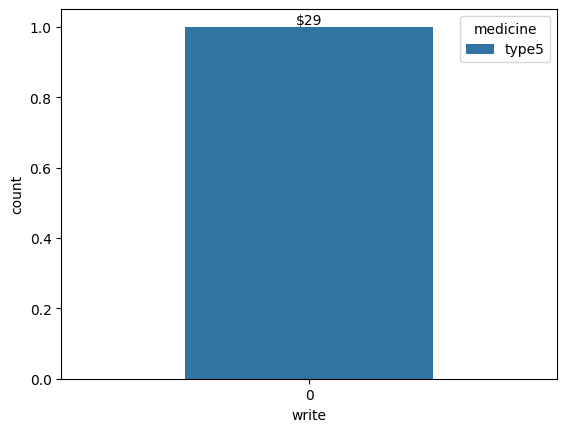

In [601]:
ax = sns.countplot(data = a_uro_3 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_uro_3['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

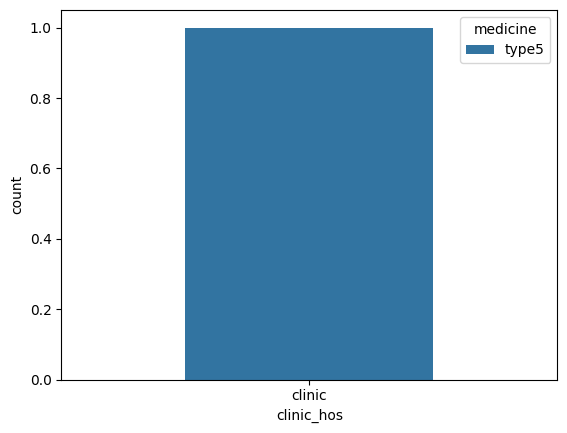

In [602]:
sns.countplot(data = a_uro_3 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

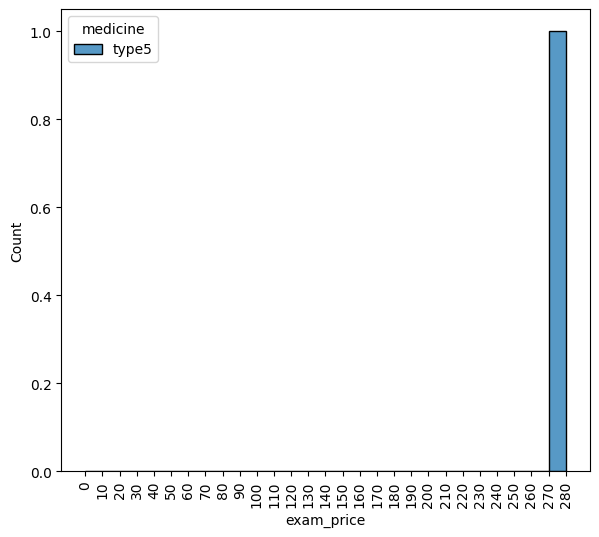

In [603]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_uro_3["exam_price"].max() + 10 , 10)

sns.histplot(data = a_uro_3 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , uro speciality and Area 6 Doctors 

In [604]:
a_uro_6 = data[(data["speciality"] == "uro") & (data["dr_class"] == "a") & (data["area"] == "area6")]

In [605]:
a_uro_6["medicine"].value_counts()

medicine
type5    2
Name: count, dtype: int64

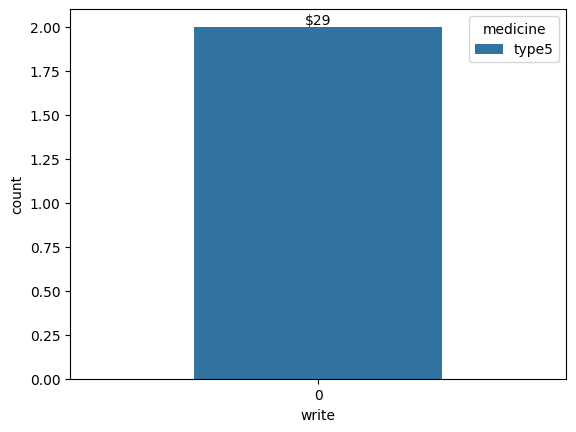

In [606]:
ax = sns.countplot(data = a_uro_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_uro_6['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

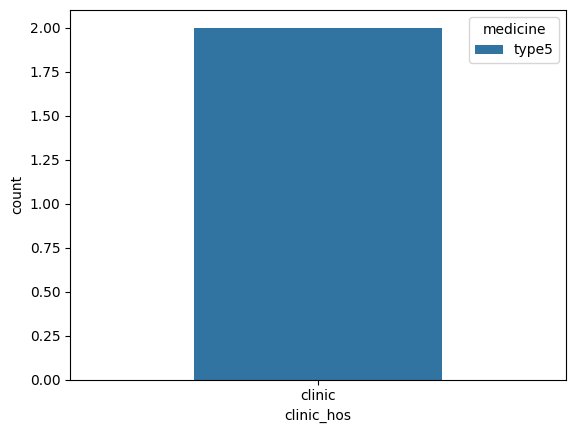

In [607]:
sns.countplot(data = a_uro_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

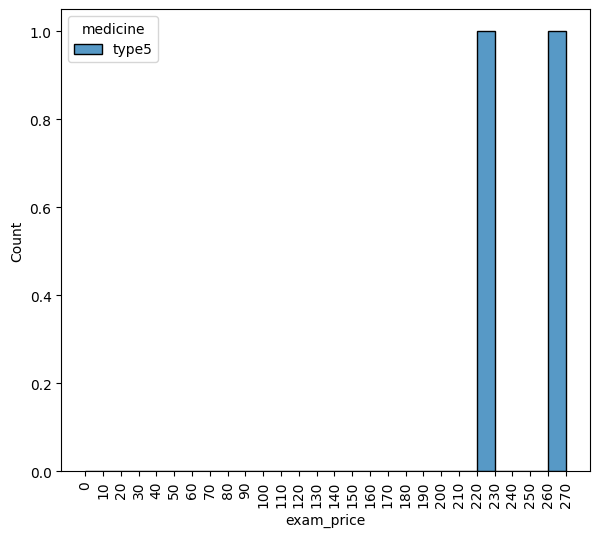

In [608]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_uro_6["exam_price"].max() + 10 , 10)

sns.histplot(data = a_uro_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , uro speciality and Area 6 Doctors 

In [609]:
b_uro_6 = data[(data["speciality"] == "uro") & (data["dr_class"] == "b") & (data["area"] == "area6")]

In [610]:
b_uro_6["medicine"].value_counts()

medicine
type5    1
Name: count, dtype: int64

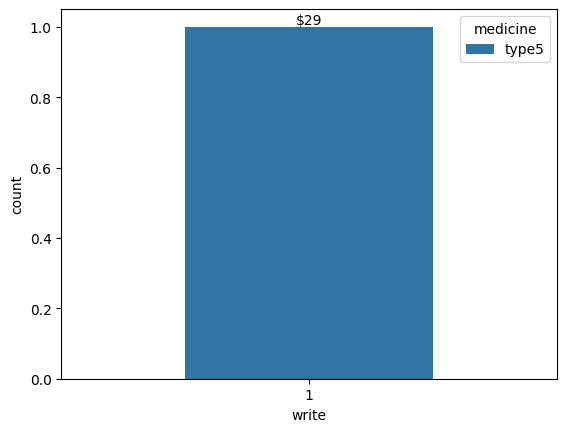

In [611]:
ax = sns.countplot(data = b_uro_6 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_uro_6['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

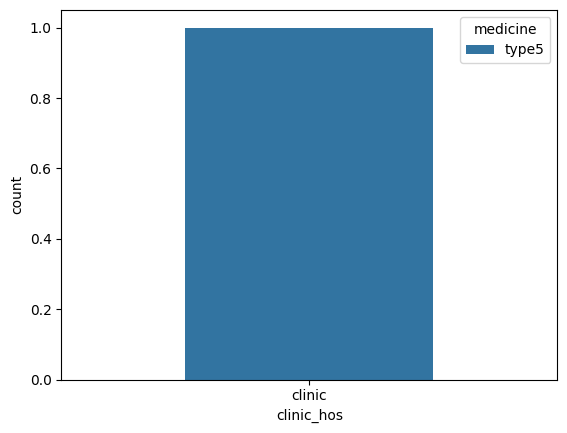

In [612]:
sns.countplot(data = b_uro_6 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

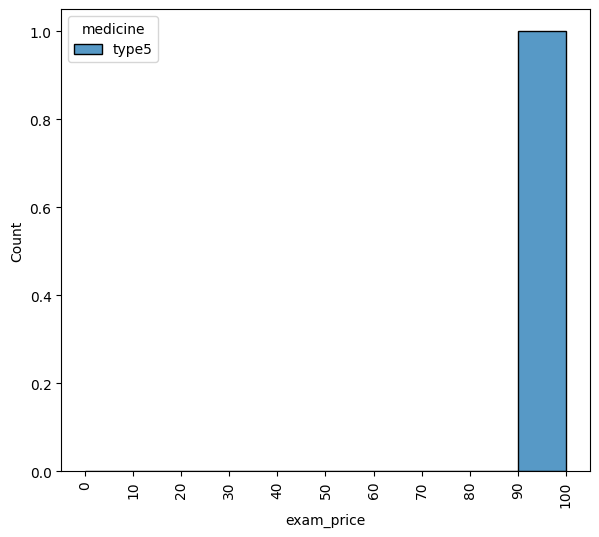

In [613]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_uro_6["exam_price"].max() + 10 , 10)

sns.histplot(data = b_uro_6 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 6

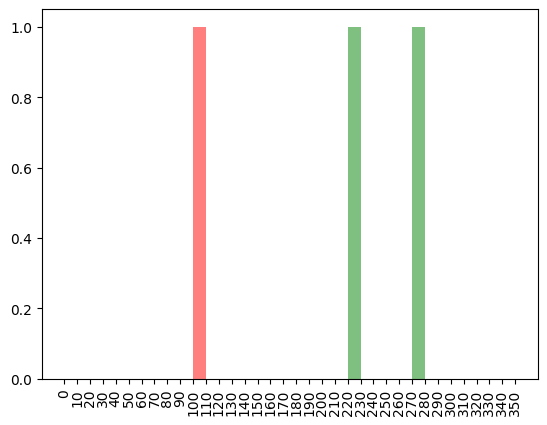

In [614]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_uro_6 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_uro_6 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , uro speciality and Area 8 Doctors 

In [615]:
a_uro_8 = data[(data["speciality"] == "uro") & (data["dr_class"] == "a") & (data["area"] == "area8")]

In [616]:
a_uro_8["medicine"].value_counts()

medicine
type5    2
Name: count, dtype: int64

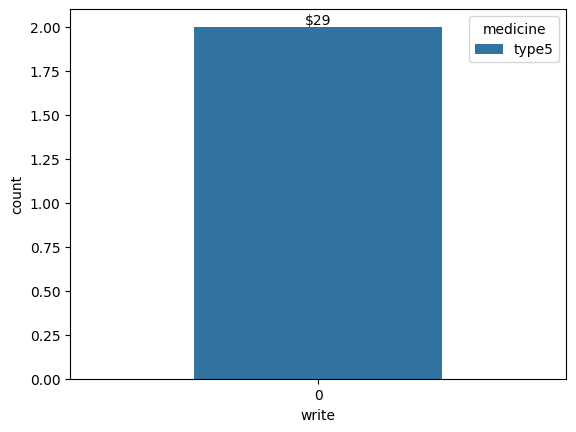

In [617]:
ax = sns.countplot(data = a_uro_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_uro_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

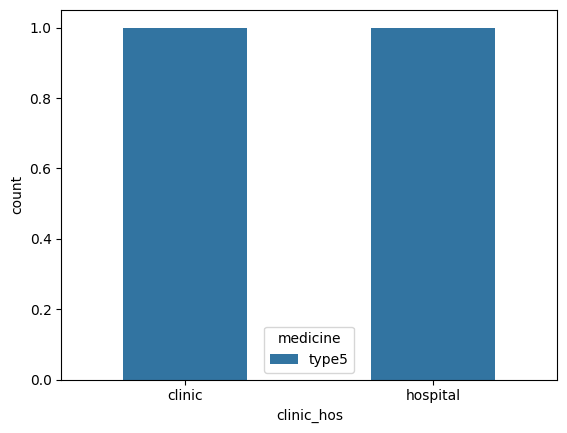

In [618]:
sns.countplot(data = a_uro_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

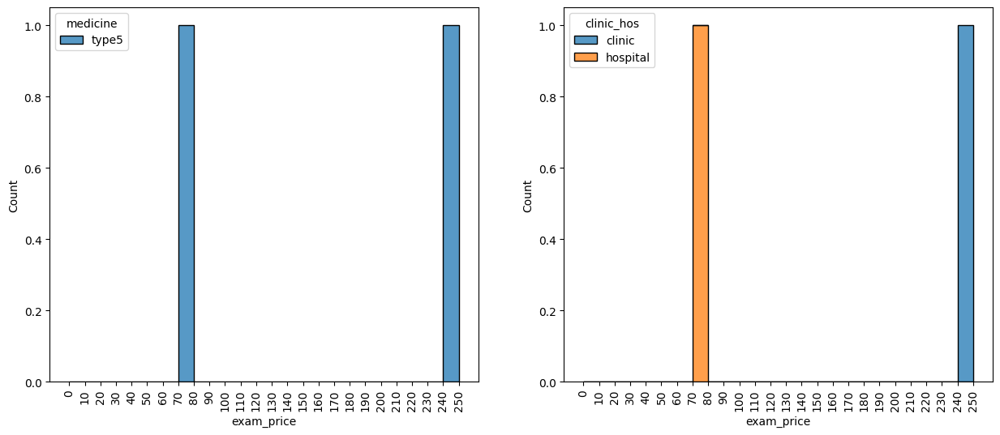

In [619]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_uro_8["exam_price"].max() + 10 , 10)

sns.histplot(data = a_uro_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , a_uro_8["exam_price"].max() + 10 , 10)

sns.histplot(data = a_uro_8 , x="exam_price", bins=bins, hue="clinic_hos", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , uro speciality and Area 8 Doctors 

In [620]:
b_uro_8 = data[(data["speciality"] == "uro") & (data["dr_class"] == "b") & (data["area"] == "area8")]

In [621]:
b_uro_8["medicine"].value_counts()

medicine
type5    3
Name: count, dtype: int64

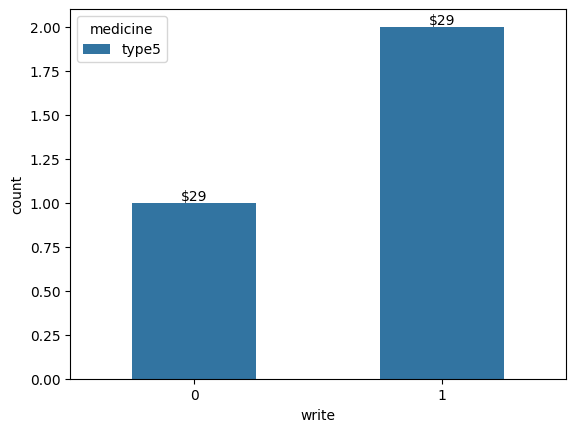

In [622]:
ax = sns.countplot(data = b_uro_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_uro_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

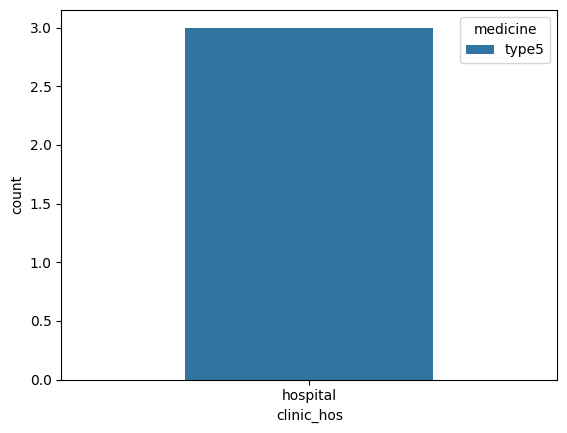

In [623]:
sns.countplot(data = b_uro_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

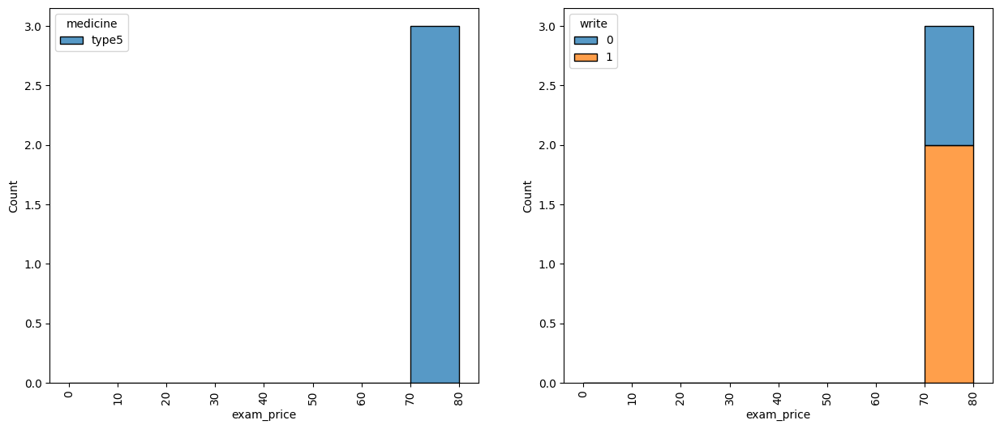

In [624]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_uro_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_uro_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_uro_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_uro_8 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 8

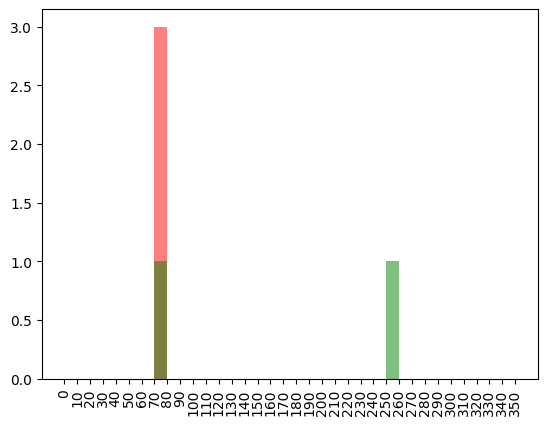

In [625]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_uro_8 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_uro_8 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Summary For uro Doctors Analysis

#### 85% uro dcotors in Class a did not write 

#### They write type 5 just one in hospital

In [626]:
uro_a = data[(data["speciality"] == "uro") & (data["dr_class"] == "a")]

uro_a_1 = data[(data["speciality"] == "uro") & (data["dr_class"] == "a") & (data["write"] == 1)]

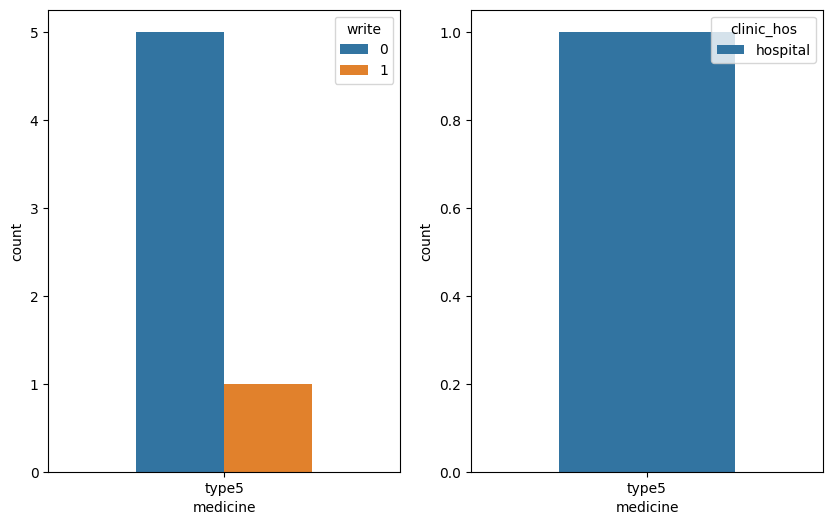

In [627]:
plt.figure(figsize = [10 , 6])



order = uro_a["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = uro_a , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = uro_a_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

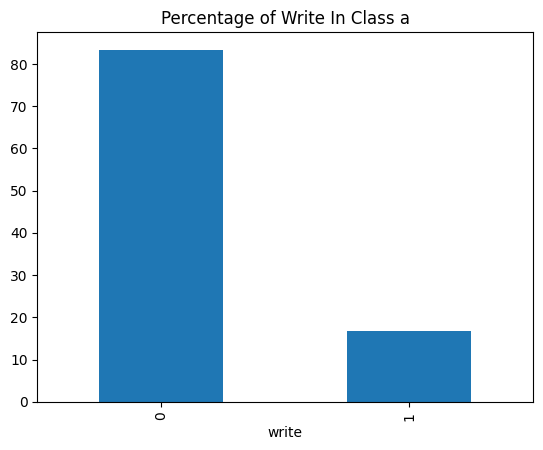

In [628]:
write_per = uro_a["write"].value_counts().sort_values(ascending = False) / uro_a.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class a");

#### 75% ent dcotors in Class b write 

#### They write only type 5

#### most in hospitals

In [629]:
uro_b = data[(data["speciality"] == "uro") & (data["dr_class"] == "b")]

uro_b_1 = data[(data["speciality"] == "uro") & (data["dr_class"] == "b") & (data["write"] == 1)]

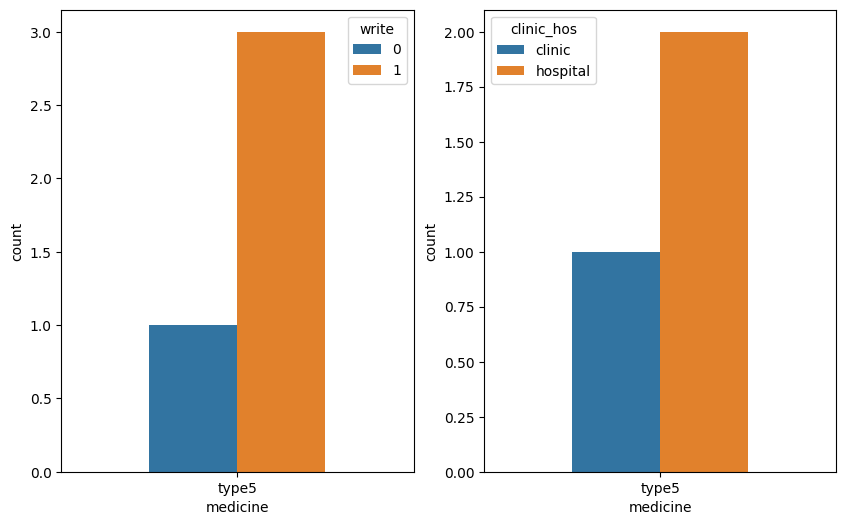

In [630]:
plt.figure(figsize = [10 , 6])



order = uro_b["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = uro_b , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = uro_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

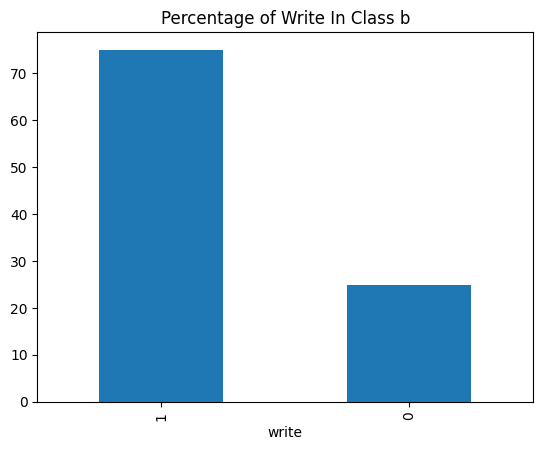

In [631]:
write_per = uro_b["write"].value_counts().sort_values(ascending = False) / uro_b.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class b");

### Class a just 1 in type 5 and in hospital and low ranges

In [632]:
uro_1 = data[(data["speciality"] == "uro") & (data["write"] == 1)]

In [633]:
import plotly.express as px

fig = px.scatter(uro_1 , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

In [634]:
import plotly.express as px

fig = px.scatter(uro_1 , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [635]:
uro_a = uro_1[uro_1["dr_class"] == "a"]



import plotly.express as px

fig = px.scatter(uro_a , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

### Most in hospitals

In [636]:
fig= px.histogram(uro_1 , x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of im Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

In [637]:
fig= px.histogram(uro_1 , x='exam_price',height=500,width=900,template='simple_white',

color='dr_class', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of Im Doctors by Class','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### Areas Distribuation

In [638]:
fig= px.histogram(uro_1, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Im Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

#  vas Doctors

### Class a , vas speciality and Area 1 Doctors 

In [639]:
a_vas_1 = data[(data["speciality"] == "vas") & (data["dr_class"] == "a") & (data["area"] == "area1")]

In [640]:
a_vas_1["medicine"].value_counts()

medicine
type2    3
Name: count, dtype: int64

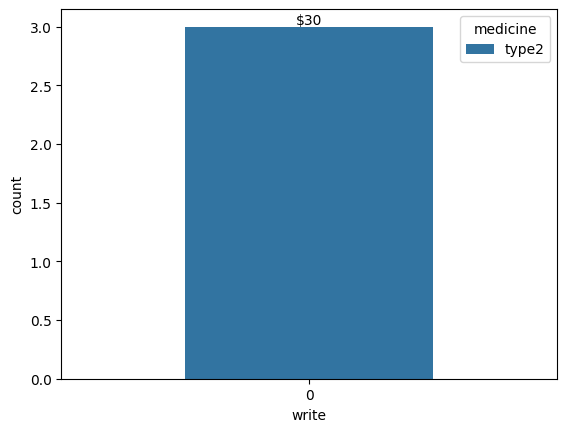

In [641]:
ax = sns.countplot(data = a_vas_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_vas_1['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

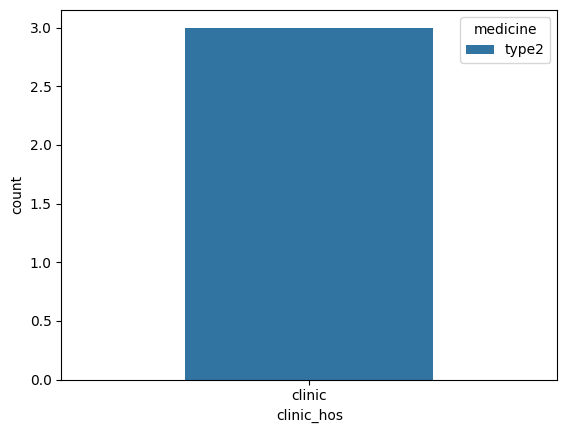

In [642]:
sns.countplot(data = a_vas_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

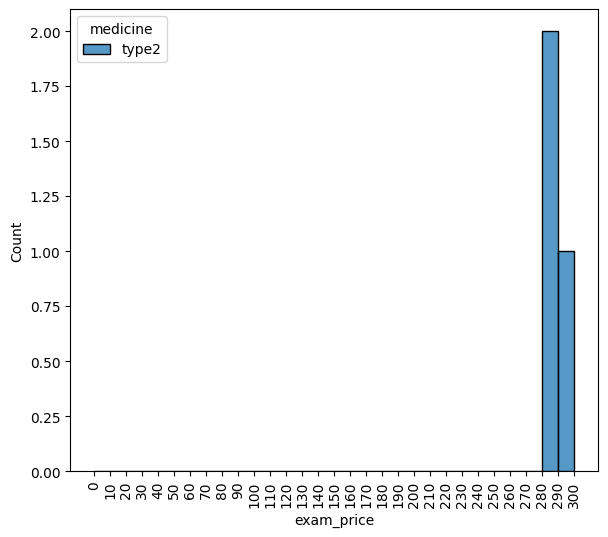

In [643]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_vas_1["exam_price"].max() + 10 , 10)

sns.histplot(data = a_vas_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , vas speciality and Area 1 Doctors 

In [644]:
b_vas_1 = data[(data["speciality"] == "vas") & (data["dr_class"] == "b") & (data["area"] == "area1")]

In [645]:
b_vas_1["medicine"].value_counts()

medicine
type2    3
Name: count, dtype: int64

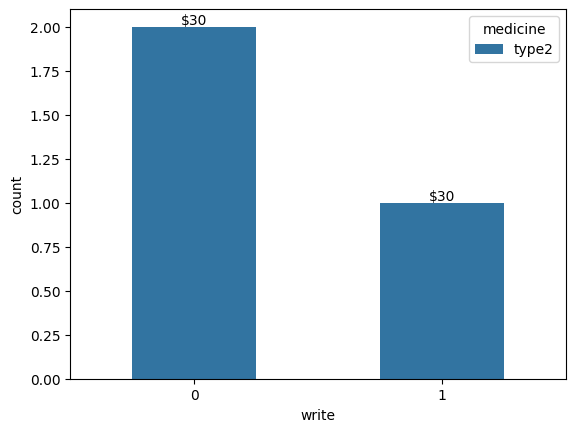

In [646]:
ax = sns.countplot(data = b_vas_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_vas_1['medicine'].unique()



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

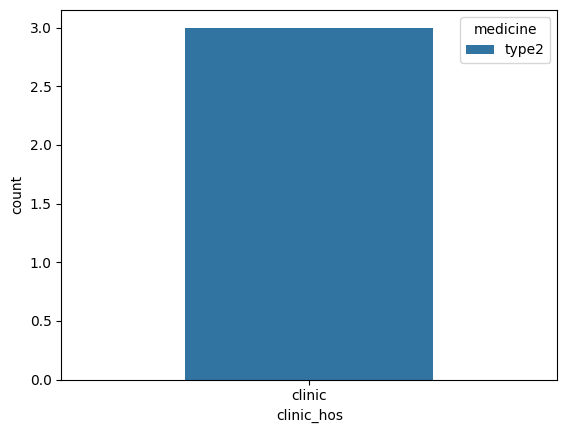

In [647]:
sns.countplot(data = b_vas_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

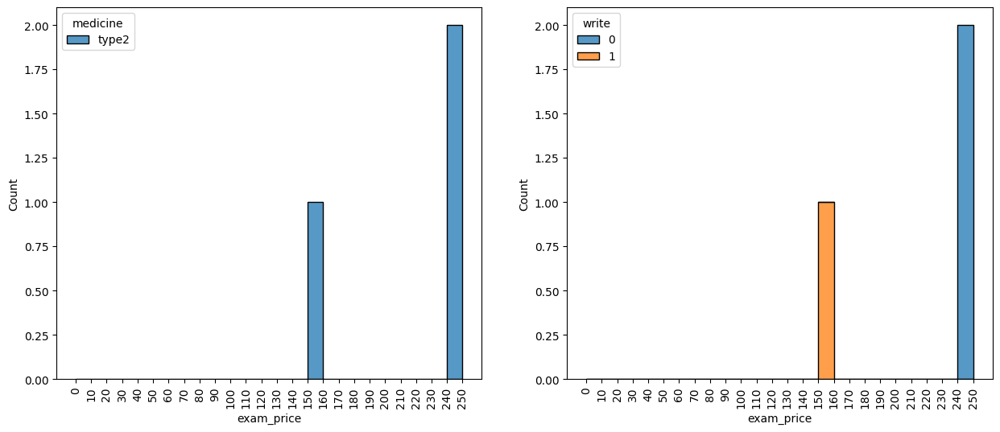

In [648]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_vas_1["exam_price"].max() + 10 , 10)

sns.histplot(data = b_vas_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);



plt.subplot(1 ,2 , 2)

bins = np.arange(0 , b_vas_1["exam_price"].max() + 10 , 10)

sns.histplot(data = b_vas_1 , x="exam_price", bins=bins, hue="write", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 1

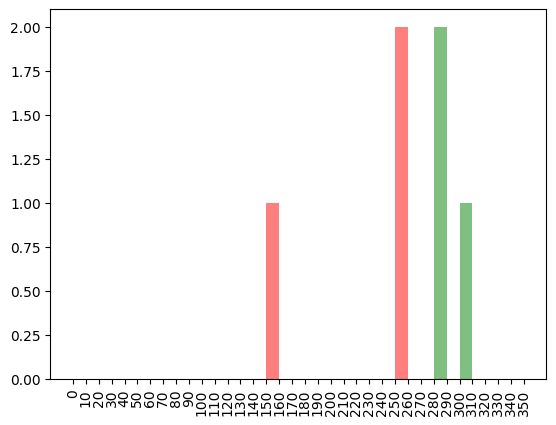

In [649]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_vas_1 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_vas_1 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Class a , vas speciality and Area 8 Doctors 

In [650]:
a_vas_8 = data[(data["speciality"] == "vas") & (data["dr_class"] == "a") & (data["area"] == "area8")]

In [651]:
a_vas_8["medicine"].value_counts()

medicine
type2    1
Name: count, dtype: int64

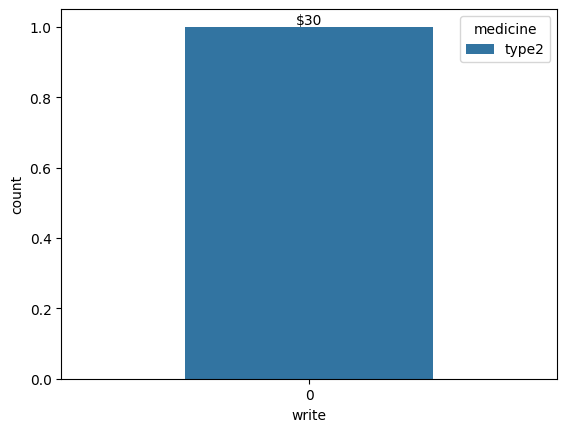

In [652]:
ax = sns.countplot(data = a_vas_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_vas_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

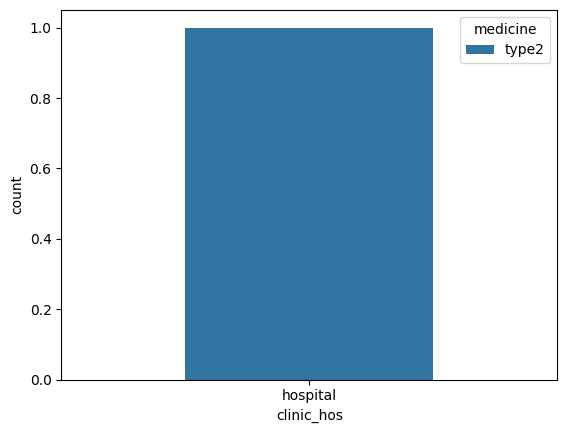

In [653]:
sns.countplot(data = a_vas_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

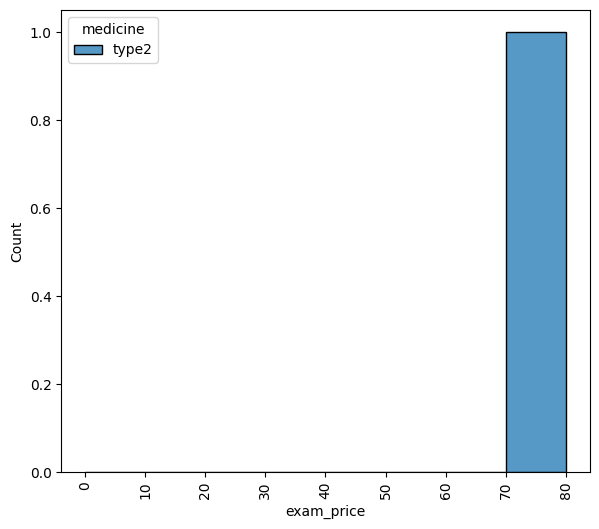

In [654]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_vas_8["exam_price"].max() + 10 , 10)

sns.histplot(data = a_vas_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , vas speciality and Area 8 Doctors 

In [655]:
b_vas_8 = data[(data["speciality"] == "vas") & (data["dr_class"] == "b") & (data["area"] == "area8")]

In [656]:
b_vas_8["medicine"].value_counts()

medicine
type2    1
Name: count, dtype: int64

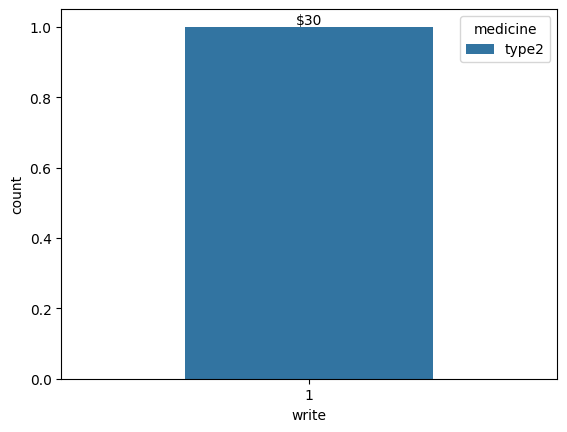

In [657]:
ax = sns.countplot(data = b_vas_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_vas_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

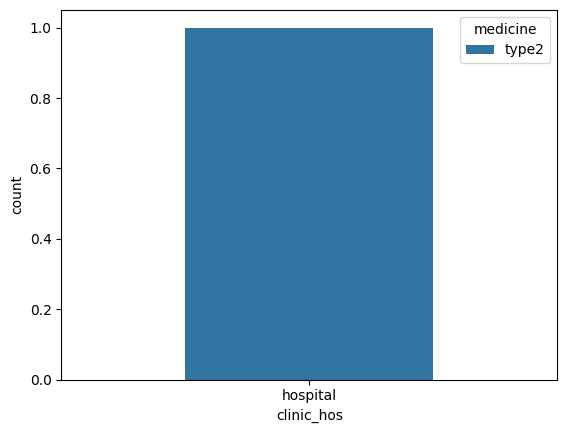

In [658]:
sns.countplot(data = b_vas_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

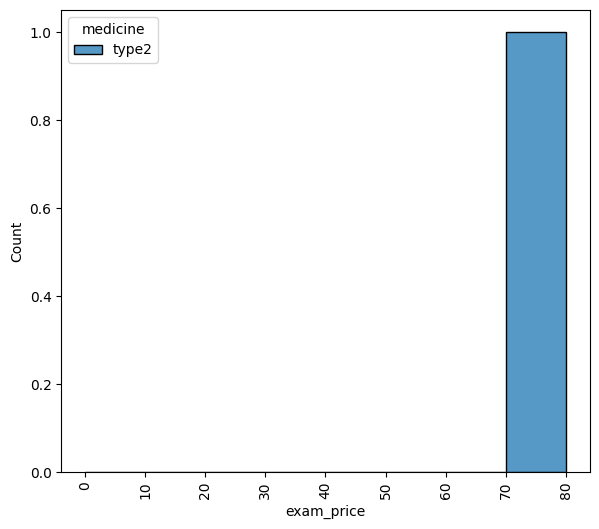

In [659]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_vas_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_vas_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 8

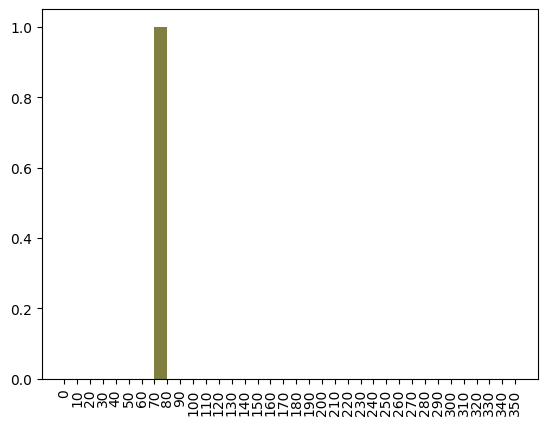

In [660]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_vas_8 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_vas_8 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Summary For vas Doctors Analysis

#### 100% vas dcotors in Class a did not write 

In [661]:
vas_a = data[(data["speciality"] == "vas") & (data["dr_class"] == "a")]

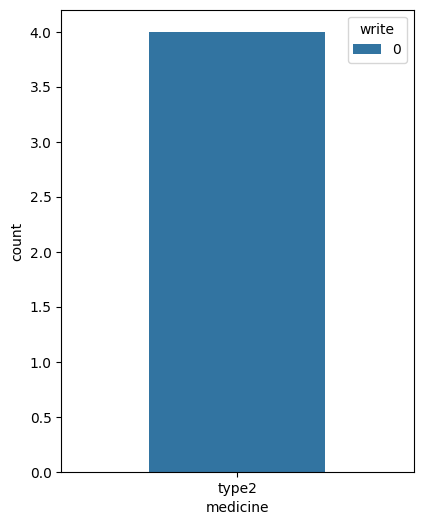

In [662]:
plt.figure(figsize = [10 , 6])



order = vas_a["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = vas_a , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);

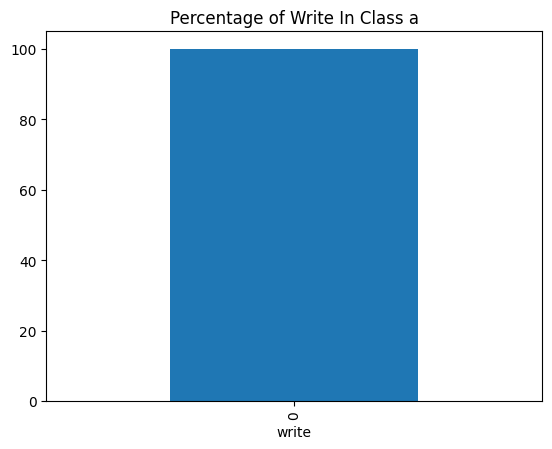

In [663]:
write_per = vas_a["write"].value_counts().sort_values(ascending = False) / vas_a.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class a");

#### 50% ent dcotors in Class b write 

#### They write Type 2

In [664]:
vas_b = data[(data["speciality"] == "vas") & (data["dr_class"] == "b")]

vas_b_1 = data[(data["speciality"] == "vas") & (data["dr_class"] == "b") & (data["write"] == 1)]

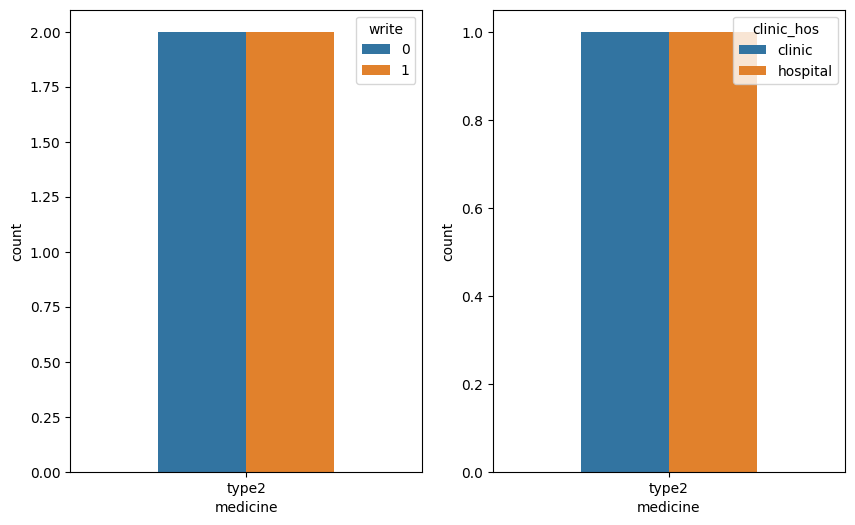

In [665]:
plt.figure(figsize = [10 , 6])



order = vas_b["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = vas_b , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = vas_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

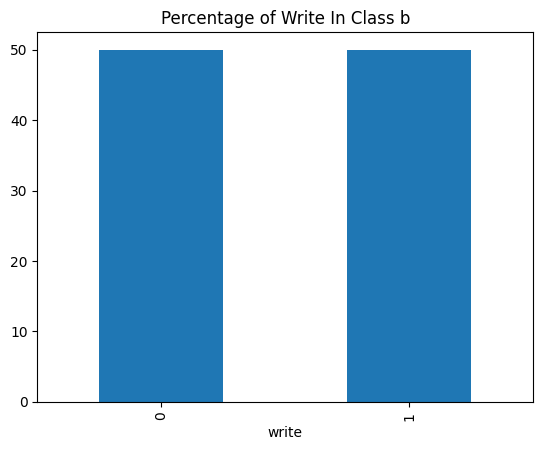

In [666]:
write_per = vas_b["write"].value_counts().sort_values(ascending = False) / vas_b.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class b");

In [667]:
vas_1 = data[(data["speciality"] == "vas") & (data["write"] == 1)]

In [668]:
import plotly.express as px

fig = px.scatter(vas_1 , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

In [669]:
import plotly.express as px

fig = px.scatter(vas_1 , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [670]:
fig= px.histogram(vas_1 , x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of im Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### Just Two Areas

In [671]:
fig= px.histogram(vas_1, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Im Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

#  neuro Doctors

### Class b , neuro speciality and Area 1 Doctors 

In [672]:
b_neuro_1 = data[(data["speciality"] == "neuro") & (data["dr_class"] == "b") & (data["area"] == "area1")]

In [673]:
b_neuro_1["medicine"].value_counts()

medicine
type2    1
type3    1
Name: count, dtype: int64

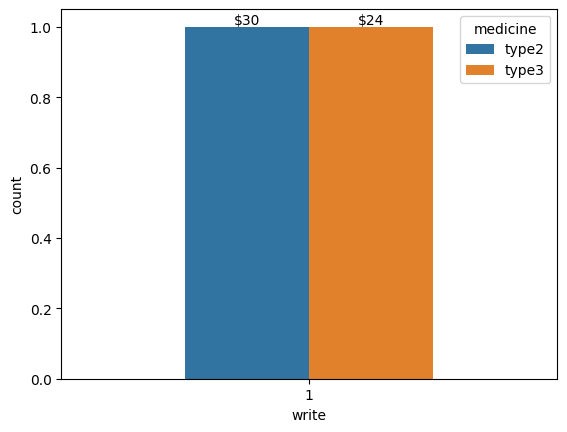

In [674]:
ax = sns.countplot(data = b_neuro_1 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = b_neuro_1['medicine'].unique()



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = hue_categories[i % len(hue_categories)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

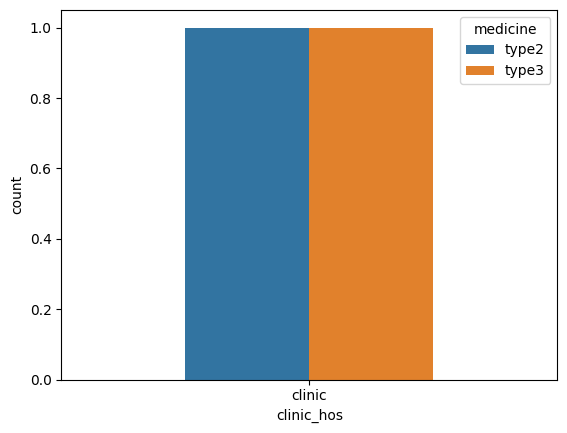

In [675]:
sns.countplot(data = b_neuro_1 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

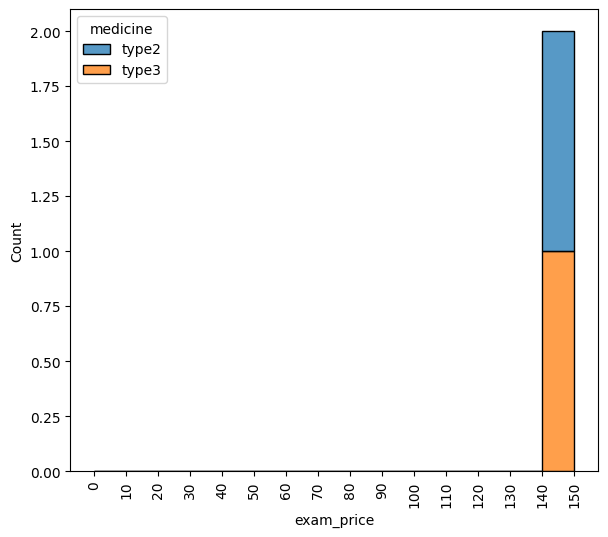

In [676]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_neuro_1["exam_price"].max() + 10 , 10)

sns.histplot(data = b_neuro_1 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , neuro speciality and Area 2 Doctors 

In [677]:
a_neuro_2 = data[(data["speciality"] == "neuro") & (data["dr_class"] == "a") & (data["area"] == "area2")]

In [678]:
a_neuro_2["medicine"].value_counts()

medicine
type2    2
Name: count, dtype: int64

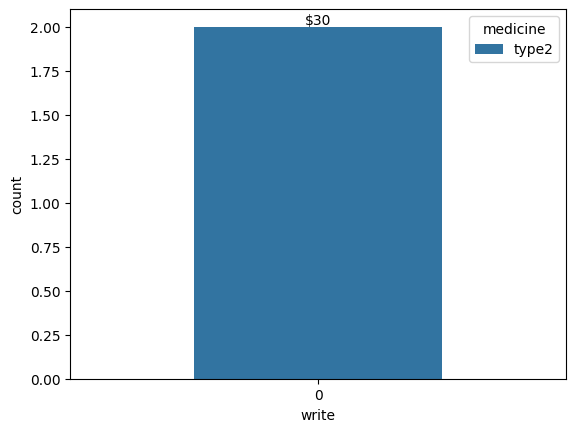

In [679]:
ax = sns.countplot(data = a_neuro_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_neuro_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

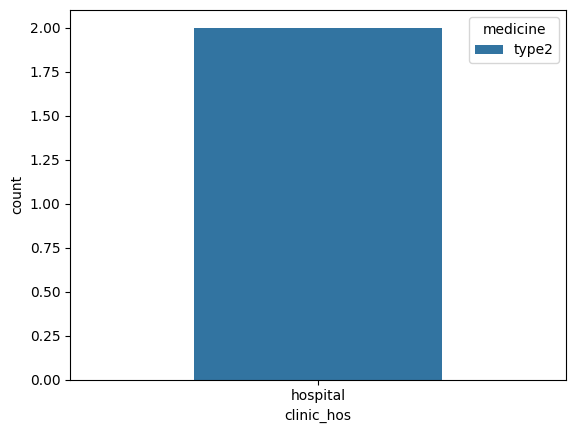

In [680]:
sns.countplot(data = a_neuro_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

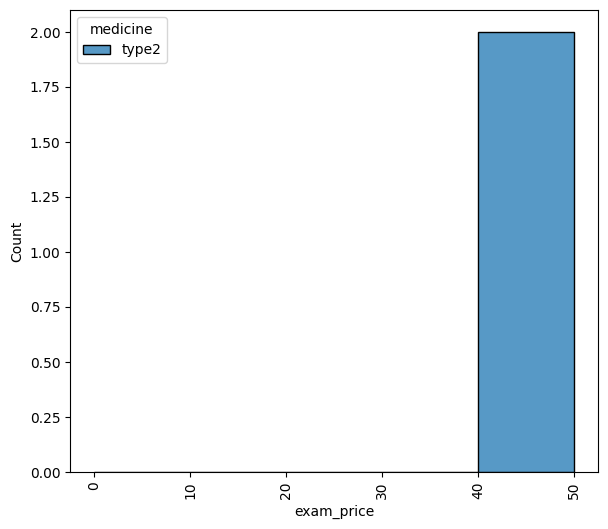

In [681]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_neuro_2["exam_price"].max() + 10 , 10)

sns.histplot(data = a_neuro_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , neuro speciality and Area 2 Doctors 

In [682]:
b_neuro_2 = data[(data["speciality"] == "neuro") & (data["dr_class"] == "b") & (data["area"] == "area2")]

In [683]:
b_neuro_2["medicine"].value_counts()

medicine
type2    1
Name: count, dtype: int64

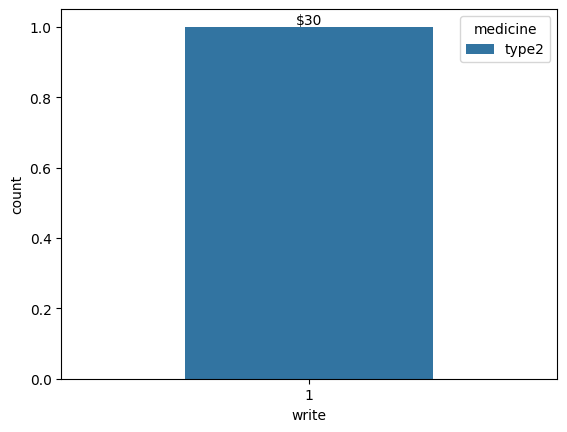

In [684]:
ax = sns.countplot(data = b_neuro_2 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_neuro_2['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

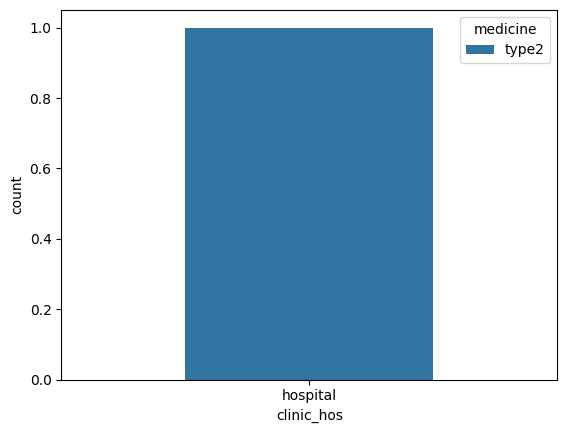

In [685]:
sns.countplot(data = b_neuro_2 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

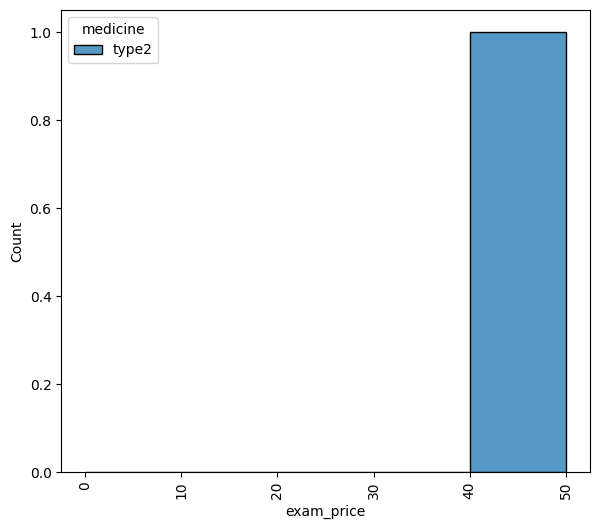

In [686]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_neuro_2["exam_price"].max() + 10 , 10)

sns.histplot(data = b_neuro_2 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class a , neuro speciality and Area 8 Doctors 

In [687]:
a_neuro_8 = data[(data["speciality"] == "neuro") & (data["dr_class"] == "a") & (data["area"] == "area8")]

In [688]:
a_neuro_8["medicine"].value_counts()

medicine
type2    1
Name: count, dtype: int64

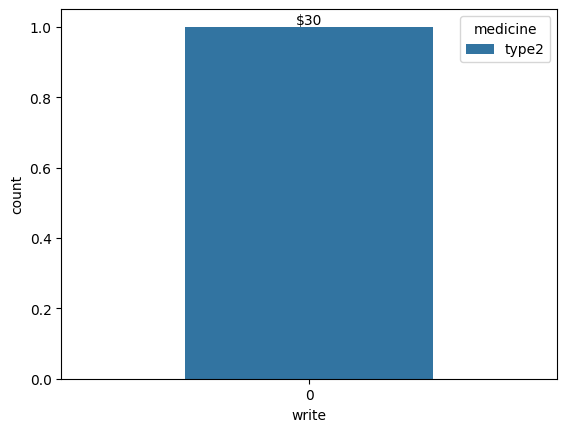

In [689]:
ax = sns.countplot(data = a_neuro_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(a_neuro_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

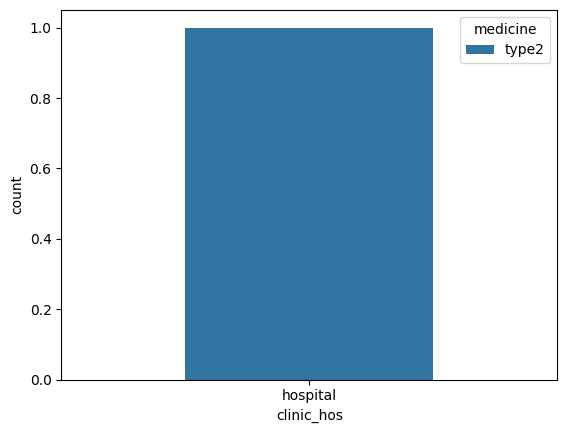

In [690]:
sns.countplot(data = a_neuro_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

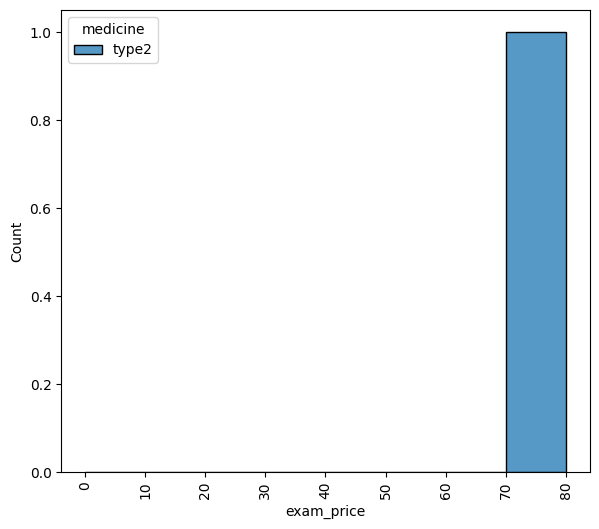

In [691]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , a_neuro_8["exam_price"].max() + 10 , 10)

sns.histplot(data = a_neuro_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

### Class b , neuro speciality and Area 8 Doctors 

In [692]:
b_neuro_8 = data[(data["speciality"] == "neuro") & (data["dr_class"] == "b") & (data["area"] == "area8")]

In [693]:
b_neuro_8["medicine"].value_counts()

medicine
type2    1
Name: count, dtype: int64

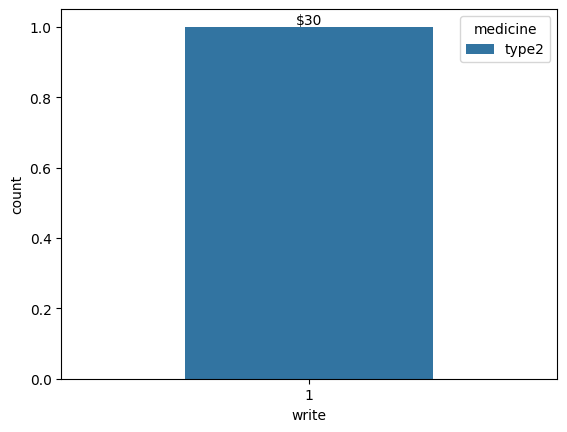

In [694]:
ax = sns.countplot(data = b_neuro_8 , x = "write" , hue = "medicine" , width=0.5, dodge=True)



hue_categories = list(b_neuro_8['medicine'].unique())  

lis = []



for i in range(len(hue_categories)):

    lis.append(hue_categories[i])  

    lis.append(hue_categories[i]) 



for i, p in enumerate(ax.patches):

    x = p.get_x() + p.get_width() / 2

    y = p.get_height()

    

    hue_category = lis[i % len(lis)]

    price = dic.get(hue_category, "N/A")

    ax.text(x, y, f'${price}', ha="center", va="bottom", fontsize=10, color="black")



plt.show();

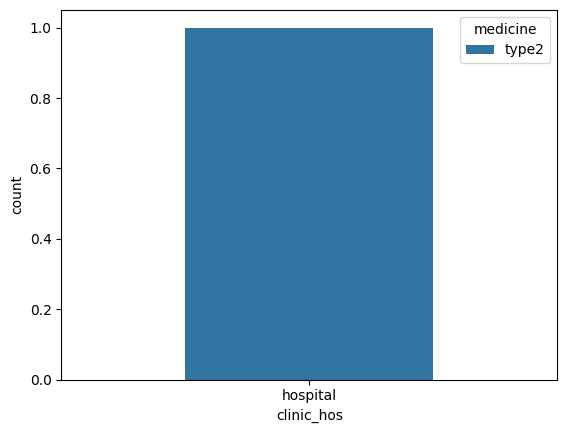

In [695]:
sns.countplot(data = b_neuro_8 , x = "clinic_hos" , hue = "medicine" , width=0.5, dodge=True);

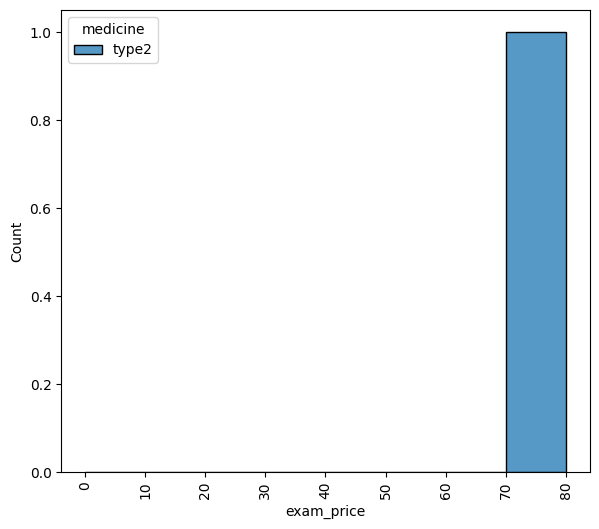

In [696]:
plt.figure(figsize = [15 , 6])



plt.subplot(1 ,2 , 1)

bins = np.arange(0 , b_neuro_8["exam_price"].max() + 10 , 10)

sns.histplot(data = b_neuro_8 , x="exam_price", bins=bins, hue="medicine", multiple="stack")

plt.xticks(bins , rotation = 90);

#### Compare Between Class a And b In Examination Price In Area 8

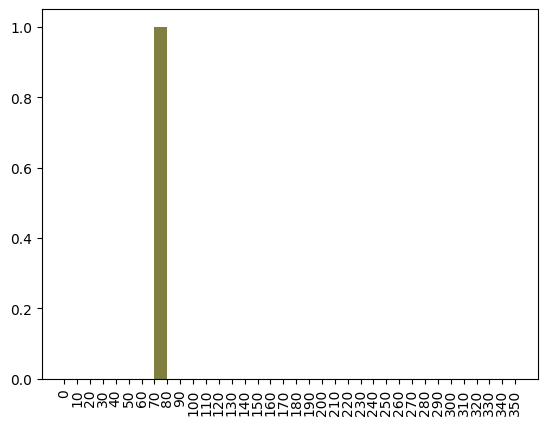

In [697]:
bins = np.arange(0 , data["exam_price"].max() + 10 , 10)

plt.hist(data = b_neuro_8 , x = "exam_price" , bins = bins , color = "red" ,  alpha = 0.5)

plt.hist(data = a_neuro_8 , x = "exam_price" , bins = bins , color = "green" , alpha = 0.5)

plt.xticks(bins , rotation = 90);

### Summary For neuro Doctors Analysis

#### 100% neuro dcotors in Class a did not write 

In [698]:
neuro_a = data[(data["speciality"] == "neuro") & (data["dr_class"] == "a")]

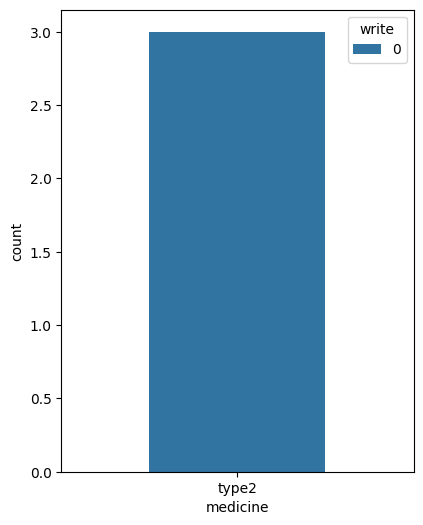

In [699]:
plt.figure(figsize = [10 , 6])



order = neuro_a["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = neuro_a , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);

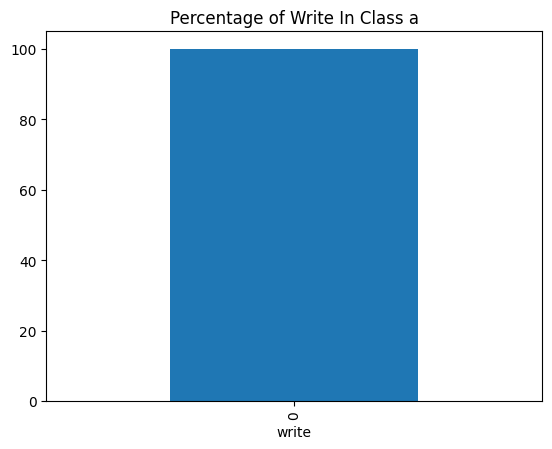

In [700]:
write_per = neuro_a["write"].value_counts().sort_values(ascending = False) / neuro_a.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class a");

#### 100% neuro dcotors in Class b write 

#### They write Type 2 and 3

#### type 3 in clinics and 2 most in hospitals

In [701]:
neuro_b = data[(data["speciality"] == "neuro") & (data["dr_class"] == "b")]

neuro_b_1 = data[(data["speciality"] == "neuro") & (data["dr_class"] == "b") & (data["write"] == 1)]

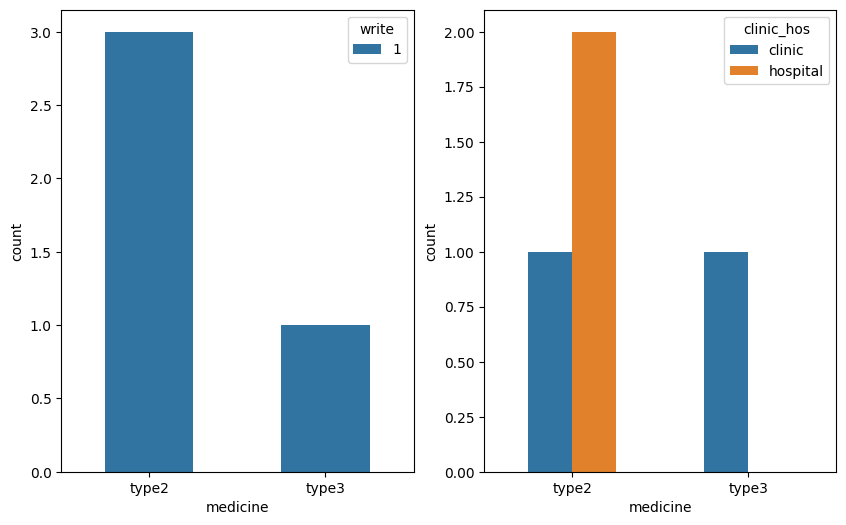

In [702]:
plt.figure(figsize = [10 , 6])



order = neuro_b["medicine"].value_counts().sort_values(ascending = False).index



plt.subplot(1 , 2 , 1)

sns.countplot(data = neuro_b , x = "medicine" , hue = "write" , width=0.5, dodge=True , order = order);



plt.subplot(1 , 2 , 2)

sns.countplot(data = neuro_b_1 , x = "medicine" , hue = "clinic_hos" , width=0.5, dodge=True , order = order);

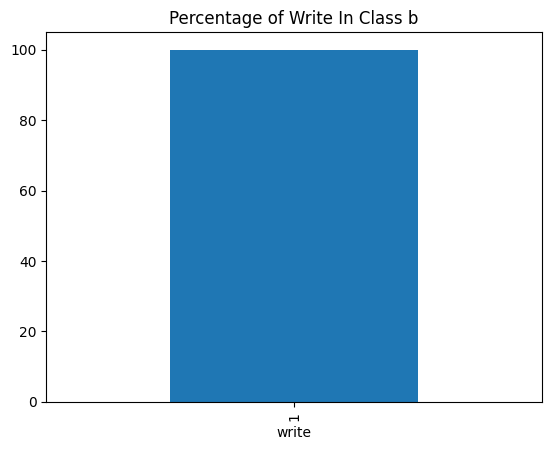

In [703]:
write_per = neuro_b["write"].value_counts().sort_values(ascending = False) / neuro_b.shape[0] * 100

write_per.plot(kind = "bar")

plt.title("Percentage of Write In Class b");

In [704]:
neuro_1 = data[(data["speciality"] == "neuro") & (data["write"] == 1)]

In [705]:
import plotly.express as px

fig = px.scatter(neuro_1 , x='exam_price', y='medicine', color='dr_class')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine (colored by Doctor Class)')

fig.show();

In [706]:
import plotly.express as px

fig = px.scatter(neuro_1 , x='exam_price', y='medicine', color='area')

fig.update_layout(width=1000, height=500)

fig.update_layout(title_text='Scatter Plot of Examination Price vs. Medicine Price (colored by Area)')

fig.show();

In [707]:
fig= px.histogram(neuro_1 , x='exam_price',height=500,width=900,template='simple_white',

color='clinic_hos', # adding categorical column

color_discrete_sequence=['purple','pink'])

fig.update_layout(title={'text':'Histogram of im Doctors by Clinc Or Hospital','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

### Most in Area 1

In [708]:
fig= px.histogram(neuro_1, x='exam_price',height=500,width=900,template='simple_white',

color='area')

fig.update_layout(title={'text':'Histogram of Im Doctors by Area','font':{'size':25}}

,title_font_family="Times New Roman",

title_font_color="darkgrey",

title_x=0.2)

fig.update_layout(

font_family='classic-roman',

font_color= 'grey',

yaxis_title={'text': " count", 'font': {'size':18}},

xaxis_title={'text': " Examination Price", 'font': {'size':18}}

) 

fig.show()

# Prepare Data For ML

In [709]:
data.head()

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
0,type1,45,area1,chest,a,200,clinic,1
1,type4,36,area2,im,b,100,clinic,1
2,type1,45,area8,chest,a,75,hospital,1
3,type1,45,area5,chest,a,30,hospital,1
4,type5,29,area6,uro,a,220,clinic,0


## Skweed Data

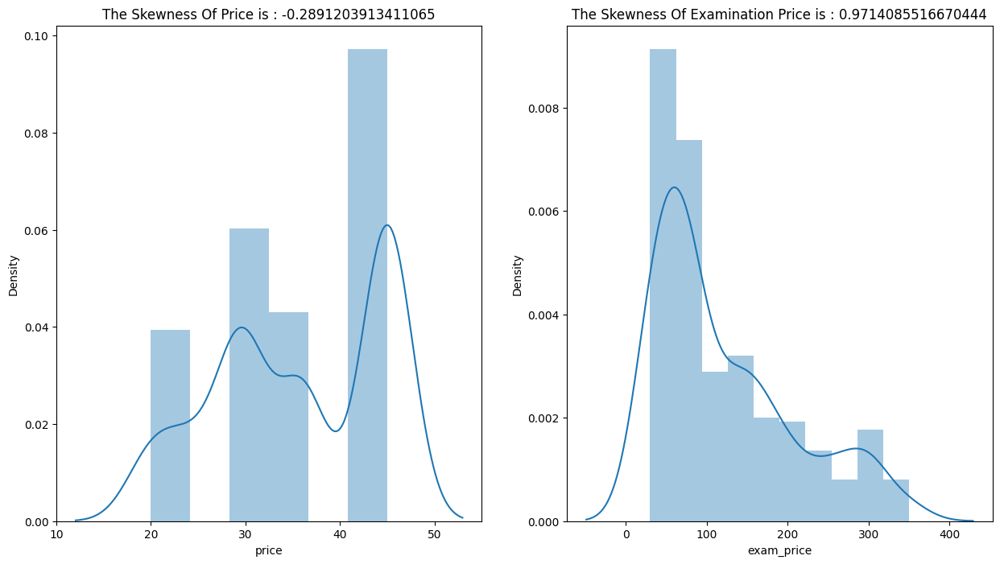

In [710]:
plt.figure(figsize = [15 , 8])



plt.subplot(1 , 2 , 1)

sns.distplot(data["price"])

skewness = data["price"].skew()

plt.title("The Skewness Of Price is : " + str(skewness));



plt.subplot(1 , 2 , 2)

sns.distplot(data["exam_price"])

skewness = data["exam_price"].skew()

plt.title("The Skewness Of Examination Price is : " + str(skewness));

In [711]:
data["exam_price"] = np.log1p(data["exam_price"])

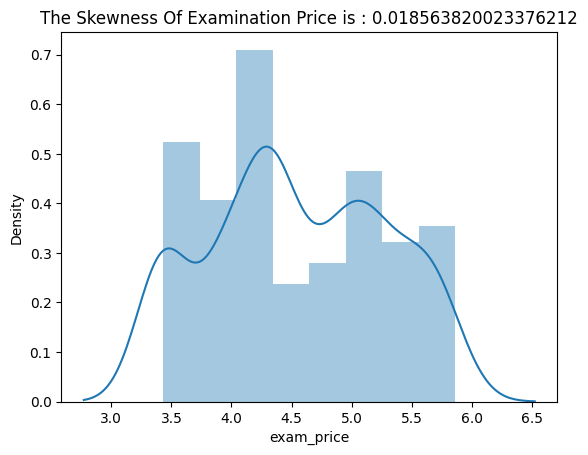

In [712]:
sns.distplot(data["exam_price"])

skewness = data["exam_price"].skew()

plt.title("The Skewness Of Examination Price is : " + str(skewness));

## Label Encoding In Binary Categorical Columns

In [713]:
from sklearn.preprocessing import LabelEncoder



encoder = LabelEncoder()



data["dr_class"] = encoder.fit_transform(data["dr_class"])

data["clinic_hos"] = encoder.fit_transform(data["clinic_hos"])

In [714]:
data.head()

,medicine,price,area,speciality,dr_class,exam_price,clinic_hos,write
0,type1,45,area1,chest,0,5.303305,0,1
1,type4,36,area2,im,1,4.615121,0,1
2,type1,45,area8,chest,0,4.330733,1,1
3,type1,45,area5,chest,0,3.433987,1,1
4,type5,29,area6,uro,0,5.398163,0,0


## One-Hot Encoding in Multi Categorical Columns

In [715]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 390 entries, 0 to 389
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   medicine    390 non-null    object 
 1   price       390 non-null    int64  
 2   area        390 non-null    object 
 3   speciality  390 non-null    object 
 4   dr_class    390 non-null    int64  
 5   exam_price  390 non-null    float64
 6   clinic_hos  390 non-null    int64  
 7   write       390 non-null    int64  
dtypes: float64(1), int64(4), object(3)
memory usage: 24.5+ KB


In [716]:
numeric_col = data.select_dtypes(include = ["int32" , "int64" , "float64"])

numeric_col

,price,dr_class,exam_price,clinic_hos,write
0,45,0,5.303305,0,1
1,36,1,4.615121,0,1
2,45,0,4.330733,1,1
3,45,0,3.433987,1,1
4,29,0,5.398163,0,0
...,...,...,...,...,...
385,29,1,4.330733,1,0
386,30,1,4.262680,1,0
387,45,0,4.795791,0,1
388,45,1,4.330733,1,1


In [717]:
object_col = data.select_dtypes(include = ["object"])

object_col

,medicine,area,speciality
0,type1,area1,chest
1,type4,area2,im
2,type1,area8,chest
3,type1,area5,chest
4,type5,area6,uro
...,...,...,...
385,type5,area8,sur
386,type2,area2,im
387,type1,area7,im
388,type1,area8,sur


In [718]:
from sklearn.preprocessing import OneHotEncoder



h_encoder = OneHotEncoder(sparse = False , handle_unknown = "ignore")



features_cat = h_encoder.fit_transform(data[object_col.columns])

features_cat

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [719]:
h_encoder.get_feature_names_out(object_col.columns)

array(['medicine_type1', 'medicine_type2', 'medicine_type3',
       'medicine_type4', 'medicine_type5', 'medicine_type6', 'area_area1',
       'area_area2', 'area_area3', 'area_area4', 'area_area5',
       'area_area6', 'area_area7', 'area_area8', 'speciality_cd',
       'speciality_chest', 'speciality_ent', 'speciality_git',
       'speciality_gp', 'speciality_im', 'speciality_neuro',
       'speciality_or', 'speciality_sur', 'speciality_uro',
       'speciality_vas'], dtype=object)

In [720]:
encoded_df = pd.DataFrame(features_cat , columns = h_encoder.get_feature_names_out(object_col.columns) , index = data.index)

encoded_df

,medicine_type1,medicine_type2,medicine_type3,medicine_type4,medicine_type5,medicine_type6,area_area1,area_area2,area_area3,area_area4,...,speciality_chest,speciality_ent,speciality_git,speciality_gp,speciality_im,speciality_neuro,speciality_or,speciality_sur,speciality_uro,speciality_vas
0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
386,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
387,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
388,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [721]:
data_proccesed = pd.concat([numeric_col , encoded_df] , axis = 1)

data_proccesed.head()

,price,dr_class,exam_price,clinic_hos,write,medicine_type1,medicine_type2,medicine_type3,medicine_type4,medicine_type5,...,speciality_chest,speciality_ent,speciality_git,speciality_gp,speciality_im,speciality_neuro,speciality_or,speciality_sur,speciality_uro,speciality_vas
0,45,0,5.303305,0,1,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,36,1,4.615121,0,1,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,45,0,4.330733,1,1,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,45,0,3.433987,1,1,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,29,0,5.398163,0,0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


## Scailing

In [722]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()



data_proccesed[["price","exam_price"]] = scaler.fit_transform(data_proccesed[["price","exam_price"]])

In [723]:
data_proccesed

,price,dr_class,exam_price,clinic_hos,write,medicine_type1,medicine_type2,medicine_type3,medicine_type4,medicine_type5,...,speciality_chest,speciality_ent,speciality_git,speciality_gp,speciality_im,speciality_neuro,speciality_or,speciality_sur,speciality_uro,speciality_vas
0,1.00,0,0.770281,0,1,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.64,1,0.486704,0,1,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,1.00,0,0.369518,1,1,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.00,0,0.000000,1,1,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.36,0,0.809369,0,0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,0.36,1,0.369518,1,0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
386,0.40,1,0.341476,1,0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
387,1.00,0,0.561152,0,1,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
388,1.00,1,0.369518,1,1,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


## Data Splitting

In [724]:
y = data_proccesed["write"]

X = data_proccesed.drop("write" , axis = 1)



print(y)

print(X.head())

0      1
1      1
2      1
3      1
4      0
      ..
385    0
386    0
387    1
388    1
389    1
Name: write, Length: 390, dtype: int64
   price  dr_class  exam_price  clinic_hos  medicine_type1  medicine_type2  \
0   1.00         0    0.770281           0             1.0             0.0   
1   0.64         1    0.486704           0             0.0             0.0   
2   1.00         0    0.369518           1             1.0             0.0   
3   1.00         0    0.000000           1             1.0             0.0   
4   0.36         0    0.809369           0             0.0             0.0   

   medicine_type3  medicine_type4  medicine_type5  medicine_type6  ...  \
0             0.0             0.0             0.0             0.0  ...   
1             0.0             1.0             0.0             0.0  ...   
2             0.0             0.0             0.0             0.0  ...   
3             0.0             0.0             0.0             0.0  ...   
4             0.0      

In [725]:
from sklearn.model_selection import train_test_split



X_train , X_test , y_train , y_test = train_test_split(X , y , test_size=0.2 , random_state=0)

# Model Selection

## Preformance Metrics

In [726]:
from sklearn.metrics import accuracy_score



def performance_acc(y_true , y_predict):

    score = accuracy_score(y_true , y_predict)

    

    return score

In [727]:
from sklearn.metrics import f1_score



def performance_f1(y_true , y_predict):

    score = f1_score(y_true , y_predict)

    

    return score

## Decision Tree Model

### GridSearch

In [728]:
from sklearn.metrics import make_scorer

from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import ShuffleSplit

from sklearn.tree import DecisionTreeClassifier



def fit_model(X , y):

    clf = DecisionTreeClassifier(random_state=42)



    parameters = {'max_depth':[3,4,5,6,8],'min_samples_leaf':[6,8,10,12,14,16], 'min_samples_split':[2,4,6,8,10,12,14,16]}

    cv_sets=ShuffleSplit(n_splits=5, random_state=42, test_size=0.2, train_size=None)



    scorer = make_scorer(performance_acc)



    grid_obj = GridSearchCV(clf, parameters, scoring=scorer,cv=cv_sets)



    grid_fit = grid_obj.fit(X, y)



    return grid_fit.best_estimator_

In [729]:
classifier = fit_model(X_train , y_train)

In [730]:
print("Parameter 'Max Depth' is {} for the optimal model.".format(classifier.get_params()['max_depth']))

print("Parameter 'Min Samples Leaf' is {} for the optimal model.".format(classifier.get_params()['min_samples_leaf']))

print("Parameter 'Min Samples split' is {} for the optimal model.".format(classifier.get_params()['min_samples_split']))

Parameter 'Max Depth' is 4 for the optimal model.
Parameter 'Min Samples Leaf' is 6 for the optimal model.
Parameter 'Min Samples split' is 2 for the optimal model.


### Model Evaluation

In [731]:
train_pred = classifier.predict(X_train)

test_pred = classifier.predict(X_test)



train_acc = performance_acc(y_train, train_pred)

test_acc = performance_acc(y_test, test_pred)



train_f = performance_f1(y_train, train_pred)

test_f = performance_f1(y_test, test_pred)



print("The Training Accuracy Is : " , train_acc)

print("The Testing Accuracy Is : " , test_acc)



print("The Training f1-score Is : " , train_f)

print("The Testing f1-score Is : " , test_f)

The Training Accuracy Is :  0.7403846153846154
The Testing Accuracy Is :  0.8076923076923077
The Training f1-score Is :  0.7624633431085044
The Testing f1-score Is :  0.8514851485148514


## Adaboost Model

### GridSearch

In [732]:
from sklearn.metrics import make_scorer

from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import ShuffleSplit

from sklearn.ensemble import AdaBoostClassifier



def fit_model(X , y):

    clf = AdaBoostClassifier(random_state=42)



    parameters = {'learning_rate':[0.4],'n_estimators':[85], 'base_estimator':[DecisionTreeClassifier(random_state=42)],'base_estimator__max_depth':[4],'base_estimator__min_samples_leaf':[14],'base_estimator__min_samples_split':[8]}

    cv_sets=ShuffleSplit(n_splits=5, random_state=42, test_size=0.2, train_size=None)



    scorer = make_scorer(performance_acc)



    grid_obj = GridSearchCV(clf, parameters, scoring=scorer,cv=cv_sets)



    grid_fit = grid_obj.fit(X, y)



    return grid_fit.best_estimator_

In [733]:
classifier = fit_model(X_train , y_train)

In [734]:
print("Parameter 'n_estimators' is {} for the optimal model.".format(classifier.get_params()['n_estimators']))

print("Parameter 'learning_rate' is {} for the optimal model.".format(classifier.get_params()['learning_rate']))



print("Parameter 'Max Depth' of the base Decision Tree is {}.".format(classifier.get_params()['base_estimator__max_depth']))

print("Parameter 'Min Samples Leaf' of the base Decision Tree is {}.".format(classifier.get_params()['base_estimator__min_samples_leaf']))

print("Parameter 'Min Samples Split' of the base Decision Tree is {}.".format(classifier.get_params()['base_estimator__min_samples_split']))

Parameter 'n_estimators' is 85 for the optimal model.
Parameter 'learning_rate' is 0.4 for the optimal model.
Parameter 'Max Depth' of the base Decision Tree is 4.
Parameter 'Min Samples Leaf' of the base Decision Tree is 14.
Parameter 'Min Samples Split' of the base Decision Tree is 8.


### Model Evaluation

In [735]:
train_pred = classifier.predict(X_train)

test_pred = classifier.predict(X_test)



train_acc = performance_acc(y_train, train_pred)

test_acc = performance_acc(y_test, test_pred)



train_f = performance_f1(y_train, train_pred)

test_f = performance_f1(y_test, test_pred)



print("The Training Accuracy Is : " , train_acc)

print("The Testing Accuracy Is : " , test_acc)



print("The Training f1-score Is : " , train_f)

print("The Testing f1-score Is : " , test_f)

The Training Accuracy Is :  0.8557692307692307
The Testing Accuracy Is :  0.8461538461538461
The Training f1-score Is :  0.8732394366197184
The Testing f1-score Is :  0.8823529411764707


## SVM Model

### GridSearch

In [736]:
from sklearn.metrics import make_scorer

from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import ShuffleSplit

from sklearn.svm import SVC



def fit_model(X , y):

    clf = SVC(random_state=42)



    parameters = {'C':[2.2],'kernel':['poly'], 'degree':[3]}

    cv_sets=ShuffleSplit(n_splits=5, random_state=42, test_size=0.2, train_size=None)



    scorer = make_scorer(performance_acc)



    grid_obj = GridSearchCV(clf, parameters, scoring=scorer,cv=cv_sets)



    grid_fit = grid_obj.fit(X, y)



    return grid_fit.best_estimator_

In [737]:
classifier = fit_model(X_train , y_train)

In [738]:
print("Parameter 'Kernel' is {} for the optimal model.".format(classifier.get_params()['kernel']))

print("Parameter 'Degree' is {} for the optimal model.".format(classifier.get_params()['degree']))

print("Parameter 'C' is {} for the optimal model.".format(classifier.get_params()['C']))

Parameter 'Kernel' is poly for the optimal model.
Parameter 'Degree' is 3 for the optimal model.
Parameter 'C' is 2.2 for the optimal model.


### Model Evaluation

In [739]:
train_pred = classifier.predict(X_train)

test_pred = classifier.predict(X_test)



train_acc = performance_acc(y_train, train_pred)

test_acc = performance_acc(y_test, test_pred)



train_f = performance_f1(y_train, train_pred)

test_f = performance_f1(y_test, test_pred)



print("The Training Accuracy Is : " , train_acc)

print("The Testing Accuracy Is : " , test_acc)



print("The Training f1-score Is : " , train_f)

print("The Testing f1-score Is : " , test_f)

The Training Accuracy Is :  0.8141025641025641
The Testing Accuracy Is :  0.8076923076923077
The Training f1-score Is :  0.8370786516853933
The Testing f1-score Is :  0.8514851485148514
